In [1]:
import sys
sys.executable

'C:\\Users\\Wilda\\Anaconda3\\envs\\ta\\python.exe'

In [2]:
import os
from nltk import word_tokenize 
from nltk.util import ngrams
import nltk, re, string, collections
from operator import itemgetter

import networkx as nx
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

In [4]:
import psycopg2

In [5]:
hostname = 'localhost'
username = 'postgres'
password = 'wilda'
database = 'db_ta'

conn = psycopg2.connect( host=hostname, user=username, password=password, dbname=database )

In [6]:
cursor = conn.cursor()

In [7]:
def remove_stopwords(s):
    hasil_replace = s.replace("'", '').replace(",",'').replace('''"''', '').replace('.', '').replace('(', '').replace(')', '').replace(':', '').replace('?', '').replace('`', '').replace(';', '').replace('/', '')
    f = open('stopwordbahasa.csv', 'r')

    stopwords = []
    for lines in f:
        lines = lines.strip('\n')
        stopwords.append(lines)


    corpus_stopwrods = hasil_replace.split(' ')
    hasil_stopword = []

    for x in corpus_stopwrods:
        if x not in stopwords:
            hasil_stopword.append(x)


        
    hasil = " ".join(hasil_stopword)
    hasil = hasil.replace('\n', '')


    
    
    return(hasil)
    

In [12]:
hexx = "pelaksana"
factory = StemmerFactory()
stemmer = factory.create_stemmer()
output   = stemmer.stem(hexx)
print(output)

laksana


In [13]:
def get_stemming(s):
    # create stemmer
    factory = StemmerFactory()
    stemmer = factory.create_stemmer()
    output   = stemmer.stem(s)
    
    return output


In [14]:
def get_bigrams(bigram):
    hasil_bigram = []

    corpus_bigram = [bigram]

    for b in corpus_bigram:
        my_token = nltk.word_tokenize(b)
        my_bigram = list(nltk.bigrams(my_token))
        hasil_bigram = hasil_bigram + my_bigram

    return(hasil_bigram)

In [15]:
def get_degree(g):
    G = nx.Graph()
    G.add_edges_from(g)
    degree_1 = dict(G.degree(G.nodes()))
    
    sorted_degree_1 =sorted(degree_1.items(),
                    key=itemgetter(1),
                    reverse=True)
    
    
    return(sorted_degree_1)

In [16]:
def get_betweenness(g):
    G = nx.Graph()
    G.add_edges_from(g)
    betweenness_dict1 = nx.betweenness_centrality(G)
    
    sorted_betweenness1 = sorted(betweenness_dict1.items(),
                           key = itemgetter(1),
                           reverse=True)
    
    return(sorted_betweenness1)

In [17]:
def get_closeness(g):
    G = nx.Graph()
    G.add_edges_from(g)
    closeness_dict1 = nx.closeness_centrality(G)
    
    sorted_closeness1 = sorted(closeness_dict1.items(),
                           key = itemgetter(1),
                           reverse=True)
    
    return(sorted_closeness1)

In [24]:
data_file_path = 'tempo'

my_file = []

nama_files = []
degree = []
betweenness = []
closeness = []

for root, dirs, files in os.walk(data_file_path):
    for my_file in files:
        #print(my_file)
        files = my_file.split(".")
        file_name = files[0]
        ctr = 0
        if my_file.endswith('.txt'):
            nama_file = os.path.join(root, my_file)
            data = open(nama_file, 'r')
            # modifikasi sesuai kebutuhan
            x = data.read().lower().replace('\n', ' ')
            #print(file_name, x, "lalala")
            yumi = remove_stopwords(x)
            stems = get_stemming(yumi)
            bigramku = get_bigrams(stems)
            my_graph = get_degree(bigramku)
            my_betweenness = get_betweenness(bigramku)
            my_closeness = get_closeness(bigramku)
            #print(file_name)
            for d in my_graph[:5]:
                #print(file_name)
                #print(d)
                str_tuple = str(d)
                str_hasil =  ''.join(str_tuple) 
                str_split = str_hasil.split("'")
                hasil = str_split[1]
                nama_files.append(file_name)
                degree.append(hasil)
                print(file_name, hasil)
#                 query =  "INSERT INTO centrality (nama_file, degree) VALUES (%s, %s);"
#                 data = (file_name, hasil)
#                 cursor.execute(query, data)
#                 conn.commit()
            for d in my_betweenness[:5]:
                #print(file_name)
                #print(d)
                str_tuple = str(d)
                str_hasil =  ''.join(str_tuple) 
                str_split = str_hasil.split("'")
                hasil = str_split[1]
                betweenness.append(hasil)
            for d in my_closeness[:5]:
                #print(file_name)
                #print(d)
                str_tuple = str(d)
                str_hasil =  ''.join(str_tuple) 
                str_split = str_hasil.split("'")
                hasil = str_split[1]
                closeness.append(hasil)
    

010102-111 usaha
010102-111 indonesia
010102-111 ical
010102-111 tentu
010102-111 pindah
010102-1110 temu
010102-1110 malu
010102-1110 pns
010102-1110 rekomendasi
010102-1110 dialog
010102-1111 senjata
010102-1111 ambon
010102-1111 brimob
010102-1111 pecah
010102-1111 satu
010102-1112 dprd
010102-1112 dewan
010102-1112 bireuen
010102-1112 aceh
010102-1112 proses
010102-1115 indocitra
010102-1115 rp
010102-1115 usaha
010102-1115 miliar
010102-1115 multifinance
010102-1116 dewan
010102-1116 perintah
010102-1116 perda
010102-1116 dki
010102-1116 kotakabupaten
010102-1117 sidang
010102-1117 soewondo
010102-1117 terang
010102-1117 sakit
010102-1117 denny
010102-1118 dpp
010102-1118 pbb
010102-1118 hartono
010102-1118 mardjono
010102-1118 partai
010102-1119 massa
010102-1119 dpr
010102-1119 orba
010102-1119 dukung
010102-1119 gedung
010102-112 buruh
010102-112 mogok
010102-112 umr
010102-112 perintah
010102-112 usaha
010102-1120 bank
010102-1120 blokir
010102-1120 bi
010102-1120 rekening
010

010105-1115 wahid
010105-1115 presiden
010105-1115 megawati
010105-1115 tanggap
010105-1115 hubung
010105-1116 buruh
010105-1116 indonesia
010105-1116 tanggal
010105-1116 mei
010105-1116 internasional
010105-1117 pasu
010105-1117 susilo
010105-1117 aparat
010105-1117 wiropati
010105-1117 pbm
010105-1118 dakwa
010105-1118 hakim
010105-1118 tolak
010105-1118 sidang
010105-1118 putus
010105-1119 rapat
010105-1119 dpp
010105-1119 selesai
010105-1119 megawati
010105-1119 pdi-p
010105-112 presiden
010105-112 dpr
010105-112 langgar
010105-112 wahid
010105-112 memorandum
010105-1120 akbar
010105-1120 presiden
010105-1120 dpr
010105-1120 sila
010105-1120 memorandum
010105-1121 dpr
010105-1121 surat
010105-1121 memorandum
010105-1121 presiden
010105-1121 sri
010105-1122 jaksa
010105-1122 nama
010105-1122 sangka
010105-1122 orang
010105-1122 agung
010105-1127 soeripto
010105-1127 orang
010105-1127 tangkap
010105-1127 polisi
010105-1127 hotel
010105-1128 kaya
010105-1128 kpkpn
010105-1128 umum
010

010108-1130 senjata
010108-1130 polri
010108-1130 milik
010108-1130 izin
010108-1130 tes
010108-1131 kabinet
010108-1131 syafii
010108-1131 presiden
010108-1131 wapres
010108-1131 hamzah
010108-1132 tugas
010108-1132 lp
010108-1132 cipinang
010108-1132 sangka
010108-1132 periksa
010108-1133 baik
010108-1133 dokter
010108-1133 soeharto
010108-1133 ichramsyah
010108-1133 sehat
010108-1134 ledak
010108-1134 lokasi
010108-1134 pusat
010108-1134 keras
010108-1134 atrium
010108-1135 keppres
010108-1135 presiden
010108-1135 laica
010108-1135 tiga
010108-1135 megawati
010108-1136 tawur
010108-1136 tugas
010108-1136 napi
010108-1136 lp
010108-1136 kelompok
010108-1137 polisi
010108-1137 ma
010108-1137 awal
010108-1137 jaga
010108-1137 agung
010108-1138 atrium
010108-1138 senen
010108-1138 korban
010108-1138 ledak
010108-1138 jakarta
010108-1139 wapres
010108-1139 kalimantan
010108-1139 presiden
010108-1139 hamzah
010108-1139 acara
010108-114 jaga
010108-114 adil
010108-114 sidang
010108-114 per

010111-1134 semen
010111-1134 gresik
010111-1134 mercy
010111-1134 orang
010111-1134 kecam
010111-1135 semen
010111-1135 tim
010111-1135 tonasa
010111-1135 pengambilalihan
010111-1135 pt
010111-1136 us
010111-1136 ekspor
010111-1136 juta
010111-1136 turun
010111-1136 persen
010111-1137 ikhdan
010111-1137 padang
010111-1137 usaha
010111-1137 semen
010111-1137 ganggu
010111-1138 sukardi
010111-1138 privatisasi
010111-1138 faktor
010111-1138 aman
010111-1138 proses
010111-1139 bacelius
010111-1139 padang
010111-1139 pengambilalihan
010111-1139 semen
010111-1139 pt
010111-1140 presiden
010111-1140 akbar
010111-1140 kapolri
010111-1140 sidang
010111-1140 dpr
010111-1141 bulog
010111-1141 pansus
010111-1141 wahid
010111-1141 presiden
010111-1141 akbar
010111-1142 mobil
010111-1142 gading
010111-1142 rudy
010111-1142 irwansyah
010111-1142 samakun
010111-1143 lemah
010111-1143 rp
010111-1143 indeks
010111-1143 persen
010111-1143 saham
010111-1144 heroin
010111-1144 merri
010111-1144 tugas
0101

010203-1143 pssi
010203-1143 sekolah
010203-1143 sepakbola
010203-1143 latih
010203-1143 eddi
010203-1144 masjid
010203-1144 politik
010203-1144 temu
010203-1144 tokoh
010203-1144 islam
010203-1145 effendy
010203-1145 gus
010203-1145 presiden
010203-1145 dur
010203-1145 pkb
010203-1146 tanggal
010203-1146 2001
010203-1146 hilal
010203-1146 kiai
010203-1146 moedji
010203-1147 pemda
010203-1147 dinas
010203-1147 jabat
010203-1147 sul-teng
010203-1147 rp
010203-1148 alat
010203-1148 jepang
010203-1148 spectograf
010203-1148 bintang
010203-1148 amat
010203-1149 periksa
010203-1149 tutut
010203-1149 pertamina
010203-1149 pt
010203-1149 napas
010203-115 ntb
010203-115 narkotika
010203-115 guna
010203-115 daerah
010203-115 persen
010203-116 aparat
010203-116 kapolda
010203-116 korban
010203-116 laku
010203-116 tembak
010203-117 ulama
010203-117 fatwa
010203-117 tanggap
010203-117 kalimantan
010203-117 bassra
010203-118 dewan
010203-118 pdi-perjuangan
010203-118 bitung
010203-118 kaligis
01020

010207-1115 jaksa
010207-1115 texmaco
010207-1115 novum
010207-1115 agung
010207-1115 bukti
010207-1116 periksa
010207-1116 hutan
010207-1116 hasrul
010207-1116 wartawan
010207-1116 jaksa
010207-1117 kapolri
010207-1117 didi
010207-1117 polri
010207-1117 bimantoro
010207-1117 chaerudin
010207-1118 panggil
010207-1118 rahardi
010207-1118 jaksa
010207-1118 agung
010207-1118 bulog
010207-1119 presiden
010207-1119 milu
010207-1119 cepat
010207-1119 wahid
010207-1119 senin
010207-112 taksi
010207-112 sedia
010207-112 fajar
010207-112 dana
010207-112 usaha
010207-1120 polisi
010207-1120 polri
010207-1120 kontras
010207-1120 didi
010207-1120 ham
010207-1121 islah
010207-1121 presiden
010207-1121 temu
010207-1121 hasyim
010207-1121 wahid
010207-1122 bppn
010207-1122 putu
010207-1122 bank
010207-1122 rp
010207-1122 blbi
010207-1123 presiden
010207-1123 politik
010207-1123 lemhanas
010207-1123 kursus
010207-1123 daerah
010207-1124 presiden
010207-1124 negara
010207-1124 daerah
010207-1124 rakyat

010210-1130 usaha
010210-1130 fasilitas
010210-1130 gula
010210-1130 impor
010210-1130 bkpm
010210-1131 lp
010210-1131 sweeping
010210-1131 polisi
010210-1131 senjata
010210-1131 komandan
010210-1132 bambang
010210-1132 taufik
010210-1132 telpon
010210-1132 putus
010210-1132 sikap
010210-1133 cipinang
010210-1133 temu
010210-1133 tajam
010210-1133 lp
010210-1133 puluh
010210-1134 yusril
010210-1134 lp
010210-1134 evakuasi
010210-1134 kapasitas
010210-1134 orang
010210-1135 tommy
010210-1135 elza
010210-1135 serah
010210-1135 mas
010210-1135 oktober
010210-1136 orang
010210-1136 cipinang
010210-1136 tampubolon
010210-1136 korban
010210-1136 tewas
010210-1137 agama
010210-1137 ajar
010210-1137 islam
010210-1137 formalistik
010210-1137 kelompok
010210-1138 napi
010210-1138 lp
010210-1138 yusril
010210-1138 senjata
010210-1138 cipinang
010210-1139 mutasi
010210-1139 endriartono
010210-1139 tni
010210-1139 benar
010210-1139 perwira
010210-114 tommy
010210-114 putus
010210-114 tewas
010210-1

010302-1111 kapolri
010302-1111 nu
010302-1111 sabtu
010302-1111 31
010302-1111 jakarta
010302-1112 polisi
010302-1112 ungsi
010302-1112 pontianak
010302-1112 matasan
010302-1112 tembak
010302-112 bom
010302-112 ledak
010302-112 laku
010302-112 polisi
010302-112 ntb
010302-113 pbsi
010302-113 main
010302-113 atlet
010302-113 transfer
010302-113 negara
010302-114 taekwondo
010302-114 emas
010302-114 pelatnas
010302-114 cabang
010302-114 kuat
010302-115 evakuasi
010302-115 malu
010302-115 rusuh
010302-115 hattualang
010302-115 desa
010302-116 presiden
010302-116 ryass
010302-116 marsillam
010302-116 wahid
010302-116 terima
010302-117 angelique
010302-117 febi
010302-117 main
010302-117 set
010302-117 dede
010302-118 presiden
010302-118 hidayat
010302-118 wahid
010302-118 mundur
010302-118 dpr
010303-111 gam
010303-111 aparat
010303-111 kapolres
010303-111 milik
010303-111 aceh
010303-1110 soeharto
010303-1110 tim
010303-1110 periksa
010303-1110 rumah
010303-1110 rscm
010303-1111 pelatnas

010307-1121 ichlasul
010307-1121 orang
010307-1121 cepat
010307-1121 dur
010307-1121 laksana
010307-1122 andi
010307-1122 pkb
010307-1122 bijak
010307-1122 dur
010307-1122 matori
010307-1123 bimantoro
010307-1123 dpr
010307-1123 kapolri
010307-1123 institusi
010307-1123 henti
010307-1124 aksi
010307-1124 serta
010307-1124 mahasiswa
010307-1124 dokter
010307-1124 mona
010307-1125 adi
010307-1125 politik
010307-1125 mpr
010307-1125 si
010307-1125 orang
010307-1126 emiten
010307-1126 bej
010307-1126 daniri
010307-1126 papan
010307-1126 delisting
010307-1127 mogok
010307-1127 kendara
010307-1127 kemudi
010307-1127 bus
010307-1127 usaha
010307-1128 rumah
010307-1128 bakar
010307-1128 warga
010307-1128 api
010307-1128 rt
010307-1129 saham
010307-1129 turun
010307-1129 rp
010307-1129 indeks
010307-1129 hariyajid
010307-113 dpr
010307-113 rapat
010307-113 akbar
010307-113 mpr
010307-113 pimpin
010307-1130 malu
010307-1130 cabut
010307-1130 turun
010307-1130 aman
010307-1130 daerah
010307-1133 

010310-1111 lp
010310-1111 unjung
010310-1111 tugas
010310-1111 situasi
010310-1111 timur
010310-1112 tegal
010310-1112 bus
010310-1112 tewas
010310-1112 lebaksiu
010310-1112 11
010310-1113 bimantoro
010310-1113 jacoeb
010310-1113 sofjan
010310-1113 polri
010310-1113 pol
010310-1114 tahan
010310-1114 anton
010310-1114 cipinang
010310-1114 polda
010310-1114 narapidana
010310-1115 bambang
010310-1115 sidang
010310-1115 bank
010310-1115 bal
010310-1115 tunda
010310-1116 putus
010310-1116 ma
010310-1116 akbar
010310-1116 hukum
010310-1116 agung
010310-1117 narapidana
010310-1117 lp
010310-1117 cipinang
010310-1117 yusril
010310-1117 personel
010310-1118 arif
010310-1118 karyawan
010310-1118 usaha
010310-1118 unjuk
010310-1118 bumn
010310-1119 dagang
010310-1119 psm
010310-1119 kapal
010310-1119 labuh
010310-1119 tumpang
010310-112 rusuh
010310-112 polda
010310-112 pindah
010310-112 orang
010310-112 narapidana
010310-1120 anggota
010310-1120 gedung
010310-1120 rakyat
010310-1120 pt
010310-1

010401-1121 shangri-la
010401-1121 karyawan
010401-1121 dpr
010401-1121 orang
010401-1121 timron
010401-1122 imam
010401-1122 ajinomoto
010401-1122 masyarakat
010401-1122 aman
010401-1122 jawa
010401-1123 listrik
010401-1123 pln
010401-1123 djiteng
010401-1123 usaha
010401-1123 jual
010401-1124 gubernur
010401-1124 ungsi
010401-1124 tim
010401-1124 ambon
010401-1124 ancam
010401-1125 bi
010401-1125 tommy
010401-1125 jaksa
010401-1125 blokir
010401-1125 marzuki
010401-1126 bi
010401-1126 anwar
010401-1126 orang
010401-1126 rupiah
010401-1126 putus
010401-1127 ajinomoto
010401-1127 hasyim
010401-1127 kandung
010401-1127 khawatir
010401-1127 pengaruh
010401-1128 ajinomoto
010401-1128 hasyim
010401-1128 nu
010401-1128 putus
010401-1128 haram
010401-1129 produk
010401-1129 jhonny
010401-1129 proses
010401-1129 bacto-soytone
010401-1129 pom
010401-1130 ajinomoto
010401-1130 dagang
010401-1130 beli
010401-1130 produk
010401-1130 jual
010401-1131 jakarta
010401-1131 harry
010401-1131 sangka
01

010407-1122 poso
010407-1122 aman
010407-1122 ssk
010407-1122 warga
010407-1122 jalur
010407-1123 imf
010407-1123 burhanuddin
010407-1123 bicara
010407-1123 temu
010407-1123 bahas
010407-1124 polri
010407-1124 kapolri
010407-1124 rapat
010407-1124 didi
010407-1124 si
010407-1126 dana
010407-1126 sidang
010407-1126 mpr
010407-1126 turun
010407-1126 amien
010407-1127 si
010407-1127 kapolri
010407-1127 perintah
010407-1127 aman
010407-1127 kapolda
010407-1128 lopa
010407-1128 jaksa
010407-1128 agum
010407-1128 agung
010407-1128 kabinet
010407-1129 supandi
010407-1129 usaha
010407-1129 indomobil
010407-1129 akuisisi
010407-1129 bank
010407-113 lopa
010407-113 riyadh
010407-113 majid
010407-113 keluarga
010407-113 perintah
010407-1130 janji
010407-1130 bimantoro
010407-1130 chaerudin
010407-1130 rabu
010407-1130 kali
010407-1131 kawasan
010407-1131 universitas
010407-1131 sikap
010407-1131 politik
010407-1131 guru
010407-1136 agum
010407-1136 bimantoro
010407-1136 pimpin
010407-1136 polri
0

010410-1118 upc
010410-1118 temu
010410-1118 wb
010410-1118 program
010410-1118 hasil
010410-1119 rahardi
010410-1119 bulog
010410-1119 jagung
010410-1119 cair
010410-1119 dana
010410-112 tommy
010410-112 pk
010410-112 eksekusi
010410-112 temu
010410-112 acara
010410-1120 daerah
010410-1120 rp
010410-1120 dau
010410-1120 dana
010410-1120 triliun
010410-1122 dur
010410-1122 tommy
010410-1122 gus
010410-1122 hakim
010410-1122 lembaga
010410-1123 kuat
010410-1123 indeks
010410-1123 ihsg
010410-1123 saham
010410-1123 poin
010410-1124 batu
010410-1124 lempar
010410-1124 kena
010410-1124 pintu
010410-1124 aparat
010410-1127 suporter
010410-1127 baya
010410-1127 gedung
010410-1127 mobil
010410-1127 orang
010410-1128 pmi
010410-1128 suporter
010410-1128 korban
010410-1128 rawat
010410-1128 salah
010410-1129 mobil
010410-1129 danau
010410-1129 marinir
010410-1129 kijang
010410-1129 diyana
010410-113 jaksa
010410-113 tahan
010410-113 alih
010410-113 nasrullah
010410-113 paul
010410-1130 suporter

010502-1118 demo
010502-1118 tertib
010502-1118 situbondo
010502-1118 massa
010502-1118 potensi
010502-1119 tuntut
010502-1119 dpr
010502-1119 dur
010502-1119 ja-tim
010502-1119 dprd
010502-112 massa
010502-112 situbondo
010502-112 aksi
010502-112 jalan
010502-112 arus
010502-1120 perintah
010502-1120 wimar
010502-1120 reformasi
010502-1120 jalan
010502-1120 gera
010502-1121 apkindo
010502-1121 periksa
010502-1121 jaksa
010502-1121 bentuk
010502-1121 hukum
010502-1122 masyarakat
010502-1122 sujud
010502-1122 dbd
010502-1122 wabah
010502-1122 tangan
010502-1123 golkar
010502-1123 kantor
010502-1123 ja-tim
010502-1123 rusak
010502-1123 insiden
010502-1124 jaksa
010502-1124 soeharto
010502-1124 hukum
010502-1124 tetap
010502-1124 agung
010502-1125 presiden
010502-1125 marsilam
010502-1125 senin
010502-1125 tugas
010502-1125 putus
010502-1126 tumpang
010502-1126 lapor
010502-1126 kapal
010502-1126 celaka
010502-1126 muat
010502-1127 lurah
010502-1127 bentuk
010502-1127 wali
010502-1127 kot

010506-1111 dpr
010506-1111 bimantoro
010506-1111 akbar
010506-1111 temu
010506-1111 nonaktif
010506-1112 ramli
010506-1112 survei
010506-1112 rizal
010506-1112 ekonomi
010506-1112 indonesia
010506-1113 masuk
010506-1113 partai
010506-1113 polsoskam
010506-1113 presiden
010506-1113 susilo
010506-1114 presiden
010506-1114 dekrit
010506-1114 mahfud
010506-1114 copot
010506-1114 konstitusional
010506-1115 gugat
010506-1115 partai
010506-1115 adil
010506-1115 golkar
010506-1115 ma
010506-1116 gugat
010506-1116 golkar
010506-1116 partai
010506-1116 adil
010506-1116 tambun
010506-1117 sidang
010506-1117 saksi
010506-1117 hadir
010506-1117 partai
010506-1117 golkar
010506-1118 kapolri
010506-1118 presiden
010506-1118 akbar
010506-1118 mpr
010506-1118 bimantoro
010506-1119 golkar
010506-1119 unjuk
010506-1119 sidang
010506-1119 ma
010506-1119 jalan
010506-112 polri
010506-112 wakapolri
010506-112 menkopolsoskam
010506-112 bimantoro
010506-112 dua
010506-1120 polri
010506-1120 kapolri
010506-11

010509-1111 revisi
010509-1111 perintah
010509-1111 ryaas
010509-1111 daerah
010509-1111 uu
010509-1112 aceh
010509-1112 pusat
010509-1112 peduli
010509-1112 presiden
010509-1112 sabarno
010509-1113 daerah
010509-1113 evaluasi
010509-1113 tolak
010509-1113 laut
010509-1113 mil
010509-1114 perintah
010509-1114 senjata
010509-1114 amir
010509-1114 malu
010509-1114 masyarakat
010509-1115 daerah
010509-1115 perintah
010509-1115 pusat
010509-1115 syaukani
010509-1115 perda
010509-1116 sudiran
010509-1116 rekan
010509-1116 almarhum
010509-1116 polisi
010509-1116 cerita
010509-1118 budi
010509-1118 indeks
010509-1118 pasar
010509-1118 apbn
010509-1118 sentimen
010509-1119 dpr
010509-1119 dewan
010509-1119 langgar
010509-1119 zein
010509-1119 hormat
010509-112 periksa
010509-112 polda
010509-112 tommy
010509-112 kait
010509-112 yenni
010509-1120 uang
010509-1120 rapbn
010509-1120 terang
010509-1120 presiden
010509-1120 nota
010509-1124 fraksi
010509-1124 dpr
010509-1124 f-kki
010509-1124 anggo

010511-1131 langgar
010511-1131 tindak
010511-1131 kendara
010511-1131 surat
010511-1131 operasi
010511-1132 daerah
010511-1132 elvyn
010511-1132 usaha
010511-1132 pengaruh
010511-1132 perintah
010511-1133 tani
010511-1133 negara
010511-1133 wto
010511-1133 indonesia
010511-1133 indra
010511-1134 unibank
010511-1134 bapepam
010511-1134 periksa
010511-1134 bank
010511-1134 transaksi
010511-1135 baasir
010511-1135 ppp
010511-1135 ubah
010511-1135 kelompok
010511-1135 partai
010511-1136 tonasa
010511-1136 tuntut
010511-1136 pengambilalihan
010511-1136 dprd
010511-1136 sulsel
010511-1137 sekolah
010511-1137 puasa
010511-1137 libur
010511-1137 didik
010511-1137 malik
010511-1138 langsung
010511-1138 mpr
010511-1138 masyarakat
010511-1138 terap
010511-1138 ermaya
010511-1139 langsung
010511-1139 masyarakat
010511-1139 mpr
010511-1139 terap
010511-1139 ermaya
010511-114 utang
010511-114 agus
010511-114 pkb
010511-114 rakyat
010511-114 negara
010511-1140 indonesia
010511-1140 terorisme
010511-

010603-1110 usaha
010603-1110 bej
010603-1110 pajak
010603-1110 perintah
010603-1110 restrukturisasi
010603-1111 hutan
010603-1111 batang
010603-1111 kayu
010603-1111 m3
010603-1111 selundup
010603-1112 anak
010603-1112 batas
010603-1112 usia
010603-1112 departemen
010603-1112 definisi
010603-1113 anak
010603-1113 ungsi
010603-1113 daerah
010603-1113 atas
010603-1113 khofifah
010603-1114 ampun
010603-1114 perintah
010603-1114 tulung
010603-1114 kelompok
010603-1114 timor
010603-1115 kupang
010603-1115 dana
010603-1115 miliar
010603-1115 jalan
010603-1115 perintah
010603-1116 obligasi
010603-1116 app
010603-1116 tkim
010603-1116 bayar
010603-1116 us
010603-1117 radius
010603-1117 periksa
010603-1117 jagung
010603-1117 tuju
010603-1117 pertamina
010603-1118 haji
010603-1118 saudi
010603-1118 jamaah
010603-1118 indonesia
010603-1118 jakarta
010603-1119 rp
010603-1119 triliun
010603-1119 2000
010603-1119 tingkat
010603-1119 trilyun
010603-112 presiden
010603-112 sampit
010603-112 kalimanta

010606-1119 aceh
010606-1119 gam
010606-1119 panglima
010606-1119 agam
010606-1119 nyata
010606-112 karno
010606-112 presiden
010606-112 sukarno
010606-112 wahid
010606-112 ilmiah
010606-1120 pemuda
010606-1120 polri
010606-1120 mpr
010606-1120 presiden
010606-1120 tindak
010606-1121 si
010606-1121 syafii
010606-1121 reaksi
010606-1121 presiden
010606-1121 muhammadiyah
010606-1122 acara
010606-1122 jakarta
010606-1122 karno
010606-1122 gelora
010606-1122 hadir
010606-1123 susu
010606-1123 pt
010606-1123 indofood
010606-1123 usaha
010606-1123 eva
010606-1124 budi
010606-1124 hubung
010606-1124 agum
010606-1124 departemen
010606-1124 pimpin
010606-1125 mpr
010606-1125 presiden
010606-1125 amien
010606-1125 wahid
010606-1125 sidang
010606-1129 maklumat
010606-1129 agum
010606-1129 menko
010606-1129 polsoskam
010606-1129 presiden
010606-113 listrik
010606-113 perintah
010606-113 monopoli
010606-113 ruu
010606-113 layan
010606-1130 bimantoro
010606-1130 mpr
010606-1130 amien
010606-1130 kap

010609-1119 bppn
010609-1119 usaha
010609-1119 jual
010609-1119 pt
010609-1119 aset
010609-112 almarhum
010609-112 susilo
010609-112 agus
010609-112 tni
010609-112 kuat
010609-1120 wartawan
010609-1120 angkat
010609-1120 endriartono
010609-1120 tni
010609-1120 ganti
010609-1121 jakarta
010609-1121 air
010609-1121 pemda
010609-1121 cemar
010609-1121 f-pp
010609-1122 2002
010609-1122 rapbn
010609-1122 dorodjatun
010609-1122 angka
010609-1122 didik
010609-1123 perintah
010609-1123 boediono
010609-1123 negara
010609-1123 rapbn
010609-1123 2002
010609-1124 tni
010609-1124 aman
010609-1124 tangan
010609-1124 aceh
010609-1124 atase
010609-1125 tembak
010609-1125 aceh
010609-1125 rektor
010609-1125 tewas
010609-1125 banda
010609-1126 temu
010609-1126 menteri
010609-1126 australia
010609-1126 polkam
010609-1126 hadir
010609-1127 tarif
010609-1127 naik
010609-1127 ylki
010609-1127 konsumen
010609-1127 jakarta
010609-113 perintah
010609-113 bppn
010609-113 syarat
010609-113 komisi
010609-113 jami

010612-1117 senjata
010612-1117 api
010612-1117 orang
010612-1117 polri
010612-1117 izin
010612-1118 pt
010612-1118 sesi
010612-1118 sekuritas
010612-1118 bursa
010612-1118 anggota
010612-1119 fraksi
010612-1119 jadwal
010612-1119 rapat
010612-1119 bangsa
010612-1119 partai
010612-112 menteri
010612-112 sidang
010612-112 bahas
010612-112 kabinet
010612-112 presiden
010612-1121 malaysia
010612-1121 indonesia
010612-1121 rusuh
010612-1121 hassan
010612-1121 tampung
010612-1122 pasu
010612-1122 anton
010612-1122 kerah
010612-1122 polda
010612-1122 jaya
010612-1123 kendara
010612-1123 tol
010612-1123 jawa
010612-1123 jalan
010612-1123 cikopo
010612-1125 macet
010612-1125 jalan
010612-1125 parapatan
010612-1125 dagang
010612-1125 luas
010612-1126 dunia
010612-1126 program
010612-1126 miskin
010612-1126 negara
010612-1126 tingkat
010612-1127 us
010612-1127 bpui
010612-1127 kksk
010612-1127 bppn
010612-1127 jakarta
010612-1128 aceh
010612-1128 masyarakat
010612-1128 gam
010612-1128 firdaus
01

010703-1135 muladi
010703-1135 dpr
010703-1135 surat
010703-1135 ketua
010703-1135 ma
010703-1136 upg
010703-1136 pt
010703-1136 presiden
010703-1136 pertamina
010703-1136 sudjana
010703-1137 laut
010703-1137 gunardi
010703-1137 asah
010703-1137 masuk
010703-1137 selundup
010703-1138 soedjono
010703-1138 kapolri
010703-1138 gugat
010703-1138 sampit
010703-1138 madura
010703-1139 sampit
010703-1139 yusril
010703-1139 perintah
010703-1139 dpr
010703-1139 langkah
010703-114 dagang
010703-114 samalanga
010703-114 desa
010703-114 lebaran
010703-114 perintah
010703-1140 bank
010703-1140 merger
010703-1140 blbi
010703-1140 bantu
010703-1140 orang
010703-1141 tni
010703-1141 bangsa
010703-1141 atas
010703-1141 hubung
010703-1141 turut
010703-1142 ungsi
010703-1142 sampit
010703-1142 orang
010703-1142 lapor
010703-1142 siang
010703-1143 tim
010703-1143 main
010703-1143 cina
010703-1143 irawadi
010703-1143 indonesia
010703-1144 jagung
010703-1144 upaya
010703-1144 ganjar
010703-1144 acara
010703

010707-1112 pkb
010707-1112 agung
010707-1112 ubah
010707-1112 marsillam
010707-1112 calon
010707-1113 presiden
010707-1113 artidjo
010707-1113 wahid
010707-1113 bantah
010707-1113 agung
010707-1114 presiden
010707-1114 hidayat
010707-1114 politik
010707-1114 uang
010707-1114 partai
010707-1115 pramudya
010707-1115 dur
010707-1115 gus
010707-1115 berani
010707-1115 presiden
010707-1116 temu
010707-1116 pkb
010707-1116 presiden
010707-1116 chotibul
010707-1116 partai
010707-1117 sidang
010707-1117 badan
010707-1117 kerja
010707-1117 mpr
010707-1117 chotibul
010707-1118 aman
010707-1118 si
010707-1118 sofyan
010707-1118 pimpin
010707-1118 metro
010707-112 mpr
010707-112 dpr
010707-112 surat
010707-112 si
010707-112 pimpin
010707-113 asean
010707-113 ham
010707-113 negara
010707-113 bentuk
010707-113 kerja
010707-114 sarap
010707-114 pagi
010707-114 acara
010707-114 bicara
010707-114 ganti
010707-115 mirjana
010707-115 belanda
010707-115 milosevic
010707-115 suami
010707-115 minta
010707-

010710-114 ring
010710-114 sektor
010710-114 stadion
010710-114 aman
010710-114 jakarta
010710-115 aman
010710-115 stadion
010710-115 jalan
010710-115 jacoeb
010710-115 jakarta
010710-116 suporter
010710-116 makassar
010710-116 psm
010710-116 tiket
010710-116 masuk
010710-117 rp
010710-117 madam
010710-117 stadion
010710-117 ribu
010710-117 jual
010710-118 presiden
010710-118 jakarta
010710-118 saksi
010710-118 mandiri
010710-118 stadion
010710-119 tommy
010710-119 munir
010710-119 jaksa
010710-119 sita
010710-119 hadir
010711-111 usaha
010711-111 daerah
010711-111 pungut
010711-111 tekstil
010711-111 produk
010711-1110 mahasiswa
010711-1110 adil
010711-1110 sidang
010711-1110 mixil
010711-1110 laskar
010711-1111 gedung
010711-1111 massa
010711-1111 mpr
010711-1111 serikat
010711-1111 indonesia
010711-1112 utang
010711-1112 aksi
010711-1112 indonesia
010711-1112 cgi
010711-1112 buruh
010711-1113 dadang
010711-1113 dana
010711-1113 jaksa
010711-1113 periksa
010711-1113 ketua
010711-1114

010801-1110 temu
010801-1110 warga
010801-1110 bom
010801-1110 bajur
010801-1110 ledak
010801-1111 wijono
010801-1111 ajinomoto
010801-1111 bactosoytone
010801-1111 pt
010801-1111 produk
010801-1112 fraksi
010801-1112 dprd
010801-1112 catat
010801-1112 pdip
010801-1112 dki
010801-1113 pansus
010801-1113 bachtiar
010801-1113 dpr
010801-1113 acara
010801-1113 presiden
010801-1114 bantu
010801-1114 biaya
010801-1114 pemda
010801-1114 korban
010801-1114 rumah
010801-1115 wimar
010801-1115 imf
010801-1115 bi
010801-1115 indonesia
010801-1115 presiden
010801-1118 daerah
010801-1118 minyak
010801-1118 perintah
010801-1118 persen
010801-1118 dapat
010801-1119 presiden
010801-1119 wimar
010801-1119 ryaas
010801-1119 ganti
010801-1119 nama
010801-112 temu
010801-112 perintah
010801-112 kh
010801-112 dekat
010801-112 gus
010801-1121 saham
010801-1121 indonesia
010801-1121 turun
010801-1121 dagang
010801-1121 aksi
010801-1122 pesawat
010801-1122 jaya
010801-1122 jalan
010801-1122 rombong
010801-11

010803-1118 tni
010803-1118 tahan
010803-1118 tugas
010803-1118 bangsa
010803-1118 polri
010803-1119 megawati
010803-1119 presiden
010803-1119 dpr
010803-1119 yusril
010803-1119 politik
010803-112 milu
010803-112 milik
010803-112 politics
010803-112 kpu
010803-112 money
010803-1120 periksa
010803-1120 tutut
010803-1120 jaksa
010803-1120 temu
010803-1120 sidik
010803-1121 jabat
010803-1121 data
010803-1121 hartoyo
010803-1121 kpkpn
010803-1121 komisi
010803-1122 daerah
010803-1122 badan
010803-1122 dprd
010803-1122 masyarakat
010803-1122 oentarto
010803-1123 nelayan
010803-1123 perintah
010803-1123 india
010803-1123 tangkap
010803-1123 oentarto
010803-1124 india
010803-1124 aceh
010803-1124 sabang
010803-1124 tni-al
010803-1124 nelayan
010803-1125 malaysia
010803-1125 tki
010803-1125 hilal
010803-1125 perintah
010803-1125 ilegal
010803-1126 periksa
010803-1126 pt
010803-1126 probosutedjo
010803-1126 jagung
010803-1126 dana
010803-1127 buruh
010803-1127 usaha
010803-1127 jamsostek
010803

010806-1113 jaksa
010806-1113 sjamsul
010806-1113 muljohardjo
010806-1113 kbri
010806-1113 wewenang
010806-1114 presiden
010806-1114 jamaah
010806-1114 sidang
010806-1114 istimewa
010806-1114 gelar
010806-1115 prajogo
010806-1115 lopa
010806-1115 agung
010806-1115 pangestu
010806-1115 jaksa
010806-1116 mpr
010806-1116 presiden
010806-1116 si
010806-1116 f-pdip
010806-1116 cepat
010806-1117 jagung
010806-1117 lopa
010806-1117 korupsi
010806-1117 baharuddin
010806-1117 tuntut
010806-1118 lopa
010806-1118 jagung
010806-1118 resmi
010806-1118 tunggu
010806-1118 tuntas
010806-1119 saham
010806-1119 rp
010806-1119 persen
010806-1119 catat
010806-1119 miliar
010806-112 temu
010806-112 soetjipto
010806-112 partai
010806-112 langkah
010806-112 ketua
010806-1120 utang
010806-1120 aset
010806-1120 bank
010806-1120 metro
010806-1120 fani
010806-1123 indonesia
010806-1123 ungsi
010806-1123 jiwa
010806-1123 registrasi
010806-1123 kabupaten
010806-1124 warga
010806-1124 sembako
010806-1124 bingkis
01

010810-1136 tindak
010810-1136 perintah
010810-1136 susilo
010810-1136 selamat
010810-1136 asing
010810-1137 afganistan
010810-1137 perintah
010810-1137 jalan
010810-1137 harap
010810-1137 serang
010810-1138 prosedur
010810-1138 islam
010810-1138 tembak
010810-1138 aman
010810-1138 temu
010810-114 ledak
010810-114 kota
010810-114 kabul
010810-114 dengar
010810-114 malam
010810-1142 indonesia
010810-1142 perintah
010810-1142 timbang
010810-1142 terorisme
010810-1142 pandang
010810-1143 as
010810-1143 sweeping
010810-1143 indonesia
010810-1143 tindak
010810-1143 negara
010810-1144 pk
010810-1144 panda
010810-1144 dpr
010810-1144 agung
010810-1144 aju
010810-1145 feri
010810-1145 usaha
010810-1145 mogok
010810-1145 tarif
010810-1145 swasta
010810-1146 serang
010810-1146 syafii
010810-1146 afganistan
010810-1146 terorisme
010810-1146 amerika
010810-1147 as
010810-1147 duta
010810-1147 mahasiswa
010810-1147 unjuk
010810-1147 amerika
010810-1148 mmi
010810-1148 afganistan
010810-1148 indones

010812-117 basuki
010812-117 lawan
010812-117 pdip
010812-117 ketua
010812-117 partai
010812-118 utang
010812-118 indonesia
010812-118 balda
010812-118 perintah
010812-118 persen
010812-119 ntb
010812-119 pam
010812-119 swakarsa
010812-119 organisasi
010812-119 tindak
010901-111 fid
010901-111 perintah
010901-111 tim
010901-111 usman
010901-111 forum
010901-1110 aceh
010901-1110 mahasiswa
010901-1110 ketua
010901-1110 gam
010901-1110 masyarakat
010901-1111 ambon
010901-1111 perintah
010901-1111 desa
010901-1111 tuntut
010901-1111 lucky
010901-1112 tunda
010901-1112 sapu
010901-1112 periksa
010901-1112 hadir
010901-1112 dakwa
010901-1114 desa
010901-1114 ungsi
010901-1114 rumah
010901-1114 rencana
010901-1114 pangdam
010901-1115 presiden
010901-1115 partai
010901-1115 jamin
010901-1115 pdip
010901-1115 golkar
010901-1116 hukum
010901-1116 dakwa
010901-1116 jpu
010901-1116 milisi
010901-1116 tim
010901-1117 ungsi
010901-1117 perilaku
010901-1117 makan
010901-1117 willem
010901-1117 ntt
0

010902-1143 walhi
010902-1143 buyat
010902-1143 darah
010902-1143 newmont
010902-1143 ness
010902-1144 megawati
010902-1144 pers
010902-1144 negara
010902-1144 demokrasi
010902-1144 masyarakat
010902-1145 periksa
010902-1145 jagung
010902-1145 sangka
010902-1145 ramli
010902-1145 mantan
010902-1146 sidang
010902-1146 saksi
010902-1146 hadir
010902-1146 eurico
010902-1146 dakwa
010902-1147 putus
010902-1147 ma
010902-1147 dakwa
010902-1147 terima
010902-1147 jaksa
010902-1148 pohon
010902-1148 jakarta
010902-1148 dadang
010902-1148 tumbang
010902-1148 pemda
010902-1149 reklame
010902-1149 papan
010902-1149 deden
010902-1149 milik
010902-1149 bongkar
010902-115 temu
010902-115 kelompok
010902-115 bem
010902-115 mahasiswa
010902-115 bentrok
010902-1150 saham
010902-1150 rp
010902-1150 turun
010902-1150 indeks
010902-1150 dagang
010902-1151 heli
010902-1151 bandung
010902-1151 pesawat
010902-1151 jatuh
010902-1151 dephut
010902-1152 dprd
010902-1152 edy
010902-1152 dana
010902-1152 disposi

010905-1111 hukum
010905-1111 dakwa
010905-1111 nicholai
010905-1111 klien
010905-1111 banding
010905-1112 elize
010905-1112 dakwa
010905-1112 terang
010905-1112 tommy
010905-1112 periksa
010905-1113 putus
010905-1113 apbn
010905-1113 pilih
010905-1113 luhut
010905-1113 ekonomi
010905-1114 laskar
010905-1114 jihad
010905-1114 polri
010905-1114 temu
010905-1114 ayib
010905-1115 bbm
010905-1115 subsidi
010905-1115 rizal
010905-1115 perintah
010905-1115 rp
010905-1116 wahid
010905-1116 periksa
010905-1116 jaksa
010905-1116 presiden
010905-1116 bulog
010905-112 menteri
010905-112 politik
010905-112 susilo
010905-112 konkrit
010905-112 temu
010905-1120 mudah
010905-1120 dpr
010905-1120 dekrit
010905-1120 presiden
010905-1120 mpr
010905-1121 polri
010905-1121 rajam
010905-1121 tim
010905-1121 didi
010905-1121 abdullah
010905-1122 bukti
010905-1122 ahli
010905-1122 polisi
010905-1122 saksi
010905-1122 soeripto
010905-1123 rizal
010905-1123 milik
010905-1123 indonesia
010905-1123 indosat
01090

010908-1111 presiden
010908-1111 tommy
010908-1111 bom
010908-1111 polisi
010908-1111 bambang
010908-1112 saham
010908-1112 rp
010908-1112 milyar
010908-1112 indeks
010908-1112 naik
010908-1113 presiden
010908-1113 jafar
010908-1113 kecewa
010908-1113 perempuan
010908-1113 islam
010908-1114 amien
010908-1114 presiden
010908-1114 kabinet
010908-1114 ketua
010908-1114 pakar
010908-1115 temu
010908-1115 pkb
010908-1115 alwi
010908-1115 khofifah
010908-1115 ketua
010908-1116 indeks
010908-1116 david
010908-1116 rp
010908-1116 ihsg
010908-1116 turun
010908-1117 megawati
010908-1117 konsep
010908-1117 partai
010908-1117 politik
010908-1117 perintah
010908-1118 tommy
010908-1118 hubung
010908-1118 klien
010908-1118 acara
010908-1118 polisi
010908-1119 aman
010908-1119 ma
010908-1119 bagir
010908-1119 minta
010908-1119 polisi
010908-112 alwi
010908-112 pkb
010908-112 amien
010908-112 ketua
010908-112 partai
010908-1120 ma
010908-1120 gedung
010908-1120 pintu
010908-1120 aman
010908-1120 orang


010910-1128 amerika
010910-1128 mahasiswa
010910-1128 indonesia
010910-1128 salam
010910-1128 perintah
010910-113 as
010910-113 aman
010910-113 dunia
010910-113 tentara
010910-113 amerika
010910-1132 ma
010910-1132 unjuk
010910-1132 orasi
010910-1132 gedung
010910-1132 jakarta
010910-1133 rp
010910-1133 saham
010910-1133 kuat
010910-1133 indeks
010910-1133 tbk
010910-1134 rahardi
010910-1134 dana
010910-1134 bulog
010910-1134 miliar
010910-1134 rp
010910-1135 kantor
010910-1135 polda
010910-1135 jaya
010910-1135 wib
010910-1135 jalan
010910-1136 bappenas
010910-1136 rencana
010910-1136 badan
010910-1136 pikir
010910-1136 surat
010910-1137 saham
010910-1137 achyar
010910-1137 bi
010910-1137 salim
010910-1137 keluarga
010910-1138 pdi-p
010910-1138 ganti
010910-1138 hukum
010910-1138 sikap
010910-1138 panigoro
010910-1139 kapolda
010910-1139 unjuk
010910-1139 bubar
010910-1139 demonstran
010910-1139 polda
010910-114 serang
010910-114 talib
010910-114 jabat
010910-114 militer
010910-114 ta

011001-1132 temu
011001-1132 tuju
011001-1132 dialog
011001-1132 aceh
011001-1132 2001
011001-1133 rupiah
011001-1133 indonesia
011001-1133 dunn
011001-1133 dolar
011001-1133 rp
011001-1134 jakarta
011001-1134 banser
011001-1134 anshor
011001-1134 aman
011001-1134 massa
011001-1135 mobil
011001-1135 ribu
011001-1135 agus
011001-1135 pasar
011001-1135 baik
011001-1137 baramuli
011001-1137 indover
011001-1137 periksa
011001-1137 albertina
011001-1137 usaha
011001-1138 daerah
011001-1138 perintah
011001-1138 beban
011001-1138 pusat
011001-1138 anshari
011001-1139 jaksa
011001-1139 jaya
011001-1139 iri
011001-1139 bismar
011001-1139 agung
011001-114 massa
011001-114 perintah
011001-114 kerah
011001-114 politik
011001-114 banser
011001-1140 syahril
011001-1140 bank
011001-1140 ekonomi
011001-1140 2001
011001-1140 -
011001-1141 jabat
011001-1141 jaya
011001-1141 bismar
011001-1141 nathaniel
011001-1141 iri
011001-1142 aceh
011001-1142 anggota
011001-1142 otonomi
011001-1142 andi
011001-1142 

011004-1121 presiden
011004-1121 berita
011004-1121 megawati
011004-1121 syarat
011004-1121 wapres
011004-1122 harry
011004-1122 serang
011004-1122 anggota
011004-1122 buruh
011004-1122 kadera
011004-1123 bahas
011004-1123 memorandum
011004-1123 presiden
011004-1123 soetjipto
011004-1123 pdi-p
011004-1125 pupuk
011004-1125 impor
011004-1125 juta
011004-1125 ton
011004-1125 us
011004-1126 aman
011004-1126 aceh
011004-1126 tni
011004-1126 susilo
011004-1126 usaha
011004-1127 warga
011004-1127 gugat
011004-1127 anyar
011004-1127 pt
011004-1127 gusur
011004-1128 presiden
011004-1128 adhi
011004-1128 perintah
011004-1128 perpu
011004-1128 asas
011004-1129 polisi
011004-1129 felix
011004-1129 jaksa
011004-1129 serah
011004-1129 bap
011004-113 aceh
011004-113 tni
011004-113 perintah
011004-113 kecewa
011004-113 selesai
011004-1130 jaksa
011004-1130 terima
011004-1130 bap
011004-1130 soehandoyo
011004-1130 polda
011004-1131 perintah
011004-1131 status
011004-1131 sipil
011004-1131 malu
011004-

011007-116 mpr
011007-116 si
011007-116 situasi
011007-116 pimpin
011007-116 temu
011007-117 perkara
011007-117 agung
011007-117 adil
011007-117 limpah
011007-117 berkas
011007-118 presiden
011007-118 wimar
011007-118 marsilam
011007-118 mahfud
011007-118 ham
011007-119 mahfud
011007-119 wartawan
011007-119 tahan
011007-119 pilih
011007-119 kantor
011008-111 anton
011008-111 tommy
011008-111 kadispen
011008-111 tindak
011008-111 soeharto
011008-1110 presiden
011008-1110 kabinet
011008-1110 royong
011008-1110 ketua
011008-1110 indonesia
011008-1111 indeks
011008-1111 saham
011008-1111 rp
011008-1111 tutup
011008-1111 poin
011008-1112 tni
011008-1112 agum
011008-1112 kabinet
011008-1112 khawatir
011008-1112 menteri
011008-1113 partai
011008-1113 matori
011008-1113 alwi
011008-1113 menteri
011008-1113 bangsa
011008-1114 tommy
011008-1114 menko
011008-1114 janji
011008-1114 pol
011008-1114 bimantoro
011008-1115 bimantoro
011008-1115 kapolri
011008-1115 polda
011008-1115 jaya
011008-1115 pe

011010-1143 amerika
011010-1143 mahasiswa
011010-1143 medan
011010-1143 unjuk
011010-1143 megawati
011010-1144 aswj
011010-1144 organisasi
011010-1144 hardi
011010-1144 talib
011010-1144 bantu
011010-1145 fpi
011010-1145 shihab
011010-1145 polisi
011010-1145 habib
011010-1145 temu
011010-1146 jepang
011010-1146 aman
011010-1146 makassar
011010-1146 makasar
011010-1146 ssk
011010-1147 amerika
011010-1147 negara
011010-1147 perintah
011010-1147 politik
011010-1147 hubung
011010-1148 indonesia
011010-1148 riza
011010-1148 perintah
011010-1148 jaring
011010-1148 amerika
011010-115 unjuk
011010-115 jalan
011010-115 mahasiswa
011010-115 ui
011010-115 pbb
011010-116 as
011010-116 polda
011010-116 dubes
011010-116 tingkat
011010-116 buah
011010-117 tambah
011010-117 anggar
011010-117 migas
011010-117 sektor
011010-117 pajak
011010-118 becak
011010-118 jakarta
011010-118 gugat
011010-118 kota
011010-118 aju
011010-119 unjuk
011010-119 ui
011010-119 dubes
011010-119 islam
011010-119 salam
011011

011101-1140 listrik
011101-1140 zuhal
011101-1140 pt
011101-1140 pln
011101-1140 suryansyah
011101-1141 amien
011101-1141 nu
011101-1141 surabaya
011101-1141 warga
011101-1141 ketua
011101-1142 india
011101-1142 coret
011101-1142 tim
011101-1142 tapanuli
011101-1142 main
011101-1143 denny
011101-1143 cendana
011101-1143 keluarga
011101-1143 pengeledahan
011101-1143 surat
011101-1144 orang
011101-1144 jaring
011101-1144 operasi
011101-1144 denda
011101-1144 datang
011101-1145 tani
011101-1145 ppn
011101-1145 bungar
011101-1145 pajak
011101-1145 sektor
011101-1146 fordem
011101-1146 politik
011101-1146 usul
011101-1146 konstitusi
011101-1146 indonesia
011101-1147 dana
011101-1147 pajak
011101-1147 raga
011101-1147 judi
011101-1147 andi
011101-1148 harga
011101-1148 rp
011101-1148 dawami
011101-1148 produk
011101-1148 perintah
011101-1149 emas
011101-1149 nomor
011101-1149 indonesia
011101-1149 steve
011101-1149 pabbsi
011101-115 gam
011101-115 sofyan
011101-115 -
011101-115 senjata
01110

011106-1127 rp
011106-1127 saham
011106-1127 widodo
011106-1127 gerak
011106-1127 ihsg
011106-1128 presiden
011106-1128 temu
011106-1128 wib
011106-1128 wahid
011106-1128 merdeka
011106-1129 naik
011106-1129 bbm
011106-1129 pajak
011106-1129 nilai
011106-1129 rakyat
011106-113 mahfud
011106-113 ganti
011106-113 menteri
011106-113 presiden
011106-113 prijadi
011106-1130 karno
011106-1130 rakyat
011106-1130 beliau
011106-1130 turut
011106-1130 pimpin
011106-1131 sangka
011106-1131 ika
011106-1131 pintu
011106-1131 lelaki
011106-1131 televisi
011106-1132 menteri
011106-1132 reshuffle
011106-1132 tni
011106-1132 mahfud
011106-1132 rencana
011106-1133 tahan
011106-1133 sudjiono
011106-1133 pt
011106-1133 usaha
011106-1133 bpui
011106-1134 usaha
011106-1134 sugiharto
011106-1134 us
011106-1134 rp
011106-1134 bor
011106-1135 presiden
011106-1135 priyo
011106-1135 megawati
011106-1135 menteri
011106-1135 wahid
011106-1136 islam
011106-1136 presiden
011106-1136 agama
011106-1136 wahid
011106-11

011109-1127 pesawat
011109-1127 terbang
011109-1127 palestina
011109-1127 tanggung
011109-1127 dflp
011109-1128 dubes
011109-1128 jaga
011109-1128 as
011109-1128 diam
011109-1128 polisi
011109-1129 percaya
011109-1129 timpa
011109-1129 jadi
011109-1129 celaka
011109-1129 yasser
011109-113 wahid
011109-113 chosiah
011109-113 jenazah
011109-113 jakarta
011109-113 jeddah
011109-1130 pasu
011109-1130 aman
011109-1130 jaga
011109-1130 listen
011109-1130 polda
011109-1131 amerika
011109-1131 kelompok
011109-1131 riza
011109-1131 teror
011109-1131 laku
011109-1132 jaga
011109-1132 as
011109-1132 tambah
011109-1132 patroli
011109-1132 dubes
011109-1133 pesawat
011109-1133 jatuh
011109-1133 wilayah
011109-1133 airlines
011109-1133 usaha
011109-1134 gedung
011109-1134 meter
011109-1134 menara
011109-1134 wtc
011109-1134 kembar
011109-1135 as
011109-1135 teror
011109-1135 dolar
011109-1135 susul
011109-1135 harga
011109-1136 aman
011109-1136 pasu
011109-1136 polisi
011109-1136 amerika
011109-1136

011112-1129 teguh
011112-1129 slamet
011112-1129 film
011112-1129 rima
011112-1129 indonesia
011112-113 thr
011112-113 usaha
011112-113 menakertrans
011112-113 buruh
011112-113 jacob
011112-1130 tommy
011112-1130 periksa
011112-1130 elza
011112-1130 sidik
011112-1130 sehat
011112-114 habibie
011112-114 periksa
011112-114 manap
011112-114 hamburg
011112-114 bulog
011112-115 menteri
011112-115 polkam
011112-115 rapat
011112-115 jajar
011112-115 menko
011112-116 hukum
011112-116 pansus
011112-116 jadwal
011112-116 jaksa
011112-116 amien
011112-117 megawati
011112-117 dpp
011112-117 renovasi
011112-117 kantor
011112-117 presiden
011112-118 pos
011112-118 masyarakat
011112-118 jaya
011112-118 polisi
011112-118 polda
011112-119 tommy
011112-119 periksa
011112-119 jalan
011112-119 acara
011112-119 syarif
011201-111 turun
011201-111 bursa
011201-111 indeks
011201-111 poin
011201-111 saham
011201-1110 timika
011201-1110 korban
011201-1110 lokasi
011201-1110 evakuasi
011201-1110 pesawat
011201-1

011202-1132 badai
011202-1132 malang
011202-1132 hujan
011202-1132 bojonegoro
011202-1132 rumah
011202-1133 dpr
011202-1133 presiden
011202-1133 wahid
011202-1133 masyarakat
011202-1133 ketua
011202-1134 lampung
011202-1134 anggar
011202-1134 pajak
011202-1134 atur
011202-1134 edwar
011202-1135 saksi
011202-1135 tibo
011202-1135 poso
011202-1135 sidang
011202-1135 hadir
011202-1136 sul-teng
011202-1136 gaji
011202-1136 pns
011202-1136 dana
011202-1136 mobil
011202-1137 kkp
011202-1137 bank
011202-1137 salur
011202-1137 persen
011202-1137 tani
011202-1138 banjir
011202-1138 sebab
011202-1138 unit
011202-1138 rusak
011202-1138 20
011202-1139 tanah
011202-1139 tani
011202-1139 bpn
011202-1139 milik
011202-1139 sistem
011202-114 aceh
011202-114 keras
011202-114 sepakat
011202-114 tindak
011202-114 henti
011202-1140 tinju
011202-1140 pro
011202-1140 paene
011202-1140 la
011202-1140 pelatnas
011202-1141 wasit
011202-1141 pssi
011202-1141 kualitas
011202-1141 rekrutmen
011202-1141 c3
011202-1

011204-114 miliar
011204-114 rp
011204-114 hasil
011204-114 obligasi
011204-114 dana
011204-115 moerdiono
011204-115 surat
011204-115 goro
011204-115 bekas
011204-115 bulog
011204-116 latih
011204-116 polisi
011204-116 jaya
011204-116 rusuh
011204-116 as
011204-117 saham
011204-117 turun
011204-117 rp
011204-117 indeks
011204-117 poin
011204-118 medan
011204-118 panah
011204-118 korban
011204-118 ruang
011204-118 irham
011204-119 kemal
011204-119 milu
011204-119 nasional
011204-119 cepat
011204-119 politik
011205-111 pln
011205-111 listrik
011205-111 tarif
011205-111 masyarakat
011205-111 ylki
011205-1110 acara
011205-1110 wartawan
011205-1110 megawati
011205-1110 bogor
011205-1110 wakil
011205-1111 pbb
011205-1111 lubbers
011205-1111 hukum
011205-1111 unhcr
011205-1111 enam
011205-1112 anak
011205-1112 keras
011205-1112 shinto
011205-1112 imitasi
011205-1112 sulit
011205-1113 sira
011205-1113 kait
011205-1113 jakarta
011205-1113 raya
011205-1113 nyata
011205-1114 presiden
011205-1114 

011207-1139 bimantoro
011207-1139 hukum
011207-1139 warta
011207-1139 militer
011207-1139 presiden
011207-114 temu
011207-114 mathori
011207-114 partai
011207-114 ketua
011207-114 megawati
011207-1140 mpr
011207-1140 amien
011207-1140 pimpin
011207-1140 rapat
011207-1140 anggota
011207-1141 malu
011207-1141 mustopo
011207-1141 aksi
011207-1141 pasu
011207-1141 gedung
011207-1142 malu
011207-1142 latuconsina
011207-1142 warga
011207-1142 curiga
011207-1142 konflik
011207-1143 agum
011207-1143 bimantoro
011207-1143 hukum
011207-1143 presiden
011207-1143 menkopolsoskam
011207-1144 mega
011207-1144 presiden
011207-1144 wahid
011207-1144 sulit
011207-1144 kerja
011207-1145 pdip
011207-1145 mega
011207-1145 sidang
011207-1145 putus
011207-1145 politik
011207-1146 presiden
011207-1146 darusman
011207-1146 polri
011207-1146 agum
011207-1146 sekretaris
011207-1147 bimantoro
011207-1147 pol
011207-1147 hukum
011207-1147 polri
011207-1147 ada
011207-1148 ledak
011207-1148 bom
011207-1148 slip
011

011209-1159 as
011209-1159 hendro
011209-1159 aman
011209-1159 intelijen
011209-1159 terorisme
011209-116 korban
011209-116 daulat
011209-116 warga
011209-116 gedung
011209-116 wtc
011209-1160 samadikun
011209-1160 rumah
011209-1160 tamu
011209-1160 keluarga
011209-1160 putra
011209-1161 wtc
011209-1161 united
011209-1161 airlines
011209-1161 pasaribu
011209-1161 as
011209-1162 perintah
011209-1162 divestasi
011209-1162 tuju
011209-1162 persen
011209-1162 saham
011209-117 gedung
011209-117 pentagon
011209-117 buah
011209-117 orang
011209-117 dunia
011209-118 serang
011209-118 kabul
011209-118 ledak
011209-118 kota
011209-118 afghanistan
011209-119 indonesia
011209-119 perintah
011209-119 peristiwa
011209-119 amerika
011209-119 hassan
011210-111 rumah
011210-111 ari
011210-111 pulang
011210-111 sigit
011210-111 milik
011210-1110 aksi
011210-1110 kmpt
011210-1110 joni
011210-1110 mahasiswa
011210-1110 makassar
011210-1111 permana
011210-1111 mobil
011210-1111 impor
011210-1111 bea
011210

011212-1123 jaksa
011212-1123 muljo
011212-1123 agung
011212-1123 serius
011212-1123 duga
011212-1124 terorisme
011212-1124 hassan
011212-1124 bahas
011212-1124 menteri
011212-1124 khusus
011212-1125 karet
011212-1125 harga
011212-1125 turun
011212-1125 indonesia
011212-1125 rini
011212-1126 abolisi
011212-1126 yusril
011212-1126 hukum
011212-1126 orang
011212-1126 beri
011212-1128 indonesia
011212-1128 kait
011212-1128 al-qaidah
011212-1128 menteri
011212-1128 rekening
011212-113 amrin
011212-113 putus
011212-113 orang
011212-113 adil
011212-113 kadera
011212-1130 daerah
011212-1130 tabrani
011212-1130 uu
011212-1130 dppuod
011212-1130 riau
011212-1131 tommy
011212-1131 sakit
011212-1131 periksa
011212-1131 dokter
011212-1131 bambang
011212-1132 agum
011212-1132 tuslah
011212-1132 hubung
011212-1132 labuh
011212-1132 janji
011212-1133 roy
011212-1133 dpr
011212-1133 akbar
011212-1133 status
011212-1133 sangka
011212-1134 karyawan
011212-1134 perintah
011212-1134 sg
011212-1134 saham
0

011302-1148 polisi
011302-1148 polri
011302-1148 tni
011302-1148 hukum
011302-1148 masyarakat
011302-1149 paket
011302-1149 putaw
011302-1149 kurir
011302-1149 den
011302-1149 beli
011302-115 ntt
011302-115 politik
011302-115 mahasiswa
011302-115 masyarakat
011302-115 jebak
011302-1150 polisi
011302-1150 hasil
011302-1150 mobil
011302-1150 libat
011302-1150 oknum
011302-1151 eropa
011302-1151 indonesia
011302-1151 mbm
011302-1151 impor
011302-1151 masuk
011302-1152 tokoh
011302-1152 amien
011302-1152 akbar
011302-1152 ketua
011302-1152 undang
011302-1153 pt
011302-1153 pertamina
011302-1153 direktur
011302-1153 tac
011302-1153 lapang
011302-1154 bank
011302-1154 bppn
011302-1154 saham
011302-1154 msaa
011302-1154 edwin
011302-1155 sakit
011302-1155 mata
011302-1155 angin
011302-1155 akibat
011302-1155 kencang
011302-1156 kapal
011302-1156 lambat
011302-1156 labuh
011302-1156 tanjungmas
011302-1156 km
011302-1157 lampung
011302-1157 pajak
011302-1157 sipil
011302-1157 nomor
011302-1157 

011305-1110 presiden
011305-1110 mpr
011305-1110 megawati
011305-1110 hukum
011305-1110 henti
011305-1111 kapuas
011305-1111 hasil
011305-1111 musyawarah
011305-1111 syarat
011305-1111 masyarakat
011305-1112 bi
011305-1112 badan
011305-1112 achyar
011305-1112 anggota
011305-1112 awas
011305-1113 hasyim
011305-1113 pbnu
011305-1113 politik
011305-1113 temu
011305-1113 asnawi
011305-1114 hendrawan
011305-1114 jaksa
011305-1114 bank
011305-1114 aspac
011305-1114 haryono
011305-1115 guruh
011305-1115 keluarga
011305-1115 karno
011305-1115 megawati
011305-1115 temu
011305-112 korban
011305-112 keluarga
011305-112 rusuh
011305-112 tragedi
011305-112 1998
011305-113 buruh
011305-113 jumhur
011305-113 indonesia
011305-113 hadir
011305-113 teriak
011305-114 partai
011305-114 temu
011305-114 pdi-p
011305-114 lindan
011305-114 fraksi
011305-115 presiden
011305-115 megawati
011305-115 habsy
011305-115 nyata
011305-115 islam
011305-116 tani
011305-116 perban
011305-116 saragih
011305-116 bungar
011

011308-1112 howard
011308-1112 presiden
011308-1112 megawati
011308-1112 australia
011308-1112 wirajuda
011308-1113 indonesia
011308-1113 rp
011308-1113 usaha
011308-1113 pegawai
011308-1113 utang
011308-1114 indonesia
011308-1114 utang
011308-1114 icmi
011308-1114 ekonomi
011308-1114 perintah
011308-1115 ppp
011308-1115 ketua
011308-1115 jabat
011308-1115 ali
011308-1115 lepas
011308-1116 australia
011308-1116 ikrar
011308-1116 hubung
011308-1116 politik
011308-1116 negara
011308-1117 indonesia
011308-1117 howard
011308-1117 temu
011308-1117 ketua
011308-1117 pimpin
011308-1118 jacob
011308-1118 fspsi
011308-1118 kerja
011308-1118 perintah
011308-1118 usaha
011308-1119 menteri
011308-1119 menko
011308-1119 negara
011308-1119 kabinet
011308-1119 restrukturisasi
011308-112 howard
011308-112 megawati
011308-112 menteri
011308-112 australia
011308-112 temu
011308-1120 rp
011308-1120 indeks
011308-1120 saham
011308-1120 dagang
011308-1120 kuat
011308-1121 periksa
011308-1121 tata
011308-11

011310-115 talib
011310-115 oposisi
011310-115 afganistan
011310-115 serang
011310-115 nadeem
011310-116 pbb
011310-116 dunia
011310-116 damai
011310-116 nobel
011310-116 annan
011310-117 senat
011310-117 keluar
011310-117 tuju
011310-117 terorisme
011310-117 as
011310-118 pdip
011310-118 indonesia
011310-118 putus
011310-118 amerika
011310-118 kerja
011310-119 bom
011310-119 lhokseumawe
011310-119 acara
011310-119 aparat
011310-119 ledak
011311-111 jatuh
011311-111 pesawat
011311-111 celaka
011311-111 mesin
011311-111 terbang
011311-1110 pesawat
011311-1110 pilot
011311-1110 jatuh
011311-1110 pataki
011311-1110 buang
011311-1111 mpr
011311-1111 temu
011311-1111 gedung
011311-1111 presiden
011311-1111 arroyo
011311-1112 filipina
011311-1112 amien
011311-1112 bantu
011311-1112 presiden
011311-1112 arroyo
011311-1113 bush
011311-1113 pesawat
011311-1113 york
011311-1113 new
011311-1113 korban
011311-1114 selesai
011311-1114 filipina
011311-1114 sengketa
011311-1114 indonesia
011311-1114 

011312-118 merak
011312-118 antri
011312-118 kapal
011312-118 tumpang
011312-118 feri
011312-119 seberang
011312-119 antre
011312-119 gilimanuk
011312-119 orang
011312-119 labuh
011401-111 jakarta
011401-111 banser
011401-111 ketua
011401-111 nu
011401-111 aksi
011401-112 partai
011401-112 orang
011401-112 kader
011401-112 pecat
011401-112 mega
011401-113 dpr
011401-113 presiden
011401-113 kahmi
011401-113 mpr
011401-113 sikap
011401-114 jakarta
011401-114 sutiyoso
011401-114 aman
011401-114 jaga
011401-114 pemda
011401-115 amien
011401-115 demokrasi
011401-115 massa
011401-115 primitif
011401-115 indonesia
011401-116 bongkar
011401-116 polisi
011401-116 bunker
011401-116 polri
011401-116 senin
011402-111 gunung
011402-111 aktivitas
011402-111 status
011402-111 tingkat
011402-111 wirakusumah
011402-1110 sutanto
011402-1110 polisi
011402-1110 jatim
011402-1110 tugas
011402-1110 orang
011402-1111 pindah
011402-1111 salemba
011402-1111 konfirmasi
011402-1111 tempo
011402-1111 hasan
011402

011403-1124 massa
011403-1124 forkot
011403-1124 dur
011403-1124 serbu
011403-1124 langsung
011403-1125 persen
011403-1125 kaki
011403-1125 jakarta
011403-1125 masni
011403-1125 tumbuh
011403-1126 rp
011403-1126 biaya
011403-1126 departemen
011403-1126 dirjen
011403-1126 sk
011403-1127 tembak
011403-1127 pansus
011403-1127 mantan
011403-1127 hamaminata
011403-1127 jitu
011403-1128 granat
011403-1128 temu
011403-1128 bom
011403-1128 turun
011403-1128 jaya
011403-1129 yudianto
011403-1129 mulyono
011403-1129 korban
011403-1129 tarik
011403-1129 tim
011403-113 periksa
011403-113 rusdihardjo
011403-113 jaksa
011403-113 jagung
011403-113 rabu
011403-1132 tommy
011403-1132 tim
011403-1132 cari
011403-1132 jakarta
011403-1132 aparat
011403-1133 sampit
011403-1133 ungsi
011403-1133 perintah
011403-1133 madura
011403-1133 warga
011403-1134 latih
011403-1134 christian
011403-1134 main
011403-1134 taufik
011403-1134 juara
011403-1135 presiden
011403-1135 aparat
011403-1135 keras
011403-1135 wimar

011406-1124 perintah
011406-1124 bbm
011406-1124 agus
011406-1124 naik
011406-1124 ylki
011406-1125 assegaf
011406-1125 klien
011406-1125 sidang
011406-1125 salah
011406-1125 hukum
011406-1126 polri
011406-1126 formulir
011406-1126 serah
011406-1126 npwp
011406-1126 mabes
011406-1127 hutan
011406-1127 bentuk
011406-1127 ubah
011406-1127 perum
011406-1127 persero
011406-1128 maria
011406-1128 dakwa
011406-1128 perkara
011406-1128 ma
011406-1128 no
011406-1129 marzuki
011406-1129 lopa
011406-1129 korupsi
011406-1129 buka
011406-1129 masyarakat
011406-113 grasi
011406-113 rapat
011406-113 marsillam
011406-113 mohon
011406-113 dpr
011406-1130 mobil
011406-1130 b
011406-1130 nomor
011406-1130 polri
011406-1130 unit
011406-1131 persen
011406-1131 rp
011406-1131 saham
011406-1131 persero
011406-1131 tawar
011406-1132 bank
011406-1132 periksa
011406-1132 direktur
011406-1132 mantan
011406-1132 bdn
011406-1133 kawasan
011406-1133 malu
011406-1133 warga
011406-1133 tembak
011406-1133 sweeping
01

011409-1122 fahmi
011409-1122 tommy
011409-1122 jaksa
011409-1122 acara
011409-1122 surat
011409-1123 indah
011409-1123 dana
011409-1123 subsidi
011409-1123 bakar
011409-1123 masyarakat
011409-1124 syamsul
011409-1124 bca
011409-1124 persen
011409-1124 dpr
011409-1124 jual
011409-1125 terbang
011409-1125 amerika
011409-1125 jumat
011409-1125 udara
011409-1125 airlines
011409-1126 serang
011409-1126 bantu
011409-1126 negara
011409-1126 bush
011409-1126 senat
011409-113 orang
011409-113 hilang
011409-113 pesawat
011409-113 giuliani
011409-113 pentagon
011409-114 islam
011409-114 pusat
011409-114 masjid
011409-114 serang
011409-114 marah
011409-115 fbi
011409-115 pesawat
011409-115 kotak
011409-115 temu
011409-115 terbang
011409-116 megawati
011409-116 serikat
011409-116 undang
011409-116 perintah
011409-116 presiden
011409-117 daniel
011409-117 kereta
011409-117 wtc
011409-117 jalan
011409-117 jadi
011409-118 tangkap
011409-118 bom
011409-118 aku
011409-118 kapolda
011409-118 temu
011409

011412-114 jalur
011412-114 jalan
011412-114 mudik
011412-114 -
011412-114 cikamurang
011412-115 hukum
011412-115 ma
011412-115 tommy
011412-115 andi
011412-115 pk
011412-116 ma
011412-116 tommy
011412-116 putus
011412-116 purwoto
011412-116 ketua
011412-117 orang
011412-117 tuduh
011412-117 kenal
011412-117 jerman
011412-117 agus
011412-118 afghanistan
011412-118 negara
011412-118 eropa
011412-118 menteri
011412-118 bangun
011412-119 tol
011412-119 lancar
011412-119 jakarta
011412-119 cikampek
011412-119 kendara
011501-111 presiden
011501-111 dpr
011501-111 uud
011501-111 panggil
011501-111 menteri
011501-1110 lombok
011501-1110 judi
011501-1110 misbah
011501-1110 kawasan
011501-1110 ntb
011501-1111 warga
011501-1111 ptpn
011501-1111 karet
011501-1111 deres
011501-1111 lampung
011501-1112 hasyim
011501-1112 nu
011501-1112 dur
011501-1112 gus
011501-1112 rakyat
011501-1113 aceh
011501-1113 tembak
011501-1113 pasu
011501-1113 brimob
011501-1113 aparat
011501-1114 lombok
011501-1114 bata

011502-1140 lumbung
011502-1140 moderen
011502-1140 deptan
011502-1140 tani
011502-1140 pangan
011502-1141 ganti
011502-1141 hapsoro
011502-1141 akp
011502-1141 jadi
011502-1141 tahan
011502-1142 ungsi
011502-1142 perintah
011502-1142 andi
011502-1142 daerah
011502-1142 negara
011502-1143 indonesia
011502-1143 investasi
011502-1143 peringkat
011502-1143 buruk
011502-1143 usaha
011502-1144 temu
011502-1144 dpr
011502-1144 akbar
011502-1144 pimpin
011502-1144 fatwa
011502-1145 sehat
011502-1145 desentralisasi
011502-1145 daerah
011502-1145 indonesia
011502-1145 pusat
011502-1146 ancol
011502-1146 sutiyoso
011502-1146 muhayat
011502-1146 dasril
011502-1146 gubernur
011502-1147 akbar
011502-1147 atur
011502-1147 dpr
011502-1147 ketua
011502-1147 dewan
011502-1148 arifin
011502-1148 dimyati
011502-1148 fraksi
011502-1148 pdip
011502-1148 nyata
011502-1149 partai
011502-1149 si
011502-1149 ridwan
011502-1149 koalisi
011502-1149 islam
011502-115 indonesia
011502-115 australia
011502-115 vaill

011505-117 panggil
011505-117 faisal
011505-117 johnson
011505-117 terima
011505-117 polda
011505-118 dagang
011505-118 presiden
011505-118 wimar
011505-118 negara
011505-118 thailand
011505-119 thailand
011505-119 aceh
011505-119 wimar
011505-119 presiden
011505-119 hasil
011506-111 soeharto
011506-111 tampubolon
011506-111 sakit
011506-111 siti
011506-111 felix
011506-1110 soeharto
011506-1110 dokter
011506-1110 dr
011506-1110 tim
011506-1110 alat
011506-1111 syamsul
011506-1111 fraksi
011506-1111 cepat
011506-1111 mpr
011506-1111 politik
011506-1112 indonesia
011506-1112 sarwono
011506-1112 negara
011506-1112 ikan
011506-1112 tangkap
011506-1113 negara
011506-1113 mpr
011506-1113 fraksi
011506-1113 dpr
011506-1113 istimewa
011506-1114 masyarakat
011506-1114 jaya
011506-1114 bibit
011506-1114 kelompok
011506-1114 politik
011506-1115 kapal
011506-1115 rokhmin
011506-1115 indonesia
011506-1115 rp
011506-1115 dana
011506-1116 menteri
011506-1116 exxon
011506-1116 baihaqi
011506-1116 rap

011509-111 tki
011509-111 depnakertrans
011509-111 saudi
011509-111 arab
011509-111 hukum
011509-1110 jaga
011509-1110 dubes
011509-1110 as
011509-1110 duta
011509-1110 situasi
011509-1111 ekonomi
011509-1111 hamzah
011509-1111 indonesia
011509-1111 wapres
011509-1111 miskin
011509-1112 teror
011509-1112 antisipasi
011509-1112 bimantoro
011509-1112 muncul
011509-1112 warga
011509-1113 pilih
011509-1113 pdip
011509-1113 pola
011509-1113 langsung
011509-1113 presiden
011509-1114 as
011509-1114 osama
011509-1114 pkb
011509-1114 terorisme
011509-1114 amerika
011509-1115 jagung
011509-1115 rahardi
011509-1115 yan
011509-1115 panggil
011509-1115 september
011509-1116 asdi
011509-1116 anton
011509-1116 tahan
011509-1116 aku
011509-1116 marinir
011509-112 runtuh
011509-112 hujan
011509-112 orang
011509-112 informasi
011509-112 lapor
011509-113 orang
011509-113 selamat
011509-113 pasaribu
011509-113 indonesia
011509-113 lengkap
011509-114 wtc
011509-114 indonesia
011509-114 gedung
011509-114 na

011512-115 tommy
011512-115 elza
011512-115 cendana
011512-115 lebaran
011512-115 polda
011512-116 tommy
011512-116 hukum
011512-116 elza
011512-116 ma
011512-116 jalan
011512-117 presiden
011512-117 rombong
011512-117 merak
011512-117 pantau
011512-117 hubung
011512-118 jalan
011512-118 semarang
011512-118 mobil
011512-118 jalur
011512-118 tnr
011512-119 merak
011512-119 presiden
011512-119 tinjau
011512-119 tugas
011512-119 seberang
011601-111 bunker
011601-111 bor
011601-111 bongkar
011601-111 harry
011601-111 tommy
011601-1110 ryaas
011601-1110 perintah
011601-1110 daerah
011601-1110 presiden
011601-1110 otonomi
011601-1111 dpr
011601-1111 suwondo
011601-1111 rapat
011601-1111 komentar
011601-1111 ruang
011601-1112 timtim
011601-1112 pbb
011601-1112 alwi
011601-1112 perintah
011601-1112 ungsi
011601-1113 periksa
011601-1113 bdni
011601-1113 bi
011601-1113 tanggal
011601-1113 djiwandono
011601-1114 presiden
011601-1114 wimar
011601-1114 nama
011601-1114 tuduh
011601-1114 prabowo
011

011602-1144 tembok
011602-1144 jaga
011602-1144 sihabudin
011602-1144 napi
011602-1144 ibrahim
011602-1145 hutan
011602-1145 bpk
011602-1145 bentuk
011602-1145 kelola
011602-1145 daerah
011602-1146 pemuda
011602-1146 tangkap
011602-1146 sgi
011602-1146 bom
011602-1146 kirim
011602-1147 guru
011602-1147 forki
011602-1147 adart
011602-1147 kongres
011602-1147 pb
011602-1148 khirom
011602-1148 pon
011602-1148 kelas
011602-1148 final
011602-1148 babak
011602-1149 sbsi
011602-1149 undp
011602-1149 dana
011602-1149 bantu
011602-1149 david
011602-115 australia
011602-115 yunus
011602-115 indonesia
011602-115 timor
011602-115 caldas
011602-1150 persija
011602-1150 main
011602-1150 sofyan
011602-1150 latih
011602-1150 tanding
011602-1151 ajar
011602-1151 tawur
011602-1151 budi
011602-1151 tugas
011602-1151 saiful
011602-1152 us
011602-1152 indonesia
011602-1152 miliar
011602-1152 kayu
011602-1152 lapis
011602-1153 mahasiswa
011602-1153 golkar
011602-1153 gedung
011602-1153 aparat
011602-1153 ma

011605-1125 rapat
011605-1125 prijadi
011605-1125 revisi
011605-1125 apbn
011605-1125 selesai
011605-1126 lurah
011605-1126 program
011605-1126 tentu
011605-1126 farid
011605-1126 walikota
011605-1127 ginandjar
011605-1127 rumah
011605-1127 orde
011605-1127 no
011605-1127 unjuk
011605-1128 fariz
011605-1128 surat
011605-1128 temu
011605-1128 oneng
011605-1128 suami
011605-1129 tembak
011605-1129 aceh
011605-1129 bakar
011605-1129 farisah
011605-1129 aman
011605-113 temu
011605-113 dpr
011605-113 fraksi
011605-113 ketua
011605-113 achmadi
011605-114 fraksi
011605-114 temu
011605-114 hatta
011605-114 ali
011605-114 hadir
011605-115 presiden
011605-115 islam
011605-115 irianjaya
011605-115 nasional
011605-115 jalan
011605-116 jafar
011605-116 sidang
011605-116 polisi
011605-116 kuasa
011605-116 polri
011605-117 panggil
011605-117 kapolda
011605-117 aceh
011605-117 polda
011605-117 tokoh
011605-118 daerah
011605-118 mega
011605-118 dasar
011605-118 perintah
011605-118 uu
011605-119 ma
0116

011609-118 becak
011609-118 jakarta
011609-118 laode
011609-118 perintah
011609-118 masyarakat
011609-119 orang
011609-119 hongkong
011609-119 york
011609-119 pesawat
011609-119 new
011610-111 wartawan
011610-111 tindak
011610-111 polisi
011610-111 tugas
011610-111 agung
011610-1110 aparat
011610-1110 laku
011610-1110 akbar
011610-1110 serang
011610-1110 demonstran
011610-1111 polisi
011610-1111 masyarakat
011610-1111 aspirasi
011610-1111 laku
011610-1111 fpi
011610-1112 presiden
011610-1112 mui
011610-1112 keras
011610-1112 unjuk
011610-1112 din
011610-1113 saham
011610-1113 rp
011610-1113 kuat
011610-1113 indeks
011610-1113 miliar
011610-1114 pertamina
011610-1114 dpr
011610-1114 persen
011610-1114 panitia
011610-1114 putus
011610-1115 indonesia
011610-1115 ferry
011610-1115 kanada
011610-1115 kerja
011610-1115 polisi
011610-1116 akbar
011610-1116 perintah
011610-1116 dpr
011610-1116 serang
011610-1116 sikap
011610-1117 wapres
011610-1117 perintah
011610-1117 pers
011610-1117 surya
0

011612-1132 narkoba
011612-1132 lp
011612-1132 narapidana
011612-1132 yusril
011612-1132 saudara
011612-1133 kondisi
011612-1133 felix
011612-1133 suharto
011612-1133 juan
011612-1133 acara
011612-1134 ambon
011612-1134 warga
011612-1134 muslim
011612-1134 takbir
011612-1134 waiyame
011612-1135 tumpang
011612-1135 pulogadung
011612-1135 terminal
011612-1135 jurus
011612-1135 kereta
011612-1136 matori
011612-1136 pkb
011612-1136 wahid
011612-1136 anggota
011612-1136 syuro
011612-1137 macet
011612-1137 ciputat
011612-1137 arah
011612-1137 jalan
011612-1137 bulus
011612-114 papua
011612-114 amien
011612-114 presiden
011612-114 theys
011612-114 mati
011612-115 presiden
011612-115 sholat
011612-115 wib
011612-115 hadir
011612-115 menko
011612-116 agung
011612-116 jaksa
011612-116 tommy
011612-116 pk
011612-116 eksekusi
011612-117 bangsa
011612-117 amien
011612-117 sosial
011612-117 adil
011612-117 semangat
011612-118 solidaritas
011612-118 sikap
011612-118 muslim
011612-118 zakat
011612-118

011702-115 hasyim
011702-115 sukoharjo
011702-115 cekal
011702-115 undang
011702-115 acara
011702-116 pbnu
011702-116 muhammadiyah
011702-116 tim
011702-116 rusa
011702-116 sidoarjo
011702-117 simpang
011702-117 gubernur
011702-117 puteh
011702-117 tindak
011702-117 seleweng
011702-118 aceh
011702-118 nazar
011702-118 internasional
011702-118 selesai
011702-118 runding
011702-119 bojonegoro
011702-119 bantu
011702-119 tani
011702-119 banjir
011702-119 panen
011703-111 korban
011703-111 islah
011703-111 laku
011703-111 hukum
011703-111 peristiwa
011703-112 hutan
011703-112 presiden
011703-112 marzuki
011703-112 bijak
011703-112 alas
011703-113 ledak
011703-113 jadi
011703-113 serpong
011703-113 bom
011703-113 kereta
011704-111 sjamsul
011704-111 tahan
011704-111 maqdir
011704-111 sakit
011704-111 jagung
011704-1110 sjamsul
011704-1110 dokter
011704-1110 jaksa
011704-1110 agung
011704-1110 rumah
011704-1111 anggota
011704-1111 aparat
011704-1111 jadi
011704-1111 korban
011704-1111 tembak

011706-115 naik
011706-115 tumpang
011706-115 rp
011706-115 tarif
011706-115 sopir
011706-116 anton
011706-116 aparat
011706-116 jaya
011706-116 masyarakat
011706-116 antisipasi
011706-117 mahasiswa
011706-117 polisi
011706-117 johnson
011706-117 orang
011706-117 sangka
011706-118 tarif
011706-118 purwakarta
011706-118 sopir
011706-118 angkut
011706-118 rp
011706-119 fraksi
011706-119 temu
011706-119 agenda
011706-119 hatta
011706-119 malam
011707-111 polri
011707-111 mpr
011707-111 jaya
011707-111 anarkis
011707-111 aksi
011707-1110 adi
011707-1110 kdi
011707-1110 dana
011707-1110 perintah
011707-1110 koperasi
011707-1111 sidang
011707-1111 loebby
011707-1111 saksi
011707-1111 bukti
011707-1111 adil
011707-1112 kapolda
011707-1112 polda
011707-1112 sidang
011707-1112 rencana
011707-1112 si
011707-1113 guru
011707-1113 makassar
011707-1113 dau
011707-1113 rp
011707-1113 pemkot
011707-1114 rahardi
011707-1114 jaksa
011707-1114 agung
011707-1114 dana
011707-1114 bachtiar
011707-1117 leda

011710-111 serang
011710-111 gudang
011710-111 icrc
011710-111 merah
011710-111 kabul
011710-1110 saham
011710-1110 rp
011710-1110 lemah
011710-1110 nilai
011710-1110 indeks
011710-1111 bumn
011710-1111 rp
011710-1111 triliun
011710-1111 bacelius
011710-1111 naik
011710-1112 taksi
011710-1112 gas
011710-1112 jakarta
011710-1112 15
011710-1112 bahan
011710-1113 shihab
011710-1113 panggil
011710-1113 fpi
011710-1113 polda
011710-1113 surat
011710-1114 tahan
011710-1114 polda
011710-1114 front
011710-1114 orang
011710-1114 islam
011710-1115 wartawan
011710-1115 anton
011710-1115 polda
011710-1115 dana
011710-1115 tim
011710-1116 akbar
011710-1116 serah
011710-1116 jaksa
011710-1116 golkar
011710-1116 bukti
011710-1117 akbar
011710-1117 serah
011710-1117 golkar
011710-1117 bukti
011710-1117 jaksa
011710-1118 israel
011710-1118 menteri
011710-1118 zeevi
011710-1118 hotel
011710-1118 tembak
011710-1119 afganistan
011710-1119 kirim
011710-1119 tenaga
011710-1119 medis
011710-1119 imi
011710-1

011801-1130 kuda
011801-1130 jakarta
011801-1130 noviardi
011801-1130 pordasi
011801-1130 lomba
011801-1131 bunker
011801-1131 polisi
011801-1131 tommy
011801-1131 ruang
011801-1131 periksa
011801-1132 bunker
011801-1132 izin
011801-1132 bangun
011801-1132 jakarta
011801-1132 rumah
011801-1133 senjata
011801-1133 hendardi
011801-1133 jakarta
011801-1133 tramtib
011801-1133 keras
011801-1134 seleweng
011801-1134 barat
011801-1134 ukhman
011801-1134 sangka
011801-1134 jaksa
011801-1135 lampung
011801-1135 tuntut
011801-1135 walhi
011801-1135 kejat
011801-1135 hutan
011801-1136 potret
011801-1136 aphi
011801-1136 tuntut
011801-1136 hutan
011801-1136 dephutbun
011801-1137 warga
011801-1137 lampung
011801-1137 tangkap
011801-1137 aparat
011801-1137 pindah
011801-1138 dki
011801-1138 aman
011801-1138 jakarta
011801-1138 simpul
011801-1138 kahfi
011801-1139 senam
011801-1139 jakarta
011801-1139 pelatnas
011801-1139 yulianti
011801-1139 malaysia
011801-114 kreditur
011801-114 pof
011801-114 vo

011805-117 persen
011805-117 pdb
011805-117 triwulan
011805-117 sektor
011805-117 tingkat
011805-118 presiden
011805-118 uud
011805-118 1945
011805-118 hati
011805-118 indonesia
011805-119 wimar
011805-119 dokter
011805-119 sakit
011805-119 suvatchara
011805-119 ronsen
011806-111 mahasiswa
011806-111 universitas
011806-111 umb
011806-111 mobil
011806-111 amien
011806-1110 uang
011806-1110 negara
011806-1110 dana
011806-1110 marsillam
011806-1110 tindak
011806-1111 gugat
011806-1111 sidang
011806-1111 suripto
011806-1111 dasar
011806-1111 presiden
011806-1112 presiden
011806-1112 mpr
011806-1112 demokrasi
011806-1112 harun
011806-1112 kuasa
011806-1113 beny
011806-1113 bayar
011806-1113 bbm
011806-1113 harga
011806-1113 angkut
011806-1114 jagung
011806-1114 jaksa
011806-1114 ham
011806-1114 abepura
011806-1114 tim
011806-1115 naik
011806-1115 realistis
011806-1115 ekonomi
011806-1115 wapres
011806-1115 inflasi
011806-1116 mogok
011806-1116 angkut
011806-1116 tanah
011806-1116 naik
01180

011809-115 anggota
011809-115 tni
011809-115 polri
011809-115 tim
011809-115 luka
011809-116 amerika
011809-116 warga
011809-116 bush
011809-116 muslim
011809-116 fleischer
011809-117 rp
011809-117 saham
011809-117 kuat
011809-117 miliar
011809-117 nilai
011809-118 hubung
011809-118 umum
011809-118 agum
011809-118 sebab
011809-118 tunda
011809-119 madi
011809-119 polri
011809-119 anggota
011809-119 masyarakat
011809-119 madiun
011810-111 ungsi
011810-111 kota
011810-111 warga
011810-111 tinggal
011810-111 pekanbaru
011810-1110 megawati
011810-1110 howard
011810-1110 amien
011810-1110 nyata
011810-1110 indonesia
011810-1111 anggota
011810-1111 kapolda
011810-1111 tahan
011810-1111 brimob
011810-1111 front
011810-1112 indonesia
011810-1112 ekonomi
011810-1112 budiono
011810-1112 investor
011810-1112 batas
011810-1113 saham
011810-1113 rp
011810-1113 kuat
011810-1113 indeks
011810-1113 miliar
011810-1114 indonesia
011810-1114 asing
011810-1114 tekan
011810-1114 ferguson
011810-1114 buka
0

011812-114 soeharto
011812-114 kamar
011812-114 elza
011812-114 masuk
011812-114 awat
011812-1140 arus
011812-1140 tumpang
011812-1140 eddy
011812-1140 pulogadung
011812-1140 capai
011812-1141 kapal
011812-1141 tumpang
011812-1141 labuh
011812-1141 merak
011812-1141 siang
011812-1142 kereta
011812-1142 tumpang
011812-1142 api
011812-1142 merak
011812-1142 membludak
011812-1143 benny
011812-1143 msaa
011812-1143 panjang
011812-1143 pkps
011812-1143 diskriminatif
011812-1145 pesawat
011812-1145 jusman
011812-1145 selesai
011812-1145 militer
011812-1145 korea
011812-1147 soeharto
011812-1147 rspp
011812-1147 muchtar
011812-1147 mantan
011812-1147 kondisi
011812-1148 soeharto
011812-1148 moerdiono
011812-1148 temu
011812-1148 sakit
011812-1148 puasa
011812-1149 bustanil
011812-1149 soeharto
011812-1149 mantan
011812-1149 kondisi
011812-1149 presiden
011812-115 jenny
011812-115 soeharto
011812-115 temu
011812-115 keluarga
011812-115 kondisi
011812-116 tata
011812-116 tinggal
011812-116 rspp

011902-1136 mulyo
011902-1136 tim
011902-1136 pt
011902-1136 hti
011902-1136 hutan
011902-1137 revisi
011902-1137 lingkung
011902-1137 keraf
011902-1137 kelola
011902-1137 wanagon
011902-1138 tni
011902-1138 mahfud
011902-1138 sistem
011902-1138 tahan
011902-1138 kapal
011902-1139 bank
011902-1139 nelloe
011902-1139 mandiri
011902-1139 rp
011902-1139 target
011902-114 rusli
011902-114 wartawan
011902-114 langsa
011902-114 aceh
011902-114 medan
011902-1140 dpr
011902-1140 ham
011902-1140 anggota
011902-1140 komnas
011902-1140 langgar
011902-1141 polisi
011902-1141 konflik
011902-1141 didi
011902-1141 polri
011902-1141 nasional
011902-1142 hutan
011902-1142 usaha
011902-1142 hph
011902-1142 tebang
011902-1142 ratus
011902-1143 jaksa
011902-1143 sangka
011902-1143 tutut
011902-1143 agung
011902-1143 cegah
011902-1144 kut
011902-1144 adi
011902-1144 perintah
011902-1144 tani
011902-1144 rakyat
011902-1145 polisi
011902-1145 tuduh
011902-1145 dana
011902-1145 polri
011902-1145 didi
011902-1

011906-111 soeharto
011906-111 lopa
011906-111 hukum
011906-111 jaksa
011906-111 gugat
011906-1110 presiden
011906-1110 yahya
011906-1110 masyarakat
011906-1110 pasuruan
011906-1110 aparat
011906-1115 kerjasama
011906-1115 negara
011906-1115 pajak
011906-1115 alwi
011906-1115 bidang
011906-1116 operasi
011906-1116 angkot
011906-1116 bogor
011906-1116 kendara
011906-1116 angkut
011906-1117 forum
011906-1117 tripartit
011906-1117 putus
011906-1117 menakertrans
011906-1117 akibat
011906-1118 arifin
011906-1118 pdip
011906-1118 janis
011906-1118 rapat
011906-1118 ketua
011906-1119 mpr
011906-1119 cepat
011906-1119 si
011906-1119 dpp
011906-1119 fraksi
011906-112 milik
011906-112 ledak
011906-112 anton
011906-112 orang
011906-112 bom
011906-1120 perintah
011906-1120 masyarakat
011906-1120 naik
011906-1120 angkut
011906-1120 bijak
011906-1121 jaksa
011906-1121 texmaco
011906-1121 bukti
011906-1121 buka
011906-1121 agung
011906-1122 jaksa
011906-1122 cekal
011906-1122 akbar
011906-1122 muljoh

011909-1131 terima
011909-1131 cukai
011909-1131 target
011909-1131 bea
011909-1131 pos
011909-1132 daki
011909-1132 temu
011909-1132 arismunandar
011909-1132 sayadi
011909-1132 jenazah
011909-1133 ungsi
011909-1133 perintah
011909-1133 yusuf
011909-1133 timur
011909-1133 timtim
011909-1134 ajar
011909-1134 as
011909-1134 perintah
011909-1134 arab
011909-1134 pulang
011909-114 madiun
011909-114 korban
011909-114 tni
011909-114 ryamizard
011909-114 laku
011909-115 polisi
011909-115 hukum
011909-115 tni
011909-115 jadi
011909-115 indria
011909-116 as
011909-116 muslim
011909-116 kelly
011909-116 presiden
011909-116 megawati
011909-117 pbb
011909-117 osama
011909-117 resolusi
011909-117 serang
011909-117 dk
011909-118 becak
011909-118 jakarta
011909-118 paguyuban
011909-118 tukang
011909-118 dprd
011909-119 polri
011909-119 patroli
011909-119 bimantoro
011909-119 kapal
011909-119 a
011910-111 islam
011910-111 afganistan
011910-111 perintah
011910-111 talib
011910-111 sistem
011910-1110 am

011912-1129 warga
011912-1129 tawur
011912-1129 pasar
011912-1129 akibat
011912-1129 rumput
011912-113 dandy
011912-113 kakek
011912-113 soeharto
011912-113 rspp
011912-113 mobil
011912-1130 bunga
011912-1130 obligasi
011912-1130 bri
011912-1130 perintah
011912-1130 rudjito
011912-1131 jaksa
011912-1131 perkara
011912-1131 soeharto
011912-1131 putus
011912-1131 pn
011912-1132 soeharto
011912-1132 kamar
011912-1132 kondisi
011912-1132 tampubolon
011912-1132 tuti
011912-1133 kamar
011912-1133 soeharto
011912-1133 blok
011912-1133 jaga
011912-1133 aman
011912-1134 tommy
011912-1134 kapolda
011912-1134 sofjan
011912-1134 jaya
011912-1134 berkas
011912-1135 teror
011912-1135 saleh
011912-1135 polisi
011912-1135 pasu
011912-1135 polri
011912-1136 tumpang
011912-1136 bis
011912-1136 terminal
011912-1136 arus
011912-1136 berangkat
011912-1137 stasiun
011912-1137 jakarta
011912-1137 tumpang
011912-1137 kereta
011912-1137 gambir
011912-1138 rspp
011912-1138 soeharto
011912-1138 saadilah
011912-1

012004-1110 jakarta
012004-1110 presiden
012004-1110 orang
012004-1110 imbau
012004-1110 keras
012004-1111 ginandjar
012004-1111 habsyi
012004-1111 rutan
012004-1111 jalan
012004-1111 presiden
012004-1112 amandemen
012004-1112 arifin
012004-1112 undang
012004-1112 ruu
012004-1112 presiden
012004-1114 sidang
012004-1114 dpr
012004-1114 fatwa
012004-1114 ketua
012004-1114 laksana
012004-1115 rutan
012004-1115 sugeng
012004-1115 bom
012004-1115 aman
012004-1115 pengaruh
012004-1116 bpk
012004-1116 jabat
012004-1116 periksa
012004-1116 lapor
012004-1116 kaya
012004-1117 lembaga
012004-1117 komisi
012004-1117 korupsi
012004-1117 komnas
012004-1117 berantas
012004-112 aceh
012004-112 jakarta
012004-112 ketua
012004-112 dpr
012004-112 mustafa
012004-1120 wiro
012004-1120 fpk
012004-1120 dpr
012004-1120 alvin
012004-1120 dur
012004-1122 dokter
012004-1122 syamsul
012004-1122 rawat
012004-1122 medistra
012004-1122 tanggal
012004-1123 tni
012004-1123 aceh
012004-1123 laksana
012004-1123 widodo
0

012007-1125 acara
012007-1125 menteri
012007-1125 chaeruddin
012007-1125 wakapolri
012007-1125 negara
012007-1126 partai
012007-1126 golkar
012007-1126 pimpin
012007-1126 akbar
012007-1126 lantik
012007-1127 anggota
012007-1127 mabes
012007-1127 polri
012007-1127 siaga
012007-1127 laku
012007-1129 jabat
012007-1129 menteri
012007-1129 kapolri
012007-1129 presiden
012007-1129 negara
012007-113 presiden
012007-113 agum
012007-113 dekrit
012007-113 wahid
012007-113 ingat
012007-1130 tni
012007-1130 ksad
012007-1130 rapat
012007-1130 polsoskam
012007-1130 ada
012007-1131 mpr
012007-1131 amien
012007-1131 wib
012007-1131 kapolri
012007-1131 wakil
012007-1132 rupiah
012007-1132 bijak
012007-1132 ekonomi
012007-1132 bank
012007-1132 indonesia
012007-1133 saham
012007-1133 rp
012007-1133 pasar
012007-1133 koreksi
012007-1133 astra
012007-1134 presiden
012007-1134 kompromi
012007-1134 politik
012007-1134 pilih
012007-1134 capai
012007-1135 sutrisno
012007-1135 siaga
012007-1135 pasu
012007-1135

012009-117 celaka
012009-117 hubung
012009-117 korban
012009-117 cirebon
012009-117 menteri
012009-118 rakyat
012009-118 presiden
012009-118 pilih
012009-118 ermaya
012009-118 mpr
012009-119 saham
012009-119 rp
012009-119 turun
012009-119 dagang
012009-119 indeks
012010-111 haji
012010-111 taufik
012010-111 kuota
012010-111 utang
012010-111 jemaah
012010-1110 akbar
012010-1110 partai
012010-1110 golkar
012010-1110 hukum
012010-1110 ketua
012010-1111 minyak
012010-1111 harga
012010-1111 opec
012010-1111 kurtubi
012010-1111 hedging
012010-1112 as
012010-1112 oki
012010-1112 islam
012010-1112 serang
012010-1112 hikam
012010-1113 indonesia
012010-1113 luhut
012010-1113 as
012010-1113 sempat
012010-1113 ekonomi
012010-1114 indonesia
012010-1114 amerika
012010-1114 revrisond
012010-1114 perintah
012010-1114 as
012010-1115 aparat
012010-1115 dubes
012010-1115 kantor
012010-1115 jaga
012010-1115 aksi
012010-1116 kelompok
012010-1116 golkar
012010-1116 fadel
012010-1116 partai
012010-1116 akbar

012102-1119 bkprs
012102-1119 sulawesi
012102-1119 makassar
012102-1119 sabirin
012102-1119 selatan
012102-112 tutut
012102-112 proyek
012102-112 jaksa
012102-112 periksa
012102-112 sangka
012102-1120 presiden
012102-1120 komisi
012102-1120 yusuf
012102-1120 data
012102-1120 kaya
012102-1121 lp
012102-1121 jaga
012102-1121 takasiliang
012102-1121 tahan
012102-1121 cipinang
012102-1122 akbar
012102-1122 atma
012102-1122 sangka
012102-1122 dokumen
012102-1122 tanah
012102-1123 apkindo
012102-1123 dana
012102-1123 asmaning
012102-1123 pt
012102-1123 aphi
012102-1124 rscm
012102-1124 tim
012102-1124 jaksa
012102-1124 ichramsjah
012102-1124 muchtar
012102-1125 hukum
012102-1125 malu
012102-1125 proses
012102-1125 ambon
012102-1125 gubernur
012102-1126 sri
012102-1126 bi
012102-1126 perintah
012102-1126 kabinet
012102-1126 ekonomi
012102-1127 dpr
012102-1127 perintah
012102-1127 ekonomi
012102-1127 indonesia
012102-1127 wahid
012102-1128 mui
012102-1128 ntb
012102-1128 makan
012102-1128 pemp

012103-119 aksi
012103-119 politik
012103-119 semarang
012103-119 henti
012103-119 rakyat
012104-111 jakarta
012104-111 berangkat
012104-111 pasu
012104-111 jatim
012104-111 mati
012104-1111 berkas
012104-1111 adil
012104-1111 limpah
012104-1111 ham
012104-1111 perkara
012104-1112 hkbp
012104-1112 simarmata
012104-1112 gereja
012104-1112 massa
012104-1112 presiden
012104-1113 wahid
012104-1113 australia
012104-1113 negara
012104-1113 presiden
012104-1113 hubung
012104-1114 menteri
012104-1114 tebang
012104-1114 liar
012104-1114 kepala
012104-1114 perintah
012104-1115 marzuki
012104-1115 taman
012104-1115 hulu
012104-1115 semut
012104-1115 puting
012104-112 polisi
012104-112 daerah
012104-112 polri
012104-112 kapolri
012104-112 bimantoro
012104-113 anwar
012104-113 bijak
012104-113 indonesia
012104-113 negara
012104-113 ditandatanganinya
012104-114 dpr
012104-114 polri
012104-114 aman
012104-114 sidang
012104-114 tni
012104-115 kapas
012104-115 transgenik
012104-115 lingkung
012104-115 

012107-1115 chaerudin
012107-1115 polisi
012107-1115 tongkat
012107-1115 konsolidasi
012107-1115 tugas
012107-1116 fraksi
012107-1116 sidang
012107-1116 mpr
012107-1116 amien
012107-1116 rapat
012107-1117 sjahroedin
012107-1117 polri
012107-1117 tangkap
012107-1117 aman
012107-1117 operasional
012107-1118 kantor
012107-1118 aman
012107-1118 dubes
012107-1118 pbb
012107-1118 duta
012107-1119 mega
012107-1119 rumah
012107-1119 nomor
012107-1119 puteranya
012107-1119 gedung
012107-112 sidang
012107-112 presiden
012107-112 pagi
012107-112 istimewa
012107-112 hadir
012107-1120 si
012107-1120 khotibul
012107-1120 presiden
012107-1120 keluar
012107-1120 dekrit
012107-1121 mpr
012107-1121 nuril
012107-1121 makar
012107-1121 gus
012107-1121 alas
012107-1122 sanksi
012107-1122 khotibul
012107-1122 pkb
012107-1122 presiden
012107-1122 paripurna
012107-1123 presiden
012107-1123 andi
012107-1123 mpr
012107-1123 si
012107-1123 dukung
012107-1124 dukung
012107-1124 yusuf
012107-1124 dur
012107-1124 p

012109-115 bangun
012109-115 tugas
012109-115 mobil
012109-115 tramtib
012109-115 bongkar
012109-116 as
012109-116 sepakat
012109-116 bantu
012109-116 bush
012109-116 indonesia
012109-117 usaha
012109-117 bongkar
012109-117 camat
012109-117 kerja
012109-117 rp
012109-118 satu
012109-118 polisi
012109-118 dubes
012109-118 jaga
012109-118 kantor
012109-119 yaman
012109-119 perintah
012109-119 aman
012109-119 tangkap
012109-119 curiga
012110-111 indonesia
012110-111 hassan
012110-111 powell
012110-111 upaya
012110-111 harga
012110-1110 minyak
012110-1110 opec
012110-1110 temu
012110-1110 non-opec
012110-1110 tingkat
012110-1111 indonesia
012110-1111 uang
012110-1111 as
012110-1111 ekonomi
012110-1111 putus
012110-1112 panggil
012110-1112 polisi
012110-1112 habib
012110-1112 rizieq
012110-1112 institusi
012110-1113 wirajuda
012110-1113 indonesia
012110-1113 as
012110-1113 islam
012110-1113 afganistan
012110-1114 serang
012110-1114 malam
012110-1114 umar
012110-1114 talib
012110-1114 mullah

012201-1117 voli
012201-1117 pelatnas
012201-1117 putri
012201-1117 main
012201-1117 bola
012201-1118 korban
012201-1118 saksi
012201-1118 periksa
012201-1118 priok
012201-1118 anggota
012201-1119 bank
012201-1119 cek
012201-1119 tommy
012201-1119 agung
012201-1119 terima
012201-112 ppp
012201-112 dpr
012201-112 dur
012201-112 memorandum
012201-112 batas
012201-1120 tewas
012201-1120 camat
012201-1120 sangir
012201-1120 talaud
012201-1120 32
012201-1121 listrik
012201-1121 mahasiswa
012201-1121 walikota
012201-1121 pulau
012201-1121 terang
012201-1122 gas
012201-1122 purnomo
012201-1122 harga
012201-1122 turun
012201-1122 pupuk
012201-1123 hambali
012201-1123 malaysia
012201-1123 bandung
012201-1123 ledak
012201-1123 aku
012201-1124 program
012201-1124 indonesia
012201-1124 zarkasih
012201-1124 bantu
012201-1124 jbic
012201-1125 pssi
012201-1125 slamet
012201-1125 psms
012201-1125 anthony
012201-1125 wasit
012201-1126 newmont
012201-1126 warga
012201-1126 buyat
012201-1126 walhi
012201

012202-1163 golkar
012202-1163 fadel
012202-1163 pribadi
012202-1163 dana
012202-1163 orang
012202-1164 kopi
012202-1164 dana
012202-1164 aeki
012202-1164 bijak
012202-1164 capai
012202-1165 mayat
012202-1165 poso
012202-1165 tentena
012202-1165 temu
012202-1165 kapolres
012202-1166 ungsi
012202-1166 malu
012202-1166 menkimpraswil
012202-1166 manado
012202-1166 erna
012202-117 mahfud
012202-117 nyata
012202-117 aceh
012202-117 separatis
012202-117 tindak
012202-118 presiden
012202-118 rombong
012202-118 menteri
012202-118 jalan
012202-118 serta
012202-119 mahfud
012202-119 presiden
012202-119 situasi
012202-119 politik
012202-119 tahan
012203-111 rekonsiliasi
012203-111 alwi
012203-111 nasional
012203-111 indonesia
012203-111 salah
012203-1110 napi
012203-1110 pegawai
012203-1110 masyarakat
012203-1110 lp
012203-1110 tuntut
012203-1111 aksi
012203-1111 jalan
012203-1111 semarang
012203-1111 orasi
012203-1111 universitas
012203-1112 privatisasi
012203-1112 wapres
012203-1112 pupuk
01220

012206-1116 mpr
012206-1116 anung
012206-1116 si
012206-1116 politik
012206-1116 lobi
012206-1117 polisi
012206-1117 saksi
012206-1117 jakarta
012206-1117 pusat
012206-1117 mursito
012206-1118 pidana
012206-1118 mahkamah
012206-1118 internasional
012206-1118 harkristuti
012206-1118 adil
012206-1119 lopa
012206-1119 jaksa
012206-1119 agung
012206-1119 cekal
012206-1119 sinivasan
012206-112 khofifah
012206-112 pilih
012206-112 indonesia
012206-112 tuju
012206-112 menteri
012206-1120 presiden
012206-1120 australia
012206-1120 menteri
012206-1120 kunjung
012206-1120 wahid
012206-1121 soeharto
012206-1121 selesai
012206-1121 lopa
012206-1121 perdata
012206-1121 gugat
012206-1122 didik
012206-1122 anggar
012206-1122 presiden
012206-1122 ubah
012206-1122 rakyat
012206-1123 si
012206-1123 cepat
012206-1123 arifin
012206-1123 mpr
012206-1123 teknis
012206-1124 politik
012206-1124 si
012206-1124 endi
012206-1124 mpr
012206-1124 muhammadiyah
012206-1125 temu
012206-1125 parpol
012206-1125 ketua
0

012208-1121 buruh
012208-1121 usaha
012208-1121 muchtar
012208-1121 kerja
012208-1121 ekonomi
012208-1123 jaksa
012208-1123 muljo
012208-1123 nurdin
012208-1123 agung
012208-1123 halid
012208-1125 emiten
012208-1125 harry
012208-1125 bej
012208-1125 pt
012208-1125 bapepam
012208-1126 bayar
012208-1126 neis
012208-1126 bank
012208-1126 imf
012208-1126 jamin
012208-1127 aceh
012208-1127 arifin
012208-1127 keras
012208-1127 politik
012208-1127 jakarta
012208-1128 minum
012208-1128 tarik
012208-1128 m
012208-1128 swalayan
012208-1128 supermarket
012208-1129 aceh
012208-1129 menteri
012208-1129 masyarakat
012208-1129 sofyan
012208-1129 perintah
012208-113 sumut
012208-113 gubernur
012208-113 rakyat
012208-113 anggota
012208-113 kkn
012208-1130 milu
012208-1130 batas
012208-1130 un-pkf
012208-1130 timor
012208-1130 fdtl
012208-114 aceh
012208-114 perintah
012208-114 sumargono
012208-114 gam
012208-114 gerilya
012208-115 bursa
012208-115 rizaf
012208-115 komoditi
012208-115 jakarta
012208-115

012211-113 presiden
012211-113 malaysia
012211-113 megawati
012211-113 hadir
012211-113 makam
012211-1130 tegal
012211-1130 malang
012211-1130 rendam
012211-1130 banjir
012211-1130 rumah
012211-1131 dpr
012211-1131 pansus
012211-1131 masyarakat
012211-1131 ii
012211-1131 hukum
012211-1132 malaysia
012211-1132 negeri
012211-1132 ilegal
012211-1132 kerja
012211-1132 oon
012211-114 papua
012211-114 kunjung
012211-114 masyarakat
012211-114 perintah
012211-114 presiden
012211-115 aceh
012211-115 kredit
012211-115 macet
012211-115 dipo
012211-115 bank
012211-116 pt
012211-116 pabrik
012211-116 operasi
012211-116 aceh
012211-116 henti
012211-117 presiden
012211-117 malaysia
012211-117 megawati
012211-117 sidang
012211-117 kabinet
012211-118 akbar
012211-118 periksa
012211-118 dana
012211-118 jaksa
012211-118 bulog
012211-119 amien
012211-119 agung
012211-119 hukum
012211-119 harap
012211-119 bulog
012212-111 bakar
012212-111 kantor
012212-111 jakarta
012212-111 lembaga
012212-111 quran
012212

012302-1141 unj
012302-1141 putri
012302-1141 tim
012302-1141 gol
012302-1141 menit
012302-1142 guthrie
012302-1142 beli
012302-1142 malasyia
012302-1142 kebun
012302-1142 indonesia
012302-1143 leo
012302-1143 main
012302-1143 pbsi
012302-1143 atlet
012302-1143 orang
012302-1144 hutan
012302-1144 aphi
012302-1144 perintah
012302-1144 daerah
012302-1144 forum
012302-1145 golkar
012302-1145 partai
012302-1145 reformasi
012302-1145 politik
012302-1145 bubar
012302-1146 golkar
012302-1146 arbi
012302-1146 politik
012302-1146 reformasi
012302-1146 kuat
012302-1147 sutiyoso
012302-1147 mobil
012302-1147 dprd
012302-1147 gubernur
012302-1147 anggar
012302-1148 telkom
012302-1148 karyawan
012302-1148 sekar
012302-1148 diy
012302-1148 tolak
012302-1149 sulawesi
012302-1149 tata
012302-1149 susun
012302-1149 kawasan
012302-1149 ruang
012302-115 megawati
012302-115 lukis
012302-115 kesos
012302-115 acara
012302-115 tawar
012302-1150 daerah
012302-1150 usaha
012302-1150 rp
012302-1150 bal
012302-1

012305-118 rp
012305-118 saham
012305-118 turun
012305-118 indeks
012305-118 harga
012305-119 soeharto
012305-119 marzuki
012305-119 jaksa
012305-119 suharto
012305-119 agung
012306-111 jakarta
012306-111 gubernur
012306-111 malam
012306-111 indonesia
012306-111 sutiyoso
012306-1110 pkb
012306-1110 politik
012306-1110 milu
012306-1110 presiden
012306-1110 bagi
012306-1111 perintah
012306-1111 naik
012306-1111 sutiyoso
012306-1111 gubernur
012306-1111 bus
012306-1112 milu
012306-1112 cepat
012306-1112 presiden
012306-1112 kpu
012306-1112 undang
012306-1113 pdp
012306-1113 papua
012306-1113 yorris
012306-1113 referendum
012306-1113 presiden
012306-1114 nikel
012306-1114 teliti
012306-1114 kandung
012306-1114 kabaena
012306-1114 wawan
012306-1115 presiden
012306-1115 partai
012306-1115 ade
012306-1115 golkar
012306-1115 opsi
012306-1116 walubi
012306-1116 warga
012306-1116 bantu
012306-1116 tim
012306-1116 usaha
012306-1117 jabar
012306-1117 bandung
012306-1117 prd
012306-1117 lum
012306-

012307-1178 pasar
012307-1178 saham
012307-1178 rp
012307-1178 dagang
012307-1178 indeks
012307-1179 unjuk
012307-1179 istana
012307-1179 presiden
012307-1179 golkar
012307-1179 politik
012307-118 presiden
012307-118 akbar
012307-118 ketua
012307-118 tandjung
012307-118 golkar
012307-1180 hikam
012307-1180 menteri
012307-1180 mpr
012307-1180 istana
012307-1180 wahid
012307-1181 presiden
012307-1181 megawati
012307-1181 ganti
012307-1181 mobil
012307-1181 plat
012307-1182 habil
012307-1182 wahid
012307-1182 presiden
012307-1182 temu
012307-1182 megawati
012307-1187 demisioner
012307-1187 mahfud
012307-1187 menteri
012307-1187 presiden
012307-1187 khofifah
012307-119 presiden
012307-119 dekrit
012307-119 ri
012307-119 indonesia
012307-119 negara
012307-1190 lita
012307-1190 korban
012307-1190 bharata
012307-1190 darah
012307-1190 bom
012307-1191 wahid
012307-1191 presiden
012307-1191 awal
012307-1191 negara
012307-1191 istana
012307-1192 akbar
012307-1192 calon
012307-1192 presiden
01230

012310-1142 kapet
012310-1142 kembang
012310-1142 perintah
012310-1142 kawasan
012310-1142 daerah
012310-1143 jawa
012310-1143 kh
012310-1143 panggil
012310-1143 seberang
012310-1143 dpw
012310-1144 daerah
012310-1144 bpk
012310-1144 awas
012310-1144 simpang
012310-1144 nurbaya
012310-1145 anggar
012310-1145 daerah
012310-1145 rp
012310-1145 dau
012310-1145 triliun
012310-1146 jagung
012310-1146 presiden
012310-1146 dana
012310-1146 surat
012310-1146 terang
012310-1147 pkb
012310-1147 matori
012310-1147 jawa
012310-1147 ircham
012310-1147 ketua
012310-1148 polri
012310-1148 saleh
012310-1148 masyarakat
012310-1148 presiden
012310-1148 birokrasi
012310-1149 imigran
012310-1149 indonesia
012310-1149 tampung
012310-1149 polri
012310-1149 kapal
012310-115 hapsah
012310-115 suami
012310-115 tembak
012310-115 rumah
012310-115 laku
012310-1150 tembak
012310-1150 abu
012310-1150 jakarta
012310-1150 bakar
012310-1150 polda
012310-1151 makassar
012310-1151 sweeping
012310-1151 laku
012310-1151 k

012401-1123 akbar
012401-1123 kh
012401-1123 temu
012401-1123 dpr
012401-1123 maaf
012401-1125 hukum
012401-1125 aceh
012401-1125 ubah
012401-1125 aparat
012401-1125 hendardi
012401-1126 indonesia
012401-1126 presiden
012401-1126 wahid
012401-1126 as
012401-1126 amerika
012401-1127 cpo
012401-1127 persen
012401-1127 putus
012401-1127 menperindag
012401-1127 angka
012401-1129 beddu
012401-1129 fachmi
012401-1129 selatan
012401-1129 adil
012401-1129 jakarta
012401-113 usaha
012401-113 buruh
012401-113 negara
012401-113 tekstil
012401-113 indonesia
012401-1130 jaksa
012401-1130 blokir
012401-1130 tommy
012401-1130 agung
012401-1130 rekening
012401-1131 kopi
012401-1131 retensi
012401-1131 skim
012401-1131 salur
012401-1131 tingkat
012401-1132 sidang
012401-1132 tim
012401-1132 adil
012401-1132 jaksa
012401-1132 hukum
012401-1133 dpr
012401-1133 bom
012401-1133 usul
012401-1133 aju
012401-1133 lidi
012401-1134 tim
012401-1134 persija
012401-1134 main
012401-1134 tanding
012401-1134 alex
01

012404-1121 saham
012404-1121 rp
012404-1121 indeks
012404-1121 pasar
012404-1121 nurkhamid
012404-1122 ham
012404-1122 jaksa
012404-1122 tim
012404-1122 djuanda
012404-1122 limpah
012404-1123 presiden
012404-1123 pidato
012404-1123 wimar
012404-1123 undang
012404-1123 akbar
012404-1124 akbar
012404-1124 dpr
012404-1124 presiden
012404-1124 alas
012404-1124 milu
012404-1125 rudi
012404-1125 mobil
012404-1125 polisi
012404-1125 tugas
012404-1125 tangkap
012404-1126 almeida
012404-1126 rampok
012404-1126 tikam
012404-1126 dil
012404-1126 sword-gusmao
012404-1127 rumah
012404-1127 gam
012404-1127 aparat
012404-1127 gsa
012404-1127 anggota
012404-1128 berangkat
012404-1128 jakarta
012404-1128 laskar
012404-1128 jihad
012404-1128 anggota
012404-1129 lsm
012404-1129 masyarakat
012404-1129 mahfud
012404-1129 menteri
012404-1129 usul
012404-113 ledak
012404-113 ambon
012404-113 aman
012404-113 bom
012404-113 dansektor
012404-1130 ekonomi
012404-1130 theo
012404-1130 rupiah
012404-1130 politik


012407-1151 korupsi
012407-1151 megawati
012407-1151 perintah
012407-1151 icw
012407-1151 politik
012407-1152 golkar
012407-1152 calon
012407-1152 partai
012407-1152 wapres
012407-1152 akbar
012407-116 temu
012407-116 fraksi
012407-116 ppp
012407-116 calon
012407-116 anggota
012407-117 bom
012407-117 anton
012407-117 temu
012407-117 selasa
012407-117 pagi
012407-118 presiden
012407-118 istana
012407-118 megawati
012407-118 beraktifitas
012407-118 sibuk
012407-119 rapat
012407-119 fraksi
012407-119 mpr
012407-119 calon
012407-119 presiden
012408-111 restrukturisasi
012408-111 pt
012408-111 hutang
012408-111 milik
012408-111 oc
012408-1110 malaysia
012408-1110 jaya
012408-1110 jakarta
012408-1110 polisi
012408-1110 dan
012408-1111 becak
012408-1111 jakarta
012408-1111 cari
012408-1111 warga
012408-1111 dki
012408-1112 aceh
012408-1112 tindak
012408-1112 tni
012408-1112 ferry
012408-1112 gam
012408-1113 kelompok
012408-1113 polisi
012408-1113 internasional
012408-1113 indonesia
012408-111

012411-118 misuari
012411-118 malaysia
012411-118 filipina
012411-118 perintah
012411-118 tangkap
012411-119 dokumen
012411-119 papua
012411-119 perintah
012411-119 kelompok
012411-119 munir
012412-1113 naik
012412-1113 purnomo
012412-1113 bbm
012412-1113 harga
012412-1113 wartawan
012501-111 telekomunikasi
012501-111 rizal
012501-111 indosat
012501-111 industri
012501-111 langkah
012501-1110 garuda
012501-1110 us
012501-1110 juta
012501-1110 tuju
012501-1110 utang
012501-1111 kwk
012501-1111 dki
012501-1111 kir
012501-1111 naik
012501-1111 angkut
012501-1112 panglima
012501-1112 tni
012501-1112 ambon
012501-1112 insiden
012501-1112 tim
012501-1113 koni
012501-1113 jabat
012501-1113 ketua
012501-1113 aceh
012501-1113 gubernur
012501-1114 usaha
012501-1114 aman
012501-1114 luhut
012501-1114 kerja
012501-1114 perintah
012501-1115 hutan
012501-1115 bob
012501-1115 parama
012501-1115 pt
012501-1115 potret
012501-1116 pkb
012501-1116 uu
012501-1116 undang
012501-1116 tolak
012501-1116 presi

012505-1112 presiden
012505-1112 uud
012505-1112 kompromi
012505-1112 wahid
012505-1112 simpang
012505-1114 wimar
012505-1114 acara
012505-1114 bicara
012505-1114 senyum
012505-1114 jantung
012505-1115 bpk
012505-1115 bambang
012505-1115 proses
012505-1115 blbi
012505-1115 lapor
012505-1116 tuntut
012505-1116 perintah
012505-1116 rakyat
012505-1116 orde
012505-1116 aksi
012505-112 semanggi
012505-112 panda
012505-112 pansus
012505-112 ham
012505-112 trisakti
012505-1120 sutjipto
012505-1120 sidang
012505-1120 presiden
012505-1120 megawati
012505-1120 mega
012505-1121 pdi-p
012505-1121 temu
012505-1121 sidang
012505-1121 dadak
012505-1121 pimpin
012505-1122 dokter
012505-1122 analisa
012505-1122 didi
012505-1122 polri
012505-1122 panggil
012505-1123 presiden
012505-1123 wapres
012505-1123 sidang
012505-1123 tawar
012505-1123 megawati
012505-1124 presiden
012505-1124 wapres
012505-1124 rapat
012505-1124 wib
012505-1124 keluar
012505-113 presiden
012505-113 negara
012505-113 temu
012505-1

012508-119 kratingdaeng
012508-119 produk
012508-119 trisna
012508-119 produksi
012508-119 mg
012509-111 serah
012509-111 tommy
012509-111 elza
012509-111 polisi
012509-111 jamin
012509-1111 jaksa
012509-1111 rahardi
012509-1111 rachman
012509-1111 laku
012509-1111 indonesia
012509-1112 ari
012509-1112 tahan
012509-1112 prihantoro
012509-1112 rutan
012509-1112 kamar
012509-1114 nuruddin
012509-1114 islam
012509-1114 as
012509-1114 afganistan
012509-1114 jihad
012509-1116 temu
012509-1116 polda
012509-1116 naufal
012509-1116 islam
012509-1116 silaturahmi
012509-112 pbb
012509-112 york
012509-112 megawati
012509-112 new
012509-112 presiden
012509-113 aznani
012509-113 ramli
012509-113 mobil
012509-113 tugas
012509-113 aris
012509-115 sidang
012509-115 mixil
012509-115 jakarta
012509-115 warna
012509-115 aris
012509-117 anggota
012509-117 dpr
012509-117 berangkat
012509-117 megawati
012509-117 jepang
012509-118 monopoli
012509-118 media
012509-118 syamsul
012509-118 milik
012509-118 laran

012601-1115 alwi
012601-1115 larang
012601-1115 aman
012601-1115 wartawan
012601-1115 terap
012601-1116 bom
012601-1116 lampung
012601-1116 tangkap
012601-1116 ledak
012601-1116 ambo
012601-1117 lampung
012601-1117 testimoni
012601-1117 warga
012601-1117 rapat
012601-1117 acara
012601-1118 ajinomoto
012601-1118 lampung
012601-1118 produk
012601-1118 pasar
012601-1118 kembali
012601-1119 pt
012601-1119 konsorsium
012601-1119 tender
012601-1119 bhakti
012601-1119 indocoal
012601-112 dpr
012601-112 bamus
012601-112 ketua
012601-112 presiden
012601-112 ma
012601-1120 sidik
012601-1120 benny
012601-1120 korban
012601-1120 saksi
012601-1120 protes
012601-1121 ruu
012601-1121 libat
012601-1121 darurat
012601-1121 ham
012601-1121 dpr
012601-1123 mahasiswa
012601-1123 pansus
012601-1123 dpr
012601-1123 bulog
012601-1123 yogyakarta
012601-1124 bank
012601-1124 perban
012601-1124 kredit
012601-1124 achjar
012601-1124 bi
012601-1126 sidik
012601-1126 jaksa
012601-1126 amsterdam
012601-1126 indover

012602-1156 pansus
012602-1156 presiden
012602-1156 terang
012602-1156 jaksa
012602-1156 saksi
012602-1157 dominggus
012602-1157 tibo
012602-1157 kelompok
012602-1157 tuduh
012602-1157 sangkal
012602-1158 masyarakat
012602-1158 program
012602-1158 transmigrasi
012602-1158 seringkali
012602-1158 orang
012602-116 tank
012602-116 bakar
012602-116 gam
012602-116 kapolres
012602-116 bawa
012602-117 aceh
012602-117 pmi
012602-117 sanusi
012602-117 bubar
012602-117 tim
012602-118 masyarakat
012602-118 serang
012602-118 aparat
012602-118 agam
012602-118 gam
012602-119 gunung
012602-119 gempa
012602-119 suharjono
012602-119 warga
012602-119 sabtu
012604-111 goei
012604-111 bijak
012604-111 ketat
012604-111 perintah
012604-111 indonesia
012604-1110 hakim
012604-1110 soejatno
012604-1110 mutasi
012604-1110 rencana
012604-1110 daerah
012604-1114 gus
012604-1114 dur
012604-1114 hikam
012604-1114 ketua
012604-1114 istighosah
012604-1115 wapres
012604-1115 hadir
012604-1115 sidang
012604-1115 megawat

012606-119 pdip
012606-119 presiden
012606-119 sidang
012606-119 fraksi
012606-119 mpr
012607-111 nuril
012607-111 gus
012607-111 dur
012607-111 taufik
012607-111 temu
012607-1110 hukum
012607-1110 harun
012607-1110 ganti
012607-1110 presiden
012607-1110 dekrit
012607-1111 massa
012607-1111 monas
012607-1111 dukung
012607-1111 orang
012607-1111 panggung
012607-1112 korban
012607-1112 ma
012607-1112 tembak
012607-1112 ketua
012607-1112 benjamin
012607-1113 tembak
012607-1113 todung
012607-1113 berantas
012607-1113 korupsi
012607-1113 agung
012607-1114 susilo
012607-1114 perintah
012607-1114 megawati
012607-1114 politik
012607-1114 penting
012607-1115 habil
012607-1115 dur
012607-1115 hamzah
012607-1115 gus
012607-1115 haz
012607-1116 pkb
012607-1116 dpr
012607-1116 partai
012607-1116 tanggung
012607-1116 konstituen
012607-1117 rp
012607-1117 saham
012607-1117 astra
012607-1117 indeks
012607-1117 harga
012607-1118 hamzah
012607-1118 istana
012607-1118 presiden
012607-1118 lengkap
012607-

012610-1116 aceh
012610-1116 wapres
012610-1116 kunjung
012610-1116 presiden
012610-1116 november
012610-1117 taksi
012610-1117 sitanggang
012610-1117 adam
012610-1117 laku
012610-1117 jalan
012610-1118 utang
012610-1118 medco
012610-1118 pt
012610-1118 bpui
012610-1118 panigoro
012610-1119 saham
012610-1119 indeks
012610-1119 pekan
012610-1119 haryajid
012610-1119 smgr
012610-112 telkom
012610-112 gprs
012610-112 telkommobile
012610-112 nazif
012610-112 operasi
012610-1120 akbar
012610-1120 periksa
012610-1120 klien
012610-1120 surat
012610-1120 orang
012610-1121 ternak
012610-1121 ayam
012610-1121 harga
012610-1121 rp
012610-1121 cece
012610-1122 perintah
012610-1122 usaha
012610-1122 krisis
012610-1122 wapres
012610-1122 ekonomi
012610-1123 kebumen
012610-1123 banjir
012610-1123 ungsi
012610-1123 rp
012610-1123 air
012610-1124 beda
012610-1124 yudhoyono
012610-1124 indonesia
012610-1124 as
012610-1124 afganistan
012610-1125 kk
012610-1125 sulsel
012610-1125 pangan
012610-1125 ribu
0

012701-1120 jimly
012701-1120 putus
012701-1120 bentuk
012701-1120 court
012701-1120 lembaga
012701-1121 angkat
012701-1121 kg
012701-1121 lisa
012701-1121 olimpiade
012701-1121 kelas
012701-1122 presiden
012701-1122 jatuh
012701-1122 megawati
012701-1122 dukung
012701-1122 sofyan
012701-1123 warga
012701-1123 tembak
012701-1123 maling
012701-1123 desa
012701-1123 mapolres
012701-1124 vs
012701-1124 lawan
012701-1124 persija
012701-1124 tanding
012701-1124 psds
012701-1125 tawur
012701-1125 ajar
012701-1125 jalan
012701-1125 bus
012701-1125 masyarakat
012701-1126 presiden
012701-1126 istana
012701-1126 wartawan
012701-1126 bogor
012701-1126 media
012701-1127 capriati
012701-1127 hingis
012701-1127 australia
012701-1127 menang
012701-1127 raih
012701-1128 putaw
012701-1128 tangkap
012701-1128 maya
012701-1128 sangka
012701-1128 jerry
012701-113 aparat
012701-113 bom
012701-113 imam
012701-113 tangan
012701-113 fid
012701-114 perintah
012701-114 bangsa
012701-114 masyarakat
012701-114 ut

012704-1111 pln
012704-1111 naik
012704-1111 cabut
012704-1111 listrik
012704-1111 indah
012704-1112 kapolri
012704-1112 polri
012704-1112 nu
012704-1112 istighotsah
012704-1112 habib
012704-1113 sahetapy
012704-1113 sidik
012704-1113 tni
012704-1113 hukum
012704-1113 ginandjar
012704-1118 rp
012704-1118 indeks
012704-1118 naik
012704-1118 emylia
012704-1118 turun
012704-1119 tingkat
012704-1119 nasional
012704-1119 persen
012704-1119 indonesia
012704-1119 daya
012704-112 aceh
012704-112 perintah
012704-112 perpu
012704-112 pansus
012704-112 nad
012704-1120 ekonomi
012704-1120 umar
012704-1120 indonesia
012704-1120 tingkat
012704-1120 perban
012704-1121 kh
012704-1121 sambut
012704-1121 istighotsah
012704-1121 pimpin
012704-1121 manarul
012704-1122 menteri
012704-1122 adhi
012704-1122 kabinet
012704-1122 presiden
012704-1122 bicara
012704-1123 acara
012704-1123 presiden
012704-1123 pidato
012704-1123 damai
012704-1123 dur
012704-1124 bangsa
012704-1124 presiden
012704-1124 indonesia
01

012708-1126 hotel
012708-1126 tewas
012708-1126 terang
012708-1126 jenazah
012708-1126 warga
012708-1128 bogor
012708-1128 warga
012708-1128 korban
012708-1128 sopir
012708-1128 bus
012708-1129 purnomo
012708-1129 gas
012708-1129 pim
012708-1129 operasi
012708-1129 pasok
012708-113 fpi
012708-113 dprmpr
012708-113 kembali
012708-113 indonesia
012708-113 jakarta
012708-1130 dpr
012708-1130 fkb
012708-1130 sidang
012708-1130 hatta
012708-1130 terima
012708-1131 xanana
012708-1131 leste
012708-1131 smith
012708-1131 australia
012708-1131 timor
012708-1132 jantung
012708-1132 duga
012708-1132 akibat
012708-1132 sebab
012708-1132 racun
012708-1133 lopa
012708-1133 korupsi
012708-1133 almarhum
012708-1133 harga
012708-1133 gowa
012708-1134 jakarta
012708-1134 jaya
012708-1134 ibrahim
012708-1134 tahan
012708-1134 benar
012708-1135 orang
012708-1135 anggota
012708-1135 ham
012708-1135 lubis
012708-1135 komnas
012708-114 fkb
012708-114 sidang
012708-114 putus
012708-114 aku
012708-114 fraksi
0

012711-1135 pdip
012711-1135 narkoba
012711-1135 anggota
012711-1135 pecat
012711-1135 libat
012711-1136 tim
012711-1136 bbm
012711-1136 naik
012711-1136 harga
012711-1136 perintah
012711-1137 partai
012711-1137 pkb
012711-1137 mendagri
012711-1137 ya
012711-1137 dana
012711-1138 dai
012711-1138 dpr
012711-1138 harap
012711-1138 dpp
012711-1138 tuju
012711-114 aceh
012711-114 dialog
012711-114 perintah
012711-114 indonesia
012711-114 negara
012711-115 afganistan
012711-115 pbb
012711-115 indonesia
012711-115 pasu
012711-115 upaya
012711-116 kapolda
012711-116 masyarakat
012711-116 polisi
012711-116 sofjan
012711-116 wartawan
012711-117 dau
012711-117 daerah
012711-117 dprd
012711-117 wapres
012711-117 hamzah
012711-118 daerah
012711-118 pdip
012711-118 dpr
012711-118 janis
012711-118 wakil
012711-119 depdagri
012711-119 theys
012711-119 dokumen
012711-119 libat
012711-119 ban
012712-111 ka
012712-111 ujang
012712-111 sinyal
012712-111 terang
012712-111 stasiun
012712-1110 perempuan
012

012802-119 muhammadiyah
012802-119 presiden
012802-119 nyata
012802-119 temu
012802-119 pimpin
012803-111 batal
012803-111 ruu
012803-111 uang
012803-111 pansus
012803-111 apbn
012803-1110 presiden
012803-1110 memorandum
012803-1110 ekspresi
012803-1110 pijak
012803-1110 adil
012803-1111 presiden
012803-1111 menteri
012803-1111 gedung
012803-1111 sidang
012803-1111 dpr
012803-1112 presiden
012803-1112 dpr
012803-1112 maaf
012803-1112 hukum
012803-1112 sikap
012803-1113 presiden
012803-1113 interupsi
012803-1113 dpr
012803-1113 akbar
012803-1113 sidang
012803-1114 presiden
012803-1114 tinggal
012803-1114 wartawan
012803-1114 dprmpr
012803-1114 pasuk
012803-1115 monas
012803-1115 wahid
012803-1115 dukung
012803-1115 presiden
012803-1115 turun
012803-1116 presiden
012803-1116 pansus
012803-1116 memorandum
012803-1116 dpr
012803-1116 no
012803-1117 korupsi
012803-1117 asas
012803-1117 balik
012803-1117 menteri
012803-1117 hakim
012803-1118 dpr
012803-1118 ali
012803-1118 presiden
012803-11

012805-1137 hotel
012805-1137 tunggak
012805-1137 rp
012805-1137 pemda
012805-1137 pajak
012805-1138 saksi
012805-1138 terang
012805-1138 tugas
012805-1138 bap
012805-1138 yusuf
012805-1139 massa
012805-1139 kantor
012805-1139 jalan
012805-1139 tangkap
012805-1139 rusuh
012805-114 didi
012805-114 aman
012805-114 polisi
012805-114 darurat
012805-114 sipil
012805-1140 rapat
012805-1140 8
012805-1140 tim
012805-1140 presiden
012805-1140 pdi-p
012805-1141 pdip
012805-1141 kader
012805-1141 provokasi
012805-1141 ketua
012805-1141 jajar
012805-1142 dana
012805-1142 jaksa
012805-1142 agung
012805-1142 libat
012805-1142 brunei
012805-1143 gam
012805-1143 tni
012805-1143 markas
012805-1143 desa
012805-1143 camat
012805-1144 politik
012805-1144 aman
012805-1144 susilo
012805-1144 menkopolsoskam
012805-1144 agenda
012805-1145 pdi-p
012805-1145 rapat
012805-1145 jacob
012805-1145 sikap
012805-1145 tim
012805-1146 pasar
012805-1146 belanja
012805-1146 beli
012805-1146 pusat
012805-1146 barang
01280

012809-1113 aznani
012809-1113 ismuhadi
012809-1113 polda
012809-1113 keluarga
012809-1113 tangguh
012809-1114 jalan
012809-1114 mobil
012809-1114 unjuk
012809-1114 macet
012809-1114 bundar
012809-1115 negara
012809-1115 dubes
012809-1115 tni
012809-1115 polda
012809-1115 temu
012809-112 kuat
012809-112 indeks
012809-112 poin
012809-112 saham
012809-112 tipis
012809-113 polri
012809-113 warga
012809-113 selamat
012809-113 asing
012809-113 pol
012809-114 aman
012809-114 kapolda
012809-114 polda
012809-114 jaya
012809-114 duta
012809-115 anton
012809-115 ismuhadi
012809-115 bukti
012809-115 periksa
012809-115 aznani
012809-116 dpr
012809-116 rapat
012809-116 tegur
012809-116 zaini
012809-116 atur
012809-117 indonesia
012809-117 as
012809-117 sweeping
012809-117 ibrahim
012809-117 dpr
012809-118 lingkung
012809-118 perintah
012809-118 transgenik
012809-118 teknologi
012809-118 dampak
012809-119 menteng
012809-119 bungkus
012809-119 duga
012809-119 jalan
012809-119 bawa
012810-111 obor
012

012812-1116 bambang
012812-1116 presiden
012812-1116 struktur
012812-1116 wapres
012812-1116 setwapres
012812-1117 rupiah
012812-1117 kemarin
012812-1117 pasar
012812-1117 anjlok
012812-1117 2812
012812-1118 polri
012812-1118 tni
012812-1118 konflik
012812-1118 rivalitas
012812-1118 dai
012812-1119 indonesia
012812-1119 terorisme
012812-1119 teroris
012812-1119 lapor
012812-1119 perintah
012812-112 soeharto
012812-112 mia
012812-112 pulang
012812-112 malam
012812-112 kondisi
012812-1120 indonesia
012812-1120 afganistan
012812-1120 wakil
012812-1120 perintah
012812-1120 hassan
012812-1121 papua
012812-1121 gubernur
012812-1121 masyarakat
012812-1121 jalan
012812-1121 otonomi
012812-1122 wirajuda
012812-1122 misuari
012812-1122 manila
012812-1122 filipina
012812-1122 oki
012812-1123 persen
012812-1123 turun
012812-1123 polri
012812-1123 narkoba
012812-1123 bknn
012812-1124 bambang
012812-1124 panggil
012812-1124 periksa
012812-1124 tommy
012812-1124 tipu
012812-1125 abolisi
012812-1125 j

012903-1125 tni
012903-1125 graito
012903-1125 sikap
012903-1125 fraksi
012903-1125 dpr
012903-1126 mobil
012903-1126 jakarta
012903-1126 presiden
012903-1126 negara
012903-1126 perintah
012903-113 nyata
012903-113 operasi
012903-113 batas
012903-113 masyarakat
012903-113 militer
012903-114 perintah
012903-114 kabinet
012903-114 presiden
012903-114 laku
012903-114 balik
012903-115 ginandjar
012903-115 muchyar
012903-115 tangkap
012903-115 klien
012903-115 tempo
012903-116 indonesia
012903-116 militer
012903-116 perempuan
012903-116 amerika
012903-116 serikat
012903-117 persen
012903-117 miliar
012903-117 hotel
012903-117 rp
012903-117 dapat
012903-118 ginandjar
012903-118 sakit
012903-118 ganjar
012903-118 surat
012903-118 panggil
012903-119 rp
012903-119 saham
012903-119 turun
012903-119 indeks
012903-119 harga
012904-111 senayan
012904-111 olahraga
012904-111 istighotsah
012904-111 acara
012904-111 massa
012904-1110 aman
012904-1110 dpr
012904-1110 kapolda
012904-1110 sidang
012904-1

012906-117 terang
012906-117 mahfud
012906-117 hadir
012906-117 menteri
012906-117 saksi
012906-119 partai
012906-119 golkar
012906-119 bubar
012906-119 milu
012906-119 mahfud
012907-111 megawati
012907-111 australia
012907-111 downer
012907-111 adil
012907-111 milisi
012907-1110 militer
012907-1110 presiden
012907-1110 hubung
012907-1110 mega
012907-1110 sikap
012907-112 kapal
012907-112 tumpang
012907-112 ungsi
012907-112 lampung
012907-112 warga
012907-113 menteri
012907-113 proyek
012907-113 megawati
012907-113 presiden
012907-113 daerah
012907-114 partai
012907-114 kabinet
012907-114 presiden
012907-114 urus
012907-114 hidayat
012907-115 pers
012907-115 budiman
012907-115 deppen
012907-115 perintah
012907-115 hidup
012907-116 alfons
012907-116 polri
012907-116 pol
012907-116 acara
012907-116 kombes
012907-117 mega
012907-117 partai
012907-117 jacob
012907-117 pos
012907-117 kabinet
012907-118 departemen
012907-118 telematika
012907-118 bppt
012907-118 suryo
012907-118 teknologi
01

012911-1118 korpri
012911-1118 presiden
012911-1118 perintah
012911-1118 negara
012911-1118 pegawai
012911-1119 mohon
012911-1119 tommy
012911-1119 pk
012911-1119 eksekusi
012911-1119 ma
012911-112 pol
012911-112 brigadir
012911-112 inspektur
012911-112 tim
012911-112 ajun
012911-1121 rp
012911-1121 pasar
012911-1121 harga
012911-1121 dagang
012911-1121 telur
012911-1122 adang
012911-1122 tommy
012911-1122 periksa
012911-1122 tahan
012911-1122 rumah
012911-1123 brigadir
012911-1123 iptu
012911-1123 aipda
012911-1123 briptu
012911-1123 m
012911-1124 polisi
012911-1124 matori
012911-1124 teras
012911-1124 tommy
012911-1124 lepas
012911-1125 korpri
012911-1125 presiden
012911-1125 perintah
012911-1125 negara
012911-1125 pegawai
012911-1126 perintah
012911-1126 persen
012911-1126 putus
012911-1126 toeslag
012911-1126 agum
012911-1127 tommy
012911-1127 sel
012911-1127 tahan
012911-1127 ruang
012911-1127 anton
012911-1128 mohon
012911-1128 tommy
012911-1128 pk
012911-1128 eksekusi
012911-112

013001-1141 baya
013001-1141 uston
013001-1141 main
013001-1141 pssi
013001-1141 daftar
013001-1142 dekrit
013001-1142 yusril
013001-1142 parlemen
013001-1142 tindak
013001-1142 menteri
013001-1143 hukum
013001-1143 pindah
013001-1143 aceh
013001-1143 nazar
013001-1143 rahman
013001-1144 lembaga
013001-1144 presiden
013001-1144 addie
013001-1144 gus
013001-1144 politik
013001-1145 apkindo
013001-1145 dana
013001-1145 bob
013001-1145 pt
013001-1145 rp
013001-1146 fed
013001-1146 turun
013001-1146 bahas
013001-1146 dunia
013001-1146 the
013001-1147 rapat
013001-1147 menteri
013001-1147 sedia
013001-1147 wartawan
013001-1147 hadir
013001-1148 pegawai
013001-1148 tunjang
013001-1148 naik
013001-1148 sk
013001-1148 perintah
013001-1149 sunu
013001-1149 babak
013001-1149 putar
013001-1149 main
013001-1149 kalah
013001-115 bibit
013001-115 sadar
013001-115 hadap
013001-115 pangdam
013001-115 kerah
013001-1150 soeharto
013001-1150 juan
013001-1150 felix
013001-1150 tinggal
013001-1150 kumpul
0

013005-1113 temu
013005-1113 jaya
013005-1113 jendral
013005-1113 polda
013005-1113 aman
013005-1114 dpr
013005-1114 tunda
013005-1114 sidang
013005-1114 surat
013005-1114 f-kb
013005-1115 surabaya
013005-1115 jalan
013005-1115 masuk
013005-1115 siaga
013005-1115 tol
013005-1116 pasuruan
013005-1116 massa
013005-1116 aparat
013005-1116 polisi
013005-1116 tangkap
013005-1117 aman
013005-1117 duta
013005-1117 kait
013005-1117 sidang
013005-1117 visa
013005-1118 presiden
013005-1118 alwi
013005-1118 rapat
013005-1118 pimpin
013005-1118 mega
013005-1119 sidang
013005-1119 presiden
013005-1119 surat
013005-1119 lanjut
013005-1119 serta
013005-112 zoemrotin
013005-112 koalisi
013005-112 orde
013005-112 kuasa
013005-112 tolak
013005-1120 bal
013005-1120 situasi
013005-1120 siaga
013005-1120 rusuh
013005-1120 wilayah
013005-1121 mahathir
013005-1121 negara
013005-1121 imf
013005-1121 perhati
013005-1121 ktt
013005-1122 fraksi
013005-1122 sidang
013005-1122 f-pdip
013005-1122 gelar
013005-1122 

013007-111 ancam
013007-111 batubara
013007-111 telepon
013007-111 stie
013007-111 ibek
013007-1110 tim
013007-1110 kapolda
013007-1110 polda
013007-1110 metro
013007-1110 jaya
013007-1111 matori
013007-1111 pkb
013007-1111 undur
013007-1111 abdul
013007-1111 muktamar
013007-1112 elize
013007-1112 hukum
013007-1112 putus
013007-1112 sidang
013007-1112 majelis
013007-1113 pln
013007-1113 langgan
013007-1113 salah
013007-1113 margo
013007-1113 faktor
013007-1114 bintang
013007-1114 mpr
013007-1114 presiden
013007-1114 plus
013007-1114 indonesia
013007-1115 gugat
013007-1115 alfons
013007-1115 polri
013007-1115 daftar
013007-1115 periksa
013007-1116 kpu
013007-1116 bintang
013007-1116 konsep
013007-1116 indonesia
013007-1116 milu
013007-1117 kunjung
013007-1117 presiden
013007-1117 megawati
013007-1117 negara
013007-1117 asean
013007-1118 presiden
013007-1118 keppres
013007-1118 cabut
013007-1118 wapres
013007-1118 2000
013007-1119 howard
013007-1119 bush
013007-1119 indonesia
013007-1119

013010-1124 mahfud
013010-1124 akbar
013010-1124 ii
013010-1124 jaksa
013010-1124 libat
013010-1125 pdip
013010-1125 megawati
013010-1125 hadir
013010-1125 malam
013010-1125 temu
013010-1126 pertamina
013010-1126 produksi
013010-1126 iin
013010-1126 gas
013010-1126 persen
013010-1127 beli
013010-1127 bp
013010-1127 src
013010-1127 milik
013010-1127 pertamina
013010-1128 hukum
013010-1128 bagir
013010-1128 tommy
013010-1128 pk
013010-1128 status
013010-1129 aaf
013010-1129 karyawan
013010-1129 pt
013010-1129 usaha
013010-1129 produksi
013010-113 jaksa
013010-113 latih
013010-113 agung
013010-113 jagung
013010-113 ham
013010-1130 sumbar
013010-1130 resolusi
013010-1130 dprd
013010-1130 padang
013010-1130 rapat
013010-1131 taufik
013010-1131 jantung
013010-1131 jalan
013010-1131 rumah
013010-1131 sakit
013010-1132 pertamina
013010-1132 pt
013010-1132 jual
013010-1132 inco
013010-1132 bbm
013010-1133 revisi
013010-1133 perintah
013010-1133 daerah
013010-1133 uu
013010-1133 sabarno
013010-1

013101-1155 rp
013101-1155 bca
013101-1155 kredit
013101-1155 bank
013101-1155 triliun
013101-1156 persiraja
013101-1156 main
013101-1156 eddy
013101-1156 ligina
013101-1156 tim
013101-116 lahan
013101-116 sumbawa
013101-116 walhi
013101-116 ntb
013101-116 tani
013101-117 presiden
013101-117 temu
013101-117 menteri
013101-117 alwi
013101-117 tni
013101-118 polisi
013101-118 bom
013101-118 anton
013101-118 pt
013101-118 sulit
013101-119 main
013101-119 unggul
013101-119 6-1
013101-119 yustedjo
013101-119 andrian
013103-111 sudharmono
013103-111 awat
013103-111 jalan
013103-111 pertamina
013103-111 catat
013103-1110 pkb
013103-1110 muhaimin
013103-1110 salah
013103-1110 presiden
013103-1110 konteks
013103-1111 media
013103-1111 perempuan
013103-1111 massa
013103-1111 teknik
013103-1111 berita
013103-1112 sampit
013103-1112 presiden
013103-1112 gus
013103-1112 dur
013103-1112 harap
013103-112 milosevic
013103-112 tahan
013103-112 perintah
013103-112 yugoslavia
013103-112 kabar
013103-113 

013108-1126 djoko
013108-1126 orang
013108-1126 anggota
013108-1126 komnas
013108-1126 seleksi
013108-1127 presiden
013108-1127 kunjung
013108-1127 aceh
013108-1127 daerah
013108-1127 puteh
013108-1128 gugat
013108-1128 bimantoro
013108-1128 dur
013108-1128 presiden
013108-1128 gus
013108-1129 presiden
013108-1129 rakyat
013108-1129 perintah
013108-1129 tantang
013108-1129 seminar
013108-113 jimly
013108-113 anggota
013108-113 naskah
013108-113 mpr
013108-113 uud
013108-1130 ganti
013108-1130 jabat
013108-1130 ppp
013108-1130 anggota
013108-1130 tosari
013108-1131 tugas
013108-1131 ari
013108-1131 tempo
013108-1131 rawat
013108-1131 rs
013108-1132 djoko
013108-1132 lembaga
013108-1132 kon
013108-1132 kerja
013108-1132 soenaryati
013108-1133 hukum
013108-1133 hakim
013108-1133 kkn
013108-1133 todung
013108-1133 undang
013108-1134 bimantoro
013108-1134 engkesman
013108-1134 kapolri
013108-1134 adu
013108-1134 panggil
013108-114 judi
013108-114 aksi
013108-114 tempat
013108-114 berantas
0

020101-1116 komisi
020101-1116 anggota
020101-1116 rotasi
020101-1116 roy
020101-1116 pindah
020101-112 argentina
020101-112 pimpin
020101-112 presiden
020101-112 pilih
020101-112 partai
020101-113 ledak
020101-113 gereja
020101-113 orang
020101-113 kaca
020101-113 palu
020101-114 eropa
020101-114 uang
020101-114 euro
020101-114 dagang
020101-114 mata
020101-115 ledak
020101-115 orang
020101-115 makan
020101-115 rumah
020101-115 halaman
020101-116 edi
020101-116 kapolda
020101-116 jenis
020101-116 bom
020101-116 bulungan
020101-117 hasballah
020101-117 korban
020101-117 rscm
020101-117 jenazah
020101-117 rumah
020101-118 korban
020101-118 ledak
020101-118 benda
020101-118 hasballah
020101-118 otopsi
020101-119 bom
020101-119 ledak
020101-119 gereja
020101-119 palu
020101-119 polisi
020102-111 presiden
020102-111 ri
020102-111 negara
020102-111 basyuni
020102-111 jabat
020102-1110 temu
020102-1110 tni
020102-1110 dai
020102-1110 ksad
020102-1110 tim
020102-1111 rp
020102-1111 saham
0201

020104-1114 dai
020104-1114 islam
020104-1114 orang
020104-1114 polri
020104-1114 tangkap
020104-1115 rp
020104-1115 saham
020104-1115 turun
020104-1115 indeks
020104-1115 poin
020104-1116 wapres
020104-1116 islam
020104-1116 indonesia
020104-1116 didik
020104-1116 slamet
020104-1117 persen
020104-1117 deflasi
020104-1117 harga
020104-1117 inflasi
020104-1117 alami
020104-1118 bbm
020104-1118 inflasi
020104-1118 naik
020104-1118 industri
020104-1118 bps
020104-1119 sidang
020104-1119 jaksa
020104-1119 dakwa
020104-1119 majelis
020104-1119 eksepsi
020104-112 israel
020104-112 bangsa
020104-112 palestina
020104-112 awad
020104-112 ribhi
020104-1120 aceh
020104-1120 pasti
020104-1120 tampung
020104-1120 tenaga
020104-1120 daerah
020104-1121 palestina
020104-1121 israel
020104-1121 mui
020104-1121 forum
020104-1121 bentuk
020104-1122 tahan
020104-1122 hakim
020104-1122 majelis
020104-1122 dakwa
020104-1122 akbar
020104-1123 ppp
020104-1123 rapimnas
020104-1123 thoyfoer
020104-1123 hamzah
0

020105-117 orang
020105-117 jakarta
020105-117 dinas
020105-117 buruh
020105-117 raya
020105-118 buruh
020105-118 aksi
020105-118 makassar
020105-118 jalan
020105-118 kota
020105-119 buruh
020105-119 surabaya
020105-119 jalan
020105-119 aksi
020105-119 ruu
020106-111 panjang
020106-111 tni
020106-111 sangka
020106-111 aju
020106-111 tahan
020106-1110 didie
020106-1110 ikan
020106-1110 metode
020106-1110 teknologi
020106-1110 pantau
020106-1111 pkb
020106-1111 ketua
020106-1111 matori
020106-1111 yusuf
020106-1111 acara
020106-1112 tni
020106-1112 jabat
020106-1112 ryamizard
020106-1112 djamari
020106-1112 ksad
020106-1113 aset
020106-1113 bppn
020106-1113 jual
020106-1113 diskon
020106-1113 rp
020106-1114 indonesia
020106-1114 negara
020106-1114 singapura
020106-1114 lee
020106-1114 dukung
020106-1116 rokok
020106-1116 mogok
020106-1116 garam
020106-1116 truk
020106-1116 rugi
020106-112 dana
020106-112 dpr
020106-112 faqih
020106-112 rp
020106-112 us
020106-113 ambon
020106-113 kompak


020201-1117 akbar
020201-1117 jaksa
020201-1117 tanjung
020201-1117 saksi
020201-1117 bulog
020201-1118 jaksa
020201-1118 interpol
020201-1118 hukum
020201-1118 nursalim
020201-1118 agung
020201-1119 langkah
020201-1119 bursa
020201-1119 selesai
020201-1119 daniri
020201-1119 pasar
020201-112 indonesia
020201-112 konsolidasi
020201-112 boediono
020201-112 ekonomi
020201-112 fiskal
020201-1120 komisi
020201-1120 rotasi
020201-1120 pramono
020201-1120 fraksi
020201-1120 pdip
020201-1121 bal
020201-1121 acara
020201-1121 gubernur
020201-1121 presiden
020201-1121 dadak
020201-1122 rp
020201-1122 saham
020201-1122 koreksi
020201-1122 turun
020201-1122 indeks
020201-1123 elza
020201-1123 tommy
020201-1123 dodi
020201-1123 bukti
020201-1123 kiai
020201-1124 tommy
020201-1124 periksa
020201-1124 elza
020201-1124 temu
020201-1124 dodi
020201-1125 utang
020201-1125 persen
020201-1125 indonesia
020201-1125 us
020201-1125 miliar
020201-1126 ppp
020201-1126 artis
020201-1126 hafidz
020201-1126 masu

020204-1121 jamsostek
020204-1121 rp
020204-1121 miliar
020204-1121 polda
020204-1121 bambang
020204-1122 sutiyoso
020204-1122 dki
020204-1122 saksi
020204-1122 libat
020204-1122 dprd
020204-1123 terorisme
020204-1123 negara
020204-1123 israel
020204-1123 palestina
020204-1123 sikap
020204-1124 rp
020204-1124 triliun
020204-1124 bank
020204-1124 lippo
020204-1124 dana
020204-1125 israel
020204-1125 aksi
020204-1125 palestina
020204-1125 surabaya
020204-1125 kecam
020204-1126 lambat
020204-1126 sidang
020204-1126 adil
020204-1126 akbar
020204-1126 amirudin
020204-1127 rp
020204-1127 harga
020204-1127 komoditas
020204-1127 naik
020204-1127 buah
020204-1128 israel
020204-1128 aneh
020204-1128 amien
020204-1128 teroris
020204-1128 negara
020204-1129 pertamina
020204-1129 api
020204-1129 madam
020204-1129 warga
020204-1129 selesai
020204-113 jaksa
020204-113 agung
020204-113 sepakat
020204-113 tahan
020204-113 akbar
020204-1130 dki
020204-1130 fraksi
020204-1130 gubernur
020204-1130 angka
0

020206-1110 milu
020206-1110 partai
020206-1110 bukti
020206-1110 dana
020206-1110 batas
020206-112 kafe
020206-112 tni
020206-112 larang
020206-112 prajurit
020206-112 kendari
020206-113 latih
020206-113 pasu
020206-113 darat
020206-113 marinir
020206-113 turun
020206-114 dpp
020206-114 muktamar
020206-114 ppp
020206-114 putus
020206-114 ketua
020206-115 subsidi
020206-115 aktivis
020206-115 tuntut
020206-115 aksi
020206-115 perintah
020206-116 indonesia
020206-116 negara
020206-116 sistem
020206-116 milik
020206-116 perc
020206-117 partai
020206-117 milu
020206-117 islam
020206-117 hidayat
020206-117 politik
020206-118 negara
020206-118 hasil
020206-118 survei
020206-118 nilai
020206-118 perc
020206-119 mukernas
020206-119 putus
020206-119 rapat
020206-119 ppp
020206-119 muktamar
020207-111 pesawat
020207-111 tabrak
020207-111 rusia
020207-111 orang
020207-111 wilayah
020207-1110 pangkal
020207-1110 medan
020207-1110 langka
020207-1110 tanah
020207-1110 habis
020207-1111 periksa
0202

020301-1134 tki
020301-1134 atase
020301-1134 hukum
020301-1134 buruh
020301-1134 indonesia
020301-1135 meleset
020301-1135 mekanisme
020301-1135 asumsi
020301-1135 uang
020301-1135 negara
020301-1136 imf
020301-1136 cair
020301-1136 dana
020301-1136 us
020301-1136 loi
020301-1137 kkn
020301-1137 mega
020301-1137 mulyana
020301-1137 tegas
020301-1137 megawati
020301-114 anton
020301-114 panggil
020301-114 wahid
020301-114 saksi
020301-114 miliar
020301-115 dai
020301-115 tim
020301-115 kapolri
020301-115 theys
020301-115 selesai
020301-116 alwi
020301-116 pkb
020301-116 matori
020301-116 sidang
020301-116 hamzah
020301-117 interpol
020301-117 syamsul
020301-117 dai
020301-117 indonesia
020301-117 difusi
020301-118 anton
020301-118 tarmizi
020301-118 laku
020301-118 aceh
020301-118 polda
020301-119 bahar
020301-119 korban
020301-119 ledak
020301-119 polisi
020301-119 periksa
020302-111 hujan
020302-111 bal
020302-111 kawasan
020302-111 tenggara
020302-111 jawa
020302-1110 kapolri
020302

020304-1137 malu
020304-1137 endriartono
020304-1137 aman
020304-1137 tni
020304-1137 selesai
020304-1138 jats
020304-1138 posisi
020304-1138 dagang
020304-1138 fungsi
020304-1138 mesin
020304-1139 tni
020304-1139 libat
020304-1139 perintah
020304-1139 jabar
020304-1139 bukti
020304-114 tangkap
020304-114 judi
020304-114 makbul
020304-114 kapolda
020304-114 gerebek
020304-1140 palestina
020304-1140 awad
020304-1140 gpi
020304-1140 kirim
020304-1140 rawan
020304-1141 ambon
020304-1141 thamrin
020304-1141 senjata
020304-1141 kelompok
020304-1141 panas
020304-1142 korban
020304-1142 kantor
020304-1142 ledak
020304-1142 malu
020304-1142 aman
020304-1143 israel
020304-1143 palestina
020304-1143 indonesia
020304-1143 muhammadiyah
020304-1143 pp
020304-1144 sistem
020304-1144 kota
020304-1144 net
020304-1144 ubah
020304-1144 jakarta
020304-1145 hamzah
020304-1145 malu
020304-1145 ambil
020304-1145 tindak
020304-1145 hukum
020304-1146 israel
020304-1146 mahasiswa
020304-1146 aksi
020304-1146 p

020306-1121 triliun
020306-1121 pajak
020306-1121 persen
020306-1121 rp
020306-1121 apbn
020306-1122 apbn
020306-1122 alami
020306-1122 surplus
020306-1122 2002
020306-1122 harga
020306-1123 delegasi
020306-1123 prepcom
020306-1123 iv
020306-1123 final
020306-1123 hasil
020306-1124 ungsi
020306-1124 perintah
020306-1124 kamp
020306-1124 timor
020306-1124 pegawai
020306-1125 usaha
020306-1125 wajib
020306-1125 dki
020306-1125 sutiyoso
020306-1125 perda
020306-1126 orang
020306-1126 timur
020306-1126 aset
020306-1126 perintah
020306-1126 timor
020306-1127 togas
020306-1127 produksi
020306-1127 siagian
020306-1127 klien
020306-1127 sabun
020306-1128 kontrak
020306-1128 tambang
020306-1128 pasir
020306-1128 laut
020306-1128 riau
020306-1129 sofjan
020306-1129 sulsel
020306-1129 dengar
020306-1129 ichsan
020306-1129 mewah
020306-113 interpelasi
020306-113 megawati
020306-113 kwik
020306-113 kunjung
020306-113 timor
020306-1131 sutiyoso
020306-1131 sarana
020306-1131 olahraga
020306-1131 gub

020401-1117 akbar
020401-1117 kodam
020401-1117 aceh
020401-1117 tandjung
020401-1117 timbang
020401-1118 kh
020401-1118 ali
020401-1118 matori
020401-1118 acara
020401-1118 kiai
020401-1119 liter
020401-1119 harga
020401-1119 ternate
020401-1119 rp
020401-1119 tanah
020401-112 temu
020401-112 dpp
020401-112 akbar
020401-112 rapat
020401-112 golkar
020401-1120 rahardi
020401-1120 bulog
020401-1120 periksa
020401-1120 aju
020401-1120 saksi
020401-1121 interpol
020401-1121 dadang
020401-1121 surat
020401-1121 nursalim
020401-1121 sjamsul
020401-1122 bbm
020401-1122 harga
020401-1122 rp
020401-1122 liter
020401-1122 tanah
020401-1123 akbar
020401-1123 partai
020401-1123 hukum
020401-1123 pimpin
020401-1123 ketua
020401-1124 inflasi
020401-1124 optimis
020401-1124 digit
020401-1124 indonesia
020401-1124 syahril
020401-1125 aceh
020401-1125 nelayan
020401-1125 tangkap
020401-1125 tni
020401-1125 zainal
020401-1126 aceh
020401-1126 laku
020401-1126 masyarakat
020401-1126 islam
020401-1126 sy

020403-1119 dana
020403-1119 lurah
020403-1119 masyarakat
020403-1119 dki
020403-1119 banjir
020403-112 bi
020403-112 agus
020403-112 atur
020403-112 nilai
020403-112 bank
020403-1120 dana
020403-1120 asing
020403-1120 herwidayatmo
020403-1120 pasar
020403-1120 masuk
020403-1121 jamin
020403-1121 jaksa
020403-1121 rahardi
020403-1121 hukum
020403-1121 khawatir
020403-1122 sjafrie
020403-1122 tni
020403-1122 informasi
020403-1122 kepala
020403-1122 prajurit
020403-1123 tni
020403-1123 kusnanto
020403-1123 angkat
020403-1123 figur
020403-1123 panglima
020403-1124 hambali
020403-1124 malaysia
020403-1124 polri
020403-1124 aritonang
020403-1124 pimpin
020403-1125 ryamizard
020403-1125 tni
020403-1125 calon
020403-1125 kostrad
020403-1125 ganti
020403-1126 laksamana
020403-1126 busuk
020403-1126 amien
020403-1126 negara
020403-1126 bumn
020403-1127 paket
020403-1127 ekonomi
020403-1127 presiden
020403-1127 aset
020403-1127 kamaludin
020403-1128 kostrad
020403-1128 nyata
020403-1128 ryamizar

020404-1159 malino
020404-1159 sepakat
020404-1159 ambon
020404-1159 selesai
020404-1159 ii
020404-116 tim
020404-116 bantu
020404-116 palestina
020404-116 dana
020404-116 medis
020404-1160 sutiyoso
020404-1160 dki
020404-1160 periksa
020404-1160 sangka
020404-1160 saksi
020404-117 dagang
020404-117 singapura
020404-117 zoellick
020404-117 thailand
020404-117 temu
020404-118 benih
020404-118 kolaka
020404-118 tanam
020404-118 bupati
020404-118 padi
020404-119 fadloli
020404-119 fbr
020404-119 suhana
020404-119 polda
020404-119 ketua
020405-111 dana
020405-111 kota
020405-111 rp
020405-111 miliar
020405-111 daerah
020405-1112 jafar
020405-1112 polisi
020405-1112 jihad
020405-1112 masuk
020405-1112 makassar
020405-1115 xanana
020405-1115 dil
020405-1115 warga
020405-1115 bentrok
020405-1115 timor
020405-1117 jafar
020405-1117 ambon
020405-1117 tangkap
020405-1117 rms
020405-1117 warga
020405-1118 karyawan
020405-1118 naik
020405-1118 gaji
020405-1118 usaha
020405-1118 peringkat
020405-11

020407-1147 daerah
020407-1147 perintah
020407-1147 saham
020407-1147 dana
020407-1147 gowa
020407-1148 polisi
020407-1148 mohan
020407-1148 jalan
020407-1148 kantor
020407-1148 mobil
020407-1149 mahasiswa
020407-1149 dpr
020407-1149 rakyat
020407-1149 gagal
020407-1149 perintah
020407-115 mpr
020407-115 amandemen
020407-115 amien
020407-115 pilih
020407-115 langsung
020407-1150 megawati
020407-1150 pdip
020407-1150 mega
020407-1150 buyung
020407-1150 presiden
020407-1151 mpr
020407-1151 fraksi
020407-1151 temu
020407-1151 gusman
020407-1151 ketua
020407-1152 gugat
020407-1152 atur
020407-1152 gubernur
020407-1152 korban
020407-1152 banjir
020407-1153 pdip
020407-1153 amandemen
020407-1153 dpp
020407-1153 partai
020407-1153 komentar
020407-1154 nu
020407-1154 pkb
020407-1154 dpr
020407-1154 jawa
020407-1154 timur
020407-1155 bisri
020407-1155 ketua
020407-1155 pkb
020407-1155 mpr
020407-1155 isu
020407-116 tommy
020407-116 periksa
020407-116 ngusman
020407-116 cipinang
020407-116 jakar

020503-1114 bogor
020503-1114 nasution
020503-1114 jenazah
020503-1114 rumah
020503-1114 andi
020503-1115 akbar
020503-1115 periksa
020503-1115 barman
020503-1115 jaksa
020503-1115 kamis
020503-1116 pdip
020503-1116 sutjipto
020503-1116 cabut
020503-1116 megawati
020503-1116 ketua
020503-1117 kwik
020503-1117 achmad
020503-1117 aksi
020503-1117 ekonomi
020503-1117 jalan
020503-1118 rp
020503-1118 saham
020503-1118 poin
020503-1118 sesi
020503-1118 indeks
020503-1119 pdip
020503-1119 roy
020503-1119 rapat
020503-1119 ketua
020503-1119 dpp
020503-112 malu
020503-112 gubernur
020503-112 senjata
020503-112 janji
020503-112 presiden
020503-1120 dorodjatun
020503-1120 pasar
020503-1120 subsidi
020503-1120 bbm
020503-1120 investasi
020503-1121 pdip
020503-1121 dpp
020503-1121 surabaya
020503-1121 laksana
020503-1121 dpc
020503-1122 agus
020503-1122 salah
020503-1122 tuntut
020503-1122 dakwa
020503-1122 sidang
020503-1123 putus
020503-1123 pkps
020503-1123 kamis
020503-1123 panjang
020503-1123

020504-1153 akbar
020504-1153 golkar
020504-1153 hakim
020504-1153 adil
020504-1153 tangguh
020504-1154 presiden
020504-1154 tanah
020504-1154 air
020504-1154 mega
020504-1154 kunjung
020504-1155 ledak
020504-1155 ambon
020504-1155 polkam
020504-1155 tni
020504-1155 libat
020504-116 malu
020504-116 bom
020504-116 ambon
020504-116 ledak
020504-116 orang
020504-117 tangkap
020504-117 politik
020504-117 tamsil
020504-117 mendoza
020504-117 polisi
020504-118 akbar
020504-118 temu
020504-118 jaksa
020504-118 agung
020504-118 tahan
020504-119 sidang
020504-119 dakwa
020504-119 saksi
020504-119 hadir
020504-119 herman
020505-111 jafar
020505-111 polisi
020505-111 kaset
020505-111 adrianus
020505-111 tangkap
020505-1110 mobil
020505-1110 ka
020505-1110 korban
020505-1110 sukoharjo
020505-1110 kereta
020505-1111 ka
020505-1111 lintas
020505-1111 sangka
020505-1111 bus
020505-1111 kapolres
020505-1112 clark
020505-1112 negara
020505-1112 indonesia
020505-1112 temu
020505-1112 megawati
020505-111

020507-1139 pdip
020507-1139 mpr
020507-1139 sama
020507-1139 langsung
020507-1139 macet
020507-114 rp
020507-114 saham
020507-114 kuat
020507-114 indeks
020507-114 miliar
020507-1143 pdip
020507-1143 partai
020507-1143 arief
020507-1143 kacau
020507-1143 bentuk
020507-1144 deportasi
020507-1144 budiman
020507-1144 amerika
020507-1144 marty
020507-1144 agus
020507-115 mpr
020507-115 muhaimin
020507-115 ketua
020507-115 ganti
020507-115 partai
020507-116 periksa
020507-116 tommy
020507-116 surat
020507-116 izin
020507-116 aku
020507-117 calon
020507-117 megawati
020507-117 harun
020507-117 gubernur
020507-117 dki
020507-118 masyarakat
020507-118 pantau
020507-118 anggar
020507-118 atur
020507-118 daerah
020507-119 periksa
020507-119 tommy
020507-119 anton
020507-119 polisi
020507-119 jakarta
020508-111 poso
020508-111 serang
020508-111 desa
020508-111 sulawesi
020508-111 warga
020508-1110 hokiarto
020508-1110 sh
020508-1110 sidang
020508-1110 tukar
020508-1110 negeri
020508-1111 sidang


020602-1134 kodam
020602-1134 dana
020602-1134 endriartono
020602-1134 markas
020602-1134 komando
020602-1135 gam
020602-1135 tni
020602-1135 aceh
020602-1135 jenewa
020602-1135 operasi
020602-1136 rp
020602-1136 uang
020602-1136 firman
020602-1136 miliar
020602-1136 dodi
020602-1137 partai
020602-1137 golkar
020602-1137 akbar
020602-1137 urus
020602-1137 hadir
020602-1138 badan
020602-1138 paksa
020602-1138 korupsi
020602-1138 terap
020602-1138 pidana
020602-1139 indonesia
020602-1139 sabam
020602-1139 australia
020602-1139 tolak
020602-1139 howard
020602-114 tommy
020602-114 dodi
020602-114 sidiq
020602-114 jaya
020602-114 soeharto
020602-1140 kajul
020602-1140 tewas
020602-1140 gam
020602-1140 zaenal
020602-1140 aceh
020602-1141 rp
020602-1141 kredit
020602-1141 miliar
020602-1141 dagang
020602-1141 pasar
020602-115 periksa
020602-115 tanri
020602-115 saksi
020602-115 privatisasi
020602-115 jaksa
020602-116 rusak
020602-116 rp
020602-116 korban
020602-116 situbondo
020602-116 perint

020605-1118 putus
020605-1118 sidang
020605-1118 elza
020605-1118 tunda
020605-1118 dkke
020605-1119 dana
020605-1119 rp
020605-1119 miliar
020605-1119 bulog
020605-1119 fachmi
020605-112 jafar
020605-112 rekam
020605-112 anwar
020605-112 kaset
020605-112 pidato
020605-1120 malu
020605-1120 sahuburua
020605-1120 aman
020605-1120 temu
020605-1120 dprd
020605-1121 indonesia
020605-1121 selandia
020605-1121 kerjasama
020605-1121 bantu
020605-1121 ungsi
020605-1122 padang
020605-1122 sumbar
020605-1122 unjuk
020605-1122 dprd
020605-1122 unp
020605-1123 naik
020605-1123 organda
020605-1123 tarif
020605-1123 bus
020605-1123 kabupaten
020605-1124 darurat
020605-1124 perintah
020605-1124 daerah
020605-1124 dprd
020605-1124 malu
020605-1125 soenarno
020605-1125 cmnp
020605-1125 fasilitator
020605-1125 marga
020605-1125 jalan
020605-1126 matori
020605-1126 tangkap
020605-1126 jafar
020605-1126 ambon
020605-1126 amerika
020605-1127 elza
020605-1127 periksa
020605-1127 acara
020605-1127 ruhut
0206

020607-116 polisi
020607-116 temu
020607-116 bambang
020607-116 jah
020607-116 bom
020607-117 pdip
020607-117 mpr
020607-117 amandemen
020607-117 soetjipto
020607-117 pilih
020608-111 partai
020608-111 temu
020608-111 zainuddin
020608-111 perintah
020608-111 ketua
020608-1110 pasal
020608-1110 sidang
020608-1110 a
020608-1110 fraksi
020608-1110 presiden
020608-1111 sangka
020608-1111 metro
020608-1111 polda
020608-1111 jaya
020608-1111 anton
020608-1112 pagar
020608-1112 amandemen
020608-1112 jalan
020608-1112 mahasiswa
020608-1112 massa
020608-1113 rp
020608-1113 saham
020608-1113 indeks
020608-1113 miliar
020608-1113 turun
020608-1114 musyawarah
020608-1114 indonesia
020608-1114 wapres
020608-1114 buka
020608-1114 hamzah
020608-1115 tommy
020608-1115 polda
020608-1115 periksa
020608-1115 anton
020608-1115 aparat
020608-1116 pasal
020608-1116 fraksi
020608-1116 2
020608-1116 komisi
020608-1116 alternatif
020608-1117 kabupaten
020608-1117 delegasi
020608-1117 memberamo
020608-1117 daer

020702-1116 periksa
020702-1116 kppu
020702-1116 tender
020702-1116 indomobil
020702-1116 pt
020702-1117 manap
020702-1117 habibie
020702-1117 sidik
020702-1117 saksi
020702-1117 periksa
020702-1118 wirayuda
020702-1118 temu
020702-1118 australia
020702-1118 hassan
020702-1118 negara
020702-1119 australia
020702-1119 howard
020702-1119 indonesia
020702-1119 bicara
020702-1119 aku
020702-112 tvri
020702-112 sumitha
020702-112 rp
020702-112 data
020702-112 milik
020702-1120 rumah
020702-1120 barat
020702-1120 bangun
020702-1120 waduk
020702-1120 banjir
020702-1121 massa
020702-1121 menteri
020702-1121 unjuk
020702-1121 kendari
020702-1121 rombong
020702-1122 jaya
020702-1122 safari
020702-1122 warga
020702-1122 obat
020702-1122 kodam
020702-1123 kebun
020702-1123 sawit
020702-1123 budi
020702-1123 pks
020702-1123 rakyat
020702-1124 bca
020702-1124 karyawan
020702-1124 dpr
020702-1124 divestasi
020702-1124 milik
020702-1125 ppp
020702-1125 pasal
020702-1125 dprd
020702-1125 timur
020702-1

020703-1170 tahan
020703-1170 akbar
020703-1170 ferry
020703-1170 hukum
020703-1170 golkar
020703-1171 golkar
020703-1171 jaksa
020703-1171 agung
020703-1171 anggota
020703-1171 fpg
020703-1172 jaksa
020703-1172 akbar
020703-1172 gedung
020703-1172 tahan
020703-1172 agung
020703-1173 tahan
020703-1173 jagung
020703-1173 akbar
020703-1173 surat
020703-1173 jaksa
020703-1174 ma
020703-1174 bagir
020703-1174 pk
020703-1174 putus
020703-1174 berkas
020703-1175 sakit
020703-1175 jakarta
020703-1175 sujud
020703-1175 tular
020703-1175 leptospirosis
020703-1176 tim
020703-1176 ma
020703-1176 agung
020703-1176 investigasi
020703-1176 hakim
020703-1177 massa
020703-1177 golkar
020703-1177 kantor
020703-1177 partai
020703-1177 urus
020703-1178 tahan
020703-1178 agung
020703-1178 kamis
020703-1178 jaksa
020703-1178 akbar
020703-1179 akbar
020703-1179 golkar
020703-1179 pimpin
020703-1179 partai
020703-1179 nurhaman
020703-118 putus
020703-118 jaksa
020703-118 adil
020703-118 ginandjar
020703-118 

020706-111 didik
020706-111 wapres
020706-111 ulama
020706-111 indonesia
020706-111 hamzah
020706-1110 ntb
020706-1110 harun
020706-1110 dprd
020706-1110 gubernur
020706-1110 dki
020706-1111 poso
020706-1111 ledak
020706-1111 bus
020706-1111 tim
020706-1111 polri
020706-1112 kapolri
020706-1112 gugat
020706-1112 polisi
020706-1112 jenderal
020706-1112 pensiun
020706-1113 kostrad
020706-1113 kepala
020706-1113 jaya
020706-1113 ryamizard
020706-1113 pangkostrad
020706-1114 putus
020706-1114 hukum
020706-1114 rp
020706-1114 miliar
020706-1114 kppu
020706-1115 prepcom
020706-1115 negara
020706-1115 erna
020706-1115 iv
020706-1115 agenda
020706-1116 pkb
020706-1116 koalisi
020706-1116 temu
020706-1116 pdip
020706-1116 taufik
020706-1117 papua
020706-1117 presiden
020706-1117 theys
020706-1117 usut
020706-1117 mei
020706-1118 diskusi
020706-1118 maklumat
020706-1118 rizwa
020706-1118 titi
020706-1118 polisi
020706-1119 tahan
020706-1119 dakwa
020706-1119 hakim
020706-1119 jamin
020706-1119 w

020801-1124 pkb
020801-1124 ketua
020801-1124 kh
020801-1124 pdip
020801-1124 gus
020801-1125 akbar
020801-1125 dpr
020801-1125 fatwa
020801-1125 fraksi
020801-1125 langkah
020801-1126 pkb
020801-1126 ketua
020801-1126 syaifullah
020801-1126 dukung
020801-1126 alwi
020801-1127 bca
020801-1127 laksamana
020801-1127 salim
020801-1127 jual
020801-1127 perintah
020801-1128 bahas
020801-1128 naik
020801-1128 perintah
020801-1128 rapat
020801-1128 bbm
020801-1129 akbar
020801-1129 acara
020801-1129 prinsip
020801-1129 dpr
020801-1129 mundur
020801-113 rumah
020801-113 timbun
020801-113 minyak
020801-113 polisi
020801-113 masuk
020801-1130 persen
020801-1130 ciputra
020801-1130 utang
020801-1130 us
020801-1130 restrukturisasi
020801-1131 bahas
020801-1131 minggu
020801-1131 rini
020801-1131 rapat
020801-1131 naik
020801-1132 saham
020801-1132 indeks
020801-1132 turun
020801-1132 poin
020801-1132 kisar
020801-1133 sangka
020801-1133 muljohardjo
020801-1133 sidi
020801-1133 penting
020801-1133 

020803-1136 partai
020803-1136 tahan
020803-1136 syamsul
020803-1136 akbar
020803-1136 putus
020803-1137 dpp
020803-1137 golkar
020803-1137 wanita
020803-1137 akbar
020803-1137 orang
020803-1138 kerja
020803-1138 undang
020803-1138 tkw
020803-1138 perempuan
020803-1138 henti
020803-1139 akbar
020803-1139 bachtiar
020803-1139 tahan
020803-1139 jenguk
020803-1139 unjung
020803-114 perintah
020803-114 jaksa
020803-114 tahan
020803-114 akbar
020803-114 presiden
020803-1140 dpr
020803-1140 akbar
020803-1140 ketua
020803-1140 ganggu
020803-1140 tahan
020803-1141 golkar
020803-1141 perintah
020803-1141 partai
020803-1141 fahmi
020803-1141 usul
020803-1142 akbar
020803-1142 wartawan
020803-1142 diam
020803-1142 tinggal
020803-1142 dpr
020803-1143 bambang
020803-1143 blok
020803-1143 rutan
020803-1143 akbar
020803-1143 kamar
020803-1144 rp
020803-1144 saham
020803-1144 indeks
020803-1144 telkom
020803-1144 kuat
020803-1149 dukung
020803-1149 partai
020803-1149 golkar
020803-1149 tarik
020803-11

020805-1120 dialog
020805-1120 doa
020805-1120 aceh
020805-1120 keras
020805-1120 agam
020805-1121 apjii
020805-1121 internet
020805-1121 iix
020805-1121 tutup
020805-1121 akses
020805-1122 orang
020805-1122 tembak
020805-1122 kelompok
020805-1122 rumah
020805-1122 kelahi
020805-1123 jaksa
020805-1123 eksekusi
020805-1123 perkara
020805-1123 baasyir
020805-1123 abu
020805-1124 persen
020805-1124 guna
020805-1124 nuklir
020805-1124 sumber
020805-1124 selamat
020805-1125 agus
020805-1125 linzard
020805-1125 dwikarna
020805-1125 salah
020805-1125 sidang
020805-1126 bin
020805-1126 badan
020805-1126 negara
020805-1126 atur
020805-1126 suka
020805-1127 islam
020805-1127 perintah
020805-1127 jafar
020805-1127 tangkap
020805-1127 aksi
020805-1128 kunjung
020805-1128 ungsi
020805-1128 kepala
020805-1128 perintah
020805-1128 lorosae
020805-1129 pangan
020805-1129 indonesia
020805-1129 fao
020805-1129 siswono
020805-1129 negara
020805-113 usaha
020805-113 pailit
020805-113 buruh
020805-113 hakim

020901-1114 periksa
020901-1114 akbar
020901-1114 saksi
020901-1114 sidik
020901-1114 muljo
020901-1115 periksa
020901-1115 bustanil
020901-1115 polda
020901-1115 terang
020901-1115 sehat
020901-1117 gugat
020901-1117 chatibul
020901-1117 hakim
020901-1117 hukum
020901-1117 putus
020901-1118 sampah
020901-1118 walhi
020901-1118 masyarakat
020901-1118 perintah
020901-1118 produk
020901-1119 pansus
020901-1119 f-pdip
020901-1119 roy
020901-1119 fraksi
020901-1119 ketua
020901-112 temu
020901-112 partai
020901-112 akbar
020901-112 rapat
020901-112 golkar
020901-1121 presiden
020901-1121 hakim
020901-1121 toton
020901-1121 putus
020901-1121 tekan
020901-1122 timbun
020901-1122 dai
020901-1122 laku
020901-1122 kapolri
020901-1122 instruksi
020901-1123 pkb
020901-1123 matori
020901-1123 pimpin
020901-1123 pulokot
020901-1123 utara
020901-1124 perintah
020901-1124 rakyat
020901-1124 bijak
020901-1124 ekonomi
020901-1124 apbn
020901-1125 sg
020901-1125 karyawan
020901-1125 pt
020901-1125 bumn


020904-1117 pdip
020904-1117 surabaya
020904-1117 ketua
020904-1117 basuki
020904-1117 sutjipto
020904-1118 rahardi
020904-1118 sidang
020904-1118 habibie
020904-1118 surat
020904-1118 panggil
020904-1119 alawi
020904-1119 ppp
020904-1119 pimpin
020904-1119 wakil
020904-1119 serah
020904-1120 jepang
020904-1120 produk
020904-1120 indonesia
020904-1120 impor
020904-1120 hambat
020904-1121 gubernur
020904-1121 bumd
020904-1121 sutiyoso
020904-1121 badan
020904-1121 lemah
020904-1122 gugat
020904-1122 adil
020904-1122 majalah
020904-1122 mariyun
020904-1122 anggap
020904-1123 iata
020904-1123 agen
020904-1123 bahrul
020904-1123 garuda
020904-1123 sistem
020904-1125 tertib
020904-1125 pmks
020904-1125 dki
020904-1125 gubernur
020904-1125 sutiyoso
020904-1126 dpa
020904-1126 fadloli
020904-1126 fbr
020904-1126 tindak
020904-1126 achmad
020904-1128 organda
020904-1128 dki
020904-1128 bahas
020904-1128 usul
020904-1128 angkut
020904-1129 dakwa
020904-1129 sidang
020904-1129 putus
020904-1129 

020907-1142 orang
020907-1142 ujungpangkah
020907-1142 gresik
020907-1142 rony
020907-1142 warga
020907-1143 tani
020907-1143 air
020907-1143 pdam
020907-1143 bojonegoro
020907-1143 sawah
020907-1144 pontianak
020907-1144 pantau
020907-1144 asap
020907-1144 ispa
020907-1144 derita
020907-1145 beras
020907-1145 jawa
020907-1145 pangan
020907-1145 ton
020907-1145 daerah
020907-1146 rumah
020907-1146 api
020907-1146 milik
020907-1146 bakar
020907-1146 nomor
020907-1147 bakar
020907-1147 lurah
020907-1147 atas
020907-1147 sepenuh
020907-1147 capai
020907-1148 gerbong
020907-1148 bakar
020907-1148 kereta
020907-1148 generator
020907-1148 listrik
020907-1149 usaha
020907-1149 thobrani
020907-1149 rp
020907-1149 ton
020907-1149 timah
020907-115 emiten
020907-115 lapor
020907-115 cepat
020907-115 bapepam
020907-115 herwid
020907-1150 utus
020907-1150 daerah
020907-1150 fraksi
020907-1150 ada
020907-1150 bangun
020907-1151 rp
020907-1151 syahril
020907-1151 kuat
020907-1151 triwulan
020907-1151

021002-1118 partai
021002-1118 megawati
021002-1118 arbi
021002-1118 dimyati
021002-1118 ketua
021002-112 temu
021002-112 runding
021002-112 makassar
021002-112 farid
021002-112 kelompok
021002-113 indonesia
021002-113 amerika
021002-113 temu
021002-113 wolfowitz
021002-113 hasyim
021002-114 sentimeter
021002-114 tinggi
021002-114 sampah
021002-114 pintu
021002-114 air
021002-115 kayu
021002-115 industri
021002-115 pulp
021002-115 produser
021002-115 hutan
021002-116 diare
021002-116 banjir
021002-116 orang
021002-116 serang
021002-116 jakarta
021002-117 kpkpn
021002-117 negara
021002-117 kaya
021002-117 jabat
021002-117 presiden
021002-118 golkar
021002-118 birokrasi
021002-118 kristiadi
021002-118 akbar
021002-118 milu
021002-119 sentimeter
021002-119 air
021002-119 jakarta
021002-119 banjir
021002-119 genang
021003-111 indeks
021003-111 pekan
021003-111 saham
021003-111 ferdinandus
021003-111 rp
021003-1110 kembali
021003-1110 winfried
021003-1110 uang
021003-1110 rp
021003-1110 mil

021005-1122 samudra
021005-1122 hamzah
021005-1122 lapang
021005-1122 dada
021005-1122 aku
021005-1123 indonesia
021005-1123 pbb
021005-1123 kunjung
021005-1123 negeri
021005-1123 marty
021005-1124 dpr
021005-1124 usul
021005-1124 asrama
021005-1124 interpelasi
021005-1124 anggota
021005-1125 ichlasul
021005-1125 jafar
021005-1125 politik
021005-1125 kunjung
021005-1125 selesai
021005-1126 kusnanto
021005-1126 tni
021005-1126 presiden
021005-1126 tyasno
021005-1126 sutarto
021005-1127 konflik
021005-1127 perintah
021005-1127 hendriks
021005-1127 malu
021005-1127 kelompok
021005-1128 duga
021005-1128 indonesia
021005-1128 tamsil
021005-1128 tuduh
021005-1128 agus
021005-1129 kupang
021005-1129 ntt
021005-1129 presiden
021005-1129 dil
021005-1129 kunjung
021005-113 thalib
021005-113 upaya
021005-113 acara
021005-113 klien
021005-113 jihad
021005-1130 rms
021005-1130 ichlasul
021005-1130 malu
021005-1130 pengaruh
021005-1130 ugm
021005-1131 akbar
021005-1131 dpr
021005-1131 hadir
021005-1

021007-1130 mobil
021007-1130 tugas
021007-1130 telepon
021007-1130 gps
021007-1130 operasi
021007-1131 rp
021007-1131 saham
021007-1131 lemah
021007-1131 miliar
021007-1131 indeks
021007-1132 warga
021007-1132 jember
021007-1132 tanah
021007-1132 dprd
021007-1132 selesai
021007-1133 tommy
021007-1133 elza
021007-1133 periksa
021007-1133 sakit
021007-1133 terang
021007-1134 fraksi
021007-1134 pdip
021007-1134 indira
021007-1134 pansus
021007-1134 dpr
021007-1135 kapal
021007-1135 baik
021007-1135 presiden
021007-1135 pal
021007-1135 subeki
021007-1136 amien
021007-1136 pilih
021007-1136 prosedur
021007-1136 mpr
021007-1136 putar
021007-1137 kasieppo
021007-1137 perintah
021007-1137 investasi
021007-1137 insentif
021007-1137 bidang
021007-114 muhammadiyah
021007-114 rekomendasi
021007-114 calon
021007-114 amien
021007-114 rais
021007-1140 putus
021007-1140 pdip
021007-1140 indira
021007-1140 apa
021007-1140 dpp
021007-1141 senjata
021007-1141 buat
021007-1141 temu
021007-1141 pindad
021

021102-1132 padi
021102-1132 hektar
021102-1132 virus
021102-1132 tanam
021102-1132 rendam
021102-1134 bank
021102-1134 merger
021102-1134 bppn
021102-1134 soebowo
021102-1134 koordinasi
021102-1135 malu
021102-1135 runding
021102-1135 temu
021102-1135 konflik
021102-1135 sepakat
021102-1136 bppn
021102-1136 syarat
021102-1136 bca
021102-1136 putu
021102-1136 senin
021102-1138 salur
021102-1138 barman
021102-1138 dadang
021102-1138 bukti
021102-1138 sembako
021102-114 tommy
021102-114 bambang
021102-114 jaksa
021102-114 polda
021102-114 lengkap
021102-1140 tni
021102-1140 panggil
021102-1140 ham
021102-1140 hukum
021102-1140 presiden
021102-1141 ka
021102-1141 berangkat
021102-1141 wib
021102-1141 anjlok
021102-1141 kereta
021102-1142 dubes
021102-1142 boyce
021102-1142 temu
021102-1142 as
021102-1142 aceh
021102-1143 informasi
021102-1143 hambali
021102-1143 menteri
021102-1143 ecek
021102-1143 libat
021102-115 menteri
021102-115 presiden
021102-115 hadir
021102-115 sidang
021102-115 

021104-1131 rini
021104-1131 produk
021104-1131 impor
021104-1131 ayam
021104-1131 dagang
021104-1132 periksa
021104-1132 bohong
021104-1132 bap
021104-1132 hetty
021104-1132 dody
021104-1133 saham
021104-1133 rp
021104-1133 indeks
021104-1133 koreksi
021104-1133 level
021104-1134 kredit
021104-1134 cabang
021104-1134 miliar
021104-1134 batara
021104-1134 rp
021104-1135 pesantren
021104-1135 mui
021104-1135 al-zaitun
021104-1135 tim
021104-1135 alir
021104-1136 batam
021104-1136 bakar
021104-1136 hutan
021104-1136 hektar
021104-1136 rusa
021104-1137 palestina
021104-1137 israel
021104-1137 bangsa
021104-1137 ribhi
021104-1137 aksi
021104-1138 bambang
021104-1138 pt
021104-1138 sangka
021104-1138 rachmadi
021104-1138 jamsostek
021104-1139 palestina
021104-1139 bantu
021104-1139 indonesia
021104-1139 pmi
021104-1139 rakyat
021104-114 timtim
021104-114 timor
021104-114 saran
021104-114 ryaas
021104-114 indonesia
021104-1140 kajati
021104-1140 sampang
021104-1140 kejat
021104-1140 fadilah


021107-1114 tommy
021107-1114 jaksa
021107-1114 hasan
021107-1114 periksa
021107-1114 lp
021107-1115 hukum
021107-1115 indonesia
021107-1115 simposium
021107-1115 pailit
021107-1115 adil
021107-1116 gubernur
021107-1116 calon
021107-1116 fraksi
021107-1116 pilih
021107-1116 pasang
021107-1117 periksa
021107-1117 aris
021107-1117 tim
021107-1117 tommy
021107-1117 lp
021107-1118 anton
021107-1118 sangka
021107-1118 bambang
021107-1118 tahan
021107-1118 polda
021107-1119 indira
021107-1119 pdip
021107-1119 fraksi
021107-1119 undur
021107-1119 sikap
021107-112 temu
021107-112 golkar
021107-112 bicara
021107-112 amandemen
021107-112 theo
021107-1120 periksa
021107-1120 tommy
021107-1120 anton
021107-1120 perkara
021107-1120 polda
021107-1121 tommy
021107-1121 elza
021107-1121 periksa
021107-1121 sidang
021107-1121 jaksa
021107-1122 rp
021107-1122 saham
021107-1122 turun
021107-1122 lemah
021107-1122 miliar
021107-1123 pdip
021107-1123 partai
021107-1123 arifin
021107-1123 indira
021107-1123

021202-1120 periksa
021202-1120 hasil
021202-1120 bangun
021202-1120 rugi
021202-1120 negara
021202-1121 lurah
021202-1121 dana
021202-1121 bantu
021202-1121 dki
021202-1121 serah
021202-1122 tahan
021202-1122 ajar
021202-1122 yaman
021202-1122 temu
021202-1122 orang
021202-1123 malaysia
021202-1123 polri
021202-1123 abu
021202-1123 iqbal
021202-1123 periksa
021202-1124 kaya
021202-1124 anggota
021202-1124 kpkpn
021202-1124 dpr
021202-1124 nama
021202-1125 ngusman
021202-1125 ganja
021202-1125 periksa
021202-1125 temu
021202-1125 cipinang
021202-1126 frans
021202-1126 anak
021202-1126 temu
021202-1126 polisi
021202-1126 mayat
021202-1127 dadang
021202-1127 salur
021202-1127 masyarakat
021202-1127 yayasan
021202-1127 bantu
021202-1128 sakit
021202-1128 wilfred
021202-1128 periksa
021202-1128 sabar
021202-1128 jaksa
021202-1129 libur
021202-1129 imlek
021202-1129 tionghoa
021202-1129 usaha
021202-1129 kerja
021202-113 philipus
021202-113 temu
021202-113 sel
021202-113 tinggal
021202-113 

021204-1134 investor
021204-1134 theo
021204-1134 indonesia
021204-1134 investasi
021204-1134 fasilitas
021204-114 muhammadiyah
021204-114 nu
021204-114 politik
021204-114 desak
021204-114 rekonsiliasi
021204-115 pt
021204-115 titik
021204-115 bor
021204-115 bojonegoro
021204-115 seismik
021204-116 bojonegoro
021204-116 atlan
021204-116 kendara
021204-116 mcl
021204-116 kantor
021204-117 buruh
021204-117 kerja
021204-117 semarang
021204-117 usaha
021204-117 phk
021204-118 seniman
021204-118 partai
021204-118 dalang
021204-118 politik
021204-118 ki
021204-119 rapat
021204-119 akbar
021204-119 pimpin
021204-119 dpr
021204-119 bicara
021206-111 koper
021206-111 gegana
021206-111 curiga
021206-111 bom
021206-111 kotak
021206-1110 loi
021206-1110 perintah
021206-1110 saham
021206-1110 imf
021206-1110 uang
021206-1111 betawi
021206-1111 gubernur
021206-1111 dki
021206-1111 sutiyoso
021206-1111 gerak
021206-1112 bom
021206-1112 orang
021206-1112 buyung
021206-1112 jakarta
021206-1112 jaya
021

021208-1118 fraksi
021208-1118 sutiyoso
021208-1118 pdip
021208-1118 anggota
021208-1118 kader
021208-1119 aksi
021208-1119 uri
021208-1119 karyawan
021208-1119 pegawai
021208-1119 unjuk
021208-112 sutiyoso
021208-112 forkabi
021208-112 unjuk
021208-112 dprd
021208-112 juli
021208-1120 bahan
021208-1120 kontainer
021208-1120 bachtiar
021208-1120 selidik
021208-1120 temu
021208-1121 syariah
021208-1121 iai
021208-1121 bank
021208-1121 standar
021208-1121 akuntansi
021208-1122 dewan
021208-1122 massa
021208-1122 jalan
021208-1122 gedung
021208-1122 dprd
021208-1123 aceh
021208-1123 puteh
021208-1123 perintah
021208-1123 dialog
021208-1123 gubernur
021208-1124 kirim
021208-1124 arief
021208-1124 tugas
021208-1124 poso
021208-1124 korem
021208-1125 hatta
021208-1125 ekonomi
021208-1125 rakyat
021208-1125 indonesia
021208-1125 emil
021208-1126 udin
021208-1126 polisi
021208-1126 saksi
021208-1126 aji
021208-1126 aparat
021208-1127 pilih
021208-1127 kaimoeddin
021208-1127 masyhur
021208-1127

021303-1115 gugat
021303-1115 jakarta
021303-1115 banjir
021303-1115 gubernur
021303-1115 kota
021303-1116 dprd
021303-1116 fbr
021303-1116 betawi
021303-1116 dki
021303-1116 jakarta
021303-1117 adnan
021303-1117 gam
021303-1117 pasu
021303-1117 gubuk
021303-1117 bebas
021303-1118 bca
021303-1118 karyawan
021303-1118 kerja
021303-1118 bank
021303-1118 milik
021303-1119 politik
021303-1119 hamzah
021303-1119 fakhruddin
021303-1119 wapres
021303-1119 rekonsiliasi
021303-112 bbm
021303-112 tuti
021303-112 liter
021303-112 realisasi
021303-112 juta
021303-1120 insektisida
021303-1120 bayer
021303-1120 bisnis
021303-1120 dunia
021303-1120 indonesia
021303-1121 hmi
021303-1121 fakhruddin
021303-1121 akbar
021303-1121 tahan
021303-1121 nilai
021303-1122 masyarakat
021303-1122 lurah
021303-1122 dki
021303-1122 ppmk
021303-1122 banjir
021303-1123 kalla
021303-1123 ambon
021303-1123 perintah
021303-1123 ii
021303-1123 sosialisasi
021303-1124 tni
021303-1124 sidang
021303-1124 manurung
021303-112

021305-1124 banjir
021305-1124 ha
021305-1124 wajo
021305-1124 camat
021305-1124 korban
021305-1125 yayasan
021305-1125 nurzein
021305-1125 rapat
021305-1125 saksi
021305-1125 jannah
021305-1126 selamat
021305-1126 bii
021305-1126 perintah
021305-1126 uang
021305-1126 bank
021305-1128 serang
021305-1128 mu
021305-1128 massa
021305-1128 kereta
021305-1128 masinis
021305-1129 aceh
021305-1129 runding
021305-1129 gam
021305-1129 perintah
021305-1129 operasi
021305-113 guru
021305-113 pagi
021305-113 dpr
021305-113 temu
021305-113 istana
021305-1130 hotel
021305-1130 sangka
021305-1130 bakar
021305-1130 bandung
021305-1130 zaenul
021305-1135 dki
021305-1135 usul
021305-1135 rp
021305-1135 naik
021305-1135 temu
021305-1136 mkke
021305-1136 saksi
021305-1136 elza
021305-1136 hap
021305-1136 putus
021305-1137 saham
021305-1137 trading
021305-1137 dagang
021305-1137 remote
021305-1137 tambah
021305-1138 darurat
021305-1138 malu
021305-1138 sipil
021305-1138 laksana
021305-1138 mendagri
021305-

021308-116 doni
021308-116 palembang
021308-116 tahan
021308-116 jumadi
021308-116 anak
021308-117 kapal
021308-117 tumpang
021308-117 tenggelam
021308-117 batam
021308-117 karimun
021308-118 jakarta
021308-118 sutiyoso
021308-118 fbr
021308-118 dukung
021308-118 papar
021401-111 tonton
021401-111 stadion
021401-111 tanding
021401-111 persija
021401-111 tugas
021401-1110 pesawat
021401-1110 landas
021401-1110 david
021401-1110 lion
021401-1110 air
021401-1112 golkar
021401-1112 baramuli
021401-1112 unjuk
021401-1112 partai
021401-1112 arnold
021401-1113 pkb
021401-1113 islah
021401-1113 matori
021401-1113 buka
021401-1113 alwi
021401-1114 ungsi
021401-1114 rp
021401-1114 jiwa
021401-1114 bantu
021401-1114 temu
021401-1116 medan
021401-1116 air
021401-1116 banjir
021401-1116 pdam
021401-1116 terbang
021401-1117 hakim
021401-1117 ham
021401-1117 adil
021401-1117 angkat
021401-1117 tingkat
021401-1118 polri
021401-1118 teroris
021401-1118 agen
021401-1118 fbi
021401-1118 saleh
021401-1119

021403-1112 barman
021403-1112 akbar
021403-1112 jaksa
021403-1112 sidik
021403-1112 jakarta
021403-1113 syahril
021403-1113 hukum
021403-1113 rp
021403-1113 nilai
021403-1113 vonis
021403-1114 syahril
021403-1114 hukum
021403-1114 salah
021403-1114 banding
021403-1114 putus
021403-1115 asia
021403-1115 presiden
021403-1115 negara
021403-1115 menteri
021403-1115 dagang
021403-1116 periksa
021403-1116 saksi
021403-1116 nur
021403-1116 iskandar
021403-1116 presiden
021403-1117 fpbi
021403-1117 indonesia
021403-1117 aksi
021403-1117 timor
021403-1117 ham
021403-1118 jaksa
021403-1118 pekan
021403-1118 perkara
021403-1118 akbar
021403-1118 jakarta
021403-1119 saham
021403-1119 rp
021403-1119 koreksi
021403-1119 indeks
021403-1119 sesi
021403-112 temu
021403-112 terorisme
021403-112 hukum
021403-112 kawasan
021403-112 as
021403-1120 tahan
021403-1120 akbar
021403-1120 jaksa
021403-1120 adil
021403-1120 tuntut
021403-1121 terima
021403-1121 bulog
021403-1121 gus
021403-1121 dana
021403-1121 

021405-112 sembiring
021405-112 endriartono
021405-112 tolak
021405-112 presiden
021405-112 calon
021405-1120 wapres
021405-1120 milik
021405-1120 laut
021405-1120 indonesia
021405-1120 hamzah
021405-1121 amien
021405-1121 endriartono
021405-1121 terima
021405-1121 pan
021405-1121 jenderal
021405-1122 elza
021405-1122 tahan
021405-1122 sakit
021405-1122 polisi
021405-1122 jayus
021405-1123 kapolri
021405-1123 malu
021405-1123 polisi
021405-1123 aparat
021405-1123 senjata
021405-1124 hutang
021405-1124 persero
021405-1124 us
021405-1124 juta
021405-1124 vidjongtius
021405-1125 obligasi
021405-1125 persen
021405-1125 benny
021405-1125 bunga
021405-1125 bank
021405-1126 imf
021405-1126 kwik
021405-1126 jual
021405-1126 sikap
021405-1126 indonesia
021405-1127 bambang
021405-1127 polda
021405-1127 polisi
021405-1127 jamsostek
021405-1127 panggil
021405-1128 makam
021405-1128 timor
021405-1128 benah
021405-1128 presiden
021405-1128 lorosae
021405-113 bentuk
021405-113 transportasi
021405-113

021406-119 persen
021406-119 triliun
021406-119 bbm
021406-119 rp
021406-119 pertamina
021407-111 daki
021407-111 sar
021407-111 joni
021407-111 orang
021407-111 hilang
021407-112 pt
021407-112 kai
021407-112 celaka
021407-112 libat
021407-112 kereta
021407-113 aksi
021407-113 bambang
021407-113 surabaya
021407-113 dprd
021407-113 jalan
021407-114 pilih
021407-114 partai
021407-114 zainuddin
021407-114 ppp
021407-114 reformasi
021407-115 baasir
021407-115 hukum
021407-115 adil
021407-115 indonesia
021407-115 tuduh
021408-111 bantu
021408-111 bachtiar
021408-111 rp
021408-111 juta
021408-111 menteri
021408-1110 kapolri
021408-1110 poso
021408-1110 serang
021408-1110 dai
021408-1110 polisi
021408-1111 tindak
021408-1111 anggota
021408-1111 brimob
021408-1111 tni
021408-1111 polisi
021408-1112 ekonomi
021408-1112 masyarakat
021408-1112 tim
021408-1112 harap
021408-1112 pulih
021408-1113 bayar
021408-1113 semen
021408-1113 padang
021408-1113 pinjam
021408-1113 hutang
021408-1114 dana
02140

021501-118 insentif
021501-118 polri
021501-118 bbm
021501-118 atur
021501-118 dana
021501-119 papua
021501-119 saksi
021501-119 jaga
021501-119 kopassus
021501-119 sedia
021502-111 bca
021502-111 perban
021502-111 investor
021502-111 bi
021502-111 elvyn
021502-1110 banjir
021502-1110 lp
021502-1110 jakarta
021502-1110 lembaga
021502-1110 masyarakat
021502-1111 periksa
021502-1111 sidik
021502-1111 barman
021502-1111 saksi
021502-1111 timur
021502-1112 direksi
021502-1112 ferdinand
021502-1112 bumn
021502-1112 karyawan
021502-1112 deputi
021502-1113 instruksi
021502-1113 sultra
021502-1113 daerah
021502-1113 gubernur
021502-1113 perintah
021502-1114 syahril
021502-1114 konsorsium
021502-1114 bi
021502-1114 bca
021502-1114 bidder
021502-1115 polisi
021502-1115 deddy
021502-1115 heroin
021502-1115 tangkap
021502-1115 carlo
021502-1116 sabirin
021502-1116 haji
021502-1116 syahril
021502-1116 gubernur
021502-1116 batal
021502-1117 rp
021502-1117 saham
021502-1117 poin
021502-1117 kuat
0215

021504-1118 gizi
021504-1118 indonesia
021504-1118 taufik
021504-1118 baik
021504-1118 duduk
021504-1119 fbr
021504-1119 serang
021504-1119 massa
021504-1119 polda
021504-1119 sangka
021504-112 gairah
021504-112 kuat
021504-112 sektor
021504-112 pasar
021504-112 sjahrir
021504-1120 nababan
021504-1120 fbr
021504-1120 massa
021504-1120 upc
021504-1120 polisi
021504-1121 sampit
021504-1121 rinco
021504-1121 kalteng
021504-1121 sidang
021504-1121 ham
021504-1122 bangun
021504-1122 usut
021504-1122 kejat
021504-1122 unjuk
021504-1122 jakarta
021504-1123 sutiyoso
021504-1123 judi
021504-1123 dki
021504-1123 kompeten
021504-1123 tuju
021504-1124 bupati
021504-1124 ribu
021504-1124 kantor
021504-1124 sutiyoso
021504-1124 komisi
021504-1125 korupsi
021504-1125 jakarta
021504-1125 temu
021504-1125 data
021504-1125 surung
021504-1126 rahardi
021504-1126 akbar
021504-1126 ruskandar
021504-1126 terima
021504-1126 serah
021504-1127 bupati
021504-1127 kabupaten
021504-1127 ribu
021504-1127 kantor
02

021508-1121 aceh
021508-1121 gam
021508-1121 yudhoyono
021508-1121 lanjut
021508-1121 perintah
021508-1122 dakwa
021508-1122 pasal
021508-1122 nilai
021508-1122 tpm
021508-1122 jaksa
021508-1123 senjata
021508-1123 ujicoba
021508-1123 rudal
021508-1123 al
021508-1123 mampu
021508-1124 rp
021508-1124 saham
021508-1124 kuat
021508-1124 turun
021508-1124 naik
021508-1125 tommy
021508-1125 soemantri
021508-1125 makan
021508-1125 menu
021508-1125 sayur
021508-1126 persen
021508-1126 triwulan
021508-1126 tingkat
021508-1126 alami
021508-1126 sudarti
021508-1127 lu
021508-1127 kunjung
021508-1127 indonesia
021508-1127 bandara
021508-1127 taiwan
021508-1128 tki
021508-1128 wirajuda
021508-1128 malaysia
021508-1128 indonesia
021508-1128 negeri
021508-1129 dakwa
021508-1129 hakim
021508-1129 majelis
021508-1129 kelompok
021508-1129 suai
021508-113 papua
021508-113 indonesia
021508-113 wirajuda
021508-113 australia
021508-113 media
021508-1130 bank
021508-1130 padang
021508-1130 karyawan
021508-1

021602-117 jakarta
021602-117 hujan
021602-117 kemarin
021602-117 cuaca
021602-117 terang
021602-118 cm
021602-118 tinggi
021602-118 air
021602-118 pintu
021602-118 banjir
021602-119 banjir
021602-119 sutiyoso
021602-119 rp
021602-119 sekolah
021602-119 bantu
021603-111 tamsil
021603-111 filipina
021603-111 pan
021603-111 ambia
021603-111 tangkap
021603-1110 akbar
021603-1110 tahan
021603-1110 besuk
021603-1110 izin
021603-1110 krisnina
021603-1111 soeharto
021603-1111 darah
021603-1111 kondisi
021603-1111 lemah
021603-1111 sehat
021603-1115 kandidat
021603-1115 batal
021603-1115 wartawan
021603-1115 hujan
021603-1115 acara
021603-112 dpr
021603-112 akbar
021603-112 ketua
021603-112 pan
021603-112 tahan
021603-113 ugm
021603-113 mwa
021603-113 suara
021603-113 pilih
021603-113 rektor
021603-114 umar
021603-114 kayam
021603-114 jakarta
021603-114 operasi
021603-114 maret
021603-115 nina
021603-115 akbar
021603-115 tandjung
021603-115 pn
021603-115 izin
021603-116 hartono
021603-116 soeh

021605-1132 bii
021605-1132 syafruddin
021605-1132 issue
021605-1132 sehat
021605-1132 bppn
021605-1133 kalteng
021605-1133 dana
021605-1133 rp
021605-1133 raib
021605-1133 perintah
021605-1134 manuputty
021605-1134 polri
021605-1134 tahan
021605-1134 aryanto
021605-1134 mabes
021605-1135 tvri
021605-1135 iklan
021605-1135 wardi
021605-1135 jakarta
021605-1135 darmadi
021605-114 indonesia
021605-114 dagang
021605-114 negara
021605-114 tingkat
021605-114 latin
021605-1140 selesai
021605-1140 achjar
021605-1140 bi
021605-1140 uang
021605-1140 blbi
021605-1141 manuputty
021605-1141 acara
021605-1141 alex
021605-1141 malu
021605-1141 cristian
021605-1142 bayar
021605-1142 selesai
021605-1142 bppn
021605-1142 tunggu
021605-1142 soenarno
021605-1143 bank
021605-1143 merger
021605-1143 bi
021605-1143 sjahril
021605-1143 bdp
021605-1144 dorodjatun
021605-1144 inflasi
021605-1144 ekonomi
021605-1144 antisipasi
021605-1144 sektor
021605-1145 periksa
021605-1145 manuputty
021605-1145 malu
021605-

021701-1117 kurtubi
021701-1117 harga
021701-1117 bbm
021701-1117 perintah
021701-1117 bijak
021701-1118 wib
021701-1118 thaksin
021701-1118 sambut
021701-1118 menteri
021701-1118 thailand
021701-1119 subijakto
021701-1119 anton
021701-1119 periksa
021701-1119 jaya
021701-1119 terang
021701-112 pesawat
021701-112 tumpang
021701-112 pramugari
021701-112 reni
021701-112 perintah
021701-1120 garuda
021701-1120 makam
021701-1120 pramugari
021701-1120 magelang
021701-1120 tewas
021701-1121 akbar
021701-1121 perintah
021701-1121 naik
021701-1121 kendali
021701-1121 harga
021701-1122 bustanil
021701-1122 polisi
021701-1122 keluar
021701-1122 ruang
021701-1122 periksa
021701-1123 yusuf
021701-1123 perintah
021701-1123 dana
021701-1123 kompensasi
021701-1123 masyarakat
021701-1124 usaha
021701-1124 apindo
021701-1124 ump
021701-1124 kerja
021701-1124 upah
021701-1125 indonesia
021701-1125 thailand
021701-1125 bidang
021701-1125 kerja
021701-1125 negara
021701-1126 kodam
021701-1126 masyarakat
0

021704-1118 bakin
021704-1118 surat
021704-1118 tommy
021704-1118 imam
021704-1118 mohon
021704-1119 polri
021704-1119 surat
021704-1119 aritonang
021704-1119 senpi
021704-1119 izin
021704-112 ekonomi
021704-112 perintah
021704-112 gantung
021704-112 indonesia
021704-112 adiningsih
021704-1122 rp
021704-1122 turun
021704-1122 saham
021704-1122 indeks
021704-1122 poin
021704-1123 xanana
021704-1123 marty
021704-1123 menlu
021704-1123 perintah
021704-1123 indonesia
021704-1124 tommy
021704-1124 dedi
021704-1124 ferry
021704-1124 rumah
021704-1124 hakim
021704-1125 amien
021704-1125 perintah
021704-1125 negara
021704-1125 triliun
021704-1125 indonesia
021704-1126 jual
021704-1126 holdiko
021704-1126 saham
021704-1126 target
021704-1126 metropolitan
021704-1129 kppu
021704-1129 samuel
021704-1129 koperasi
021704-1129 jabat
021704-1129 didik
021704-113 rektor
021704-113 didik
021704-113 ptn
021704-113 temu
021704-113 sugiono
021704-1131 filipina
021704-1131 proses
021704-1131 bukti
021704-1

021706-1129 adb
021706-1129 kunjung
021706-1129 anwar
021706-1129 us
021706-1129 juta
021706-113 bem
021706-113 amandemen
021706-113 temu
021706-113 universitas
021706-113 proses
021706-1130 unit
021706-1130 ajar
021706-1130 poso
021706-1130 konflik
021706-1130 didik
021706-1131 cengkih
021706-1131 tani
021706-1131 harga
021706-1131 cengkeh
021706-1131 banyumas
021706-1132 habibie
021706-1132 mariyun
021706-1132 saksi
021706-1132 sidang
021706-1132 juli
021706-1133 manuel
021706-1133 usaha
021706-1133 kti
021706-1133 insentif
021706-1133 fiskal
021706-1134 aceh
021706-1134 gam
021706-1134 jenewa
021706-1134 polkam
021706-1134 yudhoyono
021706-1135 aceh
021706-1135 periksa
021706-1135 puteh
021706-1135 gubernur
021706-1135 tangkap
021706-1136 ketua
021706-1136 pilih
021706-1136 dpa
021706-1136 tirtosudiro
021706-1136 matori
021706-1137 menteri
021706-1137 leste
021706-1137 bentuk
021706-1137 perintah
021706-1137 indonesia
021706-1138 presiden
021706-1138 megawati
021706-1138 senjata
021

021801-1138 cari
021801-1138 pesawat
021801-1138 tim
021801-1138 hujan
021801-1138 lokasi
021801-1139 pkb
021801-1139 matori
021801-1139 adil
021801-1139 mahfud
021801-1139 skenario
021801-114 libat
021801-114 papua
021801-114 raziman
021801-114 militer
021801-114 puspom
021801-1140 indonesia
021801-1140 tingkat
021801-1140 2004
021801-1140 pulih
021801-1140 pdb
021801-1141 aceh
021801-1141 kodam
021801-1141 perintah
021801-1141 masyarakat
021801-1141 gam
021801-1142 air
021801-1142 banjir
021801-1142 kawasan
021801-1142 pasar
021801-1142 medan
021801-1143 hakim
021801-1143 bagir
021801-1143 agung
021801-1143 batas
021801-1143 ham
021801-1144 culi
021801-1144 wempy
021801-1144 warga
021801-1144 sangka
021801-1144 korban
021801-1145 indonesia
021801-1145 bangun
021801-1145 lapor
021801-1145 indeks
021801-1145 manusia
021801-1146 partai
021801-1146 pecah
021801-1146 partisipasi
021801-1146 ppp
021801-1146 islam
021801-1147 ledak
021801-1147 keras
021801-1147 anggota
021801-1147 suara
021

021803-1127 selesai
021803-1127 obligor
021803-1127 dai
021803-1127 cekal
021803-1127 kapolri
021803-1128 adnan
021803-1128 tahan
021803-1128 temu
021803-1128 tni
021803-1128 kamto
021803-1129 gedung
021803-1129 istana
021803-1129 rombong
021803-1129 tinggal
021803-1129 teriak
021803-113 gedung
021803-113 kammi
021803-113 mahasiswa
021803-113 jakarta
021803-113 bentuk
021803-1130 hukum
021803-1130 ganti
021803-1130 aulia
021803-1130 orang
021803-1130 dpp
021803-1131 bppn
021803-1131 tawar
021803-1131 bank
021803-1131 lembaga
021803-1131 divestasi
021803-1132 rasionalisasi
021803-1132 bca
021803-1132 jacob
021803-1132 farallon
021803-1132 menakertrans
021803-1133 jacob
021803-1133 kerja
021803-1133 kecewa
021803-1133 jajar
021803-1133 jam
021803-1134 kpu
021803-1134 data
021803-1134 nazaruddin
021803-1134 simpang
021803-1134 milu
021803-1135 jalan
021803-1135 pansus
021803-1135 sudirman
021803-1135 tuntut
021803-1135 penuh
021803-1136 filipina
021803-1136 temu
021803-1136 wni
021803-113

021806-111 lp
021806-111 huni
021806-111 kabur
021806-111 suasana
021806-111 orang
021806-1110 bppn
021806-1110 aset
021806-1110 jual
021806-1110 proses
021806-1110 milik
021806-1111 periksa
021806-1111 soeharto
021806-1111 jaksa
021806-1111 tim
021806-1111 lanjut
021806-1112 hamzah
021806-1112 manulife
021806-1112 wapres
021806-1112 kasasi
021806-1112 hukum
021806-1113 pdip
021806-1113 sutiyoso
021806-1113 dpp
021806-1113 juli
021806-1113 27
021806-1114 rp
021806-1114 harga
021806-1114 airlines
021806-1114 tiket
021806-1114 turun
021806-1115 saham
021806-1115 rp
021806-1115 turun
021806-1115 indeks
021806-1115 alami
021806-1116 struktur
021806-1116 deputi
021806-1116 kapolri
021806-1116 polri
021806-1116 farouk
021806-1117 rp
021806-1117 usaha
021806-1117 persen
021806-1117 miliar
021806-1117 2001
021806-1118 2009
021806-1118 tnipolri
021806-1118 pilih
021806-1118 amien
021806-1118 hak
021806-1119 kredit
021806-1119 ukm
021806-1119 dorodjatun
021806-1119 usaha
021806-1119 bank
021806-

021902-1122 kai
021902-1122 dpr
021902-1122 berto
021902-1122 amien
021902-1122 sp
021902-1123 jabat
021902-1123 azyumardi
021902-1123 partai
021902-1123 publik
021902-1123 jelas
021902-1124 dadang
021902-1124 sabar
021902-1124 sakit
021902-1124 hukum
021902-1124 jaksa
021902-1125 polri
021902-1125 perwira
021902-1125 kapolri
021902-1125 mutasi
021902-1125 pol
021902-1126 bii
021902-1126 direksi
021902-1126 saham
021902-1126 bppn
021902-1126 issue
021902-1127 lahan
021902-1127 villa
021902-1127 bangun
021902-1127 garap
021902-1127 rumah
021902-1128 ham
021902-1128 pansus
021902-1128 adil
021902-1128 kpp
021902-1128 dpr
021902-1129 indonesia
021902-1129 polri
021902-1129 terorisme
021902-1129 wni
021902-1129 malaysia
021902-113 vila
021902-113 bangun
021902-113 jajat
021902-113 milik
021902-113 lahan
021902-1130 laksamana
021902-1130 pilih
021902-1130 karyawan
021902-1130 direksi
021902-1130 kai
021902-1131 aceh
021902-1131 brimob
021902-1131 kapolda
021902-1131 jatim
021902-1131 polisi

021903-1157 jalan
021903-1157 bulog
021903-1157 hukum
021903-1157 bentuk
021903-1157 politik
021903-1158 perban
021903-1158 bank
021903-1158 gcg
021903-1158 anwar
021903-1158 laksana
021903-1159 produk
021903-1159 stiker
021903-1159 halal
021903-1159 produsen
021903-1159 mui
021903-116 rahardi
021903-116 sidang
021903-116 bulog
021903-116 yan
021903-116 jemput
021903-1160 triyogo
021903-1160 filipina
021903-1160 kbri
021903-1160 wni
021903-1160 indonesia
021903-117 dakwa
021903-117 mantan
021903-117 tni
021903-117 pasal
021903-117 suai
021903-118 triyogo
021903-118 proses
021903-118 wni
021903-118 filipina
021903-118 polisi
021903-119 sidang
021903-119 tni
021903-119 unjuk
021903-119 adil
021903-119 ad
021904-111 ghozi
021904-111 hukum
021904-111 al-ghozi
021904-111 salah
021904-111 pasrah
021904-1110 investor
021904-1110 fasilitas
021904-1110 pajak
021904-1110 bebas
021904-1110 departemen
021904-1111 megawati
021904-1111 presiden
021904-1111 ansor
021904-1111 gp
021904-1111 hidup
0219

021906-1112 matori
021906-1112 pkb
021906-1112 hukum
021906-1112 ketua
021906-1112 sah
021906-1113 proyektil
021906-1113 periksa
021906-1113 korban
021906-1113 forensik
021906-1113 temu
021906-1114 idris
021906-1114 saksi
021906-1114 hakim
021906-1114 sidang
021906-1114 bayar
021906-1116 presiden
021906-1116 dana
021906-1116 rp
021906-1116 keluar
021906-1116 miliar
021906-1117 aceh
021906-1117 hdc
021906-1117 gam
021906-1117 temu
021906-1117 jenewa
021906-1118 listrik
021906-1118 pinjam
021906-1118 jawa
021906-1118 selesai
021906-1118 indonesia
021906-1119 iklan
021906-1119 masli
021906-1119 transaksi
021906-1119 izin
021906-1119 tv
021906-112 kapal
021906-112 culik
021906-112 indonesia
021906-112 agen
021906-112 sandera
021906-1120 saham
021906-1120 rp
021906-1120 turun
021906-1120 alami
021906-1120 harga
021906-1121 hutan
021906-1121 lestari
021906-1121 sertifikasi
021906-1121 perintah
021906-1121 kelola
021906-1122 herve
021906-1122 indonesia
021906-1122 investasi
021906-1122 pranci

022001-119 haji
022001-119 kloter
022001-119 berangkat
022001-119 jemaah
022001-119 calon
022002-111 bantu
022002-111 kalong
022002-111 puan
022002-111 presiden
022002-111 sambut
022002-1110 kejat
022002-1110 bukti
022002-1110 serah
022002-1110 jakarta
022002-1110 1300
022002-1111 dody
022002-1111 uang
022002-1111 tommy
022002-1111 miliar
022002-1111 presiden
022002-1112 winfried
022002-1112 periksa
022002-1112 rabu
022002-1112 sidik
022002-1112 agung
022002-1113 rp
022002-1113 saham
022002-1113 transaksi
022002-1113 turun
022002-1113 volume
022002-1114 rp
022002-1114 kuat
022002-1114 hari
022002-1114 kurs
022002-1114 us
022002-1115 polri
022002-1115 malaysia
022002-1115 tim
022002-1115 rabu
022002-1115 pol
022002-1116 calon
022002-1116 ikahi
022002-1116 agung
022002-1116 sahetapy
022002-1116 dpr
022002-1118 tommy
022002-1118 periksa
022002-1118 sangka
022002-1118 kejat
022002-1118 wartawan
022002-1119 daerah
022002-1119 uang
022002-1119 tuju
022002-1119 atur
022002-1119 apbd
022002-11

022003-115 tommy
022003-115 adil
022003-115 sidang
022003-115 tuduh
022003-115 jalan
022003-116 ngusman
022003-116 dakwa
022003-116 tommy
022003-116 jemput
022003-116 awal
022003-117 akbar
022003-117 ruhut
022003-117 golkar
022003-117 acara
022003-117 tim
022003-118 mutasi
022003-118 polda
022003-118 polri
022003-118 angkat
022003-118 pensiun
022003-119 saham
022003-119 emir
022003-119 bayar
022003-119 tawar
022003-119 rp
022004-111 film
022004-111 sugeng
022004-111 marsinah
022004-111 somasi
022004-111 pt
022004-1110 fatimah
022004-1110 suami
022004-1110 linrung
022004-1110 bebas
022004-1110 tamsil
022004-1111 polisi
022004-1111 elza
022004-1111 saksi
022004-1111 rahmat
022004-1111 bukti
022004-1112 tamsil
022004-1112 filipina
022004-1112 pesan
022004-1112 indonesia
022004-1112 status
022004-1113 pkb
022004-1113 perintah
022004-1113 matori
022004-1113 politik
022004-1113 acara
022004-1116 laku
022004-1116 yusuf
022004-1116 aceh
022004-1116 bunuh
022004-1116 gam
022004-1117 bebas
02200

022006-1119 bni
022006-1119 persen
022006-1119 rp
022006-1119 triliun
022006-1119 dividen
022006-112 hak
022006-112 serah
022006-112 pilih
022006-112 tni
022006-112 tandjung
022006-1120 lembaga
022006-1120 polri
022006-1120 farouk
022006-1120 langgar
022006-1120 standar
022006-1121 saham
022006-1121 rp
022006-1121 indeks
022006-1121 turun
022006-1121 harga
022006-1122 pailit
022006-1122 ajmi
022006-1122 indonesia
022006-1122 anggota
022006-1122 manulife
022006-1123 gubernur
022006-1123 calon
022006-1123 dki
022006-1123 daftar
022006-1123 betawi
022006-1124 iap
022006-1124 gubernur
022006-1124 calon
022006-1124 sistem
022006-1124 salam
022006-1125 dana
022006-1125 panggil
022006-1125 banpres
022006-1125 kembali
022006-1125 bambang
022006-1126 saham
022006-1126 rp
022006-1126 dividen
022006-1126 lembar
022006-1126 jakarta
022006-1127 pulau
022006-1127 polsek
022006-1127 kapolres
022006-1127 utara
022006-1127 luas
022006-1128 periksa
022006-1128 theys
022006-1128 partahi
022006-1128 inf
0

022102-112 solo
022102-112 darah
022102-112 sukoharjo
022102-112 sakit
022102-112 warga
022102-1120 rp
022102-1120 saham
022102-1120 indeks
022102-1120 kuat
022102-1120 turun
022102-1121 surabaya
022102-1121 presiden
022102-1121 pdip
022102-1121 mega
022102-1121 jadwal
022102-1122 kadin
022102-1122 dana
022102-1122 indonesia
022102-1122 upaya
022102-1122 citra
022102-1123 aman
022102-1123 ibadah
022102-1123 turun
022102-1123 personil
022102-1123 petas
022102-1124 politik
022102-1124 panda
022102-1124 indonesia
022102-1124 usaha
022102-1124 presiden
022102-1126 elza
022102-1126 jaya
022102-1126 polda
022102-1126 acara
022102-1126 panggil
022102-1127 rp
022102-1127 saham
022102-1127 indeks
022102-1127 turun
022102-1127 dagang
022102-1128 panggil
022102-1128 ham
022102-1128 surat
022102-1128 kpp
022102-1128 rusdy
022102-1129 tommy
022102-1129 tutut
022102-1129 cipinang
022102-1129 lp
022102-1129 jenguk
022102-113 hutan
022102-113 tebang
022102-113 indonesia
022102-113 juta
022102-113 hekt

022104-1127 hamzah
022104-1127 megawati
022104-1127 presiden
022104-1127 indonesia
022104-1127 aset
022104-113 massa
022104-113 cisarua
022104-113 bakar
022104-113 orang
022104-113 rusuh
022104-114 jenin
022104-114 israel
022104-114 pbb
022104-114 dewan
022104-114 resolusi
022104-115 solo
022104-115 aksi
022104-115 sosial
022104-115 kartini
022104-115 orang
022104-116 aceh
022104-116 laku
022104-116 bunuh
022104-116 gam
022104-116 yusuf
022104-117 ledak
022104-117 pemuda
022104-117 rumah
022104-117 kendari
022104-117 warga
022104-118 perempuan
022104-118 presiden
022104-118 indonesia
022104-118 peran
022104-118 hindar
022104-119 massa
022104-119 ppp
022104-119 partai
022104-119 hijau
022104-119 metro
022105-111 surabaya
022105-111 mahasiswa
022105-111 soeharto
022105-111 gedung
022105-111 ratus
022105-1111 perintah
022105-1111 aset
022105-1111 marty
022105-1111 indonesia
022105-1111 kompensasi
022105-1112 semarang
022105-1112 mahasiswa
022105-1112 aniaya
022105-1112 aktivis
022105-1112

022201-1112 kerja
022201-1112 serikat
022201-1112 orang
022201-1112 p4p
022201-1112 presiden
022201-1113 megawati
022201-1113 pdip
022201-1113 batal
022201-1113 selasa
022201-1113 diam
022201-1114 akbar
022201-1114 niat
022201-1114 rencana
022201-1114 haji
022201-1114 periksa
022201-1115 rp
022201-1115 saham
022201-1115 indeks
022201-1115 turun
022201-1115 dagang
022201-1116 tki
022201-1116 malaysia
022201-1116 jacob
022201-1116 kirim
022201-1116 negara
022201-1117 malaysia
022201-1117 basyir
022201-1117 saleh
022201-1117 polri
022201-1117 polisi
022201-1118 akbar
022201-1118 sidik
022201-1118 cekal
022201-1118 jaksa
022201-1118 agung
022201-1119 sembako
022201-1119 jannah
022201-1119 jaksa
022201-1119 tim
022201-1119 sidik
022201-112 ledak
022201-112 gam
022201-112 belawan
022201-112 rahman
022201-112 granat
022201-1120 saleh
022201-1120 polisi
022201-1120 theys
022201-1120 politik
022201-1120 pbb
022201-1121 fathur
022201-1121 zainuri
022201-1121 polisi
022201-1121 saleh
022201-1121 

022203-1134 tbc
022203-1134 perintah
022203-1134 derita
022203-1134 indonesia
022203-1134 dana
022203-1135 pajak
022203-1135 pph
022203-1135 spt
022203-1135 hasil
022203-1135 rp
022203-1136 polri
022203-1136 pakistan
022203-1136 saleh
022203-1136 informasi
022203-1136 dadang
022203-1137 jawa
022203-1137 ribu
022203-1137 tbc
022203-1137 mati
022203-1137 derita
022203-1138 politik
022203-1138 ekonomi
022203-1138 sjahrir
022203-1138 masyarakat
022203-1138 lembaga
022203-1139 vonis
022203-1139 dakwa
022203-1139 beda
022203-1139 bank
022203-1139 bal
022203-114 bppn
022203-114 investor
022203-114 putu
022203-114 bank
022203-114 minat
022203-1140 dr
022203-1140 ptt
022203-1140 depkes
022203-1140 2002
022203-1140 dokterdokter
022203-115 indonesia
022203-115 as
022203-115 rencana
022203-115 klarifikasi
022203-115 departemen
022203-116 akbar
022203-116 bulog
022203-116 wartawan
022203-116 tahan
022203-116 tahap
022203-117 rp
022203-117 saham
022203-117 indeks
022203-117 kuat
022203-117 turun
022

022205-1126 dewan
022205-1126 anggota
022205-1126 dprd
022205-1126 gomo
022205-1126 eksekutif
022205-1127 jl
022205-1127 tim
022205-1127 indonesia
022205-1127 dki
022205-1127 sutiyoso
022205-1128 sakit
022205-1128 tugas
022205-1128 malaria
022205-1128 serang
022205-1128 tnuk
022205-1129 naik
022205-1129 tol
022205-1129 jakarta
022205-1129 tarif
022205-1129 masyarakat
022205-113 tni
022205-113 pangkostrad
022205-113 malu
022205-113 anggota
022205-113 desertir
022205-1130 saham
022205-1130 rp
022205-1130 turun
022205-1130 indeks
022205-1130 poin
022205-1131 basri
022205-1131 paul
022205-1131 hercules
022205-1131 utang
022205-1131 sangaji
022205-1132 elza
022205-1132 terang
022205-1132 saksi
022205-1132 sangka
022205-1132 tahan
022205-1133 sulut
022205-1133 tani
022205-1133 demo
022205-1133 tikus
022205-1133 polda
022205-1134 ayam
022205-1134 impor
022205-1134 as
022205-1134 supit
022205-1134 proteksi
022205-1135 mahasiswa
022205-1135 lepas
022205-1135 polisi
022205-1135 daniel
022205-113

022301-1135 rp
022301-1135 harga
022301-1135 dagang
022301-1135 tanah
022301-1135 liter
022301-1136 perintah
022301-1136 panjang
022301-1136 amien
022301-1136 pkps
022301-1136 wajib
022301-1137 buruh
022301-1137 usaha
022301-1137 upah
022301-1137 indonesia
022301-1137 mardjono
022301-1138 kerja
022301-1138 malaysia
022301-1138 masuk
022301-1138 indonesia
022301-1138 ambil
022301-1139 akbar
022301-1139 amien
022301-1139 pergi
022301-1139 haji
022301-1139 dpr
022301-114 harun
022301-114 polisi
022301-114 anak
022301-114 tangkap
022301-114 bandung
022301-1140 kait
022301-1140 abu
022301-1140 bakar
022301-1140 irfan
022301-1140 fathur
022301-1141 laksamana
022301-1141 calon
022301-1141 konsorsium
022301-1141 gabung
022301-1141 bidder
022301-1142 abu
022301-1142 bakar
022301-1142 polisi
022301-1142 malaysia
022301-1142 panggil
022301-1143 pkb
022301-1143 ancam
022301-1143 wiro
022301-1143 matori
022301-1143 massa
022301-1144 kwik
022301-1144 konglomerat
022301-1144 isu
022301-1144 mundur
02

022304-119 presiden
022304-119 ganti
022304-119 bambang
022304-119 lantik
022304-119 prijono
022305-111 widodo
022305-111 ambon
022305-111 aparat
022305-111 bentrok
022305-111 malu
022305-1110 unjuk
022305-1110 gerbang
022305-1110 lempar
022305-1110 mati
022305-1110 jaksa
022305-1111 instruksi
022305-1111 kuasa
022305-1111 jafar
022305-1111 hukum
022305-1111 perintah
022305-1112 polri
022305-1112 dai
022305-1112 kapolri
022305-1112 sofjan
022305-1112 jacoeb
022305-1113 negara
022305-1113 indonesia
022305-1113 yudhoyono
022305-1113 konflik
022305-1113 negeri
022305-1114 perintah
022305-1114 makam
022305-1114 pindah
022305-1114 tmp
022305-1114 seroja
022305-1115 indosat
022305-1115 saham
022305-1115 telkom
022305-1115 jual
022305-1115 rapat
022305-1116 bca
022305-1116 harga
022305-1116 obligasi
022305-1116 aset
022305-1116 kwik
022305-1117 perintah
022305-1117 issue
022305-1117 dpr
022305-1117 rekap
022305-1117 right
022305-1118 rp
022305-1118 saham
022305-1118 indeks
022305-1118 dagang


022401-1134 saham
022401-1134 indeks
022401-1134 poin
022401-1134 naik
022401-1134 budi
022401-1135 daerah
022401-1135 kabupaten
022401-1135 teliti
022401-1135 investasi
022401-1135 aman
022401-1138 gam
022401-1138 yudhoyono
022401-1138 aceh
022401-1138 dialog
022401-1138 selesai
022401-1139 muhammadiyah
022401-1139 menteri
022401-1139 megawati
022401-1139 mudah
022401-1139 bangsa
022401-114 paspor
022401-114 rony
022401-114 imigrasi
022401-114 fathur
022401-114 sragen
022401-1140 panjang
022401-1140 bank
022401-1140 aburizal
022401-1140 usaha
022401-1140 bnn
022401-1141 usaha
022401-1141 panjang
022401-1141 wanandi
022401-1141 sofjan
022401-1141 kembali
022401-1142 gam
022401-1142 panglima
022401-1142 tewas
022401-1142 syafiie
022401-1142 dialog
022401-1143 fraksi
022401-1143 bentuk
022401-1143 pansus
022401-1143 rapat
022401-1143 tanggal
022401-1144 dodi
022401-1144 tommy
022401-1144 firman
022401-1144 temu
022401-1144 wahid
022401-1145 tni
022401-1145 keppres
022401-1145 putus
02240

022404-114 tni
022404-114 ganti
022404-114 laksamana
022404-114 ksau
022404-114 ksal
022404-1140 elza
022404-1140 advokat
022404-1140 indonesia
022404-1140 profesi
022404-1140 buyung
022404-1141 hotma
022404-1141 tni
022404-1141 damping
022404-1141 sangka
022404-1141 kopassus
022404-1143 mpr
022404-1143 amandemen
022404-1143 konstitusi
022404-1143 amien
022404-1143 1945
022404-1144 militer
022404-1144 indonesia
022404-1144 as
022404-1144 menhan
022404-1144 hubung
022404-1145 korban
022404-1145 uang
022404-1145 laku
022404-1145 tukar
022404-1145 bensin
022404-1146 indonesia
022404-1146 minyak
022404-1146 energi
022404-1146 bbm
022404-1146 tenaga
022404-115 saksi
022404-115 sidang
022404-115 panggil
022404-115 majelis
022404-115 hadir
022404-116 elza
022404-116 tatang
022404-116 rahmat
022404-116 suap
022404-116 anton
022404-117 dana
022404-117 sutiyoso
022404-117 miliar
022404-117 pt
022404-117 dki
022404-118 sangka
022404-118 theys
022404-118 kopassus
022404-118 puspom
022404-118 harto

022406-117 dagang
022406-117 monas
022406-117 tata
022406-117 lumbun
022406-117 dki
022406-118 hakim
022406-118 aceh
022406-118 adil
022406-118 ketua
022406-118 bagir
022406-119 kiai
022406-119 kongres
022406-119 banten
022406-119 maemun
022406-119 libat
022407-111 asuransi
022407-111 dana
022407-111 sumber
022407-111 anggota
022407-111 rp
022407-1110 harga
022407-1110 pertamina
022407-1110 naik
022407-1110 rp
022407-1110 elpiji
022407-1111 wicaksana
022407-1111 toejoe
022407-1111 rp
022407-1111 miliar
022407-1111 bintang
022407-1112 ungsi
022407-1112 tinggal
022407-1112 orang
022407-1112 kalla
022407-1112 rusuh
022407-1113 fraksi
022407-1113 agung
022407-1113 dana
022407-1113 panggil
022407-1113 sutiyoso
022407-1114 fraksi
022407-1114 audi
022407-1114 dana
022407-1114 agung
022407-1114 nakoem
022407-1115 itb
022407-1115 exxonmobil
022407-1115 survey
022407-1115 hasil
022407-1115 desa
022407-1116 indonesia
022407-1116 lapor
022407-1116 miskin
022407-1116 bangun
022407-1116 negara
02240

022502-1114 dagang
022502-1114 pasar
022502-1114 jaga
022502-1114 anggota
022502-1114 satgas
022502-1115 obligasi
022502-1115 bunga
022502-1115 perintah
022502-1115 bank
022502-1115 ubah
022502-1116 nyata
022502-1116 lee
022502-1116 yew
022502-1116 sumargono
022502-1116 indonesia
022502-1117 kramatjati
022502-1117 pasar
022502-1117 tikai
022502-1117 jalan
022502-1117 madura
022502-1118 periksa
022502-1118 mantan
022502-1118 presiden
022502-1118 wartawan
022502-1118 habibie
022502-1119 bppn
022502-1119 syahril
022502-1119 bi
022502-1119 bca
022502-1119 sedia
022502-112 habibie
022502-112 jaksa
022502-112 agung
022502-112 periksa
022502-112 mantan
022502-1120 jaring
022502-1120 jakarta
022502-1120 edar
022502-1120 sangka
022502-1120 narkotik
022502-1121 sidang
022502-1121 munim
022502-1121 ahli
022502-1121 andar
022502-1121 saksi
022502-1122 terminal
022502-1122 iii
022502-1122 pindah
022502-1122 ciracas
022502-1122 jacob
022502-1123 kontainer
022502-1123 benang
022502-1123 polisi
022502

022504-1121 indonesia
022504-1121 sidang
022504-1121 gugat
022504-1121 singapura
022504-1121 ahmad
022504-1122 texmaco
022504-1122 penuh
022504-1122 bus
022504-1122 minta
022504-1122 sinivasan
022504-1123 baasyir
022504-1123 fatwa
022504-1123 ma
022504-1123 amnesti
022504-1123 agung
022504-1124 negara
022504-1124 rp
022504-1124 piutang
022504-1124 karsono
022504-1124 miliar
022504-1125 mendagri
022504-1125 gubernur
022504-1125 kendari
022504-1125 hasan
022504-1125 kaimoeddin
022504-1126 rp
022504-1126 miliar
022504-1126 yamashita
022504-1126 turun
022504-1126 bersih
022504-1127 rms
022504-1127 kapolri
022504-1127 tindak
022504-1127 separatisme
022504-1127 malu
022504-1128 tindak
022504-1128 kibar
022504-1128 bendera
022504-1128 perintah
022504-1128 rms
022504-1129 malu
022504-1129 malang
022504-1129 aksi
022504-1129 rms
022504-1129 fkm
022504-113 mariana
022504-113 tim
022504-113 ma
022504-113 bentuk
022504-113 awas
022504-1130 miliar
022504-1130 rp
022504-1130 sutiyoso
022504-1130 pt


022506-1143 aceh
022506-1143 politik
022506-1143 ryacudu
022506-1143 langkah
022506-1143 payung
022506-1144 puji
022506-1144 sangka
022506-1144 sembunyi
022506-1144 ancam
022506-1144 tiga
022506-1145 usaha
022506-1145 saham
022506-1145 gugat
022506-1145 pulp
022506-1145 toba
022506-1146 purwakarta
022506-1146 periksa
022506-1146 direktur
022506-1146 indorama
022506-1146 mutaqin
022506-1147 megawati
022506-1147 perintah
022506-1147 arief
022506-1147 kwik
022506-1147 imf
022506-1148 megawati
022506-1148 rapat
022506-1148 pdip
022506-1148 asa
022506-1148 sabam
022506-1149 kerja
022506-1149 indonesia
022506-1149 hukum
022506-1149 mati
022506-1149 bunuh
022506-115 ketenagakerjaan
022506-115 sosialisasi
022506-115 uu
022506-115 kerja
022506-115 harap
022506-1150 alwir
022506-1150 tugas
022506-1150 tangerang
022506-1150 surat
022506-1150 korban
022506-1151 kerja
022506-1151 anggur
022506-1151 adang
022506-1151 tingkat
022506-1151 latih
022506-1152 pajak
022506-1152 fraksi
022506-1152 daerah
0

022602-112 bank
022602-112 indonesia
022602-112 restrukturisasi
022602-112 politik
022602-112 moody
022602-1121 pdip
022602-1121 dpp
022602-1121 pramono
022602-1121 hukum
022602-1121 ketua
022602-1122 pdip
022602-1122 acara
022602-1122 dpp
022602-1122 pindah
022602-1122 kantor
022602-1123 konsorsium
022602-1123 bppn
022602-1123 calon
022602-1123 lolos
022602-1123 beli
022602-1124 indonesia
022602-1124 dai
022602-1124 tim
022602-1124 malaysia
022602-1124 singapura
022602-1125 loemau
022602-1125 meliala
022602-1125 nyata
022602-1125 kriminolog
022602-1125 baik
022602-1126 bca
022602-1126 bppn
022602-1126 bank
022602-1126 tawar
022602-1126 saham
022602-1127 habibie
022602-1127 bulog
022602-1127 dana
022602-1127 agung
022602-1127 jaksa
022602-1128 habibie
022602-1128 lapor
022602-1128 akbar
022602-1128 juanda
022602-1128 menteri
022602-113 habibie
022602-113 periksa
022602-113 mobil
022602-113 mantan
022602-113 manap
022602-1130 rp
022602-1130 program
022602-1130 miliar
022602-1130 dana
02

022604-1123 bus
022604-1123 rustam
022604-1123 dki
022604-1123 hubung
022604-1123 operasi
022604-1124 voting
022604-1124 terima
022604-1124 dki
022604-1124 suara
022604-1124 buka
022604-1125 sidang
022604-1125 sampit
022604-1125 pn
022604-1125 palangkaraya
022604-1125 tamrin
022604-1126 imf
022604-1126 dana
022604-1126 cair
022604-1126 tuju
022604-1126 jumat
022604-1127 item
022604-1127 australia
022604-1127 marsinah
022604-1127 darah
022604-1127 identik
022604-1128 fkm
022604-1128 malu
022604-1128 dukung
022604-1128 aparat
022604-1128 aman
022604-1129 periksa
022604-1129 bpk
022604-1129 bppn
022604-1129 audit
022604-1129 bambang
022604-113 air
022604-113 naik
022604-113 rhamses
022604-113 jakarta
022604-113 tarif
022604-1130 lampung
022604-1130 bangkit
022604-1130 pln
022604-1130 madam
022604-1130 listrik
022604-1131 tambang
022604-1131 dohar
022604-1131 karyawan
022604-1131 pomalaa
022604-1131 hasil
022604-1132 eksekusi
022604-1132 rumah
022604-1132 yogyakarta
022604-1132 huni
022604

022607-112 aceh
022607-112 amien
022607-112 gam
022607-112 jakarta
022607-112 panglima
022607-1120 agung
022607-1120 dana
022607-1120 ugiek
022607-1120 fraksi
022607-1120 bubar
022607-1121 serah
022607-1121 sidik
022607-1121 lengkap
022607-1121 theys
022607-1121 hendardji
022607-1122 jaksa
022607-1122 soeharto
022607-1122 izin
022607-1122 umum
022607-1122 periksa
022607-1123 organda
022607-1123 dki
022607-1123 tarif
022607-1123 djauhari
022607-1123 naik
022607-1124 gam
022607-1124 tni
022607-1124 aceh
022607-1124 desa
022607-1124 korban
022607-1125 pengaruh
022607-1125 haslim
022607-1125 bi
022607-1125 sbi
022607-1125 rupiah
022607-1126 fraksi
022607-1126 lapor
022607-1126 tolak
022607-1126 dewan
022607-1126 temu
022607-1127 megawati
022607-1127 dur
022607-1127 salam
022607-1127 gus
022607-1127 selesai
022607-1128 kwik
022607-1128 gugat
022607-1128 imf
022607-1128 presiden
022607-1128 negara
022607-1129 dana
022607-1129 timor
022607-1129 pilih
022607-1129 upaya
022607-1129 insentif
022

022702-114 polri
022702-114 singapura
022702-114 polisi
022702-114 aritonang
022702-114 indonesia
022702-1142 usul
022702-1142 nu
022702-1142 mlb
022702-1142 kh
022702-1142 pkb
022702-1143 sumur
022702-1143 eksplorasi
022702-1143 pertamina
022702-1143 ichwan
022702-1143 tekan
022702-1144 senjata
022702-1144 operasi
022702-1144 agus
022702-1144 poso
022702-1144 sulawesi
022702-1145 rini
022702-1145 indonesia
022702-1145 industri
022702-1145 upaya
022702-1145 barang
022702-1146 temu
022702-1146 megawati
022702-1146 australia
022702-1146 menteri
022702-1146 negeri
022702-1147 pertamina
022702-1147 warga
022702-1147 sumber
022702-1147 panen
022702-1147 rugi
022702-1148 pesawat
022702-1148 makassar
022702-1148 kloter
022702-1148 wita
022702-1148 haji
022702-1149 pusat
022702-1149 kunjung
022702-1149 presiden
022702-1149 anggar
022702-1149 rp
022702-115 bin
022702-115 dokumen
022702-115 klasifikasi
022702-115 rahasia
022702-115 pkps
022702-1150 megawati
022702-1150 australia
022702-1150 nega

022705-1114 dana
022705-1114 rp
022705-1114 miliar
022705-1114 banpres
022705-1114 organisasi
022705-1115 tol
022705-1115 soenarno
022705-1115 besar
022705-1115 tarif
022705-1115 naik
022705-1116 rp
022705-1116 dana
022705-1116 uji
022705-1116 sekolah
022705-1116 jakarta
022705-1117 imq
022705-1117 bursa
022705-1117 investasi
022705-1117 investor
022705-1117 oleh
022705-1118 cemar
022705-1118 minyak
022705-1118 pertamina
022705-1118 tim
022705-1118 hasil
022705-1119 proyek
022705-1119 dana
022705-1119 hatomi
022705-1119 saksi
022705-1119 keppres
022705-112 utang
022705-112 perintah
022705-112 indonesia
022705-112 kelompok
022705-112 iv
022705-1120 milu
022705-1120 suara
022705-1120 partai
022705-1120 atur
022705-1120 persen
022705-1121 anggar
022705-1121 ridwan
022705-1121 militer
022705-1121 rutin
022705-1121 komisi
022705-1122 agus
022705-1122 surat
022705-1122 suryani
022705-1122 presiden
022705-1122 megawati
022705-1123 warga
022705-1123 narkoba
022705-1123 ato
022705-1123 lurah
02

022707-1113 aceh
022707-1113 provinsi
022707-1113 gubernur
022707-1113 tuju
022707-1113 puteh
022707-1114 imigrasi
022707-1114 makassar
022707-1114 tangkap
022707-1114 indonesia
022707-1114 izin
022707-1118 pesawat
022707-1118 ukraina
022707-1118 luka
022707-1118 jatuh
022707-1118 tempur
022707-112 massa
022707-112 aksi
022707-112 rakyat
022707-112 megawati
022707-112 jalan
022707-113 tommy
022707-113 rumah
022707-113 ngusman
022707-113 putus
022707-113 kunjung
022707-114 tommy
022707-114 ngusman
022707-114 fasilitas
022707-114 cipinang
022707-114 aman
022707-115 pdip
022707-115 dpp
022707-115 tarmidi
022707-115 ugiek
022707-115 dki
022707-116 transmigran
022707-116 aceh
022707-116 sapi
022707-116 bantu
022707-116 konflik
022707-117 beasiswa
022707-117 guru
022707-117 palu
022707-117 terima
022707-117 dikjar
022707-118 massa
022707-118 gabung
022707-118 rakyat
022707-118 pdip
022707-118 juang
022707-119 satgas
022707-119 megawati
022707-119 bubar
022707-119 solo
022707-119 rebut
022801

022802-1150 program
022802-1150 ichlasul
022802-1150 ugm
022802-1150 bantu
022802-1150 dikti
022802-1151 mario
022802-1151 singaraja
022802-1151 penjara
022802-1151 susanta
022802-1151 wartawan
022802-1152 rahardi
022802-1152 tahan
022802-1152 yan
022802-1152 cipinang
022802-1152 lp
022802-1153 laut
022802-1153 pabrik
022802-1153 indonesia
022802-1153 rochmin
022802-1153 juta
022802-1154 siswanto
022802-1154 syafiuddin
022802-1154 rumah
022802-1154 tommy
022802-1154 wiyono
022802-1155 kerja
022802-1155 pt
022802-1155 cmnp
022802-1155 menteri
022802-1155 hasil
022802-1156 nu
022802-1156 mlb
022802-1156 alwi
022802-1156 anggap
022802-1156 muktamar
022802-116 chairani
022802-116 chaerani
022802-116 satpam
022802-116 orang
022802-116 ruang
022802-117 hakim
022802-117 ma
022802-117 periksa
022802-117 bagir
022802-117 bobol
022802-118 berkas
022802-118 zulkifli
022802-118 ruang
022802-118 agung
022802-118 chairani
022803-111 engkesman
022803-111 polri
022803-111 filipina
022803-111 bin
02280

022805-1135 poso
022805-1135 sulteng
022805-1135 tentara
022805-1135 duga
022805-1135 asing
022805-1136 korban
022805-1136 megawati
022805-1136 politik
022805-1136 27
022805-1136 juli
022805-1137 hamzah
022805-1137 kunjung
022805-1137 baasyir
022805-1137 wapres
022805-1137 ngruki
022805-1138 pengantin
022805-1138 warga
022805-1138 kereta
022805-1138 yogya
022805-1138 kirab
022805-1139 melvy
022805-1139 casting
022805-1139 gambar
022805-1139 model
022805-1139 iklan
022805-114 smg
022805-114 bppn
022805-114 hutang
022805-114 temu
022805-114 bayar
022805-1140 prepcom
022805-1140 us
022805-1140 miliar
022805-1140 dana
022805-1140 komitmen
022805-1141 selamat
022805-1141 salah
022805-1141 golkar
022805-1141 akbar
022805-1141 tim
022805-1142 partai
022805-1142 pk
022805-1142 untung
022805-1142 milu
022805-1142 threshold
022805-1143 usul
022805-1143 komisi
022805-1143 iv
022805-1143 tarif
022805-1143 perintah
022805-1144 partai
022805-1144 temu
022805-1144 islam
022805-1144 bicara
022805-1144

022903-1120 surat
022903-1120 tamsil
022903-1120 rekomendasi
022903-1120 urus
022903-1120 bahan
022903-1121 temu
022903-1121 gus
022903-1121 amien
022903-1121 presiden
022903-1121 wahid
022903-113 saham
022903-113 sistem
022903-113 bej
022903-113 trading
022903-113 hasil
022903-114 mahfud
022903-114 asramagate
022903-114 perintah
022903-114 hukum
022903-114 pkb
022903-115 tumpang
022903-115 stasiun
022903-115 lonjak
022903-115 bis
022903-115 kemarin
022903-116 akbar
022903-116 dpr
022903-116 ketua
022903-116 atur
022903-116 nonaktif
022903-117 dana
022903-117 pkb
022903-117 muhaimin
022903-117 aku
022903-117 terima
022903-118 akbar
022903-118 ketua
022903-118 dpr
022903-118 hakim
022903-118 pimpin
022903-119 muhayat
022903-119 sutiyoso
022903-119 warga
022903-119 gubernur
022903-119 fbr
022904-111 habibie
022904-111 surat
022904-111 saksi
022904-111 sidang
022904-111 istri
022904-1110 kaizumi
022904-1110 jepang
022904-1110 bal
022904-1110 temu
022904-1110 timur
022904-1111 rusuh
022904

022905-115 pesawat
022905-115 celaka
022905-115 bandara
022905-115 juanda
022905-115 tni
022905-116 aceh
022905-116 perintah
022905-116 ulama
022905-116 masyarakat
022905-116 djali
022905-117 aritonang
022905-117 polri
022905-117 luthan
022905-117 polisi
022905-117 lidi
022905-118 gubernur
022905-118 mendagri
022905-118 surat
022905-118 kendari
022905-118 lantik
022905-119 gus
022905-119 mantan
022905-119 jalan
022905-119 dur
022905-119 rscm
022906-111 wib
022906-111 ka
022906-111 zainal
022906-111 jalur
022906-111 jakarta-bandung
022906-1110 aceh
022906-1110 tembak
022906-1110 gam
022906-1110 surya
022906-1110 laku
022906-1111 fpi
022906-1111 tindak
022906-1111 periksa
022906-1111 polisi
022906-1111 orang
022906-1112 kayu
022906-1112 hutan
022906-1112 malaysia
022906-1112 indonesia
022906-1112 perintah
022906-1113 bis
022906-1113 polisi
022906-1113 polsek
022906-1113 sopir
022906-1113 jalan
022906-1114 kpu
022906-1114 ramlan
022906-1114 perintah
022906-1114 milu
022906-1114 mendagri
0

023003-115 indonesia
023003-115 hamzah
023003-115 rekayasa
023003-115 tangkap
023003-115 tiga
023003-116 bmnu
023003-116 pbnu
023003-116 nu
023003-116 gus
023003-116 sholah
023003-117 roy
023003-117 filipina
023003-117 pdip
023003-117 tamsil
023003-117 ketua
023003-118 mahfud
023003-118 amien
023003-118 tamsil
023003-118 jebak
023003-118 skala
023003-119 kpn
023003-119 koesparmono
023003-119 aristoteles
023003-119 sidik
023003-119 nggak
023004-111 gonzalez
023004-111 selesai
023004-111 negara
023004-111 indonesia
023004-111 agus
023004-1110 ambon
023004-1110 widodo
023004-1110 tindak
023004-1110 tni
023004-1110 kuasa
023004-1111 nababan
023004-1111 serang
023004-1111 sangka
023004-1111 fbr
023004-1111 asmara
023004-1112 buruh
023004-1112 aksi
023004-1112 massa
023004-1112 polda
023004-1112 anton
023004-1113 ambon
023004-1113 darurat
023004-1113 militer
023004-1113 laku
023004-1113 kapolri
023004-1114 provinsi
023004-1114 ntt
023004-1114 daerah
023004-1114 sikka
023004-1114 bentuk
02300

023005-1143 tambang
023005-1143 korban
023005-1143 aku
023005-1143 tuntut
023005-1143 aktivis
023005-1144 putus
023005-1144 kppu
023005-1144 trimegah
023005-1144 hukum
023005-1144 periksa
023005-1145 malu
023005-1145 berkas
023005-1145 serah
023005-1145 soenarko
023005-1145 sangka
023005-1146 konflik
023005-1146 malu
023005-1146 kasad
023005-1146 masyarakat
023005-1146 pangdam
023005-1147 syahril
023005-1147 tindak
023005-1147 bi
023005-1147 hukum
023005-1147 kepala
023005-1148 calon
023005-1148 yasril
023005-1148 dpr
023005-1148 ahwil
023005-1148 duta
023005-1149 operator
023005-1149 interkoneksi
023005-1149 sarwoto
023005-1149 hitung
023005-1149 beda
023005-115 malu
023005-115 panglima
023005-115 aman
023005-115 jenderal
023005-115 tunduk
023005-116 dagang
023005-116 bandung
023005-116 pasar
023005-116 kota
023005-116 unjuk
023005-117 ikan
023005-117 laut
023005-117 megawati
023005-117 daerah
023005-117 potensi
023005-118 partai
023005-118 milu
023005-118 persen
023005-118 atur
02300

023103-1115 perintah
023103-1115 utang
023103-1115 penjadualan
023103-1115 as
023103-1115 indonesia
023103-1116 tindak
023103-1116 israel
023103-1116 palestina
023103-1116 muslim
023103-1116 perintah
023103-1117 intelijen
023103-1117 tangkap
023103-1117 manullang
023103-1117 hendropriyono
023103-1117 tamsil
023103-112 indonesia
023103-112 megawati
023103-112 ekonomi
023103-112 cina
023103-112 politik
023103-113 tim
023103-113 filipina
023103-113 orang
023103-113 amien
023103-113 indonesia
023103-114 suri
023103-114 inggris
023103-114 wafat
023103-114 ratu
023103-114 windsor
023103-115 suri
023103-115 pangeran
023103-115 inggris
023103-115 libur
023103-115 windsor
023103-116 tni
023103-116 gam
023103-116 tembak
023103-116 anggota
023103-116 zaenal
023103-117 acara
023103-117 ppp
023103-117 reformasi
023103-117 zainal
023103-117 kalap
023103-118 filipina
023103-118 tim
023103-118 pan
023103-118 anggota
023103-118 djoko
023103-119 tangkap
023103-119 wni
023103-119 matori
023103-119 indone

In [25]:
print(len(nama_files))
print(len(degree))
print(len(betweenness))
print(len(closeness))

for y in range(len(nama_files)):
    query =  "INSERT INTO stem_centrality (nama_file, degree, betweenness, closeness) VALUES (%s, %s, %s, %s);"
    data = (nama_files[y] , degree[y], betweenness[y], closeness[y])
    cursor.execute(query, data)
    conn.commit()
    print(nama_files[y] , degree[y], betweenness[y], closeness[y])

91170
91170
91170
91170
010102-111 usaha usaha usaha
010102-111 indonesia indonesia indonesia
010102-111 ical ical ical
010102-111 tentu kadin asing
010102-111 pindah kerja alih
010102-1110 temu malu malu
010102-1110 malu temu temu
010102-1110 pns pns sipil
010102-1110 rekomendasi sipil rekomendasi
010102-1110 dialog dialog pns
010102-1111 senjata ambon ambon
010102-1111 ambon brimob pecah
010102-1111 brimob senjata malu
010102-1111 pecah malu brimob
010102-1111 satu lateri kontak
010102-1112 dprd dprd dprd
010102-1112 dewan utara utara
010102-1112 bireuen dewan aceh
010102-1112 aceh anggota dewan
010102-1112 proses tuding gedung
010102-1115 indocitra indocitra indocitra
010102-1115 rp usaha glenn
010102-1115 usaha multifinance bppn
010102-1115 miliar miliar jalan
010102-1115 multifinance glenn selesai
010102-1116 dewan dewan dewan
010102-1116 perintah perda perda
010102-1116 perda perintah perintah
010102-1116 dki undang timbang
010102-1116 kotakabupaten timbang daerah
010102-1117 sid

010103-1144 perwira endriartono ksad
010103-1144 ksad letjen temu
010103-1145 daerah daerah daerah
010103-1145 perintah perintah perintah
010103-1145 atur awas atur
010103-1145 uu jalan sudarsono
010103-1145 awas sudarsono awas
010103-1147 pp tetap tetap
010103-1147 pnbp biaya biaya
010103-1147 terima kerja pp
010103-1147 kerja terima terima
010103-1147 biaya pp tarif
010103-1148 tinju tinju tinju
010103-1148 batal batal juara
010103-1148 indonesia juara indonesia
010103-1148 koni indonesia batal
010103-1148 selenggara fasilitas kirim
010103-1149 rumah jakarta jagakarsa
010103-1149 eurico dakwa dakwa
010103-1149 dakwa jagakarsa suhardi
010103-1149 jakarta suhardi minta
010103-1149 sulit sulit jakarta
010103-115 presiden presiden presiden
010103-115 bintang politik mardjono
010103-115 sidang bintang politik
010103-115 negara indonesia langsung
010103-115 politik anggota hartono
010103-1150 bom tanah jaga
010103-1150 tanah jaga tanah
010103-1150 jak-tim jak-tim orang
010103-1150 tangkap 

010106-1123 mahasiswa mahasiswa mahasiswa
010106-1123 itb itb itb
010106-1123 megawati megawati megawati
010106-1123 karno karno karno
010106-1123 wapres bentrok bentrok
010106-1124 atlet main turnamen
010106-1124 main atlet djoko
010106-1124 juara turnamen kirim
010106-1124 djoko cina main
010106-1124 turnamen djoko cina
010106-1125 presiden presiden presiden
010106-1125 istana dekrit keluar
010106-1125 jalan lokasi istana
010106-1125 massa esok dekrit
010106-1125 keluar keluar jumat
010106-1126 persen impor impor
010106-1126 us persen persen
010106-1126 milyar us ekspor
010106-1126 ekspor milyar us
010106-1126 impor tingkat nilai
010106-1127 ledak ledak ledak
010106-1127 jombang jombang jombang
010106-1127 ssk bungkus rumah
010106-1127 rumah aman bungkus
010106-1127 bom rumah bom
010106-1128 kapolri kapolri kapolri
010106-1128 polri polri ganti
010106-1128 ganti ganti polri
010106-1128 wakapolri presiden presiden
010106-1128 presiden wakapolri wakapolri
010106-1129 polri polri polri


010108-113 partai 2004 masuk
010108-113 pbb pbb ketua
010108-113 hamzah masuk partai
010108-1130 senjata senjata milik
010108-1130 polri milik senjata
010108-1130 milik polri izin
010108-1130 izin izin tes
010108-1130 tes tes polri
010108-1131 kabinet kabinet kabinet
010108-1131 syafii wapres wapres
010108-1131 presiden syafii syafii
010108-1131 wapres hamzah presiden
010108-1131 hamzah muhammadiyah hamzah
010108-1132 tugas tugas sangka
010108-1132 lp cipinang lp
010108-1132 cipinang sangka cipinang
010108-1132 sangka sesal tugas
010108-1132 periksa kabur periksa
010108-1133 baik soeharto soeharto
010108-1133 dokter ichramsyah ichramsyah
010108-1133 soeharto sehat baik
010108-1133 ichramsyah baik sehat
010108-1133 sehat dokter terang
010108-1134 ledak ledak ledak
010108-1134 lokasi lokasi lokasi
010108-1134 pusat jakarta senen
010108-1134 keras pusat keras
010108-1134 atrium room jakarta
010108-1135 keppres keppres keppres
010108-1135 presiden polri polri
010108-1135 laica laica laica


010110-1129 gam tni gam
010110-1129 senjata gam senjata
010110-1129 pucuk senjata tni
010110-1129 temu temu temu
010110-113 mui mui mui
010110-113 din din din
010110-113 jihad djuanda seru
010110-113 djuanda jihad dasar
010110-113 umat umat djuanda
010110-1131 rekening indonesia indonesia
010110-1131 indonesia beku terorisme
010110-1131 hassan rekening perintah
010110-1131 beku terorisme monitor
010110-1131 teroris hassan teroris
010110-1132 tommy tommy tommy
010110-1132 saleh saleh saleh
010110-1132 polri surat polri
010110-1132 surat polri hukum
010110-1132 hukum hukum surat
010110-1133 sita putus putus
010110-1133 antasari antasari antasari
010110-1133 tommy sita sita
010110-1133 putus tommy azhar
010110-1133 ma ma pk
010110-1134 udin udin udin
010110-1134 denpasar narapidana narapidana
010110-1134 lp sumber lolos
010110-1134 lari denpasar sumber
010110-1134 lolos lolos denpasar
010110-1135 putus putus putus
010110-1135 taufik tommy tommy
010110-1135 tommy taufik taufik
010110-1135 

010202-1113 tutup tutup tol
010202-1113 jam tol jalan
010202-1113 soemantri jalan tutup
010202-1113 jalan soemantri arah
010202-1114 renstra anggar anggar
010202-1114 lampung renstra renstra
010202-1114 anggar dprd dprd
010202-1114 dprd dana rapbd
010202-1114 rapbd rapbd tuntut
010202-1115 malu malu malu
010202-1115 kesui kesui uskup
010202-1115 senat uskup senat
010202-1115 amerika senat kesui
010202-1115 uskup mandagi serikat
010202-1118 su-lut su-lut su-lut
010202-1118 bank bank bank
010202-1118 ortc direktur proses
010202-1118 kredit ortc direktur
010202-1118 nasabah proses lumintang
010202-1119 hutan hutan hutan
010202-1119 perda perda ihh
010202-1119 ihh hasil perda
010202-1119 hasil ihh retribusi
010202-1119 terap terap terap
010202-112 pbnu pbnu pbnu
010202-112 nu baidlawi warga
010202-112 baidlawi presiden baidlawi
010202-112 presiden massa masuk
010202-112 aksi nu massa
010202-1120 final final final
010202-1120 pasang pasang unggul
010202-1120 febi febi febi
010202-1120 unggu

010203-1131 ketua tokoh sama
010203-1133 universitas unpad unpad
010203-1133 unpad universitas universitas
010203-1133 jakarta jakarta tim
010203-1133 unpar tim kalah
010203-1133 tim tanding jakarta
010203-1134 andrean catur catur
010203-1134 catur andrean andrean
010203-1134 utut tanding tanding
010203-1134 tanding utut junior
010203-1134 juara main utut
010203-1135 pemda pemda pemda
010203-1135 makam tanah tanah
010203-1135 bangun makam pompa
010203-1135 gusur pompa bangun
010203-1135 pompa bangun makam
010203-1136 kelompok kelompok kelompok
010203-1136 kendara hasil hasil
010203-1136 korban operasi kendara
010203-1136 hasil korban edo
010203-1136 harry harry operasi
010203-1138 sk sk kapas
010203-1138 tani bukti bukti
010203-1138 deptan kapas sk
010203-1138 kapas tani tani
010203-1138 transgenik deptan transgenik
010203-1139 ma ma ma
010203-1139 muladi muladi muladi
010203-1139 hakim hakim hakim
010203-1139 agung profesional agung
010203-1139 ketua ketua tubuh
010203-114 sampit samp

010205-1125 baik masyarakat ajar
010205-1126 soeripto soeripto soeripto
010205-1126 periksa sangka sangka
010205-1126 sangka tuduh periksa
010205-1126 tuduh periksa status
010205-1126 tahan tahan tangkap
010205-113 presiden presiden presiden
010205-113 hadir tni hadir
010205-113 nyata hadir megawati
010205-113 wahid megawati hardiknas
010205-113 temu nyata tni
010205-1130 ginandjar ginandjar ginandjar
010205-1130 putus panggil mulyo
010205-1130 jaksa duga cegah
010205-1130 jagung aku panggil
010205-1130 jakarta libat nama
010205-1131 jagung jagung jagung
010205-1131 ginandjar ginandjar tahan
010205-1131 tahan rutan rumah
010205-1131 bebas rumah ginandjar
010205-1131 putus tahan rutan
010205-1132 ginandjar rutan rutan
010205-1132 rutan ginandjar ginandjar
010205-1132 kejakgung muljohardjo kejakgung
010205-1132 muljohardjo kejakgung muljohardjo
010205-1132 putus sidik adil
010205-1133 effendi effendi effendi
010205-1133 periksa soeripto periksa
010205-1133 soeripto periksa lepas
010205-1

010207-114 tolak tolak tolak
010207-114 perintah perintah malaysia
010207-1140 catat tunggal tunggal
010207-1140 emiten saham indocement
010207-1140 syariah industri saham
010207-1140 saham indocement industri
010207-1140 semen catat catat
010207-1141 pdip pdip rapat
010207-1141 rapat rapat pdip
010207-1141 hadir hadir hadir
010207-1141 dpp langsung megawati
010207-1141 langsung dpp sekjen
010207-1142 rokok rokok rokok
010207-1142 naik naik naik
010207-1142 rp usaha usaha
010207-1142 usaha rp harga
010207-1142 putus batang kudus
010207-1143 endin endin endin
010207-1143 ma perkara ma
010207-1143 adil ma agung
010207-1143 perkara berkas perkara
010207-1143 rp juta harahap
010207-1144 bakar bakar bakar
010207-1144 jakarta tugas tugas
010207-1144 tugas jakarta madam
010207-1144 lokasi lokasi jakarta
010207-1144 api madam lokasi
010207-115 dpr dpr dpr
010207-115 aceh bahas bahas
010207-115 nad soerjadi ruu
010207-115 uang aceh soerjadi
010207-115 daerah nad nad
010207-116 mahfud mahfud mah

010210-1128 bentrok bentrok bentrok
010210-1128 tewas tugas tewas
010210-1128 akibat bawa narapidana
010210-1128 tugas salah bawa
010210-1128 orang tewas orang
010210-1129 polisi narapidana polisi
010210-1129 narapidana polisi narapidana
010210-1129 aman lp aparat
010210-1129 lp aparat aman
010210-1129 cipinang cipinang lp
010210-113 ma perkara ma
010210-113 pk tommy sumber
010210-113 tommy agung pk
010210-113 perkara sumber perkara
010210-113 putus ma tommy
010210-1130 usaha usaha usaha
010210-1130 fasilitas fasilitas fasilitas
010210-1130 gula oentarto oentarto
010210-1130 impor bkpm impor
010210-1130 bkpm impor menyalahgunakan
010210-1131 lp lp lp
010210-1131 sweeping sweeping sweeping
010210-1131 polisi polisi polisi
010210-1131 senjata komandan jam
010210-1131 komandan masuk pasu
010210-1132 bambang putus taufik
010210-1132 taufik pk pk
010210-1132 telpon taufik m
010210-1132 putus bambang putus
010210-1132 sikap m bambang
010210-1133 cipinang cipinang cipinang
010210-1133 temu te

010211-1142 polisi peristiwa hukum
010211-115 pasu pasu pasu
010211-115 as as as
010211-115 afganistan rumsfeld rencana
010211-115 rumsfeld rencana opisisi
010211-115 utara utara negara
010211-116 tangkap sunanto anggota
010211-116 sunanto sidang sunanto
010211-116 anggota tangkap tangkap
010211-116 fpis fpis fpis
010211-116 sidang anggota simpul
010211-117 yayasan yayasan yayasan
010211-117 agung agung agung
010211-117 pimpin ketua pimpin
010211-117 ketua golkar golkar
010211-117 laksono pimpin ketua
010211-118 indonesia indonesia indonesia
010211-118 bank patrick bank
010211-118 usaha bank rencana
010211-118 rencana rencana patrick
010211-118 patrick richard ajar
010211-119 bii bii bii
010211-119 bank bank bank
010211-119 akuisisi medan akuisisi
010211-119 medan cholil medan
010211-119 cholil akuisisi cholil
010301-111 firdaus polisi polisi
010301-111 bom bom bom
010301-111 polisi malang firdaus
010301-111 malang firdaus malang
010301-111 teman malam bawa
010301-1110 gugat gugat guga

010303-1113 kontras kontras tuntut
010303-1113 korban tuntut berat
010303-1113 hukum ham langgar
010303-1113 ham langgar aju
010303-1114 ungsi sampit angkut
010303-1114 sampit surabaya sampit
010303-1114 surabaya angkut surabaya
010303-1114 berangkat ungsi ungsi
010303-1114 angkut kri rusuh
010303-112 gam gam gam
010303-112 kota warga aceh
010303-112 bakar bakar bakar
010303-112 aparat aceh aparat
010303-112 aceh kota kota
010303-113 rumah kusbini kusbini
010303-113 aparat warga warga
010303-113 tembak rumah rumah
010303-113 warga tembak tembak
010303-113 kusbini aparat aparat
010303-114 ungsi ungsi ungsi
010303-114 sangka minahasa rekan
010303-114 minahasa rekan waka
010303-114 korban polisi red
010303-114 morotai airmadidi sangka
010303-115 sampit sampit sampit
010303-115 kota kota kabupaten
010303-115 pemda pemda kota
010303-115 kabupaten kabupaten pemda
010303-115 presiden asal kalimantan
010303-116 musdiah musdiah musdiah
010303-116 bom jemput jual
010303-116 polisi jual jemput
01

010306-117 nabi hidup sambut
010306-117 islam terima salah
010306-118 polisi polisi polisi
010306-118 polri polri salah
010306-118 presiden salah polri
010306-118 bimantoro presiden alas
010306-118 kapolri bimantoro tolak
010307-111 mega mega mega
010307-111 bangsa indonesia indonesia
010307-111 indonesia bangsa bangsa
010307-111 guru tk tk
010307-111 didik guru baik
010307-1110 utang utang utang
010307-1110 jadwal jadwal jadwal
010307-1110 jepang indonesia indonesia
010307-1110 indonesia makarim makarim
010307-1110 negeri 296 jepang
010307-1111 southcott southcott southcott
010307-1111 presiden presiden presiden
010307-1111 kunjung kunjung kunjung
010307-1111 australia australia australia
010307-1111 parlemen partai dpr
010307-1112 tol usul usul
010307-1112 tarif tol tol
010307-1112 naik naik naik
010307-1112 usul saragih aju
010307-1112 persen persen tarif
010307-1113 dagang dagang negara
010307-1113 negara negara dagang
010307-1113 indonesia tunisia indonesia
010307-1113 tunisia mak

010308-1124 tahan faisal faisal
010308-1124 surat aceh adang
010308-1124 adang polda polda
010308-1125 keppres jabat jabat
010308-1125 jabat polri polri
010308-1125 polri keppres posisi
010308-1125 jenderal jenderal likuidasi
010308-1125 pol aritonang wakapolri
010308-1128 koalisi koalisi koalisi
010308-1128 polri jahat polri
010308-1128 indonesia indonesia aman
010308-1128 masyarakat organisir masyarakat
010308-1128 hukum organizer indonesia
010308-1131 lp lp lp
010308-1131 mahfud mahfud mahfud
010308-1131 pidana pidana masyarakat
010308-1131 hukum ganti timbang
010308-1131 hakim masyarakat perhati
010308-1132 toko ledak ledak
010308-1132 aman plaza toko
010308-1132 plaza toko tingkat
010308-1132 ledak aman plaza
010308-1132 steven tingkat gadjah
010308-1133 syamsul singapura singapura
010308-1133 buyung syamsul nursalim
010308-1133 nursalim nursalim tokyo
010308-1133 singapura buyung syamsul
010308-1133 indonesia tokyo samsul
010308-1134 tokoh tokoh hadir
010308-1134 acara hadir toko

010310-1117 personel yusril ideal
010310-1118 arif arif arif
010310-1118 karyawan unjuk aspirasi
010310-1118 usaha karyawan usaha
010310-1118 unjuk aspirasi unjuk
010310-1118 bumn bumn jakarta
010310-1119 dagang psm psm
010310-1119 psm dagang dagang
010310-1119 kapal suporter suporter
010310-1119 labuh labuh labuh
010310-1119 tumpang massa massa
010310-112 rusuh polda pindah
010310-112 polda pindah polda
010310-112 pindah cipinang cipinang
010310-112 orang rusuh 20
010310-112 narapidana 20 timur
010310-1120 anggota anggota anggota
010310-1120 gedung demonstran masuk
010310-1120 rakyat rakyat demonstran
010310-1120 pt temu dpr
010310-1120 masuk pt ribu
010310-1121 tni tni tni
010310-1121 jabat laksamana panglima
010310-1121 mutasi widodo komando
010310-1121 jajar jabat marsda
010310-1121 komando as au
010310-1122 karyawan karyawan karyawan
010310-1122 hanafie hanafie hanafie
010310-1122 pt pt manajemen
010310-1122 manajemen 310 pt
010310-1122 beres manajemen sadar
010310-1123 perintah s

010312-1122 penjara penjara penjara
010312-1122 api bangun bangun
010312-1122 bakar bakar pekanbaru
010312-1122 bangun polisi polisi
010312-1122 riau api gereja
010312-1123 ngawi ngawi ngawi
010312-1123 jafar jafar jafar
010312-1123 polisi jihad laskar
010312-1123 jihad polisi jihad
010312-1123 anggota judi ketua
010312-113 jaksa jaksa jaksa
010312-113 jabat jabat jabat
010312-113 rahman rahman agung
010312-113 agung kejat rahman
010312-113 isi agung jampidum
010312-114 tommy tommy tommy
010312-114 warna sel sel
010312-114 periksa warna kena
010312-114 senjata senjata 1
010312-114 bahan senin 312
010401-1110 gugat buloggate buloggate
010401-1110 pansus pansus bachtiar
010401-1110 januari gugat gugat
010401-1110 dpr dpr sidang
010401-1110 panitia bachtiar dpr
010401-1111 senjata senjata senjata
010401-1111 rumah aceh api
010401-1111 razia rumah rumah
010401-1111 aceh wakil serah
010401-1111 gam gam razia
010401-1112 presiden undur presiden
010401-1112 undur presiden undur
010401-1112 ot

010404-116 harpin tangkap rumah
010404-116 transaksi amunisi amunisi
010404-116 amunisi rumah transaksi
010404-116 depok transaksi harpin
010404-117 amien amien amien
010404-117 presiden mpr mpr
010404-117 ketua presiden presiden
010404-117 mpr ketua nyata
010404-117 nyata pisah nilai
010404-119 fatwa fatwa fatwa
010404-119 korban tanjungpriok tanjungpriok
010404-119 peristiwa korban korban
010404-119 tanjungpriok peristiwa periksa
010404-119 periksa periksa am
010405-111 polisi polisi polisi
010405-111 amrin serang amrin
010405-111 kino amrin libat
010405-111 serang libat serang
010405-111 libat kino usaha
010405-1110 presiden presiden presiden
010405-1110 solahuddin solahuddin solahuddin
010405-1110 baik baik saran
010405-1110 ubah pers ubah
010405-1110 wahid 45 baik
010405-1111 supersemar supersemar supersemar
010405-1111 mukhlis mukhlis megawati
010405-1111 salin salin mukhlis
010405-1111 arsip nasional salin
010405-1111 megawati megawati surat
010405-1112 saham saham saham
010405-

010407-1123 temu bi sepakat
010407-1123 bahas bicara ekonomi
010407-1124 polri polri polri
010407-1124 kapolri kapolri kapolri
010407-1124 rapat si si
010407-1124 didi rapat rapat
010407-1124 si didi rencana
010407-1126 dana dana dana
010407-1126 sidang amien mpr
010407-1126 mpr mpr sidang
010407-1126 turun turun turun
010407-1126 amien sidang istimewa
010407-1127 si si si
010407-1127 kapolri kapolri perintah
010407-1127 perintah perintah kapolri
010407-1127 aman didi kapolda
010407-1127 kapolda aman anda
010407-1128 lopa lopa lopa
010407-1128 jaksa kabinet hilang
010407-1128 agum siang tinggal
010407-1128 agung sidang baharuddin
010407-1128 kabinet hilang agum
010407-1129 supandi indomobil indomobil
010407-1129 usaha supandi supandi
010407-1129 indomobil usaha bank
010407-1129 akuisisi bank catat
010407-1129 bank catat bej
010407-113 lopa lopa lopa
010407-113 riyadh majid majid
010407-113 majid keluarga riyadh
010407-113 keluarga riyadh berangkat
010407-113 perintah bambu jalan
010407

010409-1123 tertib manusiawi aparat
010409-1123 aparat aparat dki
010409-1124 saham saham saham
010409-1124 rp rp catat
010409-1124 miliar indeks turun
010409-1124 dagang naik nilai
010409-1124 lot catat indeks
010409-1125 lien lien lien
010409-1125 gelap sidang usaha
010409-1125 pt gelap besar
010409-1125 dakwa dakwa gelap
010409-1125 rp jaksa dakwa
010409-1127 perintah perintah perintah
010409-1127 indonesia bicara indonesia
010409-1127 rini indonesia cina
010409-1127 bicara negara negara
010409-1127 negara fasilitas bicara
010409-113 alvin alvin alvin
010409-113 fraksi fraksi fraksi
010409-113 sekretaris pk pk
010409-113 partai pan tentang
010409-113 pk partai pan
010409-1130 komisi mpr komisi
010409-1130 partai pdi-p roy
010409-1130 pdi-p komisi pdi-p
010409-1130 roy roy mpr
010409-1130 mpr dpp dpp
010409-1132 yenni yenni yenni
010409-1132 tommy tommy periksa
010409-1132 periksa periksa tommy
010409-1132 polisi polisi temu
010409-1132 wib temu acara
010409-1133 tommy polda polda
01

010411-1112 palestina palestina gaza
010411-1112 mesir selundup israel
010411-1112 gedung mesir rafah
010411-1113 unjuk unjuk unjuk
010411-1113 orasi tulis tulis
010411-1113 islam orasi pimpin
010411-1113 tahrir tegak tegak
010411-1113 tulis pimpin orasi
010411-1114 hidayat hidayat hidayat
010411-1114 akbar pk pk
010411-1114 pansus adil pansus
010411-1114 pk jaksa dpr
010411-1114 dpr kecewa serah
010411-1115 nurdin nurdin nurdin
010411-1115 panah panah anak
010411-1115 anak anak warga
010411-1115 ajar warga panah
010411-1115 koja ajar korban
010411-1116 fpg fpg fpg
010411-1116 mpr mpr daerah
010411-1116 sistem daerah mpr
010411-1116 fraksi sidang golkar
010411-1116 daerah golkar fraksi
010411-1117 kereta kereta kereta
010411-1117 bus bus bus
010411-1117 tumpang tumpang supir
010411-1117 supir tabrak tabrak
010411-1117 korban korban tumpang
010411-1118 anggota anggota anggota
010411-1118 mpr amien mpr
010411-1118 orang mpr amien
010411-1118 amien mangkir orang
010411-1118 sidang orang m

010503-118 surat surat jaksa
010503-118 sangka sangka surat
010503-118 maret periksa sangka
010503-119 berangkat berangkat berangkat
010503-119 haji usaha makasar
010503-119 usaha haji cjh
010503-119 cjh visa haji
010503-119 bal makasar syamsu
010504-111 ham dakwa dakwa
010504-111 dakwa ham ham
010504-111 siksa jalan jalan
010504-111 acara siksa siksa
010504-111 alias alias langgar
010504-1110 dki dki dki
010504-1110 periksa dprd periksa
010504-1110 sutiyoso periksa sutiyoso
010504-1110 jakarta sutiyoso jakarta
010504-1110 kejat fraksi dprd
010504-1111 presiden presiden presiden
010504-1111 theys theys theys
010504-1111 biaya bantu abolisi
010504-1111 sakit sakit yahya
010504-1111 rp biaya rp
010504-1113 sangka sangka sangka
010504-1113 montolalu hukum hukum
010504-1113 polisi montolalu montolalu
010504-1113 hukum tindak siksa
010504-1113 periksa periksa polisi
010504-1114 tinjau taufiq taufiq
010504-1114 taufiq tinjau tinjau
010504-1114 ma indra pp
010504-1114 indra tgptpk indra
01050

010506-1122 agum agum prajurit
010506-1122 bimantoro dualisme chaerudin
010506-1122 pensiun negara agum
010506-1122 pimpin chaerudin dualisme
010506-1123 saksi saksi saksi
010506-1123 endin endin endin
010506-1123 supraptini dakwa dakwa
010506-1123 agung hukum adu
010506-1123 dakwa periksa orang
010506-1124 bimantoro bimantoro dpr
010506-1124 kapolri polri kapolri
010506-1124 dpr kapolri bimantoro
010506-1124 polri dpr undang
010506-1124 rapat undang wib
010506-1129 elize elize elize
010506-1129 bom ki joko
010506-1129 sidang bom ki
010506-1129 ki sidang bodo
010506-1129 masud bodo bom
010506-113 apel polda polda
010506-113 polri apel apel
010506-113 bimantoro evaluasi kapolda
010506-113 nonaktif nonaktif nonaktif
010506-113 jenderal polisi bimantoro
010506-1130 sophan pdip pdip
010506-1130 pdip sophan ketua
010506-1130 undur pramono fraksi
010506-1130 fraksi ketua sophan
010506-1130 ketua fraksi mpr
010506-1131 mahasiswa pt saleh
010506-1131 saleh saleh riau
010506-1131 aksi warga gub

010507-114 presiden presiden kabinet
010507-114 hukum kabinet presiden
010507-114 kabinet hukum rugi
010507-114 arbi arbi arbi
010507-1140 lopa lopa lopa
010507-1140 bambang bambang orang
010507-1140 hukum hukum tega
010507-1140 orang rumah bambang
010507-1140 todung orang baharudin
010507-1141 iqbal iqbal iqbal
010507-1141 bom bom bandung
010507-1141 tuntut bandung bom
010507-1141 jaksa tuntut tuntut
010507-1141 bandung hambali hambali
010507-1142 dewi kdi kdi
010507-1142 periksa dewi dewi
010507-1142 kdi periksa periksa
010507-1142 motik jagung tinggal
010507-1142 tinggal tinggal jaksa
010507-1143 agum agum agum
010507-1143 kapolri gumelar serah
010507-1143 presiden perintah putus
010507-1143 serah temu komando
010507-1143 bimantoro bimantoro temu
010507-1144 presiden agung agung
010507-1144 wahid dpr baharuddin
010507-1144 negara ketua lopa
010507-1144 lopa andi andi
010507-1144 rumah ghalib jaksa
010507-1145 imf imf imf
010507-1145 monitoring laksana perintah
010507-1145 laksana pe

010509-1139 ayah ayah ayah
010509-1139 pamen alfred alfred
010509-1139 alfred senang lepas
010509-1139 tahan loemau asa
010509-1139 lepas tahan senang
010509-114 yanto yanto yanto
010509-114 tugas tugas tugas
010509-114 aparat komplot komplot
010509-114 edi edi edi
010509-114 komplot pulogadung operasi
010509-1140 korban korban korban
010509-1140 kereta kereta kereta
010509-1140 stasiun krl krl
010509-1140 krl atap atap
010509-1140 listrik stasiun stasiun
010509-115 becak becak becak
010509-115 unjuk unjuk unjuk
010509-115 aparat aparat garuk
010509-115 ban garuk rumah
010509-115 warga polisi barat
010509-116 unjuk unjuk unjuk
010509-116 mixil tuntut adil
010509-116 adil mahasiswa tuntut
010509-116 mahasiswa adil mahasiswa
010509-116 aparat kapolri mixil
010509-117 sidang sidang sidang
010509-117 hakim hakim zendrato
010509-117 zendrato perkara hukum
010509-117 dakwa zendrato hakim
010509-117 tunda bambang perkara
010509-118 menko terima terima
010509-118 presiden presiden presiden
010

010511-1123 lintas lintas serang
010511-1123 korban rsu lintas
010511-1123 rsu jakarta jakarta
010511-1123 jakarta kereta rsud
010511-1124 panggil panggil panggil
010511-1124 yayasan yayasan saudara
010511-1124 ketua ketua ketua
010511-1124 dadang nama dadang
010511-1124 jaksa saudara yayasan
010511-1127 mpr mpr mpr
010511-1127 fraksi fraksi putar
010511-1127 putar putar presiden
010511-1127 sutjipto pilih fraksi
010511-1127 pilih bahas jakob
010511-1128 indonesia indonesia indonesia
010511-1128 boyce boyce boyce
010511-1128 as as as
010511-1128 perintah paham paham
010511-1128 aksi kembang kembang
010511-1129 pasar putus putus
010511-1129 putus pasar pasar
010511-1129 saham saham bej
010511-1129 abraham tentu minggu
010511-1129 periksa abraham modal
010511-113 mpr mpr mpr
010511-113 harap harap harap
010511-113 tandjung tandjung selenggara
010511-113 selenggara ketua st
010511-113 st cepat tandjung
010511-1130 ham ham ham
010511-1130 urut yusril yusril
010511-1130 negara indonesia ind

010602-1127 assegaf jalan awat
010602-1127 dokter putus dokter
010602-1127 jaksa assegaf muhammad
010602-1127 awat awat jalan
010602-1128 jalan jalan tebang
010602-1128 pohon kapolri dur
010602-1128 banyuwangi wahid aksi
010602-1128 kapolri dur jalan
010602-1128 aksi gus banyuwangi
010602-1129 pangdam pangdam pangdam
010602-1129 warga aksi aksi
010602-1129 marak gelar kondusif
010602-1129 wartawan uu marak
010602-1129 jakarta kelompok hindar
010602-113 bal bal bal
010602-113 temu gubernur gubernur
010602-113 gubernur temu hotel
010602-113 hotel hotel temu
010602-113 kpbh kpbh manajemen
010602-1130 bank bank bank
010602-1130 divestasi uang laksana
010602-1130 dpr dpr divestasi
010602-1130 perintah divestasi uang
010602-1130 bppn perintah dpr
010602-1131 uu uu uu
010602-1131 tanah tanah cabut
010602-1131 masyarakat masyarakat tanah
010602-1131 hak usul pengambilalihan
010602-1131 cabut pengambilalihan laksana
010602-1132 ruu pokja koni
010602-1132 pokja ruu ruu
010602-1132 dpr koni aju
0

010603-113 rumah temu langsa
010603-113 korban siang laki
010603-1130 ungsi rapat sampit
010603-1130 menteri menteri ungsi
010603-1130 perintah sampit perintah
010603-1130 aman ungsi rapat
010603-1130 rapat perintah yudhoyono
010603-1131 pbsi pbsi indonesia
010603-1131 indonesia indonesia pbsi
010603-1131 hadiah leo naik
010603-1131 leo hadiah hadiah
010603-1131 gelar juara gelar
010603-1132 pbsi pbsi pbsi
010603-1132 main turnamen kirim
010603-1132 kirim main main
010603-1132 turnamen kirim turnamen
010603-1132 undang undang leo
010603-1133 afc afc afc
010603-1133 pssi juara aman
010603-1133 asia liga liga
010603-1133 eddi aman tanding
010603-1133 panitia panitia eddi
010603-1134 kapolda kapolda kapolda
010603-1134 evaluasi evaluasi tommy
010603-1134 jakarta tommy evaluasi
010603-1134 tommy reserse aparat
010603-1134 jaya aparat jakarta
010603-1135 presiden presiden presiden
010603-1135 jakarta wib rencana
010603-1135 wib rencana jakarta
010603-1135 rencana jakarta wib
010603-1135 mah

010606-1115 gedung gedung gedung
010606-1115 pbnu pbnu pbnu
010606-1115 jalan tingkat presiden
010606-1115 pusat jalan biaya
010606-1116 komunikasi megawati agum
010606-1116 agum komunikasi komunikasi
010606-1116 megawati agum megawati
010606-1116 mega agenda mega
010606-1116 soesilo kapasitas presiden
010606-1117 bank bank ifi
010606-1117 bi ifi bank
010606-1117 ifi bi pailit
010606-1117 pailit pailit mohon
010606-1117 mohon adil bi
010606-1118 jabat marsilam marsilam
010606-1118 menteri menteri menteri
010606-1118 marsilam jabat eksekutif
010606-1118 lopa tokoh jabat
010606-1118 ham eksekutif tokoh
010606-1119 aceh aceh gam
010606-1119 gam gam aceh
010606-1119 panglima nyata panglima
010606-1119 agam agam agam
010606-1119 nyata panglima merdeka
010606-112 karno presiden presiden
010606-112 presiden karno nyata
010606-112 sukarno nyata karno
010606-112 wahid maker wahid
010606-112 ilmiah sukarno sukarno
010606-1120 pemuda presiden istimewa
010606-1120 polri pemuda mpr
010606-1120 mpr 

010608-111 negara negara negara
010608-111 istana temu terima
010608-111 terima terima istana
010608-111 sekretaris urus wartawan
010608-1110 polda polda polda
010608-1110 bunuh agung sketsa
010608-1110 orang orang bunuh
010608-1110 sketsa bunuh disebarluaskan
010608-1110 agung aku aku
010608-1111 istana istana istana
010608-1111 presiden presiden kantor
010608-1111 kantor kantor presiden
010608-1111 wartawan negara negara
010608-1111 agnita tinggal megawati
010608-1114 libya wakil wakil
010608-1114 wakil libya dpr
010608-1114 dpr dpr ketua
010608-1114 kunjung wapres temu
010608-1114 fatwa fatwa kunjung
010608-1115 intelejen intelejen intelejen
010608-1115 anton anton anton
010608-1115 polda polda polda
010608-1115 polisi tim dana
010608-1115 dana polisi tim
010608-1116 bom daniel daniel
010608-1116 polisi bom bicara
010608-1116 anton anton curiga
010608-1116 bicara bicara polisi
010608-1116 daniel polisi bom
010608-1117 aceh aceh aceh
010608-1117 kirim anton brimob
010608-1117 brimob 

010609-1139 lepas saksi lepas
010609-114 tim tim tim
010609-114 negeri negara negara
010609-114 tki tki menteri
010609-114 mou negeri negeri
010609-114 tenaga arab tki
010609-1140 aman bimantoro bimantoro
010609-1140 bimantoro aman aman
010609-1140 presiden aceh khusus
010609-1140 aceh kamis presiden
010609-1140 khusus khusus aceh
010609-1141 aceh aceh aceh
010609-1141 tembak tembak tembak
010609-1141 gam kelompok masyarakat
010609-1141 dayan gera gam
010609-1141 sofyan lsm dayan
010609-1142 didi didi didi
010609-1142 duga duga duga
010609-1142 gam aceh gam
010609-1142 aceh gam terang
010609-1142 tembak tembak tembak
010609-1143 pt pt pt
010609-1143 kksk kksk chandra
010609-1143 bppn bppn kksk
010609-1143 indonesia indonesia asri
010609-1143 utang chandra bppn
010609-1144 polisi hasil hasil
010609-1144 jombang polisi polisi
010609-1144 todong jombang todong
010609-1144 hasil todong jombang
010609-1144 sagat sagat sagat
010609-1145 bicara wirajuda temu
010609-1145 wirajuda gelap wirajud

010611-1138 granat umar umar
010611-1138 umar ledak ledak
010611-1138 ledak granat temu
010611-1138 pin ais duga
010611-1139 orang selatan selatan
010611-1139 australia asal asal
010611-1139 motor rx-king lari
010611-1139 sekolah motor jakarta
010611-1139 selatan orang rx-king
010611-1140 ledak ledak ledak
010611-1140 ais umar umar
010611-1140 siswa polisi siswa
010611-1140 kompleks siswa polisi
010611-1140 polisi ais kompleks
010611-1141 tugas tugas duta
010611-1141 duta duta tugas
010611-1141 aman aman aman
010611-1141 australia gerbang australia
010611-1141 gerbang australia gerbang
010611-1142 selebaran adil adil
010611-1142 purwadi purwadi aju
010611-1142 adil aju ketua
010611-1142 sidang selebaran purwadi
010611-1142 prd ketua prd
010611-1143 derek ais ais
010611-1143 ais derek urus
010611-1143 ledak urus derek
010611-1143 siswa ledak ledak
010611-1143 urus siswa kompleks
010611-118 depdagri depdagri depdagri
010611-118 banten tokoh wakil
010611-118 tokoh wakil banten
010611-118 

010702-1131 kerja putus usaha
010702-1131 putus selisih kerja
010702-1132 cegah cegah cegah
010702-1132 surat minta minta
010702-1132 negeri sangka negeri
010702-1132 minta surat surat
010702-1132 tanggal jaksa 72
010702-1133 pupuk pupuk pupuk
010702-1133 capai ekspor ekspor
010702-1133 ekspor butuh butuh
010702-1133 butuh ton ton
010702-1133 ton deperindag 2000
010702-1134 saham saham saham
010702-1134 dagang turun turun
010702-1134 indeks dagang dagang
010702-1134 turun indonesia alami
010702-1134 indonesia indeks indonesia
010702-1135 akreditasi akreditasi akreditasi
010702-1135 pom sampurno sampurno
010702-1135 produk pom badan
010702-1135 sampurno makan makan
010702-1135 badan badan produk
010702-1136 bppt bppt bppt
010702-1136 ajinomoto ajinomoto ajinomoto
010702-1136 produk produk halal
010702-1136 deteksi deteksi deteksi
010702-1136 keluar wakil ban
010702-1137 main pasang pb
010702-1137 pelatnas pb pbsi
010702-1137 pb leo main
010702-1137 leo main kirim
010702-1137 pasang kiri

010703-1147 wasit wasit wasit
010703-1147 pssi pssi pssi
010703-1147 tanding tugas pungli
010703-1147 tri tanding tanding
010703-1147 kait tri honor
010703-1148 imf imf imf
010703-1148 indonesia indonesia indonesia
010703-1148 ekonomi ekonomi ekonomi
010703-1148 negara negeri negeri
010703-1148 bunga seminar pinjam
010703-1149 udi udi atlit
010703-1149 pelatnas pelatnas pelatnas
010703-1149 atlit atlit udi
010703-1149 latih latih latih
010703-1149 bandung ikut bandung
010703-115 indonesia indonesia perintah
010703-115 perintah perintah indonesia
010703-115 alwi alwi alwi
010703-115 as as as
010703-115 kuasa kuasa sah
010703-1150 pp pp pp
010703-1150 dprd dprd dprd
010703-1150 djafar djafar tolak
010703-1150 tolak lpj nilai
010703-1150 lpj tolak djafar
010703-1151 india india india
010703-1151 tinju tinju bagus
010703-1151 juara bagus kirim
010703-1151 panitia serta laga
010703-1151 diet panitia juara
010703-1152 aksi aksi aksi
010703-1152 mahasiswa massa mahasiswa
010703-1152 massa gus

010706-1124 ketatanegaraan f-kb tuntas
010706-1124 sidang fraksi ketatanegaraan
010706-1129 syamsul syamsul syamsul
010706-1129 lopa lopa lopa
010706-1129 jagung sakit jagung
010706-1129 jepang jepang jepang
010706-1129 nursalim jagung lari
010706-113 masiga masiga masiga
010706-113 gugat temu gugat
010706-113 temu gugat nama
010706-113 rugi nama temu
010706-113 rp gus gus
010706-1130 kpkpn kpkpn kpkpn
010706-1130 efektif kerja kerja
010706-1130 komisi komisi efektif
010706-1130 masyarakat lapor masyarakat
010706-1130 kerja masyarakat komisi
010706-1131 tarif tarif tarif
010706-1131 naik naik naik
010706-1131 hitung perintah hitung
010706-1131 perintah hitung laku
010706-1131 telekomunikasi laku perintah
010706-1132 partai temu temu
010706-1132 temu partai partai
010706-1132 ahmad golkar golkar
010706-1132 hafiz ahmad politik
010706-1132 mpr mpr hafiz
010706-114 pamer pamer pamer
010706-114 wapres lingkung wapres
010706-114 lingkung wapres acara
010706-114 hidup anak lingkung
010706-11

010709-1114 perintah perintah paskah
010709-1114 2002 2002 perintah
010709-1114 apbn apbn harap
010709-1114 ekonomi ekonomi aku
010709-1115 kucur lukman lukman
010709-1115 lukman kucur kucur
010709-1115 properti restrukturisasi restrukturisasi
010709-1115 pulih pola optimisme
010709-1115 subsidi purnomo booming
010709-1116 jepang indonesia jepang
010709-1116 indonesia jepang indonesia
010709-1116 bantu proyek serah
010709-1116 sulawesi bantu bantu
010709-1116 serah air makarim
010709-1117 kamto kamto kamto
010709-1117 temu tahan tahan
010709-1117 hubung temu temu
010709-1117 menteri hubung australia
010709-1117 tahan negara menteri
010709-1119 akbar akbar akbar
010709-1119 muhaimin muhaimin hadir
010709-1119 hadir hadir muhaimin
010709-1119 dewan dpr dpr
010709-1119 dpr dewan rapat
010709-112 wirajuda wirajuda wirajuda
010709-112 abk abk hukum
010709-112 hukum hukum abk
010709-112 indonesia tahan empat
010709-112 menteri empat indonesia
010709-1120 aceh dayan dayan
010709-1120 dayan ac

010710-116 suporter suporter suporter
010710-116 makassar makassar psm
010710-116 psm psm makassar
010710-116 tiket tugas tugas
010710-116 masuk stadion tiket
010710-117 rp madam madam
010710-117 madam 10 bakar
010710-117 stadion bakar 10
010710-117 ribu aman unit
010710-117 jual unit tugas
010710-118 presiden presiden presiden
010710-118 jakarta jakarta jakarta
010710-118 saksi mandiri mandiri
010710-118 mandiri sambut megawati
010710-118 stadion stadion sambut
010710-119 tommy munir jaksa
010710-119 munir tommy tommy
010710-119 jaksa jaksa munir
010710-119 sita kejar sita
010710-119 hadir jakarta kejar
010711-111 usaha usaha usaha
010711-111 daerah daerah daerah
010711-111 pungut tekstil tekstil
010711-111 tekstil pungut ekspor
010711-111 produk pemda pemda
010711-1110 mahasiswa adil dukung
010711-1110 adil mahasiswa mahasiswa
010711-1110 sidang dukung adil
010711-1110 mixil mixil mixil
010711-1110 laskar sidang sidang
010711-1111 gedung massa massa
010711-1111 massa gedung gedung
01

010712-1118 lbh lbh lbh
010712-1118 todung todung todung
010712-1118 yayasan konflik ubah
010712-1118 bentuk wartawan aku
010712-1118 ubah pagi yayasan
010712-1119 presiden presiden susilo
010712-1119 kunjung susilo menteri
010712-1119 susilo menteri presiden
010712-1119 menteri kunjung kapolri
010712-1119 diam diam kunjung
010712-112 banten banten banten
010712-112 pilih potensi uji
010712-112 uji kembang pilih
010712-112 wakil uji gubernur
010712-112 gubernur daerah mufrodi
010712-1120 tommy todung todung
010712-1120 todung hukum tommy
010712-1120 mesti laksana hukum
010712-1120 sadap tommy aku
010712-1120 telepon law orang
010712-1121 malaysia jacob tki
010712-1121 jacob tki transmigran
010712-1121 tki malaysia jacob
010712-1121 transmigran transmigran malaysia
010712-1121 ungsi ungsi ungsi
010712-1122 roy roy roy
010712-1122 fraksi fraksi sikap
010712-1122 sikap sikap fraksi
010712-1122 pansus dpr pdip
010712-1122 dpr tetap anggota
010712-1123 bi bi bi
010712-1123 syahril syahril s

010801-1131 tni badan sar
010801-1131 sar tni tumpang
010801-1131 hilang sar pimpin
010801-1132 eddy eddy eddy
010801-1132 makasar pssi pssi
010801-1132 pssi makasar ligini
010801-1132 ligina buka temu
010801-1132 gelar tanding makasar
010801-1133 udi udi udi
010801-1133 harap pan pan
010801-1133 pan latih nomor
010801-1133 panah korea putra
010801-1133 indonesia nomor sea
010801-1134 barman barman barman
010801-1134 faisal faisal faisal
010801-1134 jaksa korupsi korupsi
010801-1134 tac pt jaksa
010801-1134 periksa tac periksa
010801-1135 aceh aceh aceh
010801-1135 masyarakat aksi masyarakat
010801-1135 faisal masyarakat henti
010801-1135 aksi henti kapolda
010801-1135 henti faisal dihimbau
010801-1136 bank bank bank
010801-1136 bi periksa bi
010801-1136 periksa bi seleweng
010801-1136 dana blbi soedradjat
010801-1136 blbi soedrajat gubernur
010801-1137 lembaga akbar ketua
010801-1137 massa massa dpr
010801-1137 indonesia dpr akbar
010801-1137 akbar ketua besar
010801-1137 ketua lembag

010803-1117 konflik konflik politik
010803-1117 politik politik antarpartai
010803-1117 rasa meliala laboratorium
010803-1117 partai antarpartai muncul
010803-1118 tni tni tni
010803-1118 tahan indonesia tugas
010803-1118 tugas tugas indonesia
010803-1118 bangsa bangsa tahan
010803-1118 polri nasional politik
010803-1119 megawati megawati megawati
010803-1119 presiden yusril presiden
010803-1119 dpr presiden yusril
010803-1119 yusril dpr konstitusional
010803-1119 politik konstitusional ubah
010803-112 milu milik milu
010803-112 milik milu milik
010803-112 politics politics sistem
010803-112 kpu partisipasi kpu
010803-112 money sistem hasil
010803-1120 periksa periksa periksa
010803-1120 tutut jaksa jaksa
010803-1120 jaksa tutut tutut
010803-1120 temu agung jalan
010803-1120 sidik soeharto soeharto
010803-1121 jabat jabat hartoyo
010803-1121 data hartoyo jabat
010803-1121 hartoyo kpkpn negara
010803-1121 kpkpn data formulir
010803-1121 komisi kerja data
010803-1122 daerah dprd dprd
010

010805-1114 hangus lhokseumawe aceh
010805-1114 api aceh unit
010805-1115 sikap sikap sikap
010805-1115 megawati sholahudin sholahudin
010805-1115 wahid wahid wahid
010805-1115 sholahudin presiden gus
010805-1115 gus megawati megawati
010805-1116 darah darah darah
010805-1116 pmi pmi subsidi
010805-1116 subsidi subsidi donor
010805-1116 biaya donor pmi
010805-1116 donor jakarta perintah
010805-1117 politik politik politik
010805-1117 pdi-p janis tunggu
010805-1117 tunggu pdi-p pdi-p
010805-1117 janis tunggu janis
010805-1117 diam ketua momentum
010805-1118 pdi-p pdi-p pdi-p
010805-1118 islam islam islam
010805-1118 tolak tolak soetjipto
010805-1118 syariat jakarta roy
010805-1118 indonesia soetjipto laku
010805-1119 menkopolsoskam menkopolsoskam menkopolsoskam
010805-1119 enam orang orang
010805-1119 kantor jabat jabat
010805-1119 orang susilo kantor
010805-1119 jabat kantor 2000
010805-112 presiden menteri presiden
010805-112 menteri presiden wahid
010805-112 sidang wahid sidang
01080

010807-118 kupang ntt timur
010807-118 ntt kupang pbb
010807-118 tim timur evaluasi
010807-119 mahasiswa bangsa bangsa
010807-119 indonesia mahasiswa mahasiswa
010807-119 bangsa indonesia indonesia
010807-119 politik politik surabaya
010807-119 forum hmi forum
010808-111 sugeng sugeng novel
010808-111 novel hadad hadad
010808-111 hadad inap inap
010808-111 inap novel sugeng
010808-111 malam malam hotel
010809-111 pande pande tarif
010809-111 tarif tarif pande
010809-111 bus naik naik
010809-111 naik bus bus
010809-111 saing saing saing
010809-1110 ppp ppp ppp
010809-1110 islam hamzah hamzah
010809-1110 hamzah ziarah jalan
010809-1110 pkb makam bangun
010809-1110 partai islam niat
010809-1111 ade tangkap tangkap
010809-1111 tangkap ade ade
010809-1111 operasi operasi nyanyi
010809-1111 polisi palsu operasi
010809-1111 polres nyanyi polisi
010809-1112 unsyiah unsyiah unsyiah
010809-1112 gam sofyan sofyan
010809-1112 aceh gam gam
010809-1112 proyek bunuh karyawan
010809-1112 dana harun te

010810-1148 mmi mmi mmi
010810-1148 afganistan afganistan sikap
010810-1148 indonesia indonesia indonesia
010810-1148 seru sikap afganistan
010810-1148 amerika amerika seru
010810-1149 amerika afganistan afganistan
010810-1149 afganistan indonesia hasyim
010810-1149 pbnu pbnu serang
010810-1149 hasyim hasyim indonesia
010810-1149 indonesia amerika pbnu
010810-115 unit siaga as
010810-115 as unit serang
010810-115 tingkat tingkat diam
010810-115 serang as dubes
010810-115 afganistan afganistan siaga
010810-1150 unjuk unjuk unjuk
010810-1150 iza iza gusur
010810-1150 duta duta duta
010810-1150 larang ratus anggota
010810-1150 tahan larang iza
010810-1151 rp asumsi asumsi
010810-1151 triliun perintah perintah
010810-1151 asumsi rp rp
010810-1151 perintah triliun triliun
010810-1151 persen persen tingkat
010810-1152 aju aju aju
010810-1152 agung pk jaksa
010810-1152 pk agung pk
010810-1152 jaksa jaksa agung
010810-1152 nasution dasar putus
010810-1153 aceh aceh aceh
010810-1153 usaha usaha

010811-118 tawar tentara afganistan
010811-119 fpis fpis fpis
010811-119 sidang kapolda adil
010811-119 kuasa adil hukum
010811-119 adil kuasa kapolda
010811-119 kapolri kapolri praperadilan
010812-111 kereta kereta kereta
010812-111 operasi kepala kepala
010812-111 api jahat jalur
010812-111 tingkat rawan jahat
010812-111 jalur nata banyumas
010812-1110 harga ycab ycab
010812-1110 narkoba kampanye program
010812-1110 ycab narkoba pbb
010812-1110 pbb harga harga
010812-1110 kampanye pbb linda
010812-1111 bbm indramayu indramayu
010812-1111 indramayu bbm bbm
010812-1111 anggota tangkap serang
010812-1111 denpom serang tangkap
010812-1111 razia libat razia
010812-1112 tumpang tumpang tumpang
010812-1112 tiket tiket tiket
010812-1112 antri antri juanda
010812-1112 gambir jual orang
010812-1112 stasiun turun antri
010812-1113 kyai dodi dodi
010812-1113 sidiq sidiq sidiq
010812-1113 tommy gus gus
010812-1113 dodi kyai kyai
010812-1113 gus tommy tommy
010812-1114 djoko djoko djoko
010812-111

010901-117 kupang tuntut dprd
010901-117 ketua tugas wakil
010901-118 serang serang serang
010901-118 gam gam kapolres
010901-118 koramil kapolres gam
010901-118 makoramil tni korban
010901-118 tni korban mapolsek
010901-119 aceh aceh aceh
010901-119 faisal masyarakat masyarakat
010901-119 masyarakat faisal faisal
010901-119 nyata aksi henti
010901-119 aksi akibat nyata
010902-111 bpk bpk bpk
010902-111 hutan hutan hutan
010902-111 daerah kalimantan kalimantan
010902-111 bijak daerah mengekspolitasi
010902-111 dephut rumus lapor
010902-1110 korban korban korban
010902-1110 aceh aceh aceh
010902-1110 siksa siksa jenazah
010902-1110 tubuh tubuh siksa
010902-1110 temu polres tubuh
010902-1111 korban korban tembak
010902-1111 tembak tembak korban
010902-1111 rohim rohim jenazah
010902-1111 rumah jenazah sersan
010902-1111 senjata aceh pagi
010902-1112 nu nu nu
010902-1112 selesai temu temu
010902-1112 politik selesai acara
010902-1112 pbnu hasyim cabang
010902-1112 istighotsah politik hasy

010902-119 rawan rawan rawan
010902-119 aceh aceh pmi
010902-119 pmi pmi aceh
010902-119 pukul ktp pukul
010902-119 korban korban anggota
010903-111 sumitro tinggal tinggal
010903-111 tinggal sumitro djojohadikusumo
010903-111 jakarta djojohadikusumo sumitro
010903-111 makam jakarta serang
010903-111 djojohadikusumo sakit jakarta
010903-1110 aceh aceh aceh
010903-1110 mahfud militer militer
010903-1110 militer mahfud pulih
010903-1110 tindak sipil sipil
010903-1110 pulih tindak mahfud
010903-1111 tembak tembak tembak
010903-1111 ungsi aceh aceh
010903-1111 aceh ungsi tewas
010903-1111 desa tewas ungsi
010903-1111 korban gam aparat
010903-1112 era era era
010903-1112 lingkung lingkung lingkup
010903-1112 tambang lingkup lingkung
010903-1112 paul paul pusat
010903-1112 newmont tambang bapedal
010903-1113 pajak pajak pajak
010903-1113 miliar ntt ntt
010903-1113 rendah rendah rendah
010903-1113 tunggak timur tunggak
010903-1113 rp purba purba
010903-1114 sumitro sumitro sumitro
010903-1114

010904-111 mati islam islam
010904-111 syahid komaruddin dur
010904-1110 temu temu temu
010904-1110 shihab aceh aceh
010904-1110 gam shihab gam
010904-1110 aceh gam shihab
010904-1110 as anggap anggap
010904-1111 tni tni tni
010904-1111 exxon exxon exxon
010904-1111 graito graito aceh
010904-1111 aceh aceh graito
010904-1111 panji panji ya
010904-1112 negara presiden presiden
010904-1112 presiden tni negara
010904-1112 indonesia negara tni
010904-1112 tni udara pesawat
010904-1112 pesawat pesawat indonesia
010904-1113 izin ikan ikan
010904-1113 ikan izin izin
010904-1113 kapal indonesia tangkap
010904-1113 tangkap tangkap kapal
010904-1113 usaha nurjana indonesia
010904-1114 dakwa dakwa dakwa
010904-1114 sidang sidang bej
010904-1114 bej bej wib
010904-1114 ledak wib salah
010904-1114 wib ledak ledak
010904-1115 presiden presiden presiden
010904-1115 peristiwa serah serah
010904-1115 adhi tembak wahid
010904-1115 wahid aris aris
010904-1115 militer bayar sepenuh
010904-1116 surat marzu

010906-113 koesparmono polri polri
010906-113 polri kapolri bimantoro
010906-113 kapolri bimantoro kapolri
010906-113 nonaktif nonaktif jenderal
010906-114 anton anton anton
010906-114 negara asing asing
010906-114 warga langgar warga
010906-114 periksa warga lsm
010906-114 orang negara periksa
010906-115 damai damai damai
010906-115 lombok lombok kampanye
010906-115 kampanye kampanye kelompok
010906-115 mataram ntb peduli
010906-115 giat mpd mpd
010906-116 tindak tindak orde
010906-116 konferensi konferensi orba
010906-116 orde orba sisa
010906-116 lindas sisa tindak
010906-116 orba increase lindas
010906-117 chatibul chatibul chatibul
010906-117 pkb pkb data
010906-117 ginandjar anwar pkb
010906-117 data ginandjar umam
010906-117 dpr data adu
010906-118 tani tani tani
010906-118 gabah gabah beras
010906-118 beras anjlok gabah
010906-118 harga beras anjlok
010906-118 rp persen harga
010906-119 dita amk amk
010906-119 konferensi konferensi polisi
010906-119 aparat dita konferensi
01090

010908-1116 david indeks signifikan
010908-1116 rp signifikan indeks
010908-1116 ihsg kondisi ferdinandus
010908-1116 turun pasar dagang
010908-1117 megawati megawati megawati
010908-1117 konsep partai partai
010908-1117 partai khawatir kembali
010908-1117 politik kembali konsep
010908-1117 perintah lipi perintah
010908-1118 tommy tommy tommy
010908-1118 hubung acara hubung
010908-1118 klien klien acara
010908-1118 acara hubung klien
010908-1118 polisi suryo kuasa
010908-1119 aman ma aman
010908-1119 ma aman ma
010908-1119 bagir bagir bagir
010908-1119 minta minta minta
010908-1119 polisi polisi agung
010908-112 alwi alwi alwi
010908-112 pkb pkb pkb
010908-112 amien temu ketua
010908-112 ketua shihab aku
010908-112 partai duta temu
010908-1120 ma ma ma
010908-1120 gedung gedung gedung
010908-1120 pintu aman aman
010908-1120 aman pintu agung
010908-1120 orang agung lantai
010908-1121 tommy sangka sangka
010908-1121 sangka tommy tommy
010908-1121 polda polda makbul
010908-1121 keluarga m

010909-111 buruh buruh buruh
010909-111 jacob jacob jacob
010909-111 upah upah upah
010909-111 kerja se-jabotabek senjang
010909-111 usul ratus usaha
010909-1110 aceh aceh aceh
010909-1110 megawati megawati megawati
010909-1110 maaf nazar rakyat
010909-1110 rakyat rakyat nazar
010909-1110 perintah perintah perintah
010909-1111 korban korban medan
010909-1111 medan medan korban
010909-1111 angkot angkot angkot
010909-1111 luka bunda mobil
010909-1111 mobil luka bunda
010909-1112 australia australia australia
010909-1112 kapal indonesia indonesia
010909-1112 indonesia downer suaka
010909-1112 downer kapal beda
010909-1112 air internasional air
010909-112 dialog aceh nazar
010909-112 aceh sira aceh
010909-112 nazar nazar sira
010909-112 sira dialog dialog
010909-112 gam gam gam
010909-113 perintah perintah perintah
010909-113 arbi arbi aceh
010909-113 aceh pusat arbi
010909-113 selesai aceh dialog
010909-113 dialog dapat mega
010909-114 aceh aceh aceh
010909-114 aksi aksi aksi
010909-114 

010911-1115 perintah perintah perintah
010911-1115 politik politik politik
010911-1115 situasi indonesia tekan
010911-1115 indonesia situasi aman
010911-1116 laku f-pbb f-pbb
010911-1116 f-pbb laku laku
010911-1116 syariat fpdu anggap
010911-1116 fpdu bicara tuju
010911-1116 fpbb fpbb pandang
010911-1117 saham saham saham
010911-1117 miliar dagang dagang
010911-1117 tutup tutup tutup
010911-1117 dagang indeks indeks
010911-1117 rp tbk turun
010911-1118 mpr mpr mpr
010911-1118 voting pimpin pimpin
010911-1118 fraksi d amien
010911-1118 komisi voting fraksi
010911-1118 sidang fraksi voting
010911-1119 indonesia indonesia indonesia
010911-1119 ifc investor investasi
010911-1119 banerjee ifc investor
010911-1119 investasi investasi ifc
010911-1119 hukum banerjee pasti
010911-112 pinjam pinjam kurang
010911-112 kurang kurang pinjam
010911-112 dana 2001 2001
010911-112 perintah cgi komitmen
010911-112 komitmen indonesia dana
010911-1120 bagir bagir bagir
010911-1120 mahkamah man konstitusi
0

011001-1133 rupiah rupiah rupiah
011001-1133 indonesia dunn dunn
011001-1133 dunn indonesia indonesia
011001-1133 dolar perintah nilai
011001-1133 rp george situasi
011001-1134 jakarta jakarta jakarta
011001-1134 banser pancing banser
011001-1134 anshor aman pancing
011001-1134 aman banser masyarakat
011001-1134 massa situasi anshor
011001-1135 mobil agus mobil
011001-1135 ribu mobil agus
011001-1135 agus pasar pasar
011001-1135 pasar krisis minta
011001-1135 baik tingkat tingkat
011001-1137 baramuli indover indover
011001-1137 indover periksa periksa
011001-1137 periksa albertina albertina
011001-1137 albertina baramuli baramuli
011001-1137 usaha us direktur
011001-1138 daerah daerah daerah
011001-1138 perintah perintah perintah
011001-1138 beban beban beban
011001-1138 pusat anshari tanggung
011001-1138 anshari pusat pusat
011001-1139 jaksa jaya jaya
011001-1139 jaya jaksa iri
011001-1139 iri iri kepala
011001-1139 bismar kepala jaksa
011001-1139 agung bismar jabat
011001-114 massa m

011003-111 aksi aksi aksi
011003-111 kelompok informasi ban
011003-111 senjata aparat kelompok
011003-1110 ajar ajar aceh
011003-1110 guru pindah tugas
011003-1110 aceh tugas ajar
011003-1110 timur guru pindah
011003-1110 kawasan aceh guru
011003-1111 daerah daerah daerah
011003-1111 perintah pusat pusat
011003-1111 pusat harap perintah
011003-1111 otda perintah jalan
011003-1111 tanah tanah lepas
011003-1112 politik politik politik
011003-1112 adi adi adi
011003-1112 koalisi upaya upaya
011003-1112 permanen ekonomi ekonomi
011003-1112 upaya koalisi koalisi
011003-1113 bakar bakar bakar
011003-1113 aceh aceh gedung
011003-1113 bpp bpp milik
011003-1113 unit s perintah
011003-1113 kantor aksi aceh
011003-1114 upaya muhyidin jatuh
011003-1114 presiden rekayasa rekayasa
011003-1114 muhyidin dur muhyidin
011003-1114 rekayasa jalan dur
011003-1114 memorandum jatuh gus
011003-1115 andrean andrean andrean
011003-1115 nguyen nguyen posisi
011003-1115 partai partai partai
011003-1115 langkah la

011005-1123 ledak ledak ledak
011005-1123 rumah lokasi lokasi
011005-1123 lokasi hancur hancur
011005-1123 hancur rumah akibat
011005-1123 jaya informasi mobil
011005-1124 ledak ledak ledak
011005-1124 amhar amhar amhar
011005-1124 depok depok bom
011005-1124 bom bom sumber
011005-1124 bahan hubung ban
011005-1127 ledak jacob jacob
011005-1127 jacob saksi saksi
011005-1127 saksi ledak ledak
011005-1127 aceh aceh aceh
011005-1127 jakarta mahasiswa mahasiswa
011005-1128 pbnu pbnu pbnu
011005-1128 kiai kiai kiai
011005-1128 nu nu sikap
011005-1128 muzadi ulama ban
011005-1128 ulama muzadi ulama
011005-113 psi psi psi
011005-113 milu politik politik
011005-113 partai milu usul
011005-113 barna uu milu
011005-113 uu partai uu
011005-1130 bingkis aman aman
011005-1130 ledak siti bingkis
011005-1130 depok bingkis siti
011005-1130 aman nyonya lokasi
011005-1130 kapolda depok polres
011005-1131 aceh aceh aceh
011005-1131 belanda tam jakarta
011005-1131 tam jakarta perang
011005-1131 perang demo

011007-115 kapolri kapolri kapolri
011007-115 temu temu tengah
011007-115 aritonang aritonang temu
011007-116 mpr mpr mpr
011007-116 si ginandjar ginandjar
011007-116 situasi kartasasmita si
011007-116 pimpin fpg sepakat
011007-116 temu sutjipto pimpin
011007-117 perkara perkara perkara
011007-117 agung berkas berkas
011007-117 adil jagung limpah
011007-117 limpah agung agung
011007-117 berkas hadiah orang
011007-118 presiden presiden presiden
011007-118 wimar wimar wimar
011007-118 marsilam jabat putus
011007-118 mahfud tentu jabat
011007-118 ham menteri angkat
011007-119 mahfud mahfud mahfud
011007-119 wartawan wartawan wartawan
011007-119 tahan diberitahu tahan
011007-119 pilih tahan diberitahu
011007-119 kantor alas anda
011008-111 anton anton anton
011008-111 tommy kadispen kadispen
011008-111 kadispen tommy ambil
011008-111 tindak ambil tommy
011008-111 soeharto malam tindak
011008-1110 presiden presiden presiden
011008-1110 kabinet kabinet kabinet
011008-1110 royong ri anggota
0

011010-112 darmansyah pakistan warga
011010-112 indonesia ungsi pakistan
011010-1120 mahasiswa mahasiswa mahasiswa
011010-1120 serang as as
011010-1120 perintah jakarta pimpin
011010-1120 as negeri negeri
011010-1120 guru pimpin serang
011010-1121 judi judi judi
011010-1121 lokalisasi lokalisasi jakarta
011010-1121 mui sutiyoso daerah
011010-1121 sutiyoso mui berantas
011010-1121 tolak jakarta sutiyoso
011010-1122 sutopo sutopo sutopo
011010-1122 persis persis persis
011010-1122 bea cukai cukai
011010-1122 cukai negara dirjen
011010-1122 permana dirjen bea
011010-1123 wahid wahid wahid
011010-1123 serang serang serang
011010-1123 amerika amerika kutuk
011010-1123 perintah udara amerika
011010-1123 serikat perintah beku
011010-1124 jalan jalan jalan
011010-1124 warga bojonegara bojonegara
011010-1124 bojonegara warga ribu
011010-1124 massa massa warga
011010-1124 ribu ribu blokir
011010-1126 anak asuh asuh
011010-1126 asuh anak anak
011010-1126 jawa jawa jawa
011010-1126 sri sri miskin


011012-1129 partai aktif militer
011012-113 sangka kontroversial ham
011012-113 ruu periksa periksa
011012-113 dpr pasal kontroversial
011012-113 kontroversial antiterorisme dpr
011012-113 ham sangka pasal
011012-1130 tni tni tni
011012-1130 angkat angkat wacana
011012-1130 internal nilai koesnanto
011012-1130 kusnanto kusnanto angkat
011012-1130 nilai koesnanto nilai
011012-1131 valina milu valina
011012-1131 milu valina partai
011012-1131 partai partai milu
011012-1131 masyarakat masyarakat ketat
011012-1131 ketat ketat masyarakat
011012-1132 polri polri polri
011012-1132 polisi masyarakat uu
011012-1132 masyarakat polisi presiden
011012-1132 presiden presiden polisi
011012-1132 yusril yusril masyarakat
011012-1133 annan damai damai
011012-1133 nobel annan annan
011012-1133 damai nobel nobel
011012-1133 pbb hidup dunia
011012-1133 terima pidato terima
011012-1134 matori matori matori
011012-1134 pkb pkb muktamar
011012-1134 muktamar muktamar pkb
011012-1134 ketua mlb mlb
011012-1134 

011104-111 kudus kepala jateng
011104-111 bal kudus negara
011104-111 jateng negara kunjung
011104-1110 presiden presiden presiden
011104-1110 wahid bicara megawati
011104-1110 sarap sarap bicara
011104-1110 megawati wakil wakil
011104-1110 syarat megawati wahid
011104-1111 hukum presiden menkopolsoskam
011104-1111 theys theys theys
011104-1111 presiden menkopolsoskam susilo
011104-1111 jalan tahan bahas
011104-1111 susilo susilo jalan
011104-1112 bom temu temu
011104-1112 temu lp sugianto
011104-1112 tangerang pidana tangerang
011104-1112 pidana tangerang bom
011104-1112 polisi sugianto ricky
011104-1113 asas harkristuti asas
011104-1113 korupsi asas bukti
011104-1113 balik balik laksana
011104-1113 hukum harkrisnowo korupsi
011104-1113 harkristuti 114 harkristuti
011104-1117 temu yudhoyono yudhoyono
011104-1117 yudhoyono temu temu
011104-1117 politik politik politik
011104-1117 harap harap harap
011104-1117 dekat masyarakat masyarakat
011104-1119 polisi tebet tebet
011104-1119 tebet 

011106-1116 ganti adhie adhie
011106-1116 presiden presiden presiden
011106-1116 anggota ganti ganti
011106-1116 politik menteri dewan
011106-1116 adhie negosiasi tim
011106-1117 bbm prijadi prijadi
011106-1117 prijadi bbm bahas
011106-1117 bahas naik naik
011106-1117 naik bahas bbm
011106-1117 dpr rapat tuju
011106-1118 menteri menteri pln
011106-1118 pln pln uang
011106-1118 rakortas rakortas reevaluasi
011106-1118 bayar reevaluasi menteri
011106-1118 uang uang tunda
011106-1119 btn btn kpr
011106-1119 bank kodradi btn
011106-1119 kpr kpr kodradi
011106-1119 dana dana dana
011106-1119 rp bank salur
011106-112 konferensi konferensi konferensi
011106-112 wna wna visa
011106-112 visa visa acara
011106-112 jaya tuduh tuduh
011106-112 periksa acara wna
011106-1120 bimantoro bimantoro bimantoro
011106-1120 pol kondisi yun
011106-1120 polri yun kondisi
011106-1120 jalan jabat jabat
011106-1120 tingkat mulyanan amanat
011106-1121 presiden presiden presiden
011106-1121 akbar akbar akbar
01110

011107-117 kapolri pol hadir
011107-117 tugas yun yun
011107-117 wakil aritonang undang
011107-118 mahfud mahfud mahfud
011107-118 militer menhan menhan
011107-118 sipil jabat pegang
011107-118 menhan sipil militer
011107-118 jabat militer jabat
011107-119 duta lantik lantik
011107-119 lantik duta duta
011107-119 italia negara italia
011107-119 soekanto italia dubes
011107-119 marokko jabat negara
011108-111 rumah rumah rumah
011108-111 salah salah salah
011108-111 geledah geledah geledah
011108-111 tugas tugas tugas
011108-111 lurah korban duga
011108-1110 presiden presiden presiden
011108-1110 as mobil jamu
011108-1110 pers orang as
011108-1110 jamu jamu mobil
011108-1110 diam as diam
011108-1111 dadang liar tambang
011108-1111 korban korban liar
011108-1111 tambang emas dadang
011108-1111 emas tambang emas
011108-1111 liar dadang tewas
011108-1112 gempa gempa gempa
011108-1112 kali bengkulu bengkulu
011108-1112 bengkulu sabtu getar
011108-1112 sr getar rasa
011108-1112 rasa duduk gu

011110-1120 sweeping sweeping tolak
011110-1120 unjuk unjuk dprd
011110-1120 asing dprd ancam
011110-1120 aksi isu wisata
011110-1121 perintah perintah perintah
011110-1121 gubernur unjuk kerja
011110-1121 kebun kerja unjuk
011110-1121 unjuk kebun tim
011110-1121 wakil gubernur kebun
011110-1122 tommy tommy tommy
011110-1122 pk klien elza
011110-1122 elza elza hadir
011110-1122 klien hadir putus
011110-1122 putus surat acara
011110-1123 beddu beddu beddu
011110-1123 bulog aset jaksa
011110-1123 dakwa bulog bulog
011110-1123 tuntut jaksa aset
011110-1123 aset sidang ganti
011110-1124 saham saham saham
011110-1124 rp dagang dagang
011110-1124 dagang rp pengaruh
011110-1124 indeks kondisi catat
011110-1124 poin pengaruh sepi
011110-1128 tanah tanah tanah
011110-1128 warga buleleng buleleng
011110-1128 masyarakat bakar aparat
011110-1128 buleleng aparat serobot
011110-1128 bakar masyarakat warga
011110-1129 jepang jepang jepang
011110-1129 makassar makassar makassar
011110-1129 unjuk unjuk

011112-113 menakertrans bayar buruh
011112-113 buruh jacob menakertrans
011112-113 jacob tempo bayar
011112-1130 tommy tommy periksa
011112-1130 periksa periksa tommy
011112-1130 elza elza elza
011112-1130 sidik sidik sehat
011112-1130 sehat sehat besok
011112-114 habibie habibie habibie
011112-114 periksa periksa periksa
011112-114 manap hamburg manap
011112-114 hamburg manap jaksa
011112-114 bulog kepala hamburg
011112-115 menteri menteri menteri
011112-115 polkam polkam polkam
011112-115 rapat tahan jajar
011112-115 jajar menko bidang
011112-115 menko kantor kantor
011112-116 hukum pansus pansus
011112-116 pansus hukum amien
011112-116 jadwal jadwal jadwal
011112-116 jaksa proses hukum
011112-116 amien amien kecuali
011112-117 megawati renovasi presiden
011112-117 dpp dpp renovasi
011112-117 renovasi presiden megawati
011112-117 kantor megawati dpp
011112-117 presiden wib kantor
011112-118 pos pos pos
011112-118 masyarakat jaya 289
011112-118 jaya alex polisi
011112-118 polisi 289 j

011201-1157 komisi dpr komisi
011201-1158 lopa lopa lopa
011201-1158 bulog dpr dpr
011201-1158 dpr sila terang
011201-1158 terang terang pansus
011201-1158 pansus jaga bulog
011201-1159 bni hutan hutan
011201-1159 tim bni putri
011201-1159 hutan putri bni
011201-1159 siti tim tim
011201-1159 petrogres siti suwandi
011201-116 adil adil adil
011201-116 rakyat rakyat rakyat
011201-116 muchtar muchtar mahkamah
011201-116 bentuk gagas todung
011201-116 perintah bentuk muchtar
011201-1160 desa desa desa
011201-1160 abdullah korban korban
011201-1160 korban operasi warga
011201-1160 camat 12 tembak
011201-1160 operasi abdullah orang
011201-117 jakarta jakarta jakarta
011201-117 banser banser banser
011201-117 aksi anshor anshor
011201-117 putus aksi aksi
011201-117 anshor putus massa
011201-118 gam gam gam
011201-118 aceh aceh langgar
011201-118 hasil unit aceh
011201-118 aparat langgar penggrebekan
011201-118 tindak aparat unit
011201-119 pesawat pesawat pesawat
011201-119 pilot gunung pilot

011202-1151 badan hukum hukum
011202-1152 mataram mataram mataram
011202-1152 angin angin angin
011202-1152 cepat senin selaparang
011202-1152 jam 122 senin
011202-1152 landa stasiun badai
011202-116 tembak tembak tembak
011202-116 korban aceh aceh
011202-116 aceh korban anggota
011202-116 kusbini anggota kenal
011202-116 kota kusbini briptu
011202-117 korban korban korban
011202-117 zulkifli kendara kendara
011202-117 sepeda zulkifli motor
011202-117 kendara sepeda zulkifli
011202-117 motor tembak sepeda
011202-118 batas batas batas
011202-118 tni tni tni
011202-118 timor arnoldus arnoldus
011202-118 arnoldus timor perintah
011202-118 sh sh jual
011202-119 cari cari cari
011202-119 pesawat heli heli
011202-119 purwakarta pesawat udara
011202-119 heli purwakarta senin
011202-119 milik udara terjun
011203-111 ledak warga warga
011203-111 blangpidie blangpidie ledak
011203-111 warga ledak bom
011203-111 bom bom blangpidie
011203-111 kawasan aku aku
011203-1110 saham saham saham
011203-11

011204-1130 aceh dialog aceh
011204-1130 hasballah aceh laksana
011204-1130 inpres laksana hasbalah
011204-1130 presiden hasballah hasil
011204-1130 hasbalah inpres maju
011204-114 miliar hasil dana
011204-114 rp miliar hasil
011204-114 hasil dana miliar
011204-114 obligasi obligasi obligasi
011204-114 dana beli beli
011204-115 moerdiono moerdiono moerdiono
011204-115 surat goro goro
011204-115 goro bekas aku
011204-115 bekas surat bekas
011204-115 bulog bulog muncul
011204-116 latih latih latih
011204-116 polisi polisi polisi
011204-116 jaya jaya jaya
011204-116 rusuh instruktur rusuh
011204-116 as as gratis
011204-117 saham rp turun
011204-117 turun turun harga
011204-117 rp saham rp
011204-117 indeks indeks saham
011204-117 poin harga indeks
011204-118 medan medan medan
011204-118 panah panah panah
011204-118 korban korban lbh
011204-118 ruang kaki lari
011204-118 irham lbh korban
011204-119 kemal kemal nasional
011204-119 milu nasional kemal
011204-119 nasional milu barnas
011204-1

011206-119 istimewa luhut sidang
011206-119 luhut sidang laksana
011206-119 presiden adil hukum
011206-119 hukum sesuai sah
011207-111 anak arief arief
011207-111 arief anak anak
011207-111 andi andi andi
011207-111 ramadhan dapat keluarga
011207-111 slip keluarga rscm
011207-1110 polri temu chaerudin
011207-1110 temu chaerudin temu
011207-1110 chaerudin polisi pamen
011207-1110 pamen pamen polisi
011207-1110 kepala pangkat pangkat
011207-1111 golkar golkar golkar
011207-1111 kompak kompak kompak
011207-1111 bubar bubar tuntut
011207-1111 partai aksi bubar
011207-1111 bintang tuntut partai
011207-1112 koperasi koperasi koperasi
011207-1112 presiden menteri presiden
011207-1112 menteri presiden menteri
011207-1112 milik usaha negara
011207-1112 untung uu milik
011207-1113 truk ledak ledak
011207-1113 ledak korban lempar
011207-1113 slip slip simpang
011207-1113 korban lempar korban
011207-1113 sangka truk truk
011207-1114 kapolri kapolri kapolri
011207-1114 tangkap tangkap tangkap
01120

011208-1119 wahid menang bicara
011208-112 mantan mantan mantan
011208-112 wakil wahid wakil
011208-112 presiden wakil presiden
011208-112 hatta hatta wahid
011208-112 jabat presiden hatta
011208-113 hatta hatta hatta
011208-113 makam makam makam
011208-113 bangun bangun bangun
011208-113 mantan mang mantan
011208-113 presiden pugar proklamator
011208-114 wapres wapres wapres
011208-114 acara pejaten pejaten
011208-114 jakarta jakarta acara
011208-114 hadir acara jakarta
011208-114 pejaten wib wib
011208-115 syamsul syamsul syamsul
011208-115 nasution nasution nasution
011208-115 klien klien klien
011208-115 buyung izin nursalim
011208-115 jepang jaksa buyung
011208-116 wapres wapres wapres
011208-116 ppp ketua hadir
011208-116 ketua hadir ketua
011208-116 hadir ppp acara
011208-116 hamzah dukung ppp
011208-117 jaga jaga jaga
011208-117 soeharto polisi soeharto
011208-117 jalan soeharto jalan
011208-117 jl hubung polisi
011208-117 rumah personil rumah
011208-118 hamzah hamzah hamzah
01

011210-1112 unjuk sikap demonstran
011210-1112 kantor unjuk sikap
011210-1112 amerika kelompok gabung
011210-1113 perintah perintah perintah
011210-1113 dpr dpr dpr
011210-1113 aceh presiden akbar
011210-1113 dialog akbar presiden
011210-1113 presiden aceh aceh
011210-1114 massa massa gpi
011210-1114 gpi gpi massa
011210-1114 gerak kali kali
011210-1114 islam ketua ketua
011210-1114 pemuda gerak gerak
011210-1115 ledak ledak ledak
011210-1115 bom bom bom
011210-1115 kfc kfc rakit
011210-1115 kapolda kapolda kfc
011210-1115 rakit restoran kapolda
011210-1116 fpi fpi fpi
011210-1116 anggota jalan anggota
011210-1116 unjuk madura habib
011210-1116 jalan unjuk jalan
011210-1116 jakarta gabung madura
011210-1117 rusak negara negara
011210-1117 dpr warga warga
011210-1117 akbar dpr istana
011210-1117 milik boleh dpr
011210-1117 warga akbar boleh
011210-1118 ppp ppp ppp
011210-1118 chudlori chudlori chudlori
011210-1118 partai partai jakarta
011210-1118 jakarta jakarta sikap
011210-1118 perin

011212-1116 ganti menko menko
011212-1116 menko polkam polkam
011212-1116 polkam bangsa ganti
011212-1116 lantik ganti bidang
011212-1116 susilo pedoman lantik
011212-1117 tumpang tumpang tumpang
011212-1117 stasiun stasiun stasiun
011212-1117 jalan kereta kereta
011212-1117 kereta berangkat mudik
011212-1117 skenario mudik jalan
011212-1118 rp rp rp
011212-1118 saham saham turun
011212-1118 posisi turun saham
011212-1118 turun posisi posisi
011212-1118 indeks tutup 700
011212-1119 bom bom bom
011212-1119 rakit temu rakit
011212-1119 temu rakit temu
011212-1119 kelapa sumbu priok
011212-1119 priok periksa sumbu
011212-112 periksa periksa periksa
011212-112 polda tommy kapolda
011212-112 tommy kapolda sehat
011212-112 disdokes polda tommy
011212-112 kapolda disdokes polda
011212-1122 bambang uu uu
011212-1122 polri polisi polri
011212-1122 polisi polri nilai
011212-1122 masyarakat bambang polisi
011212-1122 uu masyarakat bambang
011212-1123 jaksa jaksa jaksa
011212-1123 muljo muljo mulj

011302-1119 mahfud menhan golkar
011302-1119 menhan dpr mahfud
011302-1119 dpr golkar dana
011302-1119 masalah upaya politik
011302-112 korban korban korban
011302-112 gam baktya aparat
011302-112 serang desa tembak
011302-112 tembak aparat camat
011302-112 aparat camat baktya
011302-1120 golkar golkar golkar
011302-1120 prd prd prd
011302-1120 mahfud sikap dapat
011302-1120 libat kuman libat
011302-1120 orang menteri sikap
011302-1121 air air air
011302-1121 dpr dpr dewan
011302-1121 soenarno revisi bijak
011302-1121 dewan dewan daerah
011302-1121 daerah daerah soenarno
011302-1123 aminuddin aminuddin aminuddin
011302-1123 sidi sidi sidi
011302-1123 sul-teng surna plagiat
011302-1123 prof sul-teng surna
011302-1123 surna izin gubernur
011302-1125 kapolda kapolda kapolda
011302-1125 aman acara aman
011302-1125 acara aman acara
011302-1125 jaya jakarta jakarta
011302-1125 jakarta jaya jaya
011302-1126 fkppi fkppi fkppi
011302-1126 politik politik timur
011302-1126 mundur eddy desak
0113

011303-113 boyamin boyamin ja-teng
011303-1130 malu pdt sinode
011303-1130 ketua malu malu
011303-1130 harap ketua ketua
011303-1130 sinode sinode gpm
011303-1130 pdt gpm pdt
011303-1131 yusril yusril yusril
011303-1131 si mpr mpr
011303-1131 mpr si si
011303-1131 partai bicara presiden
011303-1131 temu presiden spesifik
011303-1132 ham ham ham
011303-1132 trisakti trisakti trisakti
011303-1132 surat hendarji hendarji
011303-1132 pansus panggil panitia
011303-1132 korban surat berat
011303-1133 rp seri 2001
011303-1133 juta bagi gelar
011303-1133 liga 2001 terap
011303-1133 seri terap seri
011303-1133 sistem sistem bagi
011303-1134 im im im
011303-1134 rommy basi klub
011303-1134 basi klub basi
011303-1134 klub rommy aspac
011303-1134 mahaka texmaco jual
011303-1135 si si si
011303-1135 mpr mpr mpr
011303-1135 dpr dpr dpr
011303-1135 pimpin tuntut usul
011303-1135 usul pimpin gelar
011303-1136 kendara lampung kendara
011303-1136 lampung kendara lampung
011303-1136 curi curi curi
011303

011306-1119 presiden presiden pagi
011306-1119 kesowo pagi kesowo
011306-1119 pagi kesowo presiden
011306-1119 undang undang undang
011306-1119 acara media bambang
011306-112 arifin politik presiden
011306-112 usaha arifin surat
011306-112 politik surat jagung
011306-112 panggil presiden politik
011306-112 nama jagung nama
011306-1120 agum agum agum
011306-1120 bangsa bangsa bangsa
011306-1120 amien amien temu
011306-1120 temu temu amien
011306-1120 hasil hasil hasil
011306-1121 tarif tarif tarif
011306-1121 rp harga sepakat
011306-1121 inaca airlines wahyu
011306-1121 ribu inaca airlines
011306-1121 air rp garuda
011306-1122 gubernur buruh buruh
011306-1122 buruh gubernur bandung
011306-1122 jalan jalan jalan
011306-1122 bandung aksi gubernur
011306-1122 aksi dprd dprd
011306-1123 jabat kpkpn kpkpn
011306-1123 kaya kaya jabat
011306-1123 formulir chaerul kaya
011306-1123 kpkpn jabat chaerul
011306-1123 alas formulir formulir
011306-1124 jantung jantung jantung
011306-1124 tubuh otte g

011308-1110 ekonomi ekonomi wacana
011308-1110 uang wacana ekonomi
011308-1111 benny benny benny
011308-1111 kerja perintah perintah
011308-1111 kabinet kerja lemah
011308-1111 perintah lemah ekonomi
011308-1111 anggar kabinet kerja
011308-1112 howard australia australia
011308-1112 presiden howard howard
011308-1112 megawati megawati megawati
011308-1112 australia presiden presiden
011308-1112 wirajuda wirajuda wirajuda
011308-1113 indonesia probosutedjo indonesia
011308-1113 rp indonesia probosutedjo
011308-1113 usaha capai capai
011308-1113 pegawai usaha usaha
011308-1113 utang pegawai bbm
011308-1114 indonesia indonesia indonesia
011308-1114 utang icmi icmi
011308-1114 icmi ekonomi ekonomi
011308-1114 ekonomi temu adi
011308-1114 perintah utang negeri
011308-1115 ppp ppp ppp
011308-1115 ketua ali ketua
011308-1115 jabat ketua ali
011308-1115 ali jabat lepas
011308-1115 lepas marwan sekjen
011308-1116 australia australia australia
011308-1116 ikrar ikrar ikrar
011308-1116 hubung hub

011309-1140 pentagon washington washington
011309-1140 washington pentagon pentagon
011309-1140 terbang terbang lokal
011309-1140 indonesia peristiwa indonesia
011309-1140 peristiwa kota peristiwa
011309-1141 indonesia indonesia indonesia
011309-1141 utang utang utang
011309-1141 paris paris paris
011309-1141 anshari anshari anshari
011309-1141 aman bayar negara
011309-115 jaya jaya jaya
011309-115 bibit tahan pomdam
011309-115 jabat pomdam bibit
011309-115 tahan bibit danpomdam
011309-115 danpomdam danpomdam tahan
011309-116 truk truk truk
011309-116 kemudi celaka pt
011309-116 tol mobil tol
011309-116 celaka tol buah
011309-116 mobil kemudi kemudi
011309-117 rp dagang saham
011309-117 dagang saham dagang
011309-117 saham rp tajam
011309-117 turun indeks nila
011309-117 tbk turun 3050
011309-118 dagang dagang dagang
011309-118 saham efek saham
011309-118 intermoda saham bii
011309-118 bii di-suspend efek
011309-118 pt bii intermoda
011309-119 indonesia kerjasama kerjasama
011309-119 k

011311-1130 tembak pbhi orang
011311-1131 talib kabul kuasa
011311-1131 kabul talib talib
011311-1131 afganistan kuasa afganistan
011311-1131 kuasa afganistan kabul
011311-1131 utara utara aliansi
011311-1133 theys theys theys
011311-1133 prasetyo prasetyo papua
011311-1133 tim tim ungkap
011311-1133 papua papua prasetyo
011311-1133 polri ungkap laku
011311-1135 siar siar dengar
011311-1135 dengar dengar siar
011311-1135 kabul larang musik
011311-1135 suara kabul wanita
011311-1135 talib radio radio
011311-1137 massa massa massa
011311-1137 jalan jalan jalan
011311-1137 jenazah iring iring
011311-1137 baris jenazah duka
011311-1137 iring duka baris
011311-1138 jabat jabat jabat
011311-1138 talib usamah usamah
011311-1138 aliansi selamat utara
011311-1138 utara berita talib
011311-1138 selamat utara aliansi
011311-1139 garuda terbang garuda
011311-1139 terbang garuda maskapai
011311-1139 turun indonesia terbang
011311-1139 gani turun indonesia
011311-1139 serang sebab pt
011311-114 indo

011401-116 bunker polri polri
011401-116 polri polisi polisi
011401-116 senin minggu alat
011402-111 gunung gunung gunung
011402-111 aktivitas wirakusumah wirakusumah
011402-111 status aktivitas aktivitas
011402-111 tingkat waspada waspada
011402-111 wirakusumah status tingkat
011402-1110 sutanto sutanto sutanto
011402-1110 polisi polisi polisi
011402-1110 jatim kapolda kapolda
011402-1110 tugas aman orang
011402-1110 orang golkar aman
011402-1111 pindah pindah pindah
011402-1111 salemba salemba konfirmasi
011402-1111 konfirmasi konfirmasi lp
011402-1111 tempo rutan rutan
011402-1111 hasan tempo aku
011402-1112 daerah dirjen perintah
011402-1112 perintah perintah daerah
011402-1112 dirjen daerah duduk
011402-1112 bidang jabat dirjen
011402-1112 ditjen duduk organisasi
011402-1113 prd prd prd
011402-1113 wiwin surabaya surabaya
011402-1113 jatim jatim ketua
011402-1113 surabaya wiwin jatim
011402-1113 heru polisi tuding
011402-1114 arbi arbi alas
011402-1114 masyarakat jaksa arbi
011402

011403-1111 rp saham saham
011403-1111 saham rp rp
011403-1111 volume volume turun
011403-1111 milyar turun volume
011403-1111 turun lapis nilai
011403-1112 unjuk unjuk unjuk
011403-1112 merdeka gabung aksi
011403-1112 gabung aksi gabung
011403-1112 aksi dur dukung
011403-1112 dpr ujung tambah
011403-1113 ledak ledak ledak
011403-1113 petas petas petas
011403-1113 gedung sumbu karyawan
011403-1113 salah karyawan keras
011403-1113 karyawan salah polisi
011403-1114 ylbhi ylbhi ylbhi
011403-1114 mahasiswa jakarta jakarta
011403-1114 orang kantor bawa
011403-1114 terang mahasiswa terang
011403-1114 jakarta orang polisi
011403-1115 ma ma ma
011403-1115 presiden pilih pilih
011403-1115 dpr presiden angkat
011403-1115 pilih ketua ketua
011403-1115 ketua agung pranowo
011403-1116 indonesia indonesia indonesia
011403-1116 malaysia nelayan nelayan
011403-1116 nelayan malaysia malaysia
011403-1116 insiden tangkap negara
011403-1116 batas insiden kapal
011403-1117 berita berita berita
011403-1117 

011405-1115 dpr kerja pansus
011405-1115 fpg fraksi hasil
011405-1115 usul bpk bentuk
011405-1116 solidamor solidamor solidamor
011405-1116 aceh aceh aceh
011405-1116 sira jakarta sira
011405-1116 libat temu tokoh
011405-1116 panggil sira panggil
011405-1117 indonesia jean jean
011405-1117 gus indonesia indonesia
011405-1117 dur dur dur
011405-1117 jean couteau pilih
011405-1117 couteau bal couteau
011405-1118 gera gam gam
011405-1118 laku laku tolak
011405-1118 gam bunuh laku
011405-1118 kapolda tgk tuduh
011405-1118 tuduh tuduh tembak
011405-1119 informasi informasi media
011405-1119 ahmad media informasi
011405-1119 perintah ahmad ahmad
011405-1119 media perintah perintah
011405-1119 bentuk adil bebas
011405-112 rp rp rp
011405-112 ton timah maret
011405-112 persen prasetyo turun
011405-112 prasetyo persero prasetyo
011405-112 milyar ton timah
011405-1120 setiawan aspac hendrawan
011405-1120 hendrawan hendrawan jaksa
011405-1120 tahan hukum aspac
011405-1120 aspac setiawan tuntut
01

011407-1112 amputasi menteri menteri
011407-1112 hakim departemen md
011407-1113 presiden presiden presiden
011407-1113 wartawan wartawan wartawan
011407-1113 matori nggak nggak
011407-1113 pkb matori mobil
011407-1113 nggak mobil matori
011407-1114 asuransi asuransi asuransi
011407-1114 hadiah hadiah hadiah
011407-1114 angie ivan ivan
011407-1114 jasindo jasindo jasindo
011407-1114 ivan angie orang
011407-1115 bimantoro bimantoro bimantoro
011407-1115 wartawan wartawan didi
011407-1115 jenderal pintu hindar
011407-1115 kepala didi jenderal
011407-1115 engkesman komentar pintu
011407-1116 wahid wahid wahid
011407-1116 buku buku resmi
011407-1116 hasyim tokoh hasyim
011407-1116 biografi hasyim rencana
011407-1116 luncur luncur a
011407-1117 wahid menteri wahid
011407-1117 menteri acara meja
011407-1117 presiden wahid acara
011407-1117 akbar ketua hadir
011407-1117 ketua hadir wakil
011407-1118 sidang sidang sidang
011407-1118 partai partai partai
011407-1118 mpr voting putus
011407-1118

011409-112 bajak ashcroft ashcroft
011409-112 ashcroft as 18
011409-112 as 18 as
011409-112 informasi bajak orang
011409-112 18 duga informasi
011409-1122 fahmi fahmi acara
011409-1122 tommy acara fahmi
011409-1122 jaksa tommy kuasa
011409-1122 acara jaksa tommy
011409-1122 surat hakim sh
011409-1123 indah indah indah
011409-1123 dana bahan naik
011409-1123 subsidi lembaga tahu
011409-1123 bakar bakar bahan
011409-1123 masyarakat subsidi masyarakat
011409-1124 syamsul syamsul syamsul
011409-1124 bca bca bca
011409-1124 persen dpr reformasi
011409-1124 dpr persen dpr
011409-1124 jual investor investor
011409-1125 terbang terbang terbang
011409-1125 amerika airlines amerika
011409-1125 jumat tahan jumat
011409-1125 udara amerika airlines
011409-1125 airlines udara kanada
011409-1126 serang bush serang
011409-1126 bantu serang presiden
011409-1126 negara presiden bantu
011409-1126 bush teroris teroris
011409-1126 senat bantu bush
011409-113 orang orang orang
011409-113 hilang pentagon pen

011412-1119 tiket tiket tiket
011412-1119 bom tumpang antri
011412-1119 antri antri tumpang
011412-1119 tumpang ka loket
011412-1119 layan tanggal maksimal
011412-112 jalan temu mudik
011412-112 mudik mudik temu
011412-112 cikampek jalan kendara
011412-112 arah arah 5
011412-112 antri kendara jalan
011412-1120 tommy tommy tommy
011412-1120 alex tahan tahan
011412-1120 polda alex polda
011412-1120 jaya polda alex
011412-1120 tahan jaya fatwa
011412-1121 antri antri gilimanuk
011412-1121 labuh gilimanuk antri
011412-1121 kendara labuh labuh
011412-1121 gilimanuk mulyono kendara
011412-1121 capai persen mulyono
011412-1122 kendara tol tol
011412-1122 arus solihin cikopo
011412-1122 purwakarta akibarnya ruas
011412-1122 ruas kendara purwakarta
011412-1122 mudik ruas gerbang
011412-1123 tim tim tim
011412-1123 ham ham ketua
011412-1123 temu djoko independen
011412-1123 djoko komnas komnas
011412-1123 komnas ketua djoko
011412-1124 perintah perintah perintah
011412-1124 konflik konflik konfl

011501-1140 perintah subsidi subsidi
011501-1140 bank erna pp
011501-1140 jasa pp rencana
011501-1140 unit rencana bank
011501-1141 baramuli baramuli baramuli
011501-1141 usaha uct indover
011501-1141 uct indover bank
011501-1141 bank kredit indonesia
011501-1141 kredit usaha amsterdam
011501-1142 laut laut terap
011501-1142 terap indonesia laut
011501-1142 teknologi terap indonesia
011501-1142 us teknologi sarwono
011501-1142 satelit sarwono teknologi
011501-1143 sumur tac tac
011501-1143 pertamina pt pertamina
011501-1143 pt sumur sumur
011501-1143 tac pertamina faisal
011501-1143 upg faisal pt
011501-1144 voli voli voli
011501-1144 indonesia indonesia pantai
011501-1144 nomor pantai indonesia
011501-1144 pantai bola sea
011501-1144 tanding nomor nomor
011501-1145 pajak pajak pajak
011501-1145 paja paja paja
011501-1145 revisi machfud machfud
011501-1145 terima jakarta hasil
011501-1145 machfud ppn target
011501-1146 yus yus jeda
011501-1146 jeda jeda yus
011501-1146 aceh aceh manusi

011502-1141 hapsoro lolos akp
011502-1141 akp jadi lolos
011502-1141 jadi cilandak hapsoro
011502-1141 tahan akp jadi
011502-1142 ungsi ungsi ungsi
011502-1142 perintah perintah perintah
011502-1142 andi daerah andi
011502-1142 daerah andi daerah
011502-1142 negara negara tanggung
011502-1143 indonesia indonesia indonesia
011502-1143 investasi investasi investasi
011502-1143 peringkat waterhouse dunia
011502-1143 buruk beli baik
011502-1143 usaha price waterhouse
011502-1144 temu pimpin pimpin
011502-1144 dpr dpr dpr
011502-1144 akbar gedung padat
011502-1144 pimpin nusantara wakil
011502-1144 fatwa akbar akbar
011502-1145 sehat sehat sehat
011502-1145 desentralisasi desentralisasi desentralisasi
011502-1145 daerah indonesia indonesia
011502-1145 indonesia pusat bangun
011502-1145 pusat daerah proses
011502-1146 ancol sutiyoso sutiyoso
011502-1146 sutiyoso ancol pja
011502-1146 muhayat pja dasril
011502-1146 dasril dasril ancol
011502-1146 gubernur muhayat muhayat
011502-1147 akbar akb

011505-1111 wimar bicara megawati
011505-1111 megawati wimar bicara
011505-1111 besok sidang istimewa
011505-1112 dokumen nama nama
011505-1112 nama jakarta dokumen
011505-1112 jakarta dokumen jakarta
011505-1112 polda jalan aceh
011505-1112 aceh polda kaditserse
011505-1114 presiden presiden presiden
011505-1114 dpr gus jatuh
011505-1114 gus dpr gus
011505-1114 dur dur sidang
011505-1114 sidang daerah tekad
011505-1116 revisi dpr dpr
011505-1116 dpr revisi apbn
011505-1116 apbn apbn revisi
011505-1116 prijadi repeta bawa
011505-1116 indonesia 2001 repeta
011505-1117 kapolda brigjen brigjen
011505-1117 brigjen kapolda lantik
011505-1117 lantik lantik kapolda
011505-1117 polisi polisi polri
011505-1117 kapolri kapolri polisi
011505-1118 anggar anggar anggar
011505-1118 skenario zaine hemat
011505-1118 anshari skenario revisi
011505-1118 biaya anshari skenario
011505-1118 zaine hemat anshari
011505-112 utang utang utang
011505-112 persero persero persero
011505-112 asi asi asi
011505-112

011507-1116 kapolres korban selatan
011507-1117 ledak ledak ledak
011507-1117 jalan jalan dengar
011507-1117 dengar dengar jalan
011507-1117 lokasi lokasi lokasi
011507-1117 rasum rasum prapatan
011507-1118 korban luka luka
011507-1118 luka mampang ledak
011507-1118 mampang ledak mampang
011507-1118 laki seberang seberang
011507-1118 ledak korban bom
011507-112 investor investor investor
011507-112 singapura singapura asing
011507-112 batam asing singapura
011507-112 aman harap wisatawan
011507-112 asing tanam harap
011507-113 temu temu temu
011507-113 nu kiai kiai
011507-113 kiai nu nu
011507-113 presiden timur se-indonesia
011507-113 - presiden jakarta
011507-114 presiden presiden presiden
011507-114 kompromi kompromi kompromi
011507-114 andi andi andi
011507-114 temu temu tawar
011507-114 partai parlemen sedia
011507-115 mahasiswa mahasiswa mahasiswa
011507-115 acara acara acara
011507-115 diskusi undang undang
011507-115 undang han ui
011507-115 amien amien han
011507-116 stq stq s

011510-1116 anggota fpi fpi
011510-1116 fpi anggota anggota
011510-1116 aparat aparat lapor
011510-1116 orang jalan habib
011510-1116 habib habib laskar
011510-1117 sikap sikap sikap
011510-1117 perintah perintah perintah
011510-1117 indonesia indonesia indonesia
011510-1117 as as megawati
011510-1117 megawati megawati as
011510-1118 rizieq fpi anggota
011510-1118 polisi rizieq rizieq
011510-1118 fpi anggota fpi
011510-1118 anggota orang orang
011510-1118 orang polisi habib
011510-112 dpr dpr dpr
011510-112 aksi aksi siaga
011510-112 mprdpr siaga aksi
011510-112 presiden unjuk presiden
011510-112 gedung presiden mprdpr
011510-113 jihad jihad jihad
011510-113 afghanistan laskar laskar
011510-113 laskar afghanistan tolak
011510-113 waljamaah waljamaah afghanistan
011510-113 amerika tolak pasu
011510-114 unjuk unjuk unjuk
011510-114 aman arah arah
011510-114 arah aman aparat
011510-114 aparat dpr bubar
011510-114 dpr aparat senayan
011510-115 tahan orang orang
011510-115 orang fpi polda
0

011512-115 polda orang jaya
011512-116 tommy tommy hukum
011512-116 hukum hukum tommy
011512-116 elza elza elza
011512-116 ma ma ma
011512-116 jalan jalan putus
011512-117 presiden rombong rombong
011512-117 rombong presiden presiden
011512-117 merak tni merak
011512-117 pantau menko darat
011512-117 hubung damping menko
011512-118 jalan jalan jalan
011512-118 semarang tnr mobil
011512-118 mobil semarang jalur
011512-118 jalur masuk semarang
011512-118 tnr mobil lajur
011512-119 merak merak merak
011512-119 presiden presiden presiden
011512-119 tinjau h-1 tugas
011512-119 tugas normal seberang
011512-119 seberang seberang labuh
011601-111 bunker bunker bunker
011601-111 bor jaya bor
011601-111 bongkar bor ruang
011601-111 harry bongkar bongkar
011601-111 tommy harry harry
011601-1110 ryaas ryaas ryaas
011601-1110 perintah perintah perintah
011601-1110 daerah presiden presiden
011601-1110 presiden ragu daerah
011601-1110 otonomi daerah ragu
011601-1111 dpr dpr dpr
011601-1111 suwondo ra

011602-1122 ikan ppsj ppsj
011602-1122 ppsj resmi resmi
011602-1122 resmi wapres jakarta
011602-1122 pusat jaring operasi
011602-1122 pinjam ikan ikan
011602-1123 bripda bripda brimob
011602-1123 aparat aparat tinggal
011602-1123 luka brimob kapolres
011602-1123 brimob kapolres aparat
011602-1123 serang tinggal luka
011602-1124 rp rp solussa
011602-1124 miliar solussa proposal
011602-1124 solussa miliar rp
011602-1124 perintah proposal dana
011602-1124 dau dau dau
011602-1125 narkotika jenis jenis
011602-1125 polisi judi narkotika
011602-1125 laku narkotika psikotropika
011602-1125 jenis buku judi
011602-1125 judi harry shabu-shabu
011602-1126 australia australia australia
011602-1126 indonesia investasi indonesia
011602-1126 investasi indonesia investasi
011602-1126 menteri a dagang
011602-1126 dagang mou misi
011602-1127 sutiyoso sutiyoso sutiyoso
011602-1127 gubernur gubernur gubernur
011602-1127 ancol ancol aku
011602-1127 aku aku jakarta
011602-1127 jakarta jakarta ancol
011602-11

011603-112 fpdip fraksi bangkit
011603-112 moral presiden dpr
011603-112 fraksi pers anggota
011603-113 nurmahmudi nurmahmudi nurmahmudi
011603-113 irwan irwan irwan
011603-113 dur dur copot
011603-113 copot ketua pecat
011603-113 gus copot tahan
011603-114 ledak ledak granat
011603-114 granat bom ledak
011603-114 bom jakarta salemba
011603-114 tua temu tua
011603-114 temu granat temu
011603-115 dpa indonesia dpa
011603-115 indonesia dpa indonesia
011603-115 afta afta afta
011603-115 maju konflik bicara
011603-115 wapres wapres wapres
011603-116 clough saham clough
011603-116 saham holborn saham
011603-116 holborn clough holborn
011603-116 petrosea usaha petrosea
011603-116 usaha berita usaha
011603-117 rp saham saham
011603-117 juta juta juta
011603-117 saham rp rp
011603-117 industri usaha usaha
011603-117 usaha industri diri
011603-118 massa massa massa
011603-118 gedung gedung bamus
011603-118 rapat bamus gedung
011603-118 dprmpr dprmpr anggota
011603-118 tuntut tuntut ratus
011603

011606-1113 walikota walikota aparat
011606-112 mpr mpr mpr
011606-112 anggota anggota si
011606-112 si si anggota
011606-112 fraksi fraksi fraksi
011606-112 temu istimewa jalan
011606-113 spbu spbu spbu
011606-113 jl jl jl
011606-113 antre antre bensin
011606-113 bensin bensin antre
011606-113 ledak tugas tugas
011606-114 bakar bakar bakar
011606-114 spbu jadi api
011606-114 mesin api jadi
011606-114 api mesin madam
011606-114 beli bbm bbm
011606-115 jakarta jakarta jakarta
011606-115 polda polda polda
011606-115 jaya jaya jaya
011606-115 bbm bbm sabtu
011606-115 anton lsm i
011606-116 angkot bandung bandung
011606-116 bandung angkot angkot
011606-116 aksi aksi aksi
011606-116 tumpang laku mogok
011606-116 laku mogok laku
011606-117 mahasiswa mahasiswa mahasiswa
011606-117 fahmi kampus kampus
011606-117 mobil fahmi rais
011606-117 amien rais tuntut
011606-117 kampus amien amien
011606-118 malu tni sumargono
011606-118 gera sumargono rms
011606-118 tni tragedi malu
011606-118 gpmi malu

011608-116 akbar dpr sidang
011608-116 sidang sidang akbar
011608-116 tahun tahun tahun
011608-117 presiden presiden presiden
011608-117 perangko penandatanganan penandatanganan
011608-117 wib negara acara
011608-117 negara hamzah wib
011608-117 serta serta serta
011608-118 akbar akbar akbar
011608-118 f-kb f-kb f-kb
011608-118 dpr ali masalah
011608-118 masalah dpr dpr
011608-118 ali masalah ali
011608-119 saham saham saham
011608-119 rp rp dagang
011608-119 lemah pasar tbk
011608-119 indeks dagang rp
011608-119 dagang pidato nilai
011609-111 israel serang serang
011609-111 serang israel israel
011609-111 ahmed pimpin percaya
011609-111 aksi serikat ahmed
011609-111 hamas ahmed as
011609-1110 ishlah ishlah korban
011609-1110 korban korban ishlah
011609-1110 jayus jayus jayus
011609-1110 talangsari rujuk rujuk
011609-1110 islah hendro bandarlampung
011609-1111 pakistan pakistan pakistan
011609-1111 as as perintah
011609-1111 talib ultimatum ultimatum
011609-1111 perintah hasil afghanis

011611-115 aceh lhokseumawe lhokseumawe
011611-115 lhokseumawe senjata senjata
011611-116 pbb pbb afganistan
011611-116 afganistan afganistan pbb
011611-116 pasu indonesia indonesia
011611-116 indonesia pasu pasu
011611-116 damai powell internasional
011611-117 ramadan ramadan ramadan
011611-117 jordania islam umat
011611-117 jumat umat jordania
011611-117 sabit sabit suci
011611-117 kamis jordania sabit
011611-118 otonomi otonomi otonomi
011611-118 presiden daerah daerah
011611-118 daerah tenang presiden
011611-118 perintah presiden tenang
011611-118 megawati megawati megawati
011611-119 pesawat pesawat pesawat
011611-119 landas pekanbaru pekanbaru
011611-119 pekanbaru celaka celaka
011611-119 celaka landas bandara
011611-119 bandara au salah
011612-111 cendana rumah cendana
011612-111 rumah cendana rumah
011612-111 jl jl jl
011612-111 jaga soeharto suasana
011612-111 jalan suasana jalan
011612-1110 hadir hadir hadir
011612-1110 mantan mantan mantan
011612-1110 soeharto soeharto jabat

011701-1133 tewas trumon tewas
011701-1133 luka rawat luka
011701-1133 ungsi tewas ungsi
011701-1133 trumon ungsi trumon
011701-1134 mesin teten teten
011701-1134 buat mesin mesin
011701-1134 uang icw temu
011701-1134 yayasan hadap pt
011701-1134 icw uang uang
011701-1135 ntb anti pamflet
011701-1135 pamflet pamflet anti
011701-1135 sasak sasak sasak
011701-1135 ags etnis provokasi
011701-1135 anti ags ags
011701-1136 jamu tim tim
011701-1136 tim jamu persikab
011701-1136 main persikab minggu
011701-1136 jakarta jakarta jakarta
011701-1136 tanding main fc
011701-1137 jaksa jaksa jaksa
011701-1137 informasi informasi aman
011701-1137 aman agung informasi
011701-1137 wartawan aman terima
011701-1137 agung wartawan agung
011701-1138 tambang tambang tambang
011701-1138 pemda purnomo purnomo
011701-1138 daerah daerah daerah
011701-1138 purnomo esdm pemda
011701-1138 perintah pemda limpah
011701-1139 olimpiade bantu olimpiade
011701-1139 ioc olimpiade dana
011701-1139 bantu ioc bantu
011701-

011704-1121 sultan yogya pindah
011704-1121 yogyakarta aman gelar
011704-1122 tambak dipasena dipasena
011704-1122 dipasena tambak nursalim
011704-1122 nursalim dml tahan
011704-1122 tahan nursalim dml
011704-1122 aksi tahan tambak
011704-1123 ginandjar ginandjar ginandjar
011704-1123 jaksa jaksa jaksa
011704-1123 jagung tahan tahan
011704-1123 tahan jagung sidik
011704-1123 agung agung agung
011704-1124 turun turun turun
011704-1124 saham saham saham
011704-1124 rp dagang dagang
011704-1124 dagang rp rp
011704-1124 indeks bej indeks
011704-1125 aceh aceh aceh
011704-1125 inpres militer 2001
011704-1125 keluar operasi dom
011704-1125 2001 selesai militer
011704-1125 militer inpres selesai
011704-1126 pkb dpr turun
011704-1126 matori elite pkb
011704-1126 memorandum politik dpr
011704-1126 ii pkb memorandum
011704-1126 dpr turun matori
011704-1127 bumn hutan hutan
011704-1127 hutan bumn bumn
011704-1127 dana marzuki sektor
011704-1127 reboisasi pajak marzuki
011704-1127 marzuki dana hap

011706-117 orang orang polisi
011706-117 sangka sangka tindak
011706-118 tarif tarif purwakarta
011706-118 purwakarta purwakarta tarif
011706-118 sopir sopir angkut
011706-118 angkut angkut sopir
011706-118 rp mogok naik
011706-119 fraksi fraksi fraksi
011706-119 temu temu temu
011706-119 agenda agenda reformasi
011706-119 hatta partai karsa
011706-119 malam hatta malam
011707-111 polri polri polri
011707-111 mpr anarkis mpr
011707-111 jaya aksi tekad
011707-111 anarkis mpr kerah
011707-111 aksi tindak acara
011707-1110 adi adi adi
011707-1110 kdi perintah perintah
011707-1110 dana distribusi koperasi
011707-1110 perintah koperasi kdi
011707-1110 koperasi dana distribusi
011707-1111 sidang sidang sidang
011707-1111 loebby adil adil
011707-1111 saksi loebby bukti
011707-1111 bukti bukti loebby
011707-1111 adil perkara perkara
011707-1112 kapolda kapolda kapolda
011707-1112 polda istimewa aman
011707-1112 sidang polda istimewa
011707-1112 rencana aman acara
011707-1112 si sidang metro
01

011709-1119 kejat kejat kejat
011709-1119 polda wartawan mapolda
011709-1119 petrus petrus petrus
011709-1119 wartawan mapolda polda
011709-112 mujahidin mujahidin mujahidin
011709-112 bambang bambang bambang
011709-112 stress stress pikir
011709-112 rs kabar sakit
011709-112 sakit jakarta stress
011709-1120 hubung hubung hubung
011709-1120 bunuh agum agum
011709-1120 sabotase bunuh bunuh
011709-1120 sektor sektor sektor
011709-1120 agum nasional nasional
011709-1121 ari ari ari
011709-1121 mobil mobil mobil
011709-1121 soehandojo periksa kabur
011709-1121 periksa kabur bawa
011709-1121 ruang jaksa periksa
011709-1122 sakit petrus petrus
011709-1122 petrus ari sakit
011709-1122 rumah sakit rumah
011709-1122 ari tahan ari
011709-1122 klien rumah tahan
011709-1124 mpr mpr mpr
011709-1124 penting f-kb f-kb
011709-1124 komisi yusuf yusuf
011709-1124 f-kb bangsa jaga
011709-1124 konstitusi penting konstitusi
011709-1125 saham turun turun
011709-1125 rp rp saham
011709-1125 turun saham rp
01

011711-116 hassan hassan hassan
011711-116 indonesia pbb bunuh
011711-116 pbb indonesia berontak
011711-116 selesai bunuh konflik
011711-117 daerah daerah perintah
011711-117 perintah perintah daerah
011711-117 sri sri sri
011711-117 semen semen penting
011711-117 saham penting usaha
011711-118 polri polri polri
011711-118 laksana polisi polisi
011711-118 polisi koordinasi koordinasi
011711-118 koordinasi lintas laksana
011711-118 mudik laksana mabes
011711-119 cemex cemex cemex
011711-119 semen semen gresik
011711-119 gresik gresik saham
011711-119 paskah paskah semen
011711-119 pabrik negosiasi raksasa
011712-111 presiden presiden presiden
011712-111 kholik hadir hadir
011712-111 matori jakarta kholik
011712-111 hadir kholik dukung
011712-111 partai matori abdul
011712-1110 merak merak merak
011712-1110 kapal kapal kapal
011712-1110 lebaran angkut arus
011712-1110 angkut tugas mudik
011712-1110 kendara arus labuh
011712-1111 megawati pdip pdip
011712-1111 pdip pramono pramono
011712-

011801-1136 aphi hutan hasil
011801-1136 tuntut aphi aphi
011801-1136 hutan tuntut proyek
011801-1136 dephutbun pt arnold
011801-1137 warga warga warga
011801-1137 lampung lampung mahasiswa
011801-1137 tangkap tangkap sengketa
011801-1137 aparat sengketa tangkap
011801-1137 pindah pindah tuntut
011801-1138 dki aman aman
011801-1138 aman simpul jakarta
011801-1138 jakarta pansus dki
011801-1138 simpul jakarta pansus
011801-1138 kahfi dki simpul
011801-1139 senam senam senam
011801-1139 jakarta jakarta jakarta
011801-1139 pelatnas pelatnas dki
011801-1139 yulianti prestasi atlit
011801-1139 malaysia sudjihadi nasional
011801-114 kreditur pof kreditur
011801-114 pof kreditur pof
011801-114 voting voting voting
011801-114 ifc ifc ifc
011801-114 hakim utang wakil
011801-1140 johny hakim hakim
011801-1140 tomohon johny ny
011801-1140 hakim ny johny
011801-1140 tki tomohon nang
011801-1140 tondano jantje menang
011801-1141 dpr dpr dpr
011801-1141 ma ma ma
011801-1141 pilih ferry ferry
011801-

011805-1124 naik perintah perintah
011805-1124 perintah dpr dpr
011805-1124 bbm akbar konsultasi
011805-1124 akbar bbm ppn
011805-1128 mahasiswa mahasiswa mahasiswa
011805-1128 polisi polisi makassar
011805-1128 makassar makassar polisi
011805-1128 kampus 45 sweeping
011805-1128 kendara sweeping kampus
011805-1129 pemda pemda pemda
011805-1129 gugat gugat gugat
011805-1129 dki dki dki
011805-1129 spi jakarta acara
011805-1129 jakarta dana jakarta
011805-113 solidamor hubung hubung
011805-113 hubung naipospos naipospos
011805-113 bonar jakarta solidamor
011805-113 organisasi tigor tigor
011805-113 tigor bom ana
011805-1130 blbi bi bi
011805-1130 bi blbi blbi
011805-1130 bpk bpk uang
011805-1130 triliun uang billy
011805-1130 uang billy bpk
011805-1131 inpres inpres inpres
011805-1131 kontras kontras enam
011805-1131 keras keras militer
011805-1131 manusia enam laku
011805-1131 aceh aceh keras
011805-1132 sakit sakit sakit
011805-1132 djoko serang djoko
011805-1132 solo djoko serang
0118

011807-1121 mahasiswa mahasiswa mahasiswa
011807-1121 bandung bandung kdr
011807-1121 kdr kdr aksi
011807-1121 orde aksi bandung
011807-1121 rakyat orde gelar
011807-1122 kostrad kostrad kostrad
011807-1122 pangkostrad prajurit pangkostrad
011807-1122 aman pangkostrad prajurit
011807-1122 prajurit aman i
011807-1122 presiden khianat aman
011807-1123 presiden presiden presiden
011807-1123 kompromi kompromi kompromi
011807-1123 tni gus langkah
011807-1123 adhie dur dukung
011807-1123 dukung mampir kembang
011807-1124 brigas brigas brigas
011807-1124 pdip usman usman
011807-1124 si korda turun
011807-1124 jakarta daerah jakarta
011807-1124 usman asal markas
011807-1125 rekomendasi rekomendasi rekomendasi
011807-1125 dprmpr himasal himasal
011807-1125 politik lembaga lembaga
011807-1125 himasal dprmpr eksekutif
011807-1125 dukung eksekutif dprmpr
011807-1126 presiden presiden presiden
011807-1126 uud uud uud
011807-1126 banten banten banten
011807-1126 negara singgung singgung
011807-1126 

011810-1127 poin kuat kuat
011810-1129 indonesia indonesia indonesia
011810-1129 kaji kaji terorisme
011810-1129 negara terorisme pakat
011810-1129 komunikasi fatal kaji
011810-1129 muarif pakat pbb
011810-113 negara agenda agenda
011810-113 forum negara forum
011810-113 ekonomi presiden apec
011810-113 apec apec negara
011810-113 agenda forum bambang
011810-1131 polda ssk siaga
011810-1131 unjuk polda ssk
011810-1131 jaya unjuk aparat
011810-1131 satu aparat jaga
011810-1131 aparat jaga polda
011810-1133 asman asman motor
011810-1133 motor motor asman
011810-1133 korban korban korban
011810-1133 empat kendara yos
011810-1133 jalan jakarta arah
011810-1134 hutan hutan hutan
011810-1134 triliun setor 2002
011810-1134 rp dpr penuh
011810-1134 target 2002 setor
011810-1134 setor triliun target
011810-1135 persero persero persero
011810-1135 saham usaha saham
011810-1135 rp saham usaha
011810-1135 usaha tawar tawar
011810-1135 tawar 2001 31
011810-1136 aceh aceh aceh
011810-1136 ganja ganj

011812-1141 siang seberang malam
011812-1142 kereta kereta kereta
011812-1142 tumpang tumpang tumpang
011812-1142 api api api
011812-1142 merak merak merak
011812-1142 membludak pergi membludak
011812-1143 benny benny pkps
011812-1143 msaa panjang benny
011812-1143 panjang pkps panjang
011812-1143 pkps msaa dpr
011812-1143 diskriminatif diskriminatif kesan
011812-1145 pesawat pesawat pesawat
011812-1145 jusman jusman jusman
011812-1145 selesai korea kontrak
011812-1145 militer sisa pesan
011812-1145 korea indonesia pes
011812-1147 soeharto soeharto soeharto
011812-1147 rspp rspp rspp
011812-1147 muchtar muchtar kritis
011812-1147 mantan wartawan presiden
011812-1147 kondisi presiden kondisi
011812-1148 soeharto soeharto soeharto
011812-1148 moerdiono pertamina temu
011812-1148 temu moerdiono sakit
011812-1148 sakit 2000 moerdiono
011812-1148 puasa rs jenguk
011812-1149 bustanil bustanil bustanil
011812-1149 soeharto titik arifin
011812-1149 mantan ajudan kondisi
011812-1149 kondisi rs 

011902-1117 enam kal-teng kapolri
011902-1118 labuh sbtpi sbtpi
011902-1118 sbtpi labuh tuntut
011902-1118 tuntut tuntut labuh
011902-1118 sopir sopir sopir
011902-1118 trailer tamin trailer
011902-1119 megawati megawati temu
011902-1119 tokoh temu megawati
011902-1119 amien tokoh tokoh
011902-1119 temu amien muka
011902-1119 bangsa bangsa amien
011902-112 serang serang serang
011902-112 gam ak-47 tinggal
011902-112 kapolres gam aparat
011902-112 aceh tinggal anggota
011902-112 senjata kapolres gam
011902-1120 korak indonesia indonesia
011902-1120 indonesia korak korak
011902-1120 tuntut agung tuntut
011902-1120 jaksa blbi korupsi
011902-1120 agung dana tuntas
011902-1121 eurico eurico eurico
011902-1121 sidang saksi saksi
011902-1121 tahan sidang hakim
011902-1121 th tahan tahan
011902-1121 rumah tiga perintah
011902-1122 tommy tommy tommy
011902-1122 awal bebas bebas
011902-1122 temu harry awal
011902-1122 bebas awal temu
011902-1122 bom molotov milik
011902-1123 ma ma ma
011902-1123

011904-1115 revisi anggito revisi
011904-1116 warga warga warga
011904-1116 sony sony mukim
011904-1116 kali menteri bantaran
011904-1116 erna kali kali
011904-1116 swasta acara menteri
011904-1117 presiden habil habil
011904-1117 habil presiden syahril
011904-1117 ganti syahril presiden
011904-1117 bi indonesia indonesia
011904-1117 bank dpr dpr
011904-1118 partai partai partai
011904-1118 kader golkar golkar
011904-1118 akbar akbar akbar
011904-1118 tekan menang kader
011904-1118 golkar kader menang
011904-1119 presiden presiden syahril
011904-1119 henti syahril presiden
011904-1119 syahril henti tanggap
011904-1119 atur indonesia nyata
011904-1119 internasional nyata indonesia
011904-112 saksi salemba salemba
011904-112 polisi saksi telpon
011904-112 salemba rutan saksi
011904-112 laku polres periksa
011904-112 rochjana periksa polres
011904-1120 chamsah chamsah chamsah
011904-1120 dpr dpr temu
011904-1120 pansus jaksa dpr
011904-1120 jaksa temu kali
011904-1120 temu pansus pansus
0

011906-119 pemda pemda mikrolet
011907-111 dekrit dekrit dekrit
011907-111 soewoto keluar soewoto
011907-111 laku soewoto tanggal
011907-111 tanggal jelas jelas
011907-111 jelas presiden atur
011907-1110 presiden pni pni
011907-1110 pni karno karno
011907-1110 karno presiden pimpin
011907-1110 nasional nasional presiden
011907-1110 ketua pimpin dpp
011907-1111 duta polda duta
011907-1111 polda duta polda
011907-1111 jakarta laksana jakarta
011907-1111 anton teknik aman
011907-1111 aman escape metro
011907-1112 alwi alwi alwi
011907-1112 gapensi layar korban
011907-1112 layar korban situasi
011907-1112 chiwang situasi anwar
011907-1112 usaha gapensi layar
011907-1113 jaksa serah jaksa
011907-1113 serah bank serah
011907-1113 bank jaksa siddik
011907-1113 mantan siddik bank
011907-1113 dana tahan modern
011907-1114 fraksi fraksi si
011907-1114 si presiden mpr
011907-1114 mpr mpr fraksi
011907-1114 presiden si rencana
011907-1114 voting politik politik
011907-1115 ratna ancam ancam
011907

011909-1134 perintah as kuwait
011909-1134 arab ajar pulang
011909-1134 pulang warga as
011909-114 madiun madiun madiun
011909-114 korban korban korban
011909-114 tni tni tni
011909-114 ryamizard ryamizard ryamizard
011909-114 laku polisi polisi
011909-115 polisi polisi tni
011909-115 hukum tni polisi
011909-115 tni hukum anggota
011909-115 jadi madiun hukum
011909-115 indria anggota polri
011909-116 as muslim muslim
011909-116 muslim as as
011909-116 kelly presiden presiden
011909-116 presiden kelly perintah
011909-116 megawati terorisme terorisme
011909-117 pbb pbb pbb
011909-117 osama osama osama
011909-117 resolusi resolusi syarat
011909-117 serang serang dewan
011909-117 dk seru dk
011909-118 becak jakarta jakarta
011909-118 jakarta becak becak
011909-118 paguyuban tukang sukimin
011909-118 tukang sukimin tunggu
011909-118 dprd janji tukang
011909-119 polri patroli polri
011909-119 patroli bimantoro patroli
011909-119 bimantoro polri bimantoro
011909-119 kapal a kapal
011909-119 a

011912-1118 hamzah hamzah poso
011912-1118 wapres tika tika
011912-1118 tika wapres hamzah
011912-1118 temu temu meyelesaikan
011912-1119 mandiri bank bank
011912-1119 us nelloe mandiri
011912-1119 bank mandiri us
011912-1119 nelloe us utang
011912-1119 juta usaha restrukturisasi
011912-112 soeharto soeharto soeharto
011912-112 sidang felix kritis
011912-112 juan kondisi presiden
011912-112 felix surat kondisi
011912-112 surat kritis felix
011912-1120 perintah bayar bayar
011912-1120 bayar pajak pajak
011912-1120 pajak perintah uang
011912-1120 uang uang perintah
011912-1120 langkah boediono menteri
011912-1121 kamar soeharto kamar
011912-1121 rp kamar soeharto
011912-1121 soeharto tuti sewa
011912-1121 tuti rp rp
011912-1121 sewa rumah tuti
011912-1122 ekonomi ekonomi ekonomi
011912-1122 modal dorodjatun dorodjatun
011912-1122 tumbuh modal dunia
011912-1122 dorodjatun dunia tumbuh
011912-1122 dunia negara harap
011912-1123 temu temu temu
011912-1123 kelompok malino malino
011912-1123 

012002-1129 saksi jaksa dpr
012002-1129 fachri saksi jaksa
012002-1129 periksa periksa fachri
012002-1129 panggil dpr panggil
012002-113 kut kut kut
012002-113 riau riau riau
012002-113 dana batas dana
012002-113 jaksa firdaus batas
012002-113 firdaus jaksa usut
012002-1130 dakwa dakwa dakwa
012002-1130 pinjam pinjam pledoi
012002-1130 hukum hukum dana
012002-1130 dana dana sapu
012002-1130 bulog pledoi tuntut
012002-1131 tito tito agus
012002-1131 tommy tommy tito
012002-1131 agus agus tommy
012002-1131 awal awal polisi
012002-1131 polisi polisi milik
012002-1132 konsumen konsumen konsumen
012002-1132 tagih tagih tagih
012002-1132 keluh keluh keluh
012002-1132 call telkom telpon
012002-1132 telkom call pasang
012002-1133 prabowo panggil panggil
012002-1133 panggil prabowo prabowo
012002-1133 panda mantan panda
012002-1133 mantan pansus mantan
012002-1133 pansus panda pansus
012002-1134 ui ui ptun
012002-1134 jakarta jakarta ui
012002-1134 adu ptun adu
012002-1134 adil adil jakarta
012

012004-118 erna erna erna
012004-118 rumah rumah mukim
012004-118 darham mukim layak
012004-118 mukim darham huni
012004-118 rp layak wilayah
012004-119 presiden presiden presiden
012004-119 tni tni polri
012004-119 polri polri tni
012004-119 urus jumat rusak
012004-119 wahid 204 serah
012005-111 politik pimpin pimpin
012005-111 apel tni tni
012005-111 pimpin apel apel
012005-111 tni politik pangkostrad
012005-111 negara negara negara
012005-1110 aksi dukung dukung
012005-1110 kain kain kain
012005-1110 dukung aksi gempar
012005-1110 gempar gempar aksi
012005-1110 kota gelar warga
012005-1111 sutjipto sutjipto sutjipto
012005-1111 mega putus putus
012005-1111 batal mega batal
012005-1111 malang batal mega
012005-1111 putus malang rencana
012005-1112 mega pdip pdip
012005-1112 pdip mega mega
012005-1112 presiden presiden warga
012005-1112 megawati suara megawati
012005-1112 pidato megawati presiden
012005-1113 sangka sangka sangka
012005-1113 tangkap tangkap amhar
012005-1113 depok depo

012007-1127 anggota anggota anggota
012007-1127 mabes mabes mabes
012007-1127 polri polri siaga
012007-1127 siaga umum polri
012007-1127 laku denma salah
012007-1129 jabat jabat jabat
012007-1129 menteri negara negara
012007-1129 kapolri menteri sekretaris
012007-1129 presiden presiden presiden
012007-1129 negara sekretaris menteri
012007-113 presiden presiden presiden
012007-113 agum 207 istana
012007-113 dekrit jumat umum
012007-113 wahid md wahid
012007-113 ingat umum md
012007-1130 tni tni tni
012007-1130 ksad rapat petinggi
012007-1130 rapat ksad rapat
012007-1130 polsoskam polri polri
012007-1130 ada petinggi jenderal
012007-1131 mpr amien amien
012007-1131 amien kapolri mpr
012007-1131 wib mpr wib
012007-1131 kapolri wib kapolri
012007-1131 wakil dpr wakil
012007-1132 rupiah ekonomi ekonomi
012007-1132 bijak indonesia indonesia
012007-1132 ekonomi bijak bank
012007-1132 bank rupiah bijak
012007-1132 indonesia bank rupiah
012007-1133 saham saham saham
012007-1133 rp rp koreksi
01

012009-1116 periksa periksa periksa
012009-1117 kpkpn kpkpn kpkpn
012009-1117 periksa periksa periksa
012009-1117 negara jusuf negara
012009-1117 selenggara komisi jusuf
012009-1117 jusuf negara cari
012009-1118 miskin miskin miskin
012009-1118 badan tutup tutup
012009-1118 bkpk badan perintah
012009-1118 perintah bkpk badan
012009-1118 tutup perintah bkpk
012009-1119 ruang ruang ari
012009-1119 sehat ari jaksa
012009-1119 rs jaksa ruang
012009-1119 jaksa rs sehat
012009-1119 ari sehat temu
012009-112 musharraf musharraf target
012009-112 target target musharraf
012009-112 amerika amerika amerika
012009-112 serikat serikat utama
012009-112 pakistan serang benar
012009-1120 pajak pajak pajak
012009-1120 sistem sistem sistem
012009-1120 paja ekonomi bijak
012009-1120 reformasi bijak masyarakat
012009-1120 ekonomi masyarakat efisien
012009-1121 afghanistan keluar keluar
012009-1121 ulama fatwa afghanistan
012009-1121 osama afghanistan resolusi
012009-1121 resolusi jihad fatwa
012009-1121 

012012-111 aku al-qaidah al-qaidah
012012-111 al-qaidah rumah spanyol
012012-1110 ari ari pidana
012012-1110 pidana pidana ari
012012-1110 putus putus adil
012012-1110 hukum peluru sigit
012012-1110 bukti sigit putus
012012-1111 presiden rakorsus rakorsus
012012-1111 rakorsus lapor lapor
012012-1111 papua presiden presiden
012012-1111 yusril abolisi papua
012012-1111 polkam papua bicara
012012-1112 saham saham saham
012012-1112 rp dagang dagang
012012-1112 dagang rp harga
012012-1112 sepi harga sepi
012012-1112 pasar sepi turun
012012-1113 gereja gereja gereja
012012-1113 aman aman aman
012012-1113 alex alex alex
012012-1113 natal natal natal
012012-1113 orang kuat periksa
012012-1114 hartono hartono hartono
012012-1114 jenguk 20 sehat
012012-1114 soeharto menit jenguk
012012-1114 mantan ruang soeharto
012012-1114 kamis awat wartawan
012012-1115 tuti tuti tuti
012012-1115 pertamina ruang vvip
012012-1115 ruang vvip lantai
012012-1115 vvip pertamina ruang
012012-1115 pasien pasien rawat

012102-1135 rumah bakar duduk
012102-1135 korban aksi aksi
012102-1136 cekal surat surat
012102-1136 korupsi korupsi korupsi
012102-1136 surat no cegah
012102-1136 no cegah no
012102-1136 jagung cekal tangan
012102-1137 presiden presiden presiden
012102-1137 wahid wahid wahid
012102-1137 tokoh adhi abdurrahman
012102-1137 dialog tokoh indonesia
012102-1137 bangsa pers temu
012102-1138 bi bi uang
012102-1138 uang rp rp
012102-1138 rp 1999 cetak
012102-1138 cetak uang bi
012102-1138 uri cetak edar
012102-1139 aksi nu kelompok
012102-1139 komunis kelompok komunis
012102-1139 indonesia komunis tunggang
012102-1139 maulani tunggang aksi
012102-1139 tunggang nahdliyyin maulani
012102-114 indonesia indonesia indonesia
012102-114 presiden negeri negeri
012102-114 rau presiden presiden
012102-114 perintah perintah delegasi
012102-114 jerman jerman jerman
012102-1140 presiden dpa presiden
012102-1140 dpa presiden dpa
012102-1140 usul usul usul
012102-1140 timbang adhi nilai
012102-1140 aktif min

012103-118 helikopter helikopter tembak
012103-118 tembak tembak aparat
012103-118 lapang aceh kapolres
012103-119 aksi politik semarang
012103-119 politik aksi supari
012103-119 semarang semarang aksi
012103-119 henti henti rri
012103-119 rakyat upaya politisasi
012104-111 jakarta jakarta jakarta
012104-111 berangkat berangkat berangkat
012104-111 pasu jatim mati
012104-111 jatim bantu bantu
012104-111 mati mati sutanto
012104-1111 berkas berkas adil
012104-1111 adil adil ham
012104-1111 limpah ham berkas
012104-1111 ham moeljohardjo limpah
012104-1111 perkara bentuk moeljo
012104-1112 hkbp hkbp hkbp
012104-1112 simarmata simarmata bantah
012104-1112 gereja gereja gereja
012104-1112 massa wahid simarmata
012104-1112 presiden bantah wahid
012104-1113 wahid negara negara
012104-1113 australia kepala kepala
012104-1113 negara rombong sambut
012104-1113 presiden sambut rombong
012104-1113 hubung tegal wahid
012104-1114 menteri menteri liar
012104-1114 tebang liar hutan
012104-1114 liar ke

012106-1125 perintah budayawan bredel
012106-1125 lawan didik budayawan
012106-1126 nurdin nurdin nurdin
012106-1126 periksa periksa periksa
012106-1126 hotma hotma halid
012106-1126 distribusi langsung sitompul
012106-1126 langsung distribusi benar
012106-1127 saham saham saham
012106-1127 rp turun turun
012106-1127 dagang rp pasar
012106-1127 pasar pasar nilai
012106-1127 intervensi dagang cenderung
012106-1128 burhanuddin burhanuddin burhanuddin
012106-1128 naik naik naik
012106-1128 harga lapor sidang
012106-1128 lapor sidang lapor
012106-1128 bbm kabinet harga
012106-1129 mahfud mahfud mahfud
012106-1129 menteri menteri dpr
012106-1129 presiden presiden pertahaan
012106-1129 tawar anggap tawar
012106-1129 sesuai reformasi menteri
012106-113 makam makam makam
012106-113 karno karno karno
012106-113 guruh guruh doa
012106-113 ratna doa keluarga
012106-113 doa blitar guruh
012106-1130 aksi aksi aksi
012106-1130 masyarakat masyarakat masyarakat
012106-1130 mahasiswa iain iain
012106-1

012108-111 malang malang teror
012108-1110 aceh aceh aceh
012108-1110 johnson johnson johnson
012108-1110 kunjung tangkap perintah
012108-1110 perintah perintah tangkap
012108-1110 tangkap kunjung kunjung
012108-1111 ari ari ari
012108-1111 sigit sigit sigit
012108-1111 polda acara acara
012108-1111 jaksa hidup bolak-balik
012108-1111 periksa bolak-balik periksa
012108-1112 daerah otonomi kaukus
012108-1112 kaukus kaukus otonomi
012108-1112 otonomi daerah daerah
012108-1112 tingkat masyarakat bijak
012108-1112 bijak bijak perintah
012108-1113 sutjipto mpr sutjipto
012108-1113 pkb sutjipto mpr
012108-1113 mpr pkb pkb
012108-1113 tahun ketua tahun
012108-1113 ketua tahun ketua
012108-1114 mpr mpr mpr
012108-1114 sidang sidang sidang
012108-1114 presiden presiden tahun
012108-1114 tahun tahun presiden
012108-1114 lembaga lapor bp
012108-1115 pkb pkb pkb
012108-1115 sikap ketua ketua
012108-1115 si saran sikap
012108-1115 partai dur tolak
012108-1115 tolak tenang tenang
012108-1116 industr

012111-1112 surat surat surat
012111-1112 belanda anton tugas
012111-1112 jakarta belanda anton
012111-1112 anton jakarta belanda
012111-1112 bubuk bubuk curiga
012111-1113 agus virginia virginia
012111-1113 informasi informasi serikat
012111-1113 virginia agus amerika
012111-1113 duga duga negara
012111-1113 polri kapolri agus
012111-1114 zakat zakat zakat
012111-1114 bank bank bank
012111-1114 laksana badan bayar
012111-1114 pajak amil nasional
012111-1114 laku agama amil
012111-1115 perintah perintah perintah
012111-1115 imf imf loi
012111-1115 uang loi primer
012111-1115 loi 2002 iv
012111-1115 2002 primer 2002
012111-1116 bom sangka sangka
012111-1116 sangka bom bom
012111-1116 rekonstruksi rekonstruksi rekonstruksi
012111-1116 abas abas gereja
012111-1116 gereja gereja abas
012111-1117 rp saham saham
012111-1117 saham rp rp
012111-1117 kuat indeks indeks
012111-1117 indeks kuat harga
012111-1117 rupiah turun alami
012111-1118 gereja gereja gereja
012111-1118 misa katedral katedra

012201-1118 saksi saksi saksi
012201-1118 periksa priok sidik
012201-1118 priok periksa korban
012201-1118 anggota agung jaksa
012201-1119 bank agung bank
012201-1119 cek bank cek
012201-1119 tommy terima agung
012201-1119 agung cek tommy
012201-1119 terima tommy terima
012201-112 ppp ppp hamzah
012201-112 dpr gus gus
012201-112 dur hamzah ppp
012201-112 memorandum dur batas
012201-112 batas dpr baik
012201-1120 tewas tewas tewas
012201-1120 camat sangir 32
012201-1120 sangir longsor korban
012201-1120 talaud talaud warga
012201-1120 32 wagania musibah
012201-1121 listrik listrik listrik
012201-1121 mahasiswa pulau pulau
012201-1121 walikota mahasiswa mahasiswa
012201-1121 pulau walikota ribu
012201-1121 terang terang aparat
012201-1122 gas purnomo investor
012201-1122 purnomo investor gas
012201-1122 harga gas purnomo
012201-1122 turun kaltim kontrak
012201-1122 pupuk mayoritas tanggap
012201-1123 hambali hambali hambali
012201-1123 malaysia bandung malaysia
012201-1123 bandung malays

012202-1145 sidi jagung jagung
012202-1145 sidik agung jangka
012202-1146 bank bank bank
012202-1146 jaya jaya jaya
012202-1146 anton anton anton
012202-1146 kapolda edi edi
012202-1146 uang tangkap sangka
012202-1147 tembak acara acara
012202-1147 kantor hartono tembak
012202-1147 acara tembak kantor
012202-1147 kaca kantor frans
012202-1147 frans frans hartono
012202-1148 kapolri kapolri kapolri
012202-1148 masyarakat sampit sampit
012202-1148 sampit temu selesai
012202-1148 temu rusuh temu
012202-1148 pol dayak rusuh
012202-1149 indonesia indonesia main
012202-1149 main main indonesia
012202-1149 inning tanding tanding
012202-1149 tanding inning lawan
012202-1149 poin menang menang
012202-115 orang orang orang
012202-115 duduk duduk duduk
012202-115 sampit tewas tewas
012202-115 massa massa massa
012202-115 tewas malam kalang
012202-1150 yuli yuli yuli
012202-1150 pelatnas pelatnas pelatnas
012202-1150 main main nyata
012202-1150 pbsi pbsi laku
012202-1150 mundur nyata senior
012202

012205-1113 ucok ucok ucok
012205-1113 bom bom sangka
012205-1113 depok sangka bom
012205-1113 tunang anggota sidik
012205-1113 periksa depok sidi
012205-1114 sangka farhat farhat
012205-1114 farhat sangka sangka
012205-1114 klien klien hananan
012205-1114 asrama hananan aju
012205-1114 teuku aju klien
012205-1115 yahya yahya yahya
012205-1115 presiden presiden presiden
012205-1115 sidang rapat inisiatif
012205-1115 megawati menteri menteri
012205-1115 hadir halang rapat
012205-1116 saham saham saham
012205-1116 rp rp naik
012205-1116 indeks naik harga
012205-1116 naik indeks indeks
012205-1116 harga efek alami
012205-1117 aman bibit g-15
012205-1117 bibit ktt aman
012205-1117 kapolda aman kapolda
012205-1117 jakarta jakarta ktt
012205-1117 temu g-15 jakarta
012205-1118 dpr dpr dpr
012205-1118 bppn lalai closing
012205-1118 lalai closing lalai
012205-1118 guthrie bppn rapat
012205-1118 closing group tahu
012205-1119 todung todung todung
012205-1119 trisakti trisakti trisakti
012205-111

012207-1112 bom bom bom
012207-1112 sutiyoso sutiyoso sutiyoso
012207-1112 korban korban wartawan
012207-1112 sindikat aparat jakarta
012207-1112 jakarta masyarakat korban
012207-1113 temu temu kiai
012207-1113 ulama nur nu
012207-1113 kiai kiai nur
012207-1113 nur nu temu
012207-1113 zalim doa pers
012207-1114 presiden presiden pengaruh
012207-1114 fatwa pengaruh gereja
012207-1114 ledak ledak ledak
012207-1114 gereja masyarakat presiden
012207-1114 pengaruh gereja rencana
012207-1115 mpr mpr mpr
012207-1115 mahfud mahfud mahfud
012207-1115 si si si
012207-1115 sidang nomor problem
012207-1115 problem problem anggap
012207-1116 alwi alwi alwi
012207-1116 daerah daerah daerah
012207-1116 matori pkb pkb
012207-1116 pkb pasuk minta
012207-1116 pimpin mobil nilai
012207-1117 alwi alwi alwi
012207-1117 kompromi tinggal kompromi
012207-1117 pkb kompromi tinggal
012207-1117 upaya wartawan detik
012207-1117 tinggal pasuk jalan
012207-1118 petrus orang ledak
012207-1118 ledak ledak petrus
0122

012208-1125 emiten emiten bej
012208-1125 harry pt emiten
012208-1125 bej bej dagang
012208-1125 pt harry laku
012208-1125 bapepam bapepam tinjau
012208-1126 bayar bank bank
012208-1126 neis neis neis
012208-1126 bank perintah bayar
012208-1126 imf bayar tagih
012208-1126 jamin bal bal
012208-1127 aceh aceh aceh
012208-1127 arifin arifin jakarta
012208-1127 keras jakarta arifin
012208-1127 politik politik harap
012208-1127 jakarta masuk sulit
012208-1128 minum minum minum
012208-1128 tarik tarik tarik
012208-1128 m ardiansyah aja
012208-1128 swalayan kratingdaeng pajang
012208-1128 supermarket barang ardiansyah
012208-1129 aceh aceh aceh
012208-1129 menteri menteri menteri
012208-1129 masyarakat kunjung kunjung
012208-1129 sofyan masyarakat lhokseumawe
012208-1129 perintah gam sofyan
012208-113 sumut sumut sumut
012208-113 gubernur gubernur gubernur
012208-113 rakyat rakyat dprd
012208-113 anggota kkn rakyat
012208-113 kkn bebas anggota
012208-1130 milu milu batas
012208-1130 batas bat

012210-1132 sakit mahasiswa rawat
012210-1132 banyumas sakit sakit
012210-1133 izin izin izin
012210-1133 usaha usaha usaha
012210-1133 perintah perintah bpp
012210-1133 layan daerah layan
012210-1133 daerah layan jenis
012210-1134 boediono boediono utang
012210-1134 utang indonesia jadwal
012210-1134 indonesia negara indonesia
012210-1134 negara utang boediono
012210-1134 paris us negara
012210-1135 taksi taksi rampok
012210-1135 maya jalan taksi
012210-1135 polisi polisi jalan
012210-1135 jalan sudirman maya
012210-1135 motor maya tembak
012210-1136 papua papua papua
012210-1136 sepakat sepakat ruu
012210-1136 pansus ruu sepakat
012210-1136 perintah dana pansus
012210-1136 ruu malam perintah
012210-1137 tembak tembak tembak
012210-1137 abu kepala kepala
012210-1137 kepala pendek spbu
012210-1137 tugas tugas tewas
012210-1137 had ciganjur tugas
012210-1138 jawa jawa jawa
012210-1138 matori pkb pkb
012210-1138 pkb matori matori
012210-1138 urus dasar muswil
012210-1138 wilayah asumsi l

012301-1116 mandiri kerjasama mandiri
012301-1116 kerjasama mandiri bank
012301-1116 tempat milik kerjasama
012301-1116 bank kelola nasabah
012301-1117 pansus pansus pansus
012301-1117 terang didi wahid
012301-1117 didi wahid didi
012301-1117 wahid terang terang
012301-1117 lidi temu gus
012301-1118 buruh buruh buruh
012301-1118 usaha tuntut tuntut
012301-1118 rp usaha usaha
012301-1118 tuntut rp naik
012301-1118 tutup kerja persen
012301-1119 bank mandiri mandiri
012301-1119 rp triliun triliun
012301-1119 triliun neloe bank
012301-1119 mandiri bank total
012301-1119 total total agus
012301-112 konstitusi konstitusi konstitusi
012301-112 ppmk ppmk ppmk
012301-112 presiden muladi indonesia
012301-112 muladi sebab desak
012301-112 indonesia presiden ubah
012301-1120 jalan jalan tilaar
012301-1120 korban tilaar jalan
012301-1120 tilaar orang korban
012301-1120 longsor korban sangir
012301-1120 bantu talaud tambah
012301-1121 dpr dpr dpr
012301-1121 presiden presiden presiden
012301-1121 c

012303-111 transgenik transgenik transgenik
012303-111 indonesia indonesia kapas
012303-111 perintah kapas perintah
012303-111 tanam benih indonesia
012303-111 benih atur tanam
012303-1110 presiden presiden presiden
012303-1110 aceh maret maret
012303-1110 batal aceh batal
012303-1110 maret situasi aceh
012303-1110 bilang arun 27
012303-1111 rp jihd jihd
012303-1111 jihd 2000 2000
012303-1111 miliar usaha budiman
012303-1111 2000 rp obligasi
012303-1111 budiman obligasi usaha
012303-1112 soeripto soeripto soeripto
012303-1112 sumber sumber tangkap
012303-1112 kapolri mantan sumber
012303-1112 polisi kapolri mantan
012303-1112 informasi tangkap pagi
012303-1113 lantik lantik lantik
012303-1113 orang dprd dprd
012303-1113 dprd orang 21
012303-1113 anggota kalang kalang
012303-1113 aceh lokasi salah
012303-1115 presiden presiden presiden
012303-1115 dpr dpr memorandum
012303-1115 memorandum memorandum dpr
012303-1115 maret sikap henti
012303-1115 tanggal anggota i
012303-1116 seleksi juni

012305-118 rp rp turun
012305-118 saham turun saham
012305-118 turun saham rp
012305-118 indeks indeks harga
012305-118 harga dagang 35
012305-119 soeharto soeharto soeharto
012305-119 marzuki marzuki jaksa
012305-119 jaksa jaksa indonesia
012305-119 suharto agung suharto
012305-119 agung tim marzuki
012306-111 jakarta malam sutiyoso
012306-111 gubernur sutiyoso gubernur
012306-111 malam jakarta malam
012306-111 indonesia betawi jakarta
012306-111 sutiyoso gubernur kantor
012306-1110 pkb pkb pkb
012306-1110 politik politik milu
012306-1110 milu milu jalan
012306-1110 presiden bagi chotibul
012306-1110 bagi jalan politik
012306-1111 perintah masyarakat gubernur
012306-1111 naik perintah tarif
012306-1111 sutiyoso sutiyoso masyarakat
012306-1111 gubernur naik perintah
012306-1111 bus gubernur tentu
012306-1112 milu milu milu
012306-1112 cepat cepat cepat
012306-1112 presiden presiden pilih
012306-1112 kpu prioritas kpu
012306-1112 undang pilih undang
012306-1113 pdp papua papua
012306-11

012307-116 umum umum parpol
012307-1160 alwi alwi istana
012307-1160 istana istana alwi
012307-1160 presiden negara presiden
012307-1160 wahid wahid negara
012307-1160 negara kepala temu
012307-1161 orang orang orang
012307-1161 wahid wiro wiro
012307-1161 senen senen dukung
012307-1161 dukung dukung ka
012307-1161 ka ka matarmaja
012307-1162 presiden sofwan sofwan
012307-1162 sofwan presiden presiden
012307-1162 pkb langkah pkb
012307-1162 langkah pkb langkah
012307-1162 dpp baca maklumat
012307-1163 presiden presiden presiden
012307-1163 amien amien amien
012307-1163 nyata wahid wahid
012307-1163 mpr nyata lantik
012307-1163 wahid mpr ketua
012307-1164 hakim hakim hakim
012307-1164 majelis majelis majelis
012307-1164 golkar sikap terima
012307-1164 gugat golkar putus
012307-1164 putus kuasa golkar
012307-1167 pkb pkb dpp
012307-1167 presiden dpp pkb
012307-1167 dpp presiden sofwan
012307-1167 chotibul maklumat presiden
012307-1167 anggap chotibul maklumat
012307-1168 amien amien pres

012308-119 roesli jaya musik
012309-111 paus paus paus
012309-111 serang as as
012309-111 as serang serang
012309-111 negosiasi usia usia
012309-111 pecah 81 negosiasi
012309-112 aceh aceh operasi
012309-112 puteh operasi aceh
012309-112 nad wilayah cluster
012309-112 cluster puteh jamin
012309-112 operasi cluster abdullah
012309-113 pakistan pakistan pesawat
012309-113 pesawat pesawat peshawar
012309-113 as peshawar pakistan
012309-113 tembak afghanistan afghanistan
012309-113 afghanistan tempur tempur
012309-114 as as as
012309-114 rencana room rencana
012309-114 reaksi temu reaksi
012309-114 fpi urus sweeping
012309-114 islam rencana fpi
012309-115 ledak ledak ledak
012309-115 lokasi lokasi lokasi
012309-115 parkir parkir jaga
012309-115 senen jaga jadi
012309-115 kompleks jadi parkir
012309-116 as as as
012309-116 india india india
012309-116 pakistan pakistan kait
012309-116 sanksi putus sanksi
012309-116 bush sanksi pakistan
012309-117 atrium senen atrium
012309-117 lapor atrium 

012311-112 edi orang orang
012311-1121 beras beras beras
012311-1121 susanto bantu bantu
012311-1121 polisi polisi susanto
012311-1121 bantu susanto polisi
012311-1121 wfp wfp alex
012311-1122 nyata bom faksi
012311-1122 bom faksi libat
012311-1122 faksi libat chaidar
012311-1122 chaidar darul darul
012311-1122 al nyata bom
012311-1123 bei bei bei
012311-1123 deny miliar miliar
012311-1123 mulyana deny nilai
012311-1123 rp mulyana deny
012311-1123 miliar lapor keluarga
012311-1124 bei deny deny
012311-1124 deny bei bei
012311-1124 mulyana mulyana mulyana
012311-1124 rumah curiga libat
012311-1124 curiga rumah curiga
012311-1125 tangkap tangkap tangkap
012311-1125 talib mir mir
012311-1125 mir talib talib
012311-1125 orang pakistan indonesia
012311-1125 indonesia tangan pakistan
012311-1126 gpi suaib suaib
012311-1126 afganistan afganistan sukarelawan
012311-1126 sukarelawan gpi afganistan
012311-1126 suaib sukarelawan gpi
012311-1126 indonesia berangkat jihad
012311-1127 indonesia afga

012401-1136 program program program
012401-1136 deswandhy deswandhy deswandhy
012401-1136 kantor jbic jbic
012401-1136 dana kantor kerja
012401-1136 jbic kerja prioritas
012401-1137 prsi pelatnas pelatnas
012401-1137 pelatnas prsi prsi
012401-1137 dadeng dadeng renang
012401-1137 renang ikut sea
012401-1137 sea renang dadeng
012401-1138 pajak pajak perintah
012401-1138 pbb perintah pajak
012401-1138 perintah pbb pbb
012401-1138 jakarta pusat naik
012401-1138 pusat jakarta pusat
012401-1139 helikopter helikopter helikopter
012401-1139 darat darat darat
012401-1139 rusa helizona helizona
012401-1139 helizona jalan pesawat
012401-1139 pilot sisa akibat
012401-114 wihara raya raya
012401-114 raya imlek imlek
012401-114 imlek wihara wihara
012401-114 lilin lilin ibadah
012401-114 uang ibadah bagi
012401-1140 barongsai barongsai barongsai
012401-1140 main main grup
012401-1140 tunjuk tunjuk parade
012401-1140 tmii atraksi liong
012401-1140 liong parade seni
012401-1141 presiden presiden indo

012404-1112 aku 8099 terima
012404-1112 yanatera yanatera bulog
012404-1113 kpu kpu kpu
012404-1113 presiden presiden presiden
012404-1113 imam imam imam
012404-1113 milu milu milu
012404-1113 anggota anggota anggota
012404-1114 kapolda kapolda kapolda
012404-1114 istighotsah istighotsah istighotsah
012404-1114 serta serta daerah
012404-1114 daerah daerah nuril
012404-1114 nuril isolasi serta
012404-1115 saham saham saham
012404-1115 rp rp posisi
012404-1115 posisi posisi petrosea
012404-1115 volume indonesia 1125
012404-1115 indeks volume 1175
012404-1116 presiden presiden presiden
012404-1116 mahfud temu mahfud
012404-1116 temu mahfud temu
012404-1116 damai damai damai
012404-1116 terima percaya aku
012404-1117 lp lp lp
012404-1117 narkoba narkoba narkoba
012404-1117 lopa lopa rencana
012404-1117 ham rencana khusus
012404-1117 khusus ham menteri
012404-112 soeharso soeharso soeharso
012404-112 taufiq agung taufiq
012404-112 ma hakim mundur
012404-112 mundur taufiq agung
012404-112 ca

012406-119 pesawat presiden ganti
012406-119 wahid ganti presiden
012407-111 megawati megawati rumah
012407-111 rumah jaga megawati
012407-111 presiden rumah presiden
012407-111 jaga presiden ketat
012407-111 karang ketat wib
012407-1110 fraksi calon tentu
012407-1110 tentu fraksi calon
012407-1110 sikap tentu fraksi
012407-1110 netral komentar sikap
012407-1110 calon mantan tni
012407-1111 presiden presiden presiden
012407-1111 bimantoro dinas dinas
012407-1111 dinas bimantoro megawati
012407-1111 istana mega sekretaris
012407-1111 mega megawati kapolri
012407-1112 calon calon calon
012407-1112 golkar yusril fraksi
012407-1112 fraksi fraksi yusril
012407-1112 yusril naro wapres
012407-1112 pbb maju golkar
012407-1113 wisma bom bom
012407-1113 tas wisma tas
012407-1113 bom tas upen
012407-1113 upen upen mabes
012407-1113 rangkai mabes wisma
012407-1114 presiden presiden presiden
012407-1114 mpr amien ketua
012407-1114 wapres wapres istana
012407-1114 amien istana mpr
012407-1114 wakil 

012408-1120 johan jalan warga
012408-1120 jalan perintah bantu
012408-1122 bppn bpk audit
012408-1122 audit bppn bpk
012408-1122 ulang satrio bppn
012408-1122 bpk audit ulang
012408-1122 ketua billy satrio
012408-1125 aman aman aman
012408-1125 tni panglima panglima
012408-1125 panglima tni aceh
012408-1125 aceh operasi widodo
012408-1125 operasi daerah tni
012408-1126 indonesia thomas sakit
012408-1126 sakit sakit manusia
012408-1126 sehat manusia thomas
012408-1126 perintah sehat indonesia
012408-1126 tolak indonesia arabia
012408-1127 pilih pilih gubernur
012408-1127 utara gubernur malu
012408-1127 konflik malu pilih
012408-1127 gubernur utara utara
012408-1127 negeri dprd dprd
012408-1128 informasi informasi informasi
012408-1128 masyarakat masyarakat masyarakat
012408-1128 ruu ruu ruu
012408-1128 negara negara bebas
012408-1128 bebas pers rahasia
012408-1129 pers aji pers
012408-1129 aji pers aji
012408-1129 elite didik didik
012408-1129 didik elite elite
012408-1129 debat dunia d

012411-1114 indonesia afganistan afganistan
012411-1114 sukarelawan kirim indonesia
012411-1114 evakuasi indonesia kirim
012411-1114 yudhoyono yudhoyono jebak
012411-1115 aceh aceh aceh
012411-1115 granat granat prajurit
012411-1115 prajurit prajurit gam
012411-1115 gam utara utara
012411-1115 pegawai gam granat
012411-1116 ppp ppp ppp
012411-1116 dpp dpp dpp
012411-1116 zainuddin zainuddin mz
012411-1116 mz ali hasil
012411-1116 rapat rapat ali
012411-112 indonesia ham komite
012411-112 tindak indonesia tindak
012411-112 komite komite indonesia
012411-112 perintah tindak pbb
012411-112 ham perintah ham
012411-113 orang max max
012411-113 max orang ariyanto
012411-113 korban don aniaya
012411-113 imaniar imaniar imaniar
012411-113 don ariyanto don
012411-114 bppn paskah paskah
012411-114 paskah bppn bppn
012411-114 aset upaya aset
012411-114 jual aset upaya
012411-114 upaya kunci jual
012411-115 ppp ppp ppp
012411-115 partai partai kantor
012411-115 zarkasih kantor partai
012411-115 ca

012504-1119 draft memorandum ii
012504-1119 ii i i
012504-1119 presiden ketua layang
012504-112 indonesia indonesia indonesia
012504-112 rizal rizal perintah
012504-112 perintah ekonomi ekonomi
012504-112 ekonomi perintah rizal
012504-112 cgi cgi cgi
012504-1120 polisi polisi polisi
012504-1120 tindak tindak tindak
012504-1120 tembak hadap hadap
012504-1120 hadap massa tembak
012504-1120 anarkis demonstrasi lumpuh
012504-1121 jamin sosial sosial
012504-1121 depnakertrans bantu depnakertrans
012504-1121 sosial jamin sesuai
012504-1121 restrukturisasi depnakertrans restrukturisasi
012504-1121 kerja nasional jamin
012504-1122 orang orang nuril
012504-1122 jakarta nuril orang
012504-1122 nuril jakarta jakarta
012504-1122 pasu pasu larang
012504-1122 temu temu pbm
012504-1123 saham saham saham
012504-1123 indeks indeks naik
012504-1123 naik naik dagang
012504-1123 bej kondisi harga
012504-1123 emylia emylia indeks
012504-1124 bca bca bca
012504-1124 satpam satpam satpam
012504-1124 mega meg

012507-111 presiden presiden aju
012507-111 aju aju mpr
012507-111 mpr calon presiden
012507-1110 akbar akbar akbar
012507-1110 megawati dukung golkar
012507-1110 dukung golkar ketua
012507-1110 presiden megawati dukung
012507-1110 perintah mpr dpr
012507-1111 wahid wahid umar
012507-1111 periksa umar wahid
012507-1111 dokter dokter periksa
012507-1111 umar dr tim
012507-1111 as tim sore
012507-1112 bom bom bom
012507-1112 hotel hotel hotel
012507-1112 smu pecenongan pecenongan
012507-1112 wib kantor ancam
012507-1112 pecenongan jalan operator
012507-1113 wahid wahid bahas
012507-1113 temu bahas wahid
012507-1113 mantan mantan lsm
012507-1113 pakai lsm temu
012507-1113 rapat 80 pindah
012507-1115 inayyah inayyah inayyah
012507-1115 warna wartawan wartawan
012507-1115 istana warna angkut
012507-1115 mobil istana istana
012507-1115 wartawan angkut pdip
012507-1117 temu tni tni
012507-1117 tni temu temu
012507-1117 tnipolri jenderal marsekal
012507-1117 jenderal hadir panglima
012507-1117

012510-112 afganistan temu temu
012510-112 talib orang kelompok
012510-112 kelompok gulo talib
012510-112 afghanistan afghanistan orang
012510-1120 bambang bambang bambang
012510-1120 polda sangka sangka
012510-1120 sangka adang saksi
012510-1120 jaya saksi adang
012510-1120 jual jual jual
012510-1121 akbar akbar akbar
012510-1121 wajar pdi-p pdi-p
012510-1121 pdi-p pengaruh upaya
012510-1121 upaya hikam anggap
012510-1121 taufik tanjung nilai
012510-1124 listrik listrik listrik
012510-1124 tdl tdl tdl
012510-1124 daerah energi jawa-bali
012510-1124 subsidi luluk daerah
012510-1124 terap terap energi
012510-1125 ungsi ungsi ungsi
012510-1125 sampit dpr sampit
012510-1125 ikhsan sampit wakil
012510-1125 madura wakil madura
012510-1125 dpr madura sampang
012510-1126 bni bni bni
012510-1126 investor bppn investor
012510-1126 bca investor bca
012510-1126 safuddien safuddien november
012510-1126 tawar tawar safuddien
012510-1127 imam imam pegang
012510-1127 persero pegang imam
012510-1127 p

012601-1118 ajinomoto lampung lampung
012601-1118 lampung ajinomoto produk
012601-1118 produk produk ajinomoto
012601-1118 pasar tim pasar
012601-1118 kembali pasar tim
012601-1119 pt bhakti bhakti
012601-1119 konsorsium pt pt
012601-1119 tender usaha pimpin
012601-1119 bhakti tender indocoal
012601-1119 indocoal hary konsorsium
012601-112 dpr dpr dpr
012601-112 bamus bamus bamus
012601-112 ketua fraksi ii
012601-112 presiden ii amin
012601-112 ma amin aju
012601-1120 sidik benny benny
012601-1120 benny sidik sidik
012601-1120 korban bik saksi
012601-1120 saksi aan keluarga
012601-1120 protes saksi bik
012601-1121 ruu ham ruu
012601-1121 libat ruu ham
012601-1121 darurat yusril kesan
012601-1121 ham langgar hilang
012601-1121 dpr ihza susun
012601-1123 mahasiswa pansus pansus
012601-1123 pansus mahasiswa nurhidayanto
012601-1123 dpr dpr dpr
012601-1123 bulog nurhidayanto ketua
012601-1123 yogyakarta ketua desak
012601-1124 bank bank kredit
012601-1124 perban achjar bank
012601-1124 kre

012602-1143 kotim kotim kotawaringin
012602-1143 km aparat aparat
012602-1143 orang korban parenggean
012602-1144 perintah perintah perintah
012602-1144 palangkaraya susilo aparat
012602-1144 susilo aparat susilo
012602-1144 batalyon kerah kerah
012602-1144 kota palangkaraya hitung
012602-1145 soeharto soeharto soeharto
012602-1145 awat rumah rawat
012602-1145 rumah rawat tutut
012602-1145 tutut kondisi awat
012602-1145 sakit sakit senang
012602-1146 aksi aksi aksi
012602-1146 forgab forgab tuntut
012602-1146 tuntut tuntut forgab
012602-1146 semarang serta bubar
012602-1146 dprd bubar semarang
012602-1147 rizal bank indonesia
012602-1147 bank rizal perintah
012602-1147 perintah perintah rizal
012602-1147 bi bi bank
012602-1147 imf indonesia bi
012602-1148 ungsi perintah perintah
012602-1148 perintah ungsi ungsi
012602-1148 konflik daerah putus
012602-1148 daerah konflik korban
012602-1148 bantu korban badan
012602-1149 periksa periksa periksa
012602-1149 amir tutut tutut
012602-1149 tu

012605-1128 akbar temu akbar
012605-1129 sholahuddin sholahuddin tuju
012605-1129 turut turut sholahuddin
012605-1129 gus nu nu
012605-1129 dur dpr turut
012605-1129 presiden gus gus
012605-113 presiden mpr amien
012605-113 mpr presiden mpr
012605-113 temu amien presiden
012605-113 amien temu langkah
012605-113 langkah langkah wakil
012605-1130 negara politik solusi
012605-1130 politik solusi politik
012605-1130 solusi yudhoyono negara
012605-1130 yudhoyono selamat bangun
012605-1130 selamat negara selamat
012605-1131 presiden presiden presiden
012605-1131 langkah sidang sidang
012605-1131 sidang langkah langkah
012605-1131 kabinet perintah ambil
012605-1131 menteri kabinet bambang
012605-1132 pdi-p pdi-p pdi-p
012605-1132 tawar megawati megawati
012605-1132 sabam sidang sabam
012605-1132 dasar sabam terima
012605-1132 sidang pilih pilih
012605-1133 hasyim hasyim hasyim
012605-1133 politik politik nu
012605-1133 nu nu tuju
012605-1133 massa tuju politik
012605-1133 rakyat rakyat rakyat

012607-1137 proyek resmi presiden
012607-1137 presiden proyek proyek
012607-1137 resmi bangun jembatan
012607-114 orde orde orde
012607-114 mahasiswa mahasiswa mahasiswa
012607-114 spanduk demonstrasi wapres
012607-114 jalan calon reformasi
012607-114 demo reformasi calon
012607-1140 saham pasar pasar
012607-1140 pasar saham alami
012607-1140 turun turun turun
012607-1140 rp dagang dagang
012607-1140 dagang alami saham
012607-1141 ichlasul ichlasul ichlasul
012607-1141 megawati megawati megawati
012607-1141 haz kabinet haz
012607-1141 amal haz amal
012607-1141 penting amal kompak
012607-1143 sekolah sekolah sekolah
012607-1143 sdn sdn sdn
012607-1143 wilayah wilayah wilayah
012607-1143 siswa luas pindah
012607-1143 jakarta 5000 camat
012607-1145 ma ma ma
012607-1145 almarhum almarhum bagir
012607-1145 bagir bagir gedung
012607-1145 ketua salah almarhum
012607-1145 pidana pidana salah
012607-1146 pesawat dukung bandara
012607-1146 dukung bandara gus
012607-1146 dur ratus dukung
012607-1

012610-1122 usaha perintah perintah
012610-1122 krisis ekonomi wapres
012610-1122 wapres krisis usaha
012610-1122 ekonomi wapres krisis
012610-1123 kebumen kebumen kebumen
012610-1123 banjir ungsi ungsi
012610-1123 ungsi jusuf camat
012610-1123 rp air tambah
012610-1123 air camat kabupaten
012610-1124 beda indonesia afganistan
012610-1124 yudhoyono afganistan indonesia
012610-1124 indonesia beda beda
012610-1124 as yudhoyono as
012610-1124 afganistan hubung pandang
012610-1125 kk kk kk
012610-1125 sulsel pangan pangan
012610-1125 pangan sulsel sulsel
012610-1125 ribu penuh data
012610-1125 data data keluarga
012610-1126 darat darat darat
012610-1126 heli heli heli
012610-1126 tugas tija darurat
012610-1126 hubung tugas milik
012610-1126 golf benar yusgiantoro
012610-113 temu temu temu
012610-113 orang gedung duduk
012610-113 duduk afghanistan gedung
012610-113 afghanistan hayatullah afghanistan
012610-113 periksa duduk majelis
012610-114 panggil akbar akbar
012610-114 akbar panggil pan

012612-115 rumah bom tunggu
012612-116 polkam polkam batal
012612-116 dai rakor rakor
012612-116 rakor batal polkam
012612-116 batal dai menko
012612-116 menko aman dai
012612-117 presiden presiden presiden
012612-117 abolisi abolisi abolisi
012612-117 kesowo menteri kesowo
012612-117 menteri kesowo menteri
012612-117 ban yusril sekneg
012612-118 keppres keppres adil
012612-118 hoc ham keppres
012612-118 presiden adil hoc
012612-118 ham presiden ham
012612-118 adil hoc presiden
012612-119 papua papua papua
012612-119 kunjung presiden presiden
012612-119 presiden gubernur mega
012612-119 tunda iri jadwal
012612-119 mega jaya kunjung
012701-111 taksi taksi turun
012701-111 korban korban taksi
012701-111 laku turun korban
012701-111 wanita laku polisi
012701-111 turun wanita langsung
012701-1110 fadhillah fadhillah fadhillah
012701-1110 sampang sampang sampang
012701-1110 pkb pkb pkb
012701-1110 bupati undur lantik
012701-1110 mundur utomo mundur
012701-1113 pipa pipa pipa
012701-1113 boc

012702-1143 sul-ut sul-ut sul-ut
012702-1143 manado daerah daerah
012702-1143 sebab sebab sebab
012702-1143 aman polisi kriminalitas
012702-1143 daerah kriminalitas provinsi
012702-1144 polisi bimantoro bimantoro
012702-1144 bimantoro intelijen intelijen
012702-1144 tni polisi polisi
012702-1144 polri teknis tni
012702-1144 intelijen tni teknis
012702-1145 supriyadi supriyadi supriyadi
012702-1145 juta negara hasil
012702-1145 rp tangkap palsu
012702-1145 surat shabu-shabu surat
012702-1145 tangkap warga sangka
012702-1146 radius radius radius
012702-1146 periksa tbt wartawan
012702-1146 menteri wartawan tbt
012702-1146 ekuin periksa ekuin
012702-1146 jaksa proyek prawiro
012702-1147 marzuki marzuki marzuki
012702-1147 golkar golkar fraksi
012702-1147 desa fraksi golkar
012702-1147 mundur mundur mundur
012702-1147 ketua desa ubah
012702-1148 bangun bangun konflik
012702-1148 konflik konflik bangun
012702-1148 masyarakat erna erna
012702-1148 pimpin masyarakat masyarakat
012702-1148 ern

012706-1111 sidang yusril yusril
012706-1111 yusril sidang sidang
012706-1111 hukum gugat gugat
012706-1111 saksi hakim hakim
012706-1111 hakim hukum hadir
012706-1112 presiden chotibul chotibul
012706-1112 dekrit dekrit dekrit
012706-1112 chotibul bulogate pkb
012706-1112 dukung brunaigate bulogate
012706-1112 pkb tema tni
012706-1113 imf imf imf
012706-1113 burhanuddin burhanuddin burhanuddin
012706-1113 fischer fischer bi
012706-1113 isyarat perintah dpr
012706-1113 indonesia indonesia indonesia
012706-1114 presiden presiden presiden
012706-1114 mpr mpr istimewa
012706-1114 sidang suwoto pertanggungjawaban
012706-1114 pertanggungjawaban pertanggungjawaban sidang
012706-1114 suwoto istimewa mpr
012706-1115 kksk kksk kksk
012706-1115 burhanuddin burhanuddin burhanuddin
012706-1115 putus kerja putus
012706-1115 menkeu putus kembali
012706-1115 rapat bppn menkeu
012706-1116 presiden presiden presiden
012706-1116 militer militer militer
012706-1116 negara gus negara
012706-1116 wahid 276

012708-1132 duga jadi konsumsi
012708-1132 akibat konsumsi tewas
012708-1132 sebab korban jadi
012708-1132 racun akibat tinggal
012708-1133 lopa korupsi korupsi
012708-1133 korupsi harga harga
012708-1133 almarhum negara faqih
012708-1133 harga indonesia almarhum
012708-1133 gowa lopa gowa
012708-1134 jakarta jakarta jakarta
012708-1134 jaya ibrahim ibrahim
012708-1134 ibrahim jaya benar
012708-1134 tahan tahan tahan
012708-1134 benar pomdam pomdam
012708-1135 orang anggota anggota
012708-1135 anggota orang orang
012708-1135 ham puluh atur
012708-1135 lubis masa layak
012708-1135 komnas malam komnas
012708-114 fkb fkb fkb
012708-114 sidang putus putus
012708-114 putus mpr tolak
012708-114 aku ali ali
012708-114 fraksi sidang jalan
012708-115 umat umat umat
012708-115 agama agama agama
012708-115 budha budha budha
012708-115 wapres wapres wapres
012708-115 islah islah islah
012708-116 bintang bintang bintang
012708-116 mpr mpr mpr
012708-116 sidang ubah istimewa
012708-116 gelar mprs mp

012711-1112 boediono boediono pusat
012711-1113 kontijensi tentu 2002
012711-1113 tentu harga tentu
012711-1113 minyak kontijensi perintah
012711-1113 hedging serah antisipasi
012711-1113 perintah 2711 kontijensi
012711-1114 calo calo calo
012711-1114 masyarakat anton tiket
012711-1114 anton polda anton
012711-1114 polda tiket polda
012711-1114 tindak masyarakat lapor
012711-1115 polda polda polda
012711-1115 jaya jaya bus
012711-1115 lebaran bus metro
012711-1115 kemudi metro lebaran
012711-1115 sebar lebaran jaya
012711-1116 spbu spbu spbu
012711-1116 hijar pertamina hijar
012711-1116 bensin hijar pertamina
012711-1116 pertamina timdu timdu
012711-1116 timdu izin izin
012711-1117 obligasi obligasi perintah
012711-1117 darmin darmin darmin
012711-1117 dpr perintah obligasi
012711-1117 perintah dpr harap
012711-1117 2002 harap dpr
012711-1118 adil perkara perkara
012711-1118 perkara adil adil
012711-1118 yacobus bunuh suhardi
012711-1118 suhardi yacobus yacobus
012711-1118 bunuh sesal 

012802-1113 agung sujata salah
012802-1113 sujata pansus agung
012802-1114 ungsi ungsi ungsi
012802-1114 ntt tim tim
012802-1114 timor leste leste
012802-1114 kupang timor timor
012802-1114 tim berangkat wagub
012802-1115 terang jaksa terang
012802-1115 jaksa terang jaksa
012802-1115 pansus anggota mulyo
012802-1115 lapor periksa anggota
012802-1115 periksa hukum pansus
012802-1116 tahan bi bi
012802-1116 bi tahan jagung
012802-1116 jagung bank periksa
012802-1116 bank jagung bank
012802-1116 sangka blbi bekas
012802-1117 sumpah sumpah sumpah
012802-1117 ntb kantor daerah
012802-1117 bom daerah kantor
012802-1117 kantor ntb jalan
012802-1117 jalan bom laksana
012802-1118 bentrok bentrok bentrok
012802-1118 tni tni tni
012802-1118 atur atur aparat
012802-1118 ksad aparat sampit
012802-1118 sampit ksad akibat
012802-1119 batas batas batas
012802-1119 masyarakat masyarakat wilayah
012802-1119 wilayah wilayah masyarakat
012802-1119 tni pangdam pangdam
012802-1119 pangdam tni kawasan
012802

012803-1125 presiden presiden presiden
012803-1125 perintah dpr undang
012803-1125 wahid sekretaris selektif
012803-1125 korupsi kabinet 283
012803-1125 kkn undang sekretaris
012803-1126 presiden dpr dpr
012803-1126 dpr presiden presiden
012803-1126 fraksi fraksi fraksi
012803-1126 memorandum paripurna memorandum
012803-1126 ginting rapat sayang
012803-1127 korban tembak tembak
012803-1127 tembak korban korban
012803-1127 polisi aceh tewas
012803-1127 aceh polisi aceh
012803-1127 hoesainy hoesainy polisi
012803-1128 tni pertamina jaksa
012803-1128 marzuki jaksa agung
012803-1128 agung marzuki mantan
012803-1128 ginandjar agung marzuki
012803-1128 jaksa tni sangka
012803-1129 sidang nazar nazar
012803-1129 nazar sidang sidang
012803-1129 adil adil johnson
012803-1129 aceh johnson banding
012803-1129 hakim hukum hukum
012803-113 pdi-p pdi-p pdi-p
012803-113 aktif posko-posko aktif
012803-113 posko aktif posko
012803-113 wilayah posko posko-posko
012803-113 dana dana wilayah
012803-1130 p

012805-114 didi didi darurat
012805-114 aman aman didi
012805-114 polisi darurat sipil
012805-114 darurat polisi aman
012805-114 sipil sipil polisi
012805-1140 rapat rapat rapat
012805-1140 8 megawati tim
012805-1140 tim tim 8
012805-1140 presiden presiden kali
012805-1140 pdi-p 8 pdi-p
012805-1141 pdip pdip pdip
012805-1141 kader megawati ketua
012805-1141 provokasi sekjen megawati
012805-1141 ketua pasu sekjen
012805-1141 jajar provokasi provokasi
012805-1142 dana jaksa jaksa
012805-1142 jaksa putus putus
012805-1142 agung dana agung
012805-1142 libat agung darusalam
012805-1142 brunei libat libat
012805-1143 gam gam gam
012805-1143 tni tni desa
012805-1143 markas desa aparat
012805-1143 desa senin tni
012805-1143 camat luka aceh
012805-1144 politik susilo tertib
012805-1144 aman tertib aman
012805-1144 susilo politik susilo
012805-1144 menkopolsoskam agenda hukum
012805-1144 agenda aman agenda
012805-1145 pdi-p rapat pdi-p
012805-1145 rapat pdi-p rapat
012805-1145 jacob jacob jacob


012808-1116 milik milik rumah
012808-1116 yusril rumah yusril
012808-1116 negara panglima lapor
012808-1117 marie marie marie
012808-1117 ungsi pmi pmi
012808-1117 pmi madura madura
012808-1117 bantu ungsi utara
012808-1117 daerah bantu muhammad
012808-1118 bibit bibit bibit
012808-1118 ibrahim ibrahim pomdam
012808-1118 pomdam jaya ibrahim
012808-1118 jaya pomdam jaya
012808-1118 hasan mayjen kondisi
012808-1119 saham saham lemah
012808-1119 lemah lemah saham
012808-1119 rp pasar pasar
012808-1119 turun rp rp
012808-1119 ahmad analis telkom
012808-112 habibie habibie habibie
012808-112 referendum referendum referendum
012808-112 timtim timtim timtim
012808-112 rakyat smh indonesia
012808-112 indonesia bj memberitahu
012808-1120 perintah perintah bumn
012808-1120 bumn bumn perintah
012808-1120 jual target privatisasi
012808-1120 privatisasi jual target
012808-1120 target privatisasi usaha
012808-1121 aceh aceh aceh
012808-1121 tni tni wilayah
012808-1121 aman aman periksa
012808-1121 w

012811-113 pos jaja pt
012811-113 kirim pt ledak
012811-113 ledak pegawai kirim
012811-1130 hetty hetty hetty
012811-1130 apartemen apartemen apartemen
012811-1130 saksi senjata geledah
012811-1130 geledah saksi senjata
012811-1130 polisi geledah saksi
012811-1131 tommy tommy tommy
012811-1131 serah serah serah
012811-1131 tangkap langsung tangkap
012811-1131 acara acara langsung
012811-1131 nudirman nudirman acara
012811-1132 jaya tommy tommy
012811-1132 tommy jaya jaya
012811-1132 soeharto soeharto datang
012811-1132 mapolda datang soeharto
012811-1132 datang tangkap metro
012811-1133 aritonang aritonang aritonang
012811-1133 polri kerja kerja
012811-1133 kerja polri polisi
012811-1133 tangkap tangkap tangkap
012811-1133 tommy isu tommy
012811-1135 tni tni tni
012811-1135 presiden hadir hadir
012811-1135 hadir laksamana laksamana
012811-1135 acara widodo cilangkap
012811-1135 panglima as jenderal
012811-1137 tommy tommy tommy
012811-1137 soeharto soeharto 1999
012811-1137 jakarta maj

012812-117 rehabilitasi koenindro unjung
012812-117 cendana rehabilitasi atur
012812-118 undur undur direksi
012812-118 direktur pt pt
012812-118 direksi kai undur
012812-118 kai direktur zaini
012812-118 pt direksi kai
012812-119 pers pers pers
012812-119 presiden presiden presiden
012812-119 media media media
012812-119 atmakusumah hakim risau
012812-119 berita atmakusumah harap
012901-111 makassar makassar makassar
012901-111 buku buku buku
012901-111 acara acara laksana
012901-111 hasrul mantan acara
012901-111 mahasiswa protes galib
012901-1110 bebas bebas bebas
012901-1110 sandera opm sandera
012901-1110 opm sandera opm
012901-1110 merauke merauke karyawan
012901-1110 karyawan jimmi merauke
012901-1111 gus warga warga
012901-1111 warga dur dur
012901-1111 acara acara gus
012901-1111 nama gus acara
012901-1111 dur tionghoa negara
012901-1112 badan badan susilo
012901-1112 susilo susilo lembaga
012901-1112 presiden lembaga badan
012901-1112 lembaga presiden fungsi
012901-1112 dur d

012903-1123 tahan muljohardjo muljohardjo
012903-1123 muljohardjo alih alih
012903-1123 sangka faisal sakit
012903-1123 terang sangka sangka
012903-1124 asean negara asean
012903-1124 timtim asean negara
012903-1124 negara timtim timbang
012903-1124 perintah perintah anggota
012903-1124 milu kokoh timtim
012903-1125 tni tni tni
012903-1125 graito sikap sikap
012903-1125 sikap graito ambil
012903-1125 fraksi fraksi fraksi
012903-1125 dpr kapuspen graito
012903-1126 mobil jakarta jakarta
012903-1126 jakarta tegas tegas
012903-1126 presiden cukai presiden
012903-1126 negara mobil kepala
012903-1126 perintah presiden luhut
012903-113 nyata nyata batas
012903-113 operasi batas nyata
012903-113 batas menhan militer
012903-113 masyarakat operasi operasi
012903-113 militer masyarakat ganti
012903-114 perintah kabinet kabinet
012903-114 kabinet perintah perintah
012903-114 presiden presiden jabat
012903-114 laku balik balik
012903-114 balik sidang presiden
012903-115 ginandjar ginandjar ginandj

012905-1146 dpr ferry politik
012905-1146 proses politik ferry
012905-1146 presiden marzuki marzuki
012905-1146 ferry presiden jagung
012905-1147 yudhoyono yudhoyono pimpin
012905-1147 mpr pimpin mpr
012905-1147 pimpin mpr yudhoyono
012905-1147 politik dpr dpr
012905-1147 tingkat proses proses
012905-1148 zulvan pdi-p presiden
012905-1148 presiden presiden pdi-p
012905-1148 pdi-p zulvan zulvan
012905-1148 lindan baca tanggap
012905-1148 baca tanggap baca
012905-1149 tangkap tangkap tangkap
012905-1149 rusuh jatim rusuh
012905-1149 sangka rusuh jatim
012905-1149 polisi polisi polisi
012905-1149 orang massa orang
012905-115 temu temu temu
012905-115 bambang solusi solusi
012905-115 solusi harap bambang
012905-115 presiden bambang usul
012905-115 harap usul harap
012905-1150 ubah fraksi fraksi
012905-1150 soetjipto ubah ubah
012905-1150 rapat keluar pdi-p
012905-1150 pandang pdi-p pdip
012905-1150 fraksi pdip keluar
012905-1151 massa massa massa
012905-1151 jalan jalan jalan
012905-1151 a

012908-117 knip ubah nama
012908-117 akbar knip raya
012908-117 dprmpr nama akbar
012908-118 matori matori matori
012908-118 aceh aceh aceh
012908-118 gam masyarakat dialog
012908-118 tindak tingkat masyarakat
012908-118 senjata tindak gam
012908-119 serui serui serui
012908-119 tembak anggota anggota
012908-119 anggota aman batalyon
012908-119 senjata kesalahfahaman atawui
012908-119 polisi batalyon jalan
012909-111 as as as
012909-111 perintah afganistan afganistan
012909-111 afganistan fpi perintah
012909-111 fpi perintah serang
012909-111 islam islam desak
012909-112 princen princen princen
012909-112 lumpuh lumpuh lumpuh
012909-112 wilanda wilanda wilanda
012909-112 belah alami jalan
012909-112 alami jalan alami
012909-113 sabam juang juang
012909-113 pergi sabam sabam
012909-113 juang pdi pergi
012909-113 jepang tokyo pdi
012909-113 pdi kunjung tokyo
012909-114 princen princen princen
012909-114 milanda milanda hari
012909-114 jakarta hari milanda
012909-114 hari jakarta istri
01

012911-1137 proses menko tommy
012911-1137 tommy tommy menko
012911-1137 perintah polkam proses
012911-1137 hasil proses tangkap
012911-1137 polisi kait polkam
012911-1138 tommy tommy tommy
012911-1138 ancam jerat milik
012911-1138 jaya milik jerat
012911-1138 milik sangka periksa
012911-1138 sangka jaya mati
012911-1139 tommy tommy tommy
012911-1139 komisi komisi komisi
012911-1139 tangkap ii tangkap
012911-1139 ii tangkap ii
012911-1139 dpr mapolda salam
012911-114 surabaya surabaya lokalisasi
012911-114 psk lokalisasi surabaya
012911-114 lokalisasi psk dolly
012911-114 dolly dolly tampung
012911-114 unjuk unjuk dprd
012911-1140 boy boy boy
012911-1140 kopassus kopassus kopassus
012911-1140 theys theys theys
012911-1140 mobil mobil mobil
012911-1140 malam tempo anggota
012911-1141 tommy adang adang
012911-1141 adang tommy tommy
012911-1141 periksa periksa periksa
012911-1141 polisi polisi polisi
012911-1141 saksi tangkap saksi
012911-1142 daerah daerah daerah
012911-1142 perda perint

013001-114 bank blokir rekening
013001-114 rekening rekening blokir
013001-114 jaksa agung aset
013001-1140 gugat gugat gugat
013001-1140 sidang lpg pertamina
013001-1140 lpg sidang adil
013001-1140 adil konsumen aju
013001-1140 pertamina pertamina lpg
013001-1141 baya baya uston
013001-1141 uston uston baya
013001-1141 main pssi daftar
013001-1141 pssi main main
013001-1141 daftar daftar putus
013001-1142 dekrit yusril alas
013001-1142 yusril negara negara
013001-1142 parlemen alas yusril
013001-1142 tindak dekrit dekrit
013001-1142 menteri darurat parlemen
013001-1143 hukum hukum nazar
013001-1143 pindah pindah hukum
013001-1143 aceh adil adil
013001-1143 nazar nazar pindah
013001-1143 rahman aceh aceh
013001-1144 lembaga addie presiden
013001-1144 presiden presiden addie
013001-1144 addie lembaga lembaga
013001-1144 gus gus bicara
013001-1144 politik bicara informasi
013001-1145 apkindo apkindo apkindo
013001-1145 dana dana dana
013001-1145 bob bob bob
013001-1145 pt pt pt
013001-11

013005-1141 sulistiadie sulistiadie sulistiadie
013005-1141 aceh syamsuar syamsuar
013005-1141 aparat tni aparat
013005-1141 tni aparat ciduk
013005-1141 tangkap tangkap tangkap
013005-1142 fkb fkb fkb
013005-1142 dpr dpr dpr
013005-1142 memorandum zulfikar presiden
013005-1142 konstitusional memorandum zulfikar
013005-1142 zulfikar selesai anggap
013005-1143 sofyan massa masuk
013005-1143 massa wajah wib
013005-1143 halaman gera halaman
013005-1143 mprdpr sofyan massa
013005-1143 kapolda masuk 1800
013005-1144 pasar pasar kios
013005-1144 kios kios pasar
013005-1144 dagang dagang buka
013005-1144 aman aman dagang
013005-1144 unjung ujang aman
013005-1145 muhammadiyah jatim jatim
013005-1145 jatim muhammadiyah muhammadiyah
013005-1145 tindak tindak pp
013005-1145 warga tim warga
013005-1145 pp laku zulhendri
013005-1146 ledak ledak ledak
013005-1146 bogor bogor sudjatmiko
013005-1146 budiman didi didi
013005-1146 rumah budiman bom
013005-1146 didi rumah bogor
013005-1147 dpr dpr dpr
01

013007-1115 alfons polri polri
013007-1115 polri daftar daftar
013007-1115 daftar alfons alfons
013007-1115 periksa catat selatan
013007-1116 kpu kpu kpu
013007-1116 bintang bintang bintang
013007-1116 konsep milu pilih
013007-1116 indonesia temu konsep
013007-1116 milu 307 indonesia
013007-1117 kunjung presiden presiden
013007-1117 presiden kunjung kunjung
013007-1117 megawati tolak megawati
013007-1117 negara banjarmasin tolak
013007-1117 asean hadir asean
013007-1118 presiden presiden presiden
013007-1118 keppres wapres cabut
013007-1118 cabut bambang bambang
013007-1118 wapres cabut wapres
013007-1118 2000 keppres 2000
013007-1119 howard bush bush
013007-1119 bush howard howard
013007-1119 indonesia indonesia temu
013007-1119 megawati bambang indonesia
013007-1119 presiden presiden undang
013007-112 ekonomi ekonomi ekonomi
013007-112 anggito anggito anggito
013007-112 megawati ditindaklanjuti perkara
013007-112 tugas minggu ditindaklanjuti
013007-112 lanjut konsolidasi minggu
01300

013008-1144 mutasi tommy petinggi
013008-1144 pol tahan kabar
013008-1145 indeks indeks indeks
013008-1145 saham rp lemah
013008-1145 rp saham saham
013008-1145 lemah lemah rp
013008-1145 posisi posisi 2325
013008-1146 tembak tembak tembak
013008-1146 ambon ambon luka
013008-1146 luka luka ambon
013008-1146 korban akibat akibat
013008-1146 angkut orang orang
013008-1147 beras beras beras
013008-1147 impor butuh nasional
013008-1147 kabulog nasional kabulog
013008-1147 bulog kabulog butuh
013008-1147 nasional ton ton
013008-115 agus agus agus
013008-115 rspp rspp rspp
013008-115 tinggal tugas tugas
013008-115 rumah jakarta wirahadikusumah
013008-115 tugas rumah tinggal
013008-116 tni tni tni
013008-116 pimpin hukum arah
013008-116 hukum arah pimpin
013008-116 kostrad mabes mabes
013008-116 kait kait copot
013008-117 tni tni tni
013008-117 agus agus agus
013008-117 kodam panglima panglima
013008-117 panglima wakil dpr
013008-117 kostrad kostrad bawa
013008-118 agus agus almarhum
013008-1

013101-1114 irak irak irak
013101-1114 indonesia alwi indonesia
013101-1114 hubung indonesia shihab
013101-1114 alwi menlu hubung
013101-1114 shihab shihab menlu
013101-1115 korupsi korupsi korupsi
013101-1115 harry jual harry
013101-1115 jual harry dki
013101-1115 dki dki jual
013101-1115 tanah daerah tanah
013101-1116 mahasiswa mahasiswa mahasiswa
013101-1116 gedung makassar makassar
013101-1116 kelompok gedung aksi
013101-1116 makassar aksi kelompok
013101-1116 aksi kelompok gedung
013101-1117 fadhillah fadhillah fadhillah
013101-1117 sampang sampang polisi
013101-1117 opsi libat libat
013101-1117 pkb polisi opsi
013101-1117 militer opsi sampang
013101-1119 daerah daerah daerah
013101-1119 perintah megawati oesman
013101-1119 oesman oesman otonomi
013101-1119 megawati otonomi laksana
013101-1119 laksana perintah perintah
013101-112 elize elize elize
013101-112 saaf saaf saaf
013101-112 lisa polisi polisi
013101-112 polisi lisa saksi
013101-112 anak mantan mantan
013101-1120 oka oka 

013105-111 dur bubar pesan
013105-111 tindak dur dukung
013105-1110 buruh buruh buruh
013105-1110 kerja kerja kepmenaker
013105-1110 kepmenaker kepmenaker kerja
013105-1110 hilal usaha anggap
013105-1110 putus anggap usaha
013105-1111 rph rph rph
013105-1111 indonesia hewan bangun
013105-1111 daging kerja 10
013105-1111 potong 10 hewan
013105-1111 hewan bangun banjarmasin
013105-1112 mpr mpr mpr
013105-1112 si amien amien
013105-1112 rapat dekrit si
013105-1112 sidang si rapat
013105-1112 amien konstitusional cepat
013105-1113 monas monas gerak
013105-1113 massa gerak monas
013105-1113 gerak korlap istana
013105-1113 kawasan daerah massa
013105-1113 daerah istana koordinasi
013105-1114 massa istana istana
013105-1114 dur massa massa
013105-1114 istana dur jaga
013105-1114 aksi aksi jalan
013105-1114 jalan dukung merdeka
013105-1115 makassar makassar makassar
013105-1115 fkkmss sulsel mahasiswa
013105-1115 sulsel mahasiswa dekrit
013105-1115 mahasiswa tindak warga
013105-1115 warga fkkm

013108-1115 wapres jumat lantai
013108-1115 shalat islam jumat
013108-1116 agus tinggal tinggal
013108-1116 tinggal agus agus
013108-1116 kapolri bimantoro jelas
013108-1116 mati ayah bimantoro
013108-1116 bimantoro jelas kapolri
013108-1117 sidang sidang sidang
013108-1117 aceh aceh aceh
013108-1117 presiden kunjung bahas
013108-1117 kunjung polkam kunjung
013108-1117 kabinet presiden kabinet
013108-1119 ari ari ari
013108-1119 periksa darah darah
013108-1119 jumat keluh sehat
013108-1119 kapolda tahan dokter
013108-1119 keluh sehat keluh
013108-112 korban korban saudi
013108-112 saudi surat surat
013108-112 surat saudi korban
013108-112 indonesia indonesia indonesia
013108-112 arif tki keluarga
013108-1120 amien amien polri
013108-1120 bimantoro polri amien
013108-1120 gus bimantoro gus
013108-1120 dur dur bimantoro
013108-1120 polri gus panggil
013108-1121 ma ma ma
013108-1121 adil undang undang
013108-1121 temu adil bagir
013108-1121 acara ikut todung
013108-1121 undang sidang jaka

013110-114 pdip pdip pdip
013110-114 sutjipto sutjipto sutjipto
013110-114 sidang sidang tentu
013110-114 tentu anggota sidang
013110-114 mpr tentu fraksi
013110-115 afganistan afganistan afganistan
013110-115 pakistan pakistan pakistan
013110-115 indonesia ungsi ungsi
013110-115 tim indonesia islamabad
013110-115 ungsi islamabad indonesia
013110-116 temu mpr mpr
013110-116 fraksi fraksi fraksi
013110-116 mpr temu temu
013110-116 bahas partai golkar
013110-116 partai golkar partai
013110-117 wiranto wiranto wiranto
013110-117 dana terang terang
013110-117 periksa periksa langsung
013110-117 jakarta dana periksa
013110-117 rp orang gedung
013110-118 presiden presiden presiden
013110-118 ruang menteri megawati
013110-118 menteri kuntjoro-jakti menteri
013110-118 bicara ruang ruang
013110-118 rencana dorodjatun 1100
013110-119 kapal kapal kapal
013110-119 kapolri kapolri resmi
013110-119 polisi resmi polisi
013110-119 air buat tambah
013110-119 pol polisi pol
013112-111 ledak bom ledak
01

020102-111 basyuni hadir dubes
020102-111 jabat jabat istana
020102-1110 temu dai kapolri
020102-1110 tni ksad temu
020102-1110 dai kapolri theys
020102-1110 ksad bunuh dai
020102-1110 tim temu tni
020102-1111 rp saham saham
020102-1111 saham rp turun
020102-1111 turun turun capai
020102-1111 poin poin rp
020102-1111 transaksi capai alami
020102-1112 hujan zakir zakir
020102-1112 meteorologi april achmad
020102-1112 zakir 2002 lebat
020102-1112 puncak kurang meteorologi
020102-1112 jumat februari april
020102-1113 inflasi inflasi inflasi
020102-1113 jakarta harga akibat
020102-1113 harga bahan harga
020102-1113 akibat jakarta soedarti
020102-1113 banjir akibat bahan
020102-1114 melayu warga melayu
020102-1114 damai damai warga
020102-1114 warga awang tikai
020102-1114 tikai melayu damai
020102-1114 riau tikai awang
020102-1115 persen persen persen
020102-1115 inflasi inflasi inflasi
020102-1115 naik naik naik
020102-1115 januari januari januari
020102-1115 alami alami akibat
020102-111

020103-1136 uu laksana uu
020103-1136 laksana uu rencana
020103-1137 gas lampung langka
020103-1137 lampung gas lampung
020103-1137 langka langka elpiji
020103-1137 agen agen gas
020103-1137 elpiji adi agen
020103-1138 saham saham saham
020103-1138 rp turun turun
020103-1138 indeks indeks indeks
020103-1138 turun pasar pasar
020103-1138 pasar david indonesia
020103-1139 lee diam diam
020103-1139 diam lee lee
020103-1139 presiden wib kwik
020103-1139 megawati kwik wib
020103-1139 singapura presiden megawati
020103-114 kapolri sangka kapolri
020103-114 sangka kapolri sangka
020103-114 malaysia wni periksa
020103-114 polri periksa polri
020103-114 singapura polri dai
020103-1140 sidik sidik sidik
020103-1140 jaksa jaksa jaksa
020103-1140 sangka tim tim
020103-1140 foto sangka barman
020103-1140 hukum libat kopi
020103-1141 yogyakarta depdagri depdagri
020103-1141 surat yogyakarta yogyakarta
020103-1141 periksa izin izin
020103-1141 daerah surat periksa
020103-1141 izin jumat dprd
020103-1

020105-1111 swadesi perban dagang
020105-1111 catat swadesi hasil
020105-1112 sidang saksi saksi
020105-1112 saksi hakim hakim
020105-1112 hakim sidang jadi
020105-1112 jadi hadir hadir
020105-1112 majelis warga majelis
020105-1113 persen target persen
020105-1113 lisa persen target
020105-1113 ukm lisa lisa
020105-1113 target swadesi kredit
020105-1113 kredit bej ekspansi
020105-1114 elza elza elza
020105-1114 polisi suap panggil
020105-1114 panggil pusat suap
020105-1114 tim terang duga
020105-1114 tommy panggil polisi
020105-1115 buruh buruh jalan
020105-1115 bandung jalan buruh
020105-1115 aksi tuntut kota
020105-1115 dprd bandung aksi
020105-1115 kota kota bandung
020105-1116 bambang bambang bambang
020105-1116 polisi akmal akmal
020105-1116 uang uang polisi
020105-1116 akmal polisi kembali
020105-1116 indonesia jamsostek tahan
020105-1117 bi bi bi
020105-1117 bank ekonomi independensi
020105-1117 negara didik amandemen
020105-1117 revrisond amandemen ekonomi
020105-1117 ekonomi b

020107-1112 kodam jabat brigjen
020107-1112 angkat mabes panglima
020107-1112 brigjen tni darat
020107-1113 mahasiswa mahasiswa mahasiswa
020107-1113 pukul unjuk unjuk
020107-1113 wartawan soemarno soemarno
020107-1113 liput liput bentrok
020107-1113 dprmpr wartawan sikap
020107-1114 sutiyoso sutiyoso sutiyoso
020107-1114 gubernur pdip calon
020107-1114 mundur mundur gubernur
020107-1114 pdip calon islah
020107-1114 pilih bursa pilih
020107-1115 perintah perintah kpc
020107-1115 kpc kpc perintah
020107-1115 tunda kaltim alas
020107-1115 saham tunda kaltim
020107-1115 syaiful saham saham
020107-1116 anggota aku khusus
020107-1116 fraksi farhan anggota
020107-1116 sidang bolos panitia
020107-1116 bentuk anggota sidang
020107-1116 paripurna panitia bolos
020107-1117 saham saham saham
020107-1117 rp rp turun
020107-1117 turun indeks rp
020107-1117 indeks turun dagang
020107-1117 harga sore harga
020107-1118 pdip pdip pdip
020107-1118 sutiyoso sutiyoso sutiyoso
020107-1118 ismunandar dpp du

020201-1115 jaksa jaksa bulog
020201-1115 bulog lambat sidi
020201-1115 agung bulog lambat
020201-1116 amien amien amien
020201-1116 perintah perintah inkonsisten
020201-1116 inkonsisten inkonsisten bijak
020201-1116 megawati contoh perintah
020201-1116 rakyat megawati megawati
020201-1117 akbar jaksa akbar
020201-1117 jaksa akbar jaksa
020201-1117 tanjung daerah daerah
020201-1117 saksi saksi saksi
020201-1117 bulog kerja kerja
020201-1118 jaksa jaksa jaksa
020201-1118 interpol interpol interpol
020201-1118 hukum nursalim nursalim
020201-1118 nursalim hukum hukum
020201-1118 agung agung agung
020201-1119 langkah langkah daniri
020201-1119 bursa daniri langkah
020201-1119 selesai pasar bursa
020201-1119 daniri bursa pasar
020201-1119 pasar selesai selesai
020201-112 indonesia konsolidasi konsolidasi
020201-112 konsolidasi boediono boediono
020201-112 boediono fiskal indonesia
020201-112 ekonomi pasar fiskal
020201-112 fiskal ekonomi perintah
020201-1120 komisi komisi komisi
020201-1120

020202-118 tewas bawa akibat
020202-118 thamrin tewas banjir
020202-119 banjir banjir banjir
020202-119 air air daerah
020202-119 jl jl air
020202-119 daerah daerah warga
020202-119 jalan malam jalan
020203-111 asean asean timtim
020203-111 wirajuda timtim asean
020203-111 timtim wirajuda wirajuda
020203-111 bantu ratifikasi menlu
020203-111 perintah rencana ratifikasi
020203-112 papua papua papua
020203-112 tugas pomdam tugas
020203-112 kpn kpn kpn
020203-112 tim tugas reserse
020203-112 theys jayapura pomdam
020203-113 polisi polisi polisi
020203-113 theys tempat tempat
020203-113 sutarna theys sutarna
020203-113 kopassus sutarna militer
020203-113 tali masuk wartawan
020203-114 temu temu temu
020203-114 kpn laku kpn
020203-114 laku papua laku
020203-114 koesparmono kpn koesparmono
020203-114 papua koesparmono hasil
020203-115 hujan jakarta jakarta
020203-115 jakarta hujan hujan
020203-115 daerah tekan daerah
020203-115 awan awan timbul
020203-115 tekan daerah awan
020203-116 paket p

020205-1119 banjir banjir korban
020205-1119 korban korban wakil
020205-1119 jakarta jakarta kuasa
020205-112 tani tani tani
020205-112 tanah tanah tanah
020205-112 militer militer desak
020205-112 tni desak tni
020205-112 jaring tni militer
020205-1120 jasaraharja jasaraharja jasaraharja
020205-1120 asuransi asuransi asuransi
020205-1120 kategori kategori putra
020205-1120 rbc rbc rbc
020205-1120 persen putra minus
020205-1121 jakarta jakarta jakarta
020205-1121 becak tramtib tramtib
020205-1121 upc utara gugat
020205-1121 walikota gugat utara
020205-1121 utara upc walikota
020205-1122 dpr dpr dpr
020205-1122 presiden timor timor
020205-1122 timor presiden presiden
020205-1122 xanana indonesia undang
020205-1122 indonesia pimpin pimpin
020205-1123 lantik lantik lantik
020205-1123 bumn wartawan wartawan
020205-1123 garuda bumn kamis
020205-1123 sukardi kamis direktur
020205-1123 direktur garuda rencana
020205-1124 bambang bambang bambang
020205-1124 eddy eddy pt
020205-1124 pt pt eddy


020207-1110 tanah kecewa kecewa
020207-1110 habis tanah medan
020207-1111 periksa periksa periksa
020207-1111 simatupang adil simatupang
020207-1111 adil tim adil
020207-1111 sakit simatupang winfried
020207-1111 winfried winfried tim
020207-1112 bppn bppn bppn
020207-1112 pt pt newco
020207-1112 syahrial newco pt
020207-1112 newco engineering engineering
020207-1112 texmaco restrukturisasi bentuk
020207-1113 laut laut laut
020207-1113 air kapal kapal
020207-1113 kapal celaka celaka
020207-1113 celaka air air
020207-1113 rawan kendari kendari
020207-1114 negeri uji uji
020207-1114 uji seleksi mahasiswa
020207-1114 mahasiswa jenjang negeri
020207-1114 seleksi negeri masuk
020207-1114 jenjang persen seleksi
020207-1115 dukung anung panitia
020207-1115 bentuk pramono pramono
020207-1115 anung panitia akibat
020207-1115 sikap dukung anung
020207-1115 panitia akibat bentuk
020207-1116 rp saham saham
020207-1116 saham rp turun
020207-1116 turun turun rp
020207-1116 poin poin poin
020207-1116

020301-112 arif kali indonesia
020301-1120 ppp ppp ppp
020301-1120 zainuddin zainuddin dpp
020301-1120 partai partai partai
020301-1120 rencana dpp bentuk
020301-1120 ketua rencana hamzah
020301-1121 thomas thomas naik
020301-1121 bbm naik harga
020301-1121 usaha usaha industri
020301-1121 industri harga thomas
020301-1121 naik sektor sektor
020301-1124 hamzah hamzah hamzah
020301-1124 alwi alwi alwi
020301-1124 pkb pkb sidang
020301-1124 matori kabinet pkb
020301-1124 partai sidang matori
020301-1125 apindo naik naik
020301-1125 naik apindo apindo
020301-1125 bbm indonesia usaha
020301-1125 usaha putus indonesia
020301-1125 putus usaha bbm
020301-1126 ppp ali ali
020301-1126 ali ppp reformasi
020301-1126 reformasi reformasi ppp
020301-1126 rencana muktamar laksana
020301-1126 muktamar jadwal muktamar
020301-1127 jaksa jaksa jaksa
020301-1127 berkas tahan sidi
020301-1127 tahan sidi muljohardjo
020301-1127 pn tim ma
020301-1127 agung muljohardjo barman
020301-1128 naik bbm bbm
020301-1

020303-115 filipina al serang
020303-115 tuduh serang al
020303-115 hubung filipina filipina
020303-116 tungki tungki tungki
020303-116 jenazah mendiang mendiang
020303-116 industri singapura terbang
020303-116 menteri pesawat singapura
020303-116 singapura terbang menteri
020303-117 amien amien amien
020303-117 partai rapat pan
020303-117 rapat partai rais
020303-117 alvin alvin partai
020303-117 pan pan alvin
020303-118 pan dpw dpw
020303-118 fatwa pan amien
020303-118 dpw fatwa pan
020303-118 amien amien fatwa
020303-118 rais indonesia am
020303-119 endriartono tni tni
020303-119 tni arifin arifin
020303-119 arifin endriartono endriartono
020303-119 ksad sjafrie sjafrie
020303-119 prajurit lantik tugas
020304-111 tommy tommy tommy
020304-111 sidang prj dakwa
020304-111 dakwa tahan prj
020304-111 mobil dakwa tahan
020304-111 ruang sidang soeharto
020304-1110 polri polri polri
020304-1110 filipina filipina filipina
020304-1110 engkesman agus temu
020304-1110 proses temu izin
020304-11

020305-111 spbu spbu spbu
020305-111 bbm jaga beli
020305-111 jaga solar jaga
020305-111 naik beli antre
020305-111 solar bbm solar
020305-1110 tangkap jafar malu
020305-1110 malu malu tangkap
020305-1110 jafar tangkap jafar
020305-1110 makassar makassar makassar
020305-1110 fkaw unjuk anggota
020305-1111 cmnp cmnp cmnp
020305-1111 sunarno sunarno marga
020305-1111 marga menteri sunarno
020305-1111 runding marga runding
020305-1111 bagi runding menteri
020305-1112 usaha operasi operasi
020305-1112 selenggara usaha usaha
020305-1112 operasi samsul selenggara
020305-1112 samsul selenggara segel
020305-1112 segel telekomunikasi samsul
020305-1113 xanana xanana xanana
020305-1113 timor timor lorosae
020305-1113 presiden negara timor
020305-1113 negara lorosae presiden
020305-1113 indonesia presiden indonesia
020305-1114 tni tni tni
020305-1114 jabat wakasad wakasad
020305-1114 wakasad jabat endriartono
020305-1114 ksad panglima panglima
020305-1114 putus endriartono kiki
020305-1115 saham 

020306-1120 bentuk menteri lembaga
020306-1120 milu negara sekretariat
020306-1121 triliun pajak pajak
020306-1121 pajak triliun apbn
020306-1121 persen apbn terima
020306-1121 rp capai triliun
020306-1121 apbn terima had
020306-1122 apbn apbn apbn
020306-1122 alami naik harga
020306-1122 surplus target naik
020306-1122 2002 defisit alami
020306-1122 harga boediono defisit
020306-1123 delegasi iv iv
020306-1123 prepcom sandra prepcom
020306-1123 iv prepcom putus
020306-1123 final delegasi hasil
020306-1123 hasil final sandra
020306-1124 ungsi ungsi ungsi
020306-1124 perintah perintah timor
020306-1124 kamp timor kamp
020306-1124 timor kamp perintah
020306-1124 pegawai timtim timtim
020306-1125 usaha usaha usaha
020306-1125 wajib wajib sutiyoso
020306-1125 dki sutiyoso wajib
020306-1125 sutiyoso dki berat
020306-1125 perda perda dki
020306-1126 orang orang orang
020306-1126 timur aset aset
020306-1126 aset perintah timor
020306-1126 perintah timur timur
020306-1126 timor timor indonesia

020307-1143 usaha industri di-phk
020307-1143 tekstil andi total
020307-1143 andi tekstil industri
020307-1145 amandemen mpr mpr
020307-1145 mpr amandemen pilih
020307-1145 pilih ketua ketua
020307-1145 ketua pilih amandemen
020307-1145 pdip partai ubah
020307-1146 dagang dagang dagang
020307-1146 kelola saputra kelola
020307-1146 bayar kelola pt
020307-1146 persen persen juanda
020307-1146 pt pt persen
020307-1147 tembak tembak tembak
020307-1147 korban aceh aceh
020307-1147 aceh korban korban
020307-1147 lhokseumawe lhokseumawe orang
020307-1147 jalan zaenal tewas
020307-1148 golkar golkar golkar
020307-1148 2004 2004 partai
020307-1148 jaga partai fraksi
020307-1148 marzuki dpr 2004
020307-1148 bangun ketua dpr
020307-115 pdip dpr dpr
020307-115 dpr pdip pdip
020307-115 putus putus putus
020307-115 julius akbar dpp
020307-115 kabar julius julius
020307-116 partai partai fkb
020307-116 fkb fkb partai
020307-116 dpr dpr pimpin
020307-116 suara pimpin ketua
020307-116 anggota anggota d

020402-1110 air air kawasan
020402-1110 jalan kalang aparat
020402-1110 turun aparat air
020402-1111 bbm bbm bbm
020402-1111 pertamina pertamina pertamina
020402-1111 depo pasok depo
020402-1111 jadwal jadwal jadwal
020402-1111 distribusi depo pasok
020402-1112 zendrato zendrato zendrato
020402-1112 hakim putus putus
020402-1112 dakwa hakim dakwa
020402-1112 sidang siang agung
020402-1112 putus sidang hakim
020402-1113 temu jenewa jenewa
020402-1113 gam gam gam
020402-1113 jenewa temu swiss
020402-1113 menteri menteri temu
020402-1113 negeri swiss menteri
020402-1114 kota kota kota
020402-1114 rumah warga kawasan
020402-1114 banjir kawasan banjir
020402-1114 kalong banjir warga
020402-1114 warga aman perintah
020402-1115 banjir utara jakarta
020402-1115 utara banjir utara
020402-1115 ungsi jakarta banjir
020402-1115 jakarta sehat ungsi
020402-1115 senin warga warga
020402-1116 perahu perahu bantu
020402-1116 banjir bantu perahu
020402-1116 bantu banjir banjir
020402-1116 kantor kapolda

020403-1132 nominal mudah mudah
020403-1133 periksa rencana rencana
020403-1133 rencana sidik periksa
020403-1133 akbar dengar jaksa
020403-1133 sidik manap sidik
020403-1133 tandjung djubaedi akbar
020403-1134 de de dice
020403-1134 dice dice de
020403-1134 luka muniem saksi
020403-1134 muniem luka luka
020403-1134 saksi saksi muniem
020403-1135 persen persen persen
020403-1135 atur revisi revisi
020403-1135 bapepam robinson papar
020403-1135 saham 20 20
020403-1135 20 saham robinson
020403-1136 calon calon calon
020403-1136 sutiyoso sutiyoso sutiyoso
020403-1136 dki politik politik
020403-1136 politik dki dki
020403-1136 masyarakat jiwa ganti
020403-1137 lurah lurah lurah
020403-1137 bantu bantu bantu
020403-1137 masyarakat masyarakat masyarakat
020403-1137 dki dki jual
020403-1137 jual djailani milik
020403-114 tahan tahan tahan
020403-114 bulog rahardi bulog
020403-114 terima bulog sangka
020403-114 jaksa terima rahardi
020403-114 sangka sangka terima
020403-1140 selesai bijak pkps

020404-1144 timur razia razia
020404-1144 vcd operasi baja
020404-1144 rp baja timur
020404-1144 razia jaya wilayah
020404-1145 narkoba narkoba narkoba
020404-1145 engkesman engkesman engkesman
020404-1145 jaring jaring jaring
020404-1145 polri sabir polisi
020404-1145 orang tembak internasional
020404-1146 taufik taufik taufik
020404-1146 pidana pidana pidana
020404-1146 ledak 35 terima
020404-1146 asrama kena hakim
020404-1146 aceh terima dakwa
020404-1147 daerah kelola kelola
020404-1147 kelola daerah daerah
020404-1147 hutan perintah hutan
020404-1147 perintah hutan perintah
020404-1147 departemen dephut kabupaten
020404-1148 saksi aku saksi
020404-1148 anton saksi anton
020404-1148 aku anton aku
020404-1148 hetty hetty hetty
020404-1148 hadir polisi sidik
020404-1149 pt pt pt
020404-1149 jamsostek tanah jamsostek
020404-1149 tanah jamsostek beli
020404-1149 rizak beli tanah
020404-1149 beli rizak rgm
020404-115 jaring rusak rusak
020404-115 rusak sesi sesi
020404-115 bej indeks ja

020406-116 pangkostrad terima tugas
020406-117 temu temu temu
020406-117 gam gam gam
020406-117 lapang otto otto
020406-117 tnipolri lapang lapang
020406-117 tiga tiga tiga
020406-118 gabah turun kontraktor
020406-118 kontraktor kontraktor harga
020406-118 dolog harga gabah
020406-118 harga tani juni
020406-118 tani beras beras
020406-119 elza elza tahan
020406-119 tahan tahan elza
020406-119 iwah soeharto soeharto
020406-119 gayus iwah iwah
020406-119 saksi gayus mei
020407-111 akbar akbar akbar
020407-111 partai partai golkar
020407-111 golkar golkar tempo
020407-111 ketua dpr pansus
020407-111 dpr tempo partai
020407-1110 aceh aceh aceh
020407-1110 darurat ryacudu ryacudu
020407-1110 ryacudu perintah militer
020407-1110 perintah darurat perintah
020407-1110 militer militer bagus
020407-1111 aceh aceh aceh
020407-1111 tni laksana panglima
020407-1111 laksana tni buruk
020407-1111 panglima panglima tni
020407-1111 situasi buruk militer
020407-1112 tommy tommy tommy
020407-1112 periksa

020407-119 aceh tni aceh
020407-119 tni temu laku
020408-111 amien temu temu
020408-111 islam jakarta solo
020408-111 jakarta islam jakarta
020408-111 temu amien amien
020408-111 mpr mpr mpr
020408-1110 tki parepare parepare
020408-1110 parepare tki tki
020408-1110 labuh labuh labuh
020408-1110 km nunukan pulang
020408-1110 orang orang malaysia
020408-1111 sukmawati sukmawati sukmawati
020408-1111 uud pidato sikap
020408-1111 amandemen sukma pidato
020408-1111 indonesia sikap pni
020408-1111 pni ingkar soekarno
020408-1112 sidang sidang sidang
020408-1112 amandemen fraksi mpr
020408-1112 mpr amandemen fraksi
020408-1112 aryoso aryoso terus
020408-1112 fraksi interupsi hasil
020408-1113 daerah daerah daerah
020408-1113 hutan hutan hutan
020408-1113 polisi kayu tangkap
020408-1113 tangkap polisi polisi
020408-1113 selundup tangkap prakosa
020408-112 sidang sidang sidang
020408-112 fraksi fraksi fraksi
020408-112 c dpr komisi
020408-112 ketua gedung gaduh
020408-112 komisi c mpr
020408-11

020502-114 situbondo situbondo situbondo
020502-114 air air susul
020502-114 banjir susul air
020502-114 jalan sapto kemarin
020502-114 susul luap banjir
020502-1140 syamsul syamsul syamsul
020502-1140 komisi masyarakat kpn
020502-1140 kpn komisi komisi
020502-1140 perintah kpn masyarakat
020502-1140 lidi lidi lapor
020502-1141 dodi tommy tommy
020502-1141 uang dodi dodi
020502-1141 tommy miliar uang
020502-1141 surat uang firman
020502-1141 firman surat surat
020502-115 akbar akbar akbar
020502-115 periksa periksa periksa
020502-115 sangka sangka damping
020502-115 jagung damping tandjung
020502-115 agung lift penuh
020502-116 tni tni tni
020502-116 resmi bandara bandara
020502-116 komando resmi jendral
020502-116 jendral jendral ksad
020502-116 rombong wib wib
020502-117 jakarta jakarta jakarta
020502-117 air banjir banjir
020502-117 lokasi air lokasi
020502-117 banjir lokasi genang
020502-117 wilayah utara wilayah
020502-118 naik pangkat pangkat
020502-118 pangkat tni naik
020502-11

020504-1117 presiden anggota anggota
020504-1117 akbar dewan presiden
020504-1117 anggota salat dpr
020504-1117 dpr jumat dewan
020504-1118 poso poso poso
020504-1118 ledak ledak bom
020504-1118 warga bom warga
020504-1118 kapolda warga ledak
020504-1118 bom aman aman
020504-1119 telkom telkom pt
020504-1119 karyawan pt telkom
020504-1119 pensiun karyawan karyawan
020504-1119 pt service program
020504-1119 usaha pensiun usaha
020504-112 india india india
020504-112 mou mou negara
020504-112 negara negara menteri
020504-112 menteri investasi antariksa
020504-112 bangun menteri sektor
020504-1120 ppp ppp muktamar
020504-1120 muktamar muktamar ppp
020504-1120 partai jadwal jadwal
020504-1120 2003 54 2003
020504-1120 ketua jumat partai
020504-1121 gubernur gubernur gubernur
020504-1121 assegaf gugat assegaf
020504-1121 gugat assegaf hukum
020504-1121 hukum hukum gugat
020504-1121 adil adil hadap
020504-1122 siar siar siar
020504-1122 lembaga prssni indonesia
020504-1122 prssni indonesia pr

020506-1118 kwik kwik nilai
020506-1118 utang nilai kwik
020506-1118 bagus utang bubar
020506-1118 bubar bubar hasil
020506-1119 megawati megawati megawati
020506-1119 hidup rusa rusa
020506-1119 wacana cuaca mengagtakan
020506-1119 lestari hidup imbang
020506-1119 alam lingkung eksploitasi
020506-112 mpr lantik lantik
020506-112 lantik cholil mpr
020506-112 ketua mpr cholil
020506-112 cholil pkb ketua
020506-112 pkb ketua kuningan
020506-1120 soeharto jaksa periksa
020506-1120 periksa teten jaksa
020506-1120 sehat periksa sehat
020506-1120 teten sehat soeharto
020506-1120 jaksa soeharto dokter
020506-1121 laut laut asing
020506-1121 benda selam muncul
020506-1121 asing benda muka
020506-1121 air kapal kapal
020506-1121 kapal asing benda
020506-1122 hamzah hamzah hamzah
020506-1122 bppn bppn bppn
020506-1122 bubar cepat cepat
020506-1122 cepat bubar bubar
020506-1122 kaji haz haz
020506-1123 jaksa jaksa jaksa
020506-1123 ajar ajar ajar
020506-1123 thoha thoha thoha
020506-1123 rumah ac

020507-118 anggar pantau dana
020507-118 atur eksekutif alokasi
020507-118 daerah alokasi anggar
020507-119 periksa periksa periksa
020507-119 tommy tommy tommy
020507-119 anton anton anton
020507-119 polisi aku aku
020507-119 jakarta metro acara
020508-111 poso poso poso
020508-111 serang i serang
020508-111 desa serang wakapolres
020508-111 sulawesi warga akibat
020508-111 warga sulawesi i
020508-1110 hokiarto hokiarto hokiarto
020508-1110 sh sidang sidang
020508-1110 sidang tukar majelis
020508-1110 tukar majelis tukar
020508-1110 negeri hakim adil
020508-1111 sidang sidang sidang
020508-1111 fraksi fraksi fraksi
020508-1111 interupsi interupsi interupsi
020508-1111 komisi komisi antar
020508-1111 c anggota musyawarah
020508-1112 kapolda kapolri upaya
020508-1112 tommy kapolda kapolda
020508-1112 makbul upaya kapolri
020508-1112 kapolri tommy serah
020508-1112 tahap makbul makbul
020508-1113 komisi komisi komisi
020508-1113 fraksi prinsip prinsip
020508-1113 konstitusi rakyat konsti

020602-1110 jalur situbondo jalur
020602-1110 besuki-situbondo besuki-situbondo besuki-situbondo
020602-1110 putus lumpuh situbondo
020602-1111 tolak perintah perintah
020602-1111 perintah amien akbar
020602-1111 amien tolak tolak
020602-1111 howard australia dpr
020602-1111 australia howard howard
020602-1112 tki tki malaysia
020602-1112 malaysia malaysia tki
020602-1112 indonesia indonesia indonesia
020602-1112 menakertrans negeri pulang
020602-1112 negara menteri menteri
020602-1113 barman barman salur
020602-1113 sembako salur sembako
020602-1113 terang sembako barman
020602-1113 tim terang kece
020602-1113 salur tim terang
020602-1114 rp jalan baik
020602-1114 miliar baik banjir
020602-1114 jalan banjir jalan
020602-1114 baik rugi miliar
020602-1114 rugi miliar rugi
020602-1115 perintah perintah perintah
020602-1115 negara negara negara
020602-1115 utang utang utang
020602-1115 surat fraksi terbit
020602-1115 obligasi obligasi obligasi
020602-1116 ungsi ungsi ungsi
020602-1116 tin

020603-1135 provokator ragu provokator
020603-1136 stefanus stefanus stefanus
020603-1136 elsye elsye elsye
020603-1136 aku juan serah
020603-1136 serah tampubolon hukum
020603-1136 uang serah aku
020603-1137 sutiyoso juli sutiyoso
020603-1137 juli dki juli
020603-1137 unjuk sutiyoso tahan
020603-1137 dki unjuk dki
020603-1137 tuntut tahan tuntut
020603-1138 indonesia indonesia indonesia
020603-1138 adil adil adil
020603-1138 ham menlu ham
020603-1138 menlu ham laksana
020603-1138 timur timor menlu
020603-1139 kalla pornografi pornografi
020603-1139 pornografi kalla kalla
020603-1139 acara teknologi dukung
020603-1139 mui mui mui
020603-1139 teknologi kesra sebar
020603-114 bppn bppn bppn
020603-114 hasil bentuk divestasi
020603-114 divestasi bumn bentuk
020603-114 proses proses proses
020603-114 tim divestasi masalah
020603-1140 panjang panjang panjang
020603-1140 menko pkps tolak
020603-1140 jamin menko pkps
020603-1140 tolak tolak jamin
020603-1140 pkps jamin menteri
020603-1143 rp 

020605-1129 makassar makassar aksi
020605-1129 polisi polisi kelompok
020605-113 polri polri mabes
020605-113 datang massa massa
020605-113 massa laskar polri
020605-113 antisipasi mabes datang
020605-113 jihad datang antisipasi
020605-1130 lantik lantik lantik
020605-1130 direktur direktur direktur
020605-1130 garuda garuda ganti
020605-1130 ganti ganti garuda
020605-1130 laksamana pt utama
020605-1131 as as as
020605-1131 sulsel boyce boyce
020605-1131 boyce laskar dubes
020605-1131 malu sulsel palaguna
020605-1131 dubes malu agus
020605-1132 aceh aceh ungsi
020605-1132 ungsi ungsi dprd
020605-1132 dprd dprd aceh
020605-1132 orang orang gedung
020605-1132 aku anak selatan
020605-1133 perintah perintah privatisasi
020605-1133 privatisasi privatisasi perintah
020605-1133 yasin indosat proses
020605-1133 indosat batubara semester
020605-1133 semester saham target
020605-1134 rp rp dagang
020605-1134 saham dagang nilai
020605-1134 pasar pasar rendah
020605-1134 dagang saham saham
020605-

020606-1143 garap departemen masyarakat
020606-1143 rancang kait departemen
020606-1145 sumut sumut jaksa
020606-1145 adil jaksa sumut
020606-1145 hakim hakim hakim
020606-1145 jaksa adil buyung
020606-1145 buyung idealisme adil
020606-1147 temu temu temu
020606-1147 taufik cahyo cahyo
020606-1147 adi haz taufik
020606-1147 haz gus haz
020606-1147 presiden pekan acara
020606-1149 sekolah sekolah sekolah
020606-1149 uang uang uang
020606-1149 sutiyoso sutiyoso tertib
020606-1149 dki bangun sutiyoso
020606-1149 tertib tertib pungut
020606-115 padang padang diskusi
020606-115 diskusi diskusi pt
020606-115 jadi pt padang
020606-115 oktavianus acara acara
020606-115 acara semen semen
020606-1150 partai partai partai
020606-1150 hamzah hamzah politik
020606-1150 subsidi politik hamzah
020606-1150 didik subsidi dukung
020606-1150 politik dukung subsidi
020606-116 kepala sofjan sofjan
020606-116 sofjan jenderal jenderal
020606-116 periksa polri periksa
020606-116 jenderal periksa komisaris
020

020701-1126 perintah perintah perintah
020701-1126 imf kompensasi kompensasi
020701-1126 uu uu naik
020701-1128 satpam satpam satpam
020701-1128 bppn bppn bppn
020701-1128 kali dodo henti
020701-1128 gaji adonara phk
020701-1128 henti orang kelola
020701-113 ppp ppp ppp
020701-113 partai partai partai
020701-113 ali usaha kader
020701-113 kader eksponen peluang
020701-113 usaha tekad ali
020701-1130 akbar akbar akbar
020701-1130 wartawan wartawan wartawan
020701-1130 ruang partai partai
020701-1130 golkar dpr dpr
020701-1130 dpr golkar status
020701-1131 malaysia malaysia malaysia
020701-1131 indonesia indonesia wni
020701-1131 wni wni indonesia
020701-1131 hukum wirajuda perintah
020701-1131 wirajuda hukum tangkap
020701-1132 negeri indonesia indonesia
020701-1132 lindung negara wirajuda
020701-1132 negara wirajuda lindung
020701-1132 indonesia lindung perintah
020701-1132 wirajuda perintah negara
020701-1133 perintah perintah perintah
020701-1133 beli beli salim
020701-1133 calon cal

020703-1110 dpr dpr dpr
020703-1110 fraksi anggota ketua
020703-1110 anggota ketua anggota
020703-1110 rapat fraksi bpk
020703-1110 ketua agenda agenda
020703-1111 massa polisi unjuk
020703-1111 universitas gedung gedung
020703-1111 gedung massa massa
020703-1111 polisi unjuk polisi
020703-1111 polda jakarta mprdpr
020703-1112 dukung jaksa jaksa
020703-1112 jaksa golkar golkar
020703-1112 unjuk pemuda ampg
020703-1112 pemuda dukung pemuda
020703-1112 golkar aman dukung
020703-1113 akbar akbar akbar
020703-1113 periksa agung agung
020703-1113 agung gedung bundar
020703-1113 golkar golkar gedung
020703-1113 jaksa bundar jaksa
020703-1114 sidang sidang sidang
020703-1114 dpr ketua ketua
020703-1114 pimpin bpk pimpin
020703-1114 ketua dpr dpr
020703-1114 periksa pimpin paripurna
020703-1115 golkar aman aman
020703-1115 aman golkar golkar
020703-1115 gedung jaksa jalan
020703-1115 jaksa jalan aksi
020703-1115 aksi agung massa
020703-1116 golkar golkar golkar
020703-1116 jaksa jaksa gerak
02

020703-1184 sangka sangka sangka
020703-1184 tahan sidik sidik
020703-1184 sidik tahan tahan
020703-1184 masuk tim tim
020703-1185 rutan rutan rutan
020703-1185 polisi tahan polisi
020703-1185 salemba salemba salemba
020703-1185 tahan polisi tahan
020703-1185 edmond massa tarik
020703-1186 akbar akbar akbar
020703-1186 golkar george tahan
020703-1186 george golkar pimpin
020703-1186 ketua tahan golkar
020703-1186 partai partai george
020703-1187 akbar akbar akbar
020703-1187 ketua golkar dpd
020703-1187 dpd penuh golkar
020703-1187 golkar juang mudah
020703-1187 bal figure dapat
020703-119 makan makan makan
020703-119 massa massa golkar
020703-119 bagi bagi bagi
020703-119 golkar golkar massa
020703-119 orang aku janji
020704-111 indonesia indonesia indonesia
020704-111 negara negara negara
020704-111 investasi investasi jepang
020704-111 jepang selesai takashi
020704-111 takashi proyek investasi
020704-1110 amien amien amien
020704-1110 militer tentara mujahid
020704-1110 perang mujah

020705-117 polri polri polri
020705-117 mabes jumat unjung
020705-118 buleleng buleleng buleleng
020705-118 singaraja bupati bupati
020705-118 jalan pilih pilih
020705-118 pilih singaraja singaraja
020705-118 bupati kota kota
020705-119 jafar jafar jafar
020705-119 zainuddin zainuddin jenguk
020705-119 malu jenguk reformasi
020705-119 jenguk reformasi ketua
020705-119 ketua mz sulut
020706-111 didik wapres wapres
020706-111 wapres didik didik
020706-111 ulama al-afaf al-afaf
020706-111 indonesia indonesia ajak
020706-111 hamzah jamaah menghimbau
020706-1110 ntb ntb ntb
020706-1110 harun harun harun
020706-1110 dprd dprd gubernur
020706-1110 gubernur golkar dprd
020706-1110 dki gubernur panggil
020706-1111 poso bus bus
020706-1111 ledak poso ledak
020706-1111 bus ledak poso
020706-1111 tim tim bawa
020706-1111 polri tumpang selidik
020706-1112 kapolri kapolri kapolri
020706-1112 gugat gugat gugat
020706-1112 polisi jenderal jenderal
020706-1112 jenderal ptun polisi
020706-1112 pensiun p

020708-1120 kerjasama lengkap struk
020708-1121 komisi komisi komisi
020708-1121 mpr mpr pimpin
020708-1121 rapat sidang pakat
020708-1121 sidang rapat sidang
020708-1121 bahas pimpin sub
020708-1122 pasal hasyim hasyim
020708-1122 hasyim pasal pasal
020708-1122 agama agama agama
020708-1122 amandemen islam ubah
020708-1122 islam amandemen islam
020708-1123 bank kwik imf
020708-1123 kwik bank kwik
020708-1123 imf imf bank
020708-1123 jual obligasi obligasi
020708-1123 obligasi jual bicara
020708-1124 aceh aceh runding
020708-1124 djali runding centre
020708-1124 runding centre transparan
020708-1124 gam djali gam
020708-1124 temu transparan salah
020708-1125 tommy tommy tommy
020708-1125 pindah periksa ngusman
020708-1125 ngusman ngusman pindah
020708-1125 periksa pindah cipinang
020708-1125 lp lp periksa
020708-1126 tki tki tki
020708-1126 malaysia indonesia indonesia
020708-1126 nuwa nuwa malaysia
020708-1126 wea malaysia wea
020708-1126 menteri menteri nuwa
020708-1127 tommy tommy t

020801-1137 saham rp harga
020801-1137 rp saham saham
020801-1137 matahari harga bursa
020801-1137 bursa matahari rp
020801-1137 danny 2001 wajar
020801-1138 bidang bidang bidang
020801-1138 departemen menteri menteri
020801-1138 menteri departemen didik
020801-1138 dana dana uang
020801-1138 kompensasi uang departemen
020801-1139 timor timor timor
020801-1139 negara ntt negara
020801-1139 drt drt drt
020801-1139 ntt negara raya
020801-1139 kupang kupang isu
020801-114 matori matori matori
020801-114 temu temu temu
020801-114 nu pihak pihak
020801-114 pihak nu nu
020801-114 pbnu pbnu anggap
020801-1140 mundur mundur akbar
020801-1140 akbar akbar mundur
020801-1140 salah salah partai
020801-1140 ketua partai nyata
020801-1140 partai ketua salah
020801-1141 tari tari hukum
020801-1141 pansus pansus tari
020801-1141 hukum hukum pansus
020801-1141 politik bulog politik
020801-1141 akbar politik putus
020801-1142 pkb syaiful dukung
020801-1142 syaiful dukung syaiful
020801-1142 dukung pkb p

020803-1118 tandjung polisi jumat
020803-1119 presiden istana istana
020803-1119 istana presiden presiden
020803-1119 kunjung baliem kunjung
020803-1119 papua kunjung sambut
020803-1119 rombong papua baliem
020803-112 akbar dpr dpr
020803-112 fatwa fatwa fatwa
020803-112 dpr ketua am
020803-112 ketua partai ketua
020803-112 partai am pimpin
020803-1120 menteri menteri menteri
020803-1120 golkar jalan golkar
020803-1120 redjeki golkar tugas
020803-1120 mundur pp jalan
020803-1120 jalan wartawan mundur
020803-1121 subsidi subsidi subsidi
020803-1121 bis bis bis
020803-1121 kota dana terima
020803-1121 perintah kota perintah
020803-1121 agum perintah dana
020803-1122 tommy tommy tommy
020803-1122 surat surat surat
020803-1122 akbar akbar mohon
020803-1122 jaksa agung agung
020803-1122 agung golkar tandjung
020803-1123 dpp dpp dpp
020803-1123 ketua ketua ketua
020803-1123 akbar akbar akbar
020803-1123 ganti dpr ganti
020803-1123 partai agung partai
020803-1124 jakarta persero persero
02080

020804-112 akbar dakwa perkara
020804-112 dakwa 84 dakwa
020804-112 jaksa senin kena
020804-1120 indonesia indonesia indonesia
020804-1120 boediono boediono boediono
020804-1120 jepang negosiasi negosiasi
020804-1120 dukung term club
020804-1120 uang club jepang
020804-1121 polisi polisi massa
020804-1121 surabaya massa juang
020804-1121 ketua juang polisi
020804-1121 massa ketua prrt
020804-1121 luka surabaya luka
020804-1122 saksi saksi saksi
020804-1122 mantan sidang habibie
020804-1122 sidang mantan hadir
020804-1122 bulog habibie sidang
020804-1122 habibie bulog tolak
020804-1123 palestina palestina palestina
020804-1123 alwi alwi israel
020804-1123 israel perintah alwi
020804-1123 perintah israel kirim
020804-1123 kirim kirim perintah
020804-1124 periksa suhandoyo jakarta
020804-1124 saksi jakarta periksa
020804-1124 dki periksa suhandoyo
020804-1124 jakarta saksi saksi
020804-1124 suhandoyo dki sutiyoso
020804-1125 dki dki dki
020804-1125 acara acara acara
020804-1125 sutiyoso b

020805-1121 tutup kecewa internet
020805-1121 akses iix contoh
020805-1122 orang tembak temu
020805-1122 tembak supriyadi kelompok
020805-1122 kelompok rumah rumah
020805-1122 rumah orang kelahi
020805-1122 kelahi kelompok orang
020805-1123 jaksa eksekusi eksekusi
020805-1123 eksekusi jagung kh
020805-1123 perkara kh agung
020805-1123 baasyir mukmin zahir
020805-1123 abu pancasila perkara
020805-1124 persen guna guna
020805-1124 guna kondisi kondisi
020805-1124 nuklir nuklir nuklir
020805-1124 sumber industri tenaga
020805-1124 selamat persen milik
020805-1125 agus agus agus
020805-1125 linzard salah salah
020805-1125 dwikarna dwikarna dwikarna
020805-1125 salah sidang saksi
020805-1125 sidang filipina bukti
020805-1126 bin bin negara
020805-1126 badan negara bin
020805-1126 negara badan badan
020805-1126 atur maulani kerja
020805-1126 suka atur maulani
020805-1127 islam islam islam
020805-1127 perintah jafar tangkap
020805-1127 jafar tangkap alas
020805-1127 tangkap perintah jafar
020

020808-1122 tobing tobing konstitusi
020808-1123 pasal pasal pasal
020808-1123 ayat - -
020808-1123 - pakat pakat
020808-1123 presiden presiden 3
020808-1123 pakat ayat 2
020808-1126 yudhoyono dialog dialog
020808-1126 dialog yudhoyono milik
020808-1126 aceh aceh aceh
020808-1126 perintah perintah khusus
020808-1126 hdc khusus perintah
020808-1127 asuransi asuransi asuransi
020808-1127 usaha usaha usaha
020808-1127 eko eko eko
020808-1127 milik manulife 2002
020808-1127 rbc jiwa milik
020808-1128 polisi simpan simpan
020808-1128 orang polisi polisi
020808-1128 bahan rumah bahan
020808-1128 rumah temu sangka
020808-1128 gudang bahan rumah
020808-1129 thaksin thaksin thaksin
020808-1129 kerjasama thailand thailand
020808-1129 tingkat megawati megawati
020808-1129 megawati mahathir mahathir
020808-1129 thailand tingkat bahas
020808-113 app app app
020808-113 lapor lapor lapor
020808-113 kpmg uang uang
020808-113 uang kpmg kpmg
020808-113 simpang audit nila
020808-1130 kaltim kaltim gugat


020902-111 dpr indonesia serikat
020902-1110 indeks saham saham
020902-1110 saham pengaruh bursa
020902-1110 pekan pekan alami
020902-1110 alami alami dagang
020902-1110 pengaruh indeks pengaruh
020902-1111 kuba kuba kuba
020902-1111 indonesia indonesia indonesia
020902-1111 temu temu bantu
020902-1111 utang bantu temu
020902-1111 dpr perintah perintah
020902-1112 presiden presiden presiden
020902-1112 jombang jombang jombang
020902-1112 tani sambut sambut
020902-1112 jalan lokasi panen
020902-1112 sambut tani tani
020902-1113 rp rp harga
020902-1113 harga harga rp
020902-1113 pasar pasar sayur
020902-1113 sayur sayur pasar
020902-1113 jakarta tiga benhil
020902-1114 api api api
020902-1114 bakar bakar bakar
020902-1114 rumah gandaria jalar
020902-1114 alin alin jalan
020902-1114 gandaria siang gandaria
020902-1115 hambali hambali hambali
020902-1115 bom wisjnu libat
020902-1115 libat mojokerto wisjnu
020902-1115 mojokerto malaysia bom
020902-1115 malaysia libat mojokerto
020902-1116 d

020904-1143 sekolah padang honor
020904-1143 pegawai pegawai padang
020904-1143 pemda pemda pemda
020904-1144 natan natan natan
020904-1144 israel israel gereja
020904-1144 gereja gereja israel
020904-1144 pgi pgi turut
020904-1144 palestina palestina konflik
020904-1145 modul modul sangka
020904-1145 telkom sangka curi
020904-1145 curi curi tiga
020904-1145 tiga telkom modul
020904-1145 marwan marwan telkom
020904-1146 batu patung patung
020904-1146 bangun gali gali
020904-1146 gali bangun batu
020904-1146 patung batu bangun
020904-1146 temu candi temu
020904-1147 cilegon cilegon tahan
020904-1147 tahan anggota anggota
020904-1147 sangka aksi cilegon
020904-1147 orang izin aksi
020904-1147 sweeping sangka sweeping
020904-1148 palestina palestina palestina
020904-1148 internasional mesti mesti
020904-1148 kelompok israel henti
020904-1148 mesti pmkri dukung
020904-1148 pmkri dorong israel
020904-1149 aan aan aan
020904-1149 sangka aniaya aniaya
020904-1149 yogyakarta yogyakarta anggota

020907-1152 syariat sayang sedia
020907-1153 bakar jakarta jakarta
020907-1153 jakarta bakar bakar
020907-1153 timur timur timur
020907-1153 tugas atas dinas
020907-1153 dinas mobil mobil
020907-116 polri polri butuh
020907-116 revolver butuh polri
020907-116 butuh revolver revolver
020907-116 ribu pindad pindad
020907-116 binarto binarto beli
020907-117 kopassus kopassus kopassus
020907-117 tni prajurit prajurit
020907-117 prajurit tni libat
020907-117 ryamizard ryamizard ryamizard
020907-117 militer militer markas
020907-118 tommy tommy tommy
020907-118 periksa periksa periksa
020907-118 izin izin izin
020907-118 sidik pimpin koordinasi
020907-118 kamis komisaris polda
020907-119 rp saham saham
020907-119 saham rp kuat
020907-119 miliar kuat rp
020907-119 kuat turun turun
020907-119 turun tutup transaksi
020908-111 sangka ledak sangka
020908-111 dai sangka kait
020908-111 gudang kait dai
020908-111 bahan dai kusnaedi
020908-111 ledak kusnaedi orang
020908-1110 malaria malaria malaria

021002-1117 terima dimyati pdip
021002-1117 pdip ketua dpp
021002-1117 dimyati pdip undur
021002-1118 partai partai partai
021002-1118 megawati arbi arbi
021002-1118 arbi dpr pdip
021002-1118 dimyati pdip dpr
021002-1118 ketua megawati dimyati
021002-112 temu temu temu
021002-112 runding runding kelompok
021002-112 makassar farid delegasi
021002-112 farid delegasi runding
021002-112 kelompok kelompok malino
021002-113 indonesia indonesia indonesia
021002-113 amerika temu temu
021002-113 temu islam muzadi
021002-113 wolfowitz haluan islam
021002-113 hasyim amerika amerika
021002-114 sentimeter sentimeter air
021002-114 tinggi air pintu
021002-114 sampah pintu sentimeter
021002-114 pintu manggarai normal
021002-114 air banjir manggarai
021002-115 kayu kayu kayu
021002-115 industri industri industri
021002-115 pulp produser pulp
021002-115 produser cifor kelola
021002-115 hutan kelola produser
021002-116 diare diare diare
021002-116 banjir banjir banjir
021002-116 orang gratis berat
02100

021004-117 bambang bambang bambang
021004-117 panggil surat surat
021004-117 surat utang panggil
021004-117 jamsostek uang uang
021004-117 anton panggil utang
021004-118 saham saham saham
021004-118 rp rp rp
021004-118 indeks indeks turun
021004-118 poin sesi 2825
021004-118 turun harga 11550
021004-119 gedung gedung gedung
021004-119 terima situmorang bom
021004-119 bom terima bcd
021004-119 telepon bom situmorang
021004-119 situmorang bcd ancam
021005-111 jihad jihad jihad
021005-111 massa laskar laskar
021005-111 laskar jafar massa
021005-111 mabes mabes jafar
021005-111 polri polri polri
021005-1110 tni tni tni
021005-1110 ksad ksad mabes
021005-1110 nama ganti ksad
021005-1110 ganti endriartono ganti
021005-1110 tni-ad jabat tni-ad
021005-1111 proyek proyek proyek
021005-1111 dki dki lahan
021005-1111 bangun sesuai bangun
021005-1111 lahan lahan rencana
021005-1111 masyarakat bebas dki
021005-1112 runding runding runding
021005-1112 negeri negeri negeri
021005-1112 swiss swiss swi

021006-1141 ketua gabung amien
021006-1142 indonesia baswier indonesia
021006-1142 baswier perintah baswier
021006-1142 perintah indonesia imf
021006-1142 hutang hutang perintah
021006-1142 imf imf sepakat
021006-1143 temu hadir temu
021006-1143 ekonomi temu hadir
021006-1143 partai soetjipto ekonomi
021006-1143 hadir didi soetjipto
021006-1143 indonesia supriyanto informal
021006-115 indonesia indonesia indonesia
021006-115 imf imf imf
021006-115 cadang menko cadang
021006-115 devisa cadang devisa
021006-115 menko anggota menko
021006-116 saham saham saham
021006-116 turun alami alami
021006-116 rp turun indeks
021006-116 poin indeks unilever
021006-116 alami poin indosat
021006-117 gugat gugat gugat
021006-117 kapolri kapolri kapolri
021006-117 eddy eddy perwira
021006-117 presiden presiden presiden
021006-117 perwira 55 polri
021006-118 pengaruh minggu pengaruh
021006-118 tunda pengaruh divestasi
021006-118 rupiah bank bank
021006-118 bank tunda syahril
021006-118 minggu divestasi m

021101-1127 bentuk kodam kodam
021101-1127 kodam bentuk bentuk
021101-1127 aceh komisi komisi
021101-1127 dpr wujud aceh
021101-1127 masyarakat tindak kembang
021101-1128 aceh aceh aceh
021101-1128 dialog dialog wapres
021101-1128 hamzah hamzah dialog
021101-1128 wapres wapres hamzah
021101-1128 tutup bantu tutup
021101-1129 rp saham saham
021101-1129 saham rp rp
021101-1129 dagang dagang dagang
021101-1129 indeks indeks jakarta
021101-1129 nilai budi 2175
021101-113 harga harga harga
021101-113 umar umar perintah
021101-113 perintah perintah operasi
021101-113 operasi operasi beras
021101-113 beras mampu jual
021101-1130 usaha usaha usaha
021101-1130 menakertrans kerja kerja
021101-1130 kerja phk jacob
021101-1130 ump menakertrans menakertrans
021101-1130 jacob ump bayar
021101-1131 dividen persero persero
021101-1131 tanggal bagi bagi
021101-1131 bagi dividen dividen
021101-1131 persero saham interim
021101-1131 saham tanggal saham
021101-1132 turun turun turun
021101-1132 sbi sbi sb

021103-1118 jaksa fraksi dukung
021103-1118 hukum pbb agung
021103-1118 agung dukung tandjung
021103-1119 akbar akbar akbar
021103-1119 baramuli tommy tommy
021103-1119 tommy baramuli tunggu
021103-1119 pra-peradilan tunggu baramuli
021103-1119 tunggu pra-peradilan pra-peradilan
021103-112 rutan rutan rutan
021103-112 salemba salemba salemba
021103-112 tahan blok blok
021103-112 blok tahan tahan
021103-112 pintu akbar pintu
021103-1120 ganti ganti ganti
021103-1120 ad kepala kepala
021103-1120 kepala ad kiki
021103-1120 kiki kiki calon
021103-1120 calon calon staf
021103-1121 winfried winfried winfried
021103-1121 sabar sabar bulog
021103-1121 dana bulog sabar
021103-1121 bulog salur salur
021103-1121 kembali kembali kembali
021103-1122 wiranto ham penuh
021103-1122 ham wiranto ham
021103-1122 hadir albert wiranto
021103-1122 albert hadir kpp
021103-1122 kpp kpp albert
021103-1123 wiranto wiranto wiranto
021103-1123 suharlan korban suharlan
021103-1123 rumah rumah korban
021103-1123 ko

021104-1138 jamsostek rachmadi mantan
021104-1139 palestina palestina palestina
021104-1139 bantu bantu bantu
021104-1139 indonesia indonesia indonesia
021104-1139 pmi pmi dukung
021104-1139 rakyat menko rakyat
021104-114 timtim timur timtim
021104-114 timor timtim bangsa
021104-114 saran ryaas pengaruh
021104-114 ryaas bangsa kerjasama
021104-114 indonesia timor negara
021104-1140 kajati kajati kajati
021104-1140 sampang kejat kejat
021104-1140 kejat tahan tahan
021104-1140 fadilah fadilah fadilah
021104-1140 fadhilah sampang fadhilah
021104-1141 usul appsi usul
021104-1141 daerah daerah appsi
021104-1141 appsi usul daerah
021104-1141 perintah raker perintah
021104-1141 raker undang raker
021104-1142 gam zakaria zakaria
021104-1142 zakaria tewas tewas
021104-1142 usaha gam gam
021104-1142 tewas militer kenal
021104-1142 tembak lantar lantar
021104-1143 timor timor timor
021104-1143 timur ham ham
021104-1143 diy timur timur
021104-1143 ham perintah indonesia
021104-1143 perintah diy pe

021106-117 saksi saksi saksi
021106-117 bulog bulog biaya
021106-117 biaya biaya bulog
021106-117 rp yuwono sumbang
021106-117 periksa adil yacop
021106-119 matori matori matori
021106-119 isu menteri perintah
021106-119 ketua perintah lempar
021106-119 menteri psywar tahan
021106-119 psywar isu psywar
021107-111 pramono pramono pramono
021107-111 partai malam megawati
021107-111 bicara temu bicara
021107-111 hotel bicara partai
021107-111 malam megawati materi
021107-1110 pt pt pt
021107-1110 bej bej efek
021107-1110 dagang juli pasar
021107-1110 efek tbk dagang
021107-1110 juli dagang usaha
021107-1111 gubernur gubernur gubernur
021107-1111 calon dki dprd
021107-1111 temu dprd dki
021107-1111 dprd temu temu
021107-1111 dki samsu calon
021107-1112 tni sutiyoso sutiyoso
021107-1112 calon tni tni
021107-1112 sutiyoso calon calon
021107-1112 dukung dki dki
021107-1112 dki dprd gubernur
021107-1113 surabaya bambang bambang
021107-1113 bambang surabaya surabaya
021107-1113 dprd dewan tolak

021107-119 indeks indeks transaksi
021108-111 konstitusi konstitusi konstitusi
021108-111 putus mpr komisi
021108-111 mpr bentuk putus
021108-111 bentuk putus mpr
021108-111 komisi komisi mesti
021108-112 poso poso poso
021108-112 kapolri kapolri perintah
021108-112 bus perintah personel
021108-112 senjata personel aman
021108-112 tembak bus tambah
021108-113 poso kristen kristen
021108-113 kristen poso poso
021108-113 kelompok sulawesi kelompok
021108-113 pendeta pendeta wakil
021108-113 temu kelompok sulawesi
021108-114 fraksi fraksi fraksi
021108-114 widjojo widjojo widjojo
021108-114 panglima putus putus
021108-114 putus mpr panglima
021108-114 mpr panglima mpr
021108-115 temu temu temu
021108-115 poso poso poso
021108-115 kelompok aman hasil
021108-115 aman palu malino
021108-115 malino mayat palu
021201-111 kembali bap bap
021201-111 bap lapor tommy
021201-111 polda polda lapor
021201-111 tommy kembali sumber
021201-111 jaksa jaksa polda
021201-1110 pkb matori matori
021201-1110 

021202-114 makbul tahan bus
021202-114 jaya bangun bangun
021202-1140 agama menteri menteri
021202-1140 menteri agama agama
021202-1140 hilal al al
021202-1140 tanggal hitung jakarta
021202-1140 jatuh hilal cakung
021202-1141 audit audit bpk
021202-1141 tvri badan audit
021202-1141 badan bpk tvri
021202-1141 lembaga uang kantor
021202-1141 bpk tvri lembaga
021202-1142 filipina fathur fathur
021202-1142 fathur filipina rohman
021202-1142 rohman rohman paspor
021202-1142 berangkat paspor filipina
021202-1142 paspor berangkat indonesia
021202-1143 imlek raya raya
021202-1143 raya wahid imlek
021202-1143 libur imlek wahid
021202-1143 wahid parti kerja
021202-1143 tionghoa tionghoa libur
021202-115 temu temu temu
021202-115 periksa malino malino
021202-115 polisi polisi periksa
021202-115 malino periksa aparat
021202-115 masuk aparat orang
021202-116 malu malu malu
021202-116 perintah sipil sipil
021202-116 status daerah daerah
021202-116 sipil status status
021202-116 saleh senjata gantung

021204-1120 sarang dki sarang
021204-1120 dki karawaci gubernur
021204-1120 sutiyoso sarang dki
021204-1120 waspada waspada narkoba
021204-1121 kdi kdi kdi
021204-1121 saksi saksi saksi
021204-1121 nurdin nurdin nurdin
021204-1121 bank barman barman
021204-1121 barman bank rekening
021204-1122 mpr mpr mpr
021204-1122 masyarakat konstitusi kelompok
021204-1122 konstitusi masyarakat libat
021204-1122 tolak tolak sah
021204-1122 muhaimin kelompok konstitusi
021204-1123 singapura singapura singapura
021204-1123 deplu marty marty
021204-1123 indonesia indonesia perintah
021204-1123 marty gugat menteri
021204-1123 hambat menteri indonesia
021204-1124 ekstradisi ekstradisi ekstradisi
021204-1124 indonesia australia australia
021204-1124 australia indonesia hendra
021204-1124 marty hendra upaya
021204-1124 deplu marty menteri
021204-1125 bank bi bi
021204-1125 bi bank bank
021204-1125 bdp syahril bdp
021204-1125 ubah ubah ubah
021204-1125 syahril mou syahril
021204-1129 laku laku laku
021204-1

021207-1132 bppn bank bank
021207-1132 bank bppn bppn
021207-1132 temu angka angka
021207-1132 obligor tbh tbh
021207-1132 tbh temu temu
021207-1133 tki tki tki
021207-1133 deportasi pulang pulang
021207-1133 malaysia deportasi deportasi
021207-1133 pulang utara jawa
021207-1133 jawa jawa masuk
021207-1134 asap sumut wilayah
021207-1134 sumut wilayah limut
021207-1134 medan polonia sumut
021207-1134 wilayah asap medan
021207-1134 tebal medan asap
021207-1135 bakar bakar bakar
021207-1135 sekolah sekolah sekolah
021207-1135 juta arun aceh
021207-1135 pt aceh timpa
021207-1135 arun juta 4
021207-1136 aceh aceh aceh
021207-1136 ulama sigli ulama
021207-1136 sigli menko menko
021207-1136 menko ulama salah
021207-1136 susilo aman sigli
021207-1137 fatwa fatwa fatwa
021207-1137 perintah filipina filipina
021207-1137 filipina perintah perintah
021207-1137 agus indonesia hukum
021207-1137 indonesia agus agus
021207-1138 temu temu temu
021207-1138 yusuf mpr yusuf
021207-1138 pdip yusuf mpr
0212

021302-1110 toko toko toko
021302-1110 tutup plaza tutup
021302-1110 plaza glodok plaza
021302-1110 kemarin raya glodok
021302-1110 glodok jakarta gajahmada
021302-1111 jaksa muladi muladi
021302-1111 muladi jaksa jaksa
021302-1111 ham ham ham
021302-1111 adil internasional internasional
021302-1111 profesional hakim hakim
021302-1112 mesic mesic mesic
021302-1112 presiden kunjung presiden
021302-1112 kunjung presiden kunjung
021302-1112 negara unjung temu
021302-1112 indonesia meriam indonesia
021302-1114 ham ham ham
021302-1114 dpr dpr kpp
021302-1114 kpp panggil dpr
021302-1114 panggil perwira panggil
021302-1114 perwira kpp abdul
021302-1115 tahan tahan tahan
021302-1115 polda jaya jaya
021302-1115 jaya polda polda
021302-1115 bangun bangun bangun
021302-1115 miliar dki gedung
021302-1116 philipus philipus philipus
021302-1116 jantung pidana pidana
021302-1116 teguh teguh mati
021302-1116 pidana jantung sakit
021302-1116 sakit sakit jantung
021302-1117 presiden tahan tahan
021302-1

021303-113 baasyir negara indonesia
021303-113 teroris baasyir nyata
021303-1130 tommy elza hakim
021303-1130 elza hakim elza
021303-1130 hakim syafiuddin syafiuddin
021303-1130 syafiuddin tommy tommy
021303-1130 putus putus putus
021303-1131 rp saham saham
021303-1131 saham rp turun
021303-1131 indeks indeks 2800
021303-1131 poin turun 2500
021303-1131 kuat bank indeks
021303-1132 syahril syahril syahril
021303-1132 drajad undur undur
021303-1132 undur bi bi
021303-1132 bi drajad vonis
021303-1132 vonis bank undang
021303-1133 kontras serbu kontras
021303-1133 serbu kontras serbu
021303-1133 rusa kait munir
021303-1133 orang orang adit
021303-1133 polisi massa massa
021303-1134 marwah marwah marwah
021303-1134 akbar akbar akbar
021303-1134 golkar hukum aku
021303-1134 hukum golkar university
021303-1134 tahan bicara hukum
021303-1135 subiakto subiakto izin
021303-1135 polisi bambang kembali
021303-1135 tanah polisi periksa
021303-1135 koperasi jakarta surat
021303-1135 rp kpdk subiakt

021305-1125 yayasan yayasan yayasan
021305-1125 nurzein nurzein nurzein
021305-1125 rapat rapat rapat
021305-1125 saksi diri mati
021305-1125 jannah selatan nama
021305-1126 selamat bii bii
021305-1126 bii uang uang
021305-1126 perintah perintah perintah
021305-1126 uang selamat selamat
021305-1126 bank terbit tutup
021305-1128 serang serang serang
021305-1128 mu mu mu
021305-1128 massa kereta kereta
021305-1128 kereta masinis massa
021305-1128 masinis massa beranta
021305-1129 aceh aceh aceh
021305-1129 runding runding runding
021305-1129 gam gam darussalam
021305-1129 perintah darussalam gam
021305-1129 operasi pulih perintah
021305-113 guru guru guru
021305-113 pagi rekrutmen kualifikasi
021305-113 dpr proses kembali
021305-113 temu 40 rekrutmen
021305-113 istana usia jakarta
021305-1130 hotel sangka sangka
021305-1130 sangka bandung bandung
021305-1130 bakar warga warga
021305-1130 bandung orang milik
021305-1130 zaenul bakar susul
021305-1135 dki dki usul
021305-1135 usul naik dki

021308-1122 lokasi aparat aparat
021308-1122 temu sitorus lokasi
021308-1123 poso poso poso
021308-1123 truk bus angkut
021308-1123 bus truk bus
021308-1123 jalur sulawesi truk
021308-1123 sulawesi jalur jalur
021308-1124 aceh aceh aceh
021308-1124 polkam menko menko
021308-1124 menko polkam perintah
021308-1124 perintah perintah warga
021308-1124 yudhoyono masyarakat polkam
021308-1127 hukum sh hukum
021308-1127 putus orang putus
021308-1127 mati proses orang
021308-1127 orang hukum proses
021308-1127 pidana kasasi sh
021308-1128 solusi solusi solusi
021308-1128 obligasi usul usul
021308-1128 usul obligasi obligasi
021308-1128 menkeu menkeu tual
021308-1128 perintah boediono menkeu
021308-1129 gubernur gubernur gubernur
021308-1129 jakarta jakarta jakarta
021308-1129 pilih dki dki
021308-1129 kota meliawasmi gugat
021308-1129 gugat kota pilih
021308-113 visa joko joko
021308-113 warga warga warga
021308-113 joko wu duga
021308-113 wu palembang tangkap
021308-113 cina visa palembang
02

021402-1116 indikasi farallon libat
021402-1116 divestasi uang boleh
021402-1117 elza elza elza
021402-1117 hukum hukum hukum
021402-1117 lapor acara lapor
021402-1117 polda lapor acara
021402-1117 periksa nama polda
021402-1118 malu malu susilo
021402-1118 susilo tolak malu
021402-1118 tolak susilo tolak
021402-1118 damai aman proses
021402-1118 perintah damai masyarakat
021402-1119 pajak pajak pajak
021402-1119 rumah rumah naik
021402-1119 usul naik rumah
021402-1119 naik usul kaji
021402-1119 puncak had usul
021402-112 tvri tvri tvri
021402-112 audit audit audit
021402-112 kap kap kap
021402-112 barang barang immas
021402-112 tolak beli barang
021402-1120 tni tni tni
021402-1120 tahan presiden presiden
021402-1120 presiden peran peran
021402-1120 negara tahan tahan
021402-1120 pusat minimal istana
021402-1121 tata tata tata
021402-1121 polda langsung polda
021402-1121 metro polda perlu
021402-1121 jaya biru anak
021402-1121 langsung jaya metro
021402-1122 kelompok tindak polisi
0214

021403-1134 tni kontras kantor
021403-1134 kantor kantor kontras
021403-1134 kontras tni serang
021403-1134 kelompok serang rusa
021403-1134 sjafrie anggota tni
021403-1135 farallon farallon farallon
021403-1135 stanchart dradjat menang
021403-1135 menang menang stanchart
021403-1135 proses stanchart proses
021403-1135 bca imf nilai
021403-1136 saham saham koreksi
021403-1136 rp rp saham
021403-1136 indeks indeks indeks
021403-1136 koreksi koreksi rp
021403-1136 pekan david alami
021403-1137 dpr surat surat
021403-1137 surat proses fatwa
021403-1137 akbar dpr dpr
021403-1137 fatwa fatwa proses
021403-1137 resmi akbar akbar
021403-1138 putus putus putus
021403-1138 pansus fpg rapat
021403-1138 fpg rapat fpg
021403-1138 bentuk terima ambil
021403-1138 rapat paripurna terima
021403-1139 narkoba narkoba narkoba
021403-1139 dai dai dai
021403-1139 ubah guna hukum
021403-1139 masuk pakai masuk
021403-1139 polisi masuk guna
021403-114 akbar akbar akbar
021403-114 golkar golkar golkar
021403-1

021405-1126 imf imf imf
021405-1126 kwik kwik kwik
021405-1126 jual indonesia indonesia
021405-1126 sikap bca asing
021405-1126 indonesia jual pakat
021405-1127 bambang bambang bambang
021405-1127 polda polda rachmadi
021405-1127 polisi akmal polda
021405-1127 jamsostek jamsostek sangka
021405-1127 panggil rachmadi bap
021405-1128 makam makam makam
021405-1128 timor presiden presiden
021405-1128 benah timor benah
021405-1128 presiden bersih bersih
021405-1128 lorosae orang lorosae
021405-113 bentuk bentuk bahas
021405-113 transportasi dki bentuk
021405-113 dki transportasi dewan
021405-113 kota gubernur dki
021405-113 gubernur bahas transportasi
021405-1130 amandemen sutjipto amandemen
021405-1130 uud amandemen sutjipto
021405-1130 megawati uud instruksi
021405-1130 pdip megawati megawati
021405-1130 sutjipto pdip pdip
021405-1131 reginal reginal reginal
021405-1131 ahmed tewu ahmed
021405-1131 heroin ahmed tewu
021405-1131 tewu jakarta duga
021405-1131 tembak heroin heroin
021405-1132

021406-113 bayar bayar informal
021406-113 transaksi persen bayar
021406-113 informal informal catat
021406-113 teliti perban jalur
021406-1130 pilih yusuf pilih
021406-1130 yusuf pilih yusuf
021406-1130 hak hak hak
021406-1130 dukung polisi tentara
021406-1130 polisi ajak dukung
021406-1134 erry usaha usaha
021406-1134 indosat modal indosat
021406-1134 right erry direksi
021406-1134 issue indosat right
021406-1134 direksi publik rencana
021406-1135 anggota anggota anggota
021406-1135 fkb saifullah saifullah
021406-1135 pkb pkb pro
021406-1135 saifullah pimpin pkb
021406-1135 matori fkb dpr
021406-1136 rp rp harga
021406-1136 miliar harga rp
021406-1136 harga alokasi beras
021406-1136 ton beras naik
021406-1136 ribu ton alokasi
021406-1137 terbang garuda garuda
021406-1137 garuda terbang terbang
021406-1137 orang orang cina
021406-1137 cina usaha indonesia
021406-1137 indonesia indonesia rute
021406-1138 ruang sekolah sekolah
021406-1138 sekolah lhokseumawe bakar
021406-1138 bakar baka

021408-116 proses dangkal sistem
021408-117 jalan jalan jalan
021408-117 tutup agustus tutup
021408-117 arah tutup arah
021408-117 jl arah anton
021408-117 agustus anton alih
021408-118 serang serang serang
021408-118 saleh saleh saleh
021408-118 brimob desa poso
021408-118 desa poso desa
021408-118 poso polri polri
021408-119 rp rp rp
021408-119 saham saham turun
021408-119 indeks indeks saham
021408-119 turun turun transaksi
021408-119 koreksi koreksi koreksi
021501-111 islah islah islah
021501-111 dpw dpw kubu
021501-111 urus kubu pkb
021501-111 matori pkb dpw
021501-111 dpp matori dewan
021501-1110 unjuk indonesia indonesia
021501-1110 indonesia wisnu wisnu
021501-1110 rakyat perintah universitas
021501-1110 perintah milik bijak
021501-1110 listrik turun perintah
021501-1111 gempa jakarta jakarta
021501-1111 jakarta gempa gempa
021501-1111 guncang orang guncang
021501-1111 bumi efek efek
021501-1111 selasa timbul selasa
021501-1112 jaksa jaksa jaksa
021501-1112 adil adil adil
02150

021502-1123 kelompok kelompok malu
021502-1124 untaet hamzah untaet
021502-1124 adil untaet hamzah
021502-1124 ham wakil hadir
021502-1124 hamzah asing wakil
021502-1124 timor pers presiden
021502-1125 pasar pasar pasar
021502-1125 pasok pasok pasok
021502-1125 kilogram ton sayur-mayur
021502-1125 ton naik ton
021502-1125 rp harga harga
021502-1126 ma bagir ma
021502-1126 bagir ma bagir
021502-1126 fatwa trisakti ketua
021502-1126 trisakti temu temu
021502-1126 dpr ketua fatwa
021502-1127 direksi direksi kerja
021502-1127 kerja kerja pt
021502-1127 karyawan angkat direksi
021502-1127 pt kai kai
021502-1127 kai pt nilai
021502-1128 media massa massa
021502-1128 presiden ndolu ndolu
021502-1128 ndolu tv media
021502-1128 terima fredy presiden
021502-1128 massa media fredy
021502-1129 presiden presiden presiden
021502-1129 temu temu temu
021502-1129 paspampres paspampres paspampres
021502-1129 nono pramono nono
021502-1129 mantan diam cerita
021502-113 sidik barman sakit
021502-113 dokter

021504-1120 massa massa serang
021504-1120 upc komnas ham
021504-1120 polisi upc massa
021504-1121 sampit rinco kalteng
021504-1121 rinco sampit sampit
021504-1121 kalteng kalteng rinco
021504-1121 sidang musibah tragedi
021504-1121 ham ham rusuh
021504-1122 bangun bangun kejat
021504-1122 usut kejat usut
021504-1122 kejat usut tunggak
021504-1122 unjuk unjuk bangun
021504-1122 jakarta tunggak jaksa
021504-1123 sutiyoso sutiyoso sutiyoso
021504-1123 judi judi judi
021504-1123 dki dki dki
021504-1123 kompeten lokalisasi kompeten
021504-1123 tuju banding lokalisasi
021504-1124 bupati ribu ribu
021504-1124 ribu kantor kantor
021504-1124 kantor bupati bupati
021504-1124 sutiyoso komisi sutiyoso
021504-1124 komisi sutiyoso komisi
021504-1125 korupsi korupsi data
021504-1125 jakarta jakarta jakarta
021504-1125 temu temu temu
021504-1125 data surung surung
021504-1125 surung data suhandoyo
021504-1126 rahardi akbar akbar
021504-1126 akbar rahardi rahardi
021504-1126 ruskandar ruskandar serah


021508-1110 aceh aceh kibar
021508-1110 kibar paksa aceh
021508-1110 putih putih paksa
021508-1110 paksa kibar aparat
021508-1110 bachtiar indonesia masyarakat
021508-1111 korupsi said korupsi
021508-1111 said korupsi said
021508-1111 dana dana dana
021508-1111 rp agama agama
021508-1111 miliar agil departemen
021508-1112 aceh aceh aceh
021508-1112 mahasiswa perintah perintah
021508-1112 tim ri mahasiswa
021508-1112 perintah organisasi senjata
021508-1112 bantu mahasiswa prihatin
021508-1113 periksa periksa periksa
021508-1113 sutiyoso sutiyoso sutiyoso
021508-1113 surat thoha surat
021508-1113 sakit sakit gagal
021508-1113 thoha surat sakit
021508-1114 obligasi obligasi obligasi
021508-1114 bank bank bank
021508-1114 bi bi perintah
021508-1114 rp perintah milik
021508-1114 perintah dagang dagang
021508-1115 bumn bumn bumn
021508-1115 privatisasi privatisasi privatisasi
021508-1115 imf imf indonesia
021508-1115 soni lanjut program
021508-1115 laksana soni orientasi
021508-1116 privatis

021601-1142 selamat garuda garuda
021601-1142 garuda selamat tumpang
021601-1142 mataram pesawat selamat
021601-1142 pesawat mataram pesawat
021601-1142 keluarga saeful mataram
021601-1143 tumpang tumpang tumpang
021601-1143 bayi reni anak
021601-1143 anak jakarta reni
021601-1143 selamat ade bayi
021601-1143 reni budi selamat
021601-1144 moral moral tokoh
021601-1144 temu pgi temu
021601-1144 agama temu agama
021601-1144 pokja rusa rusa
021601-1144 tokoh ketut moral
021601-1145 polisi polisi uu
021601-1145 polri polri polri
021601-1145 dana uu polisi
021601-1145 dai indonesia erna
021601-1145 uu pfgr indonesia
021601-1146 pesawat pesawat pesawat
021601-1146 jatuh luka celaka
021601-1146 luka celaka luka
021601-1146 klaten tumpang garuda
021601-1146 tumpang jatuh jatuh
021601-1147 partai golkar golkar
021601-1147 golkar muladi partai
021601-1147 muladi partai muladi
021601-1147 munaslub munaslub munaslub
021601-1147 politik dpp anggota
021601-1148 saleh saleh saleh
021601-1148 polri po

021604-1134 polisi surat lapor
021604-1134 anton polisi terang
021604-1134 usaha peras polisi
021604-1137 pipa pipa pipa
021604-1137 bocor cilacap cilacap
021604-1137 cilacap minyak minyak
021604-1137 minyak bocor bocor
021604-1137 bbm cemar bbm
021604-1139 judi judi judi
021604-1139 tuju fasilitas fasilitas
021604-1139 dprd sutiyoso sutiyoso
021604-1139 sutiyoso dprd dprd
021604-1139 gubernur jakarta gubernur
021604-114 saksi jpu saksi
021604-114 sidang saksi hadir
021604-114 hadir timor-timur jpu
021604-114 tni hadir tni
021604-114 jpu anggota darmono
021604-1141 malu malu kelompok
021604-1141 kelompok kelompok malu
021604-1141 periksa ketua usut
021604-1141 usut periksa gabung
021604-1141 tpg usut sebelas
021604-1142 kontras bunuh bunuh
021604-1142 bunuh kontras lidi
021604-1142 tahan munir kontras
021604-1142 umum motif melatarbelakangi
021604-1142 lidi lidi umum
021604-1143 tangkap nudirman nudirman
021604-1143 nudirman tangkap tangkap
021604-1143 polisi rahmat saksi
021604-1143 s

021605-1134 mabes mabes muslim
021605-1135 tvri tvri tvri
021605-1135 iklan darmadi darmadi
021605-1135 wardi jakarta capai
021605-1135 jakarta pancar acara
021605-1135 darmadi stasiun banyak
021605-114 indonesia indonesia indonesia
021605-114 dagang dagang dagang
021605-114 negara tingkat negara
021605-114 tingkat ekspor ekspor
021605-114 latin negara tingkat
021605-1140 selesai selesai selesai
021605-1140 achjar bi bi
021605-1140 bi achjar achjar
021605-1140 uang laksana laksana
021605-1140 blbi temu perintah
021605-1141 manuputty acara acara
021605-1141 acara polri manuputty
021605-1141 alex alex alex
021605-1141 malu makar polri
021605-1141 cristian manuputty mabes
021605-1142 bayar bayar bayar
021605-1142 selesai selesai selesai
021605-1142 bppn soenarno bppn
021605-1142 tunggu bppn soenarno
021605-1142 soenarno tunggu tunggu
021605-1143 bank bank merger
021605-1143 merger bi bank
021605-1143 bi merger bi
021605-1143 sjahril 519 sjahril
021605-1143 bdp sjahril bdp
021605-1144 doro

021608-111 ekonomi kerja ekonomi
021608-1110 remisi remisi remisi
021608-1110 tommy tommy tommy
021608-1110 yusril yusril kait
021608-1110 bagir vonis pasal
021608-1110 keppres pidana yusril
021608-1111 tommy tommy tommy
021608-1111 jumat jumat jumat
021608-1111 lp nusakambangan nusakambangan
021608-1111 nusakambangan bob pagi
021608-1111 napi kondisi room
021608-1112 gali said gali
021608-1112 said gali said
021608-1112 orang harta agil
021608-1112 harta agil orang
021608-1112 karun bogor harta
021608-1113 subsidi 2003 2003
021608-1113 rp presiden subsidi
021608-1113 triliun subsidi harga
021608-1113 2003 harga anggar
021608-1113 presiden anggar turun
021608-1114 subsidi bbm bbm
021608-1114 bbm subsidi subsidi
021608-1114 listrik listrik listrik
021608-1114 kurang kurang presiden
021608-1114 perintah presiden kurang
021608-1115 yacob yacob yacob
021608-1115 dpr tki tki
021608-1115 ruu dpr dpr
021608-1115 tki ruu menakertrans
021608-1115 menteri menteri menteri
021608-1116 deplu deplu 

021704-113 didik rektor rekomendasi
021704-113 ptn ptn didik
021704-113 temu temu ptn
021704-113 sugiono rekomendasi sugiono
021704-1131 filipina indonesia filipina
021704-1131 proses filipina indonesia
021704-1131 bukti menlu wni
021704-1131 menlu proses bukti
021704-1131 indonesia tekan proses
021704-1132 didik ombudsman anggota
021704-1132 jabat anggota ombudsman
021704-1132 undur bppn kppu
021704-1132 anggota kppu komisaris
021704-1132 kppu jabat jabat
021704-1133 miranda miranda miranda
021704-1133 rupiah rupiah kuat
021704-1133 kuat kuat rupiah
021704-1133 faktor goeltom goeltom
021704-1133 dukung 174 mata
021704-1134 aceh listrik listrik
021704-1134 listrik menara menara
021704-1134 pln sulaiman sulaiman
021704-1134 baik baik bayeun
021704-1134 menara aceh kabupaten
021704-1135 tni tni tni
021704-1135 sjafrie sjafrie puspom
021704-1135 puspom puspom terang
021704-1135 asal prajurit prajurit
021704-1135 atas theys mayjen
021704-1136 indonesia indonesia indonesia
021704-1136 didik

021706-1127 dpr akreditasi akreditasi
021706-1127 perintah dpr komisi
021706-1127 stiker komisi dpr
021706-1127 komisi berat sertifikasi
021706-1128 bii bii bii
021706-1128 rp sigit sigit
021706-1128 triliun npl rp
021706-1128 tagih rp triliun
021706-1128 sigit persen aku
021706-1129 adb adb adb
021706-1129 kunjung kunjung anwar
021706-1129 anwar anwar kunjung
021706-1129 us kucur kucur
021706-1129 juta direktur direktur
021706-113 bem bem bem
021706-113 amandemen golong proses
021706-113 temu mpr amandemen
021706-113 universitas proses mahasiswa
021706-113 proses temu temu
021706-1130 unit unit sekolah
021706-1130 ajar sekolah gedung
021706-1130 poso didik konflik
021706-1130 konflik poso bakar
021706-1130 didik tenda darurat
021706-1131 cengkih tani tani
021706-1131 tani cengkih harga
021706-1131 harga harga cengkih
021706-1131 cengkeh cengkeh cengkeh
021706-1131 banyumas banyumas beli
021706-1132 habibie habibie habibie
021706-1132 mariyun mariyun juli
021706-1132 saksi juli saksi
0

021801-1118 hoc hoc hoc
021801-1119 akbar akbar akbar
021801-1119 jaksa haryadi haryadi
021801-1119 haryadi agung agung
021801-1119 agung jaksa negeri
021801-1119 negeri tunai tandjung
021801-112 hakim hakim hakim
021801-112 sidang sidang putus
021801-112 dakwa kut diri
021801-112 kut dakwa sidang
021801-112 diri diri kut
021801-1120 naik naik sopir
021801-1120 sopir sopir naik
021801-1120 angkot tariff tarif
021801-1120 tarif rp tariff
021801-1120 rp tarif makassar
021801-1121 fraksi fraksi fraksi
021801-1121 golkar golkar partai
021801-1121 partai bentuk pdip
021801-1121 pansus partai golkar
021801-1121 bentuk lobi anggota
021801-1122 narkoba narkoba nurfaizi
021801-1122 nurfaizi nurfaizi narkoba
021801-1122 indonesia kuat asing
021801-1122 negara bal jaring
021801-1122 dea indonesia dea
021801-1123 periksa bpk periksa
021801-1123 rekening periksa rekening
021801-1123 bpk rekening uang
021801-1123 lapor bank lapor
021801-1123 bank lapor bpk
021801-1124 rp harga harga
021801-1124 harg

021802-1126 tni timor timor
021802-1126 timor ungsi ungsi
021802-1126 ungsi tni pulang
021802-1126 lorosae pulang lorosae
021802-1126 uskup lorosae tanah
021802-1127 andang andang periksa
021802-1127 periksa periksa andang
021802-1127 bustanil jantung rs
021802-1127 jantung medis medis
021802-1127 dokter bustanil jantung
021802-1128 polri polri polri
021802-1128 saleh saleh saleh
021802-1128 kelompok malu kelompok
021802-1128 malu kelompok malu
021802-1128 masyarakat kendati masyarakat
021802-1129 banjir banjir banjir
021802-1129 dki sutiyoso sutiyoso
021802-1129 sekolah dana dki
021802-1129 sutiyoso sekolah wilayah
021802-1129 dinas memobilisir korban
021802-113 tommy tommy tommy
021802-113 polda polda pemberitahuan
021802-113 rabu rabu polda
021802-113 jaya pemberitahuan putus
021802-113 anton jerat masuk
021802-1130 kai mogok mogok
021802-1130 daerah cirebon sp
021802-1130 pt kai kai
021802-1130 sp daerah kerja
021802-1130 pusat pusat amin
021802-1131 hamzah paket paket
021802-1131 

021803-1142 indeks bursa bca
021803-1142 turun turun rekomendasi
021803-1143 dakwa dakwa hukum
021803-1143 hukum hukum adil
021803-1143 matsani matsani dakwa
021803-1143 majelis adil matsani
021803-1143 hakim keroyok keroyok
021803-1146 ukm ukm ukm
021803-1146 perintah perintah perintah
021803-1146 utang rp utang
021803-1146 usaha utang kredit
021803-1146 bi beda alimarwan
021803-1147 dki dki waspada
021803-1147 waspada waspada dki
021803-1147 sakit hiv hiv
021803-1147 hiv sakit sakit
021803-1147 dbd dinas virus
021803-1149 dpr wahid kecewa
021803-1149 wahid kecewa dpr
021803-1149 efektif dpr wahid
021803-1149 bentuk dur ii
021803-1149 perintah ii dur
021803-115 golkar ratus ratus
021803-115 ratus jaga jaga
021803-115 aparat dprmpr dukung
021803-115 jaga pintu dprmpr
021803-115 dukung gerbang demonstrasi
021803-1150 debitur kksk debitur
021803-1150 perintah debitur perintah
021803-1150 kksk perintah legal
021803-1150 pkps pkps hukum
021803-1150 tim hukum tindak
021803-1151 perintah per

021806-1112 kasasi wapres kanada
021806-1112 hukum kasasi proses
021806-1113 pdip dpp dpp
021806-1113 sutiyoso pdip pdip
021806-1113 dpp kantor selasa
021806-1113 juli selasa kantor
021806-1113 27 jakarta protes
021806-1114 rp rp harga
021806-1114 harga harga tiket
021806-1114 airlines tiket airlines
021806-1114 tiket airlines pesawat
021806-1114 turun pesawat rp
021806-1115 saham saham saham
021806-1115 rp rp rp
021806-1115 turun tutup indeks
021806-1115 indeks david indosat
021806-1115 alami pekan 11500
021806-1116 struktur struktur struktur
021806-1116 deputi kapolri deputi
021806-1116 kapolri deputi limpah
021806-1116 polri limpah polri
021806-1116 farouk kerja jabat
021806-1117 rp usaha usaha
021806-1117 usaha rp 2001
021806-1117 persen 2001 rp
021806-1117 miliar persen jual
021806-1117 2001 divisi miliar
021806-1118 2009 2009 tnipolri
021806-1118 tnipolri tnipolri 2009
021806-1118 pilih kampanye kampanye
021806-1118 amien senjata senjata
021806-1118 hak berimpilikasi pilih
021806

021901-1113 kerja polisi tki
021901-1113 usaha usaha takut
021901-1113 tki asrama polisi
021901-1113 polisi tki kerja
021901-1113 asrama kerja usaha
021901-1114 alat cina alat
021901-1114 temu presiden presiden
021901-1114 cina alat cina
021901-1114 presiden pesawat pesawat
021901-1114 pesawat temu temu
021901-112 ledak ledak ledak
021901-112 bambang bambang bambang
021901-112 bahan rakit rakit
021901-112 rakit laku bahan
021901-112 laku wib laku
021901-113 argentina argentina argentina
021901-113 demonstran demonstran polisi
021901-113 polisi polisi usaha
021901-113 rusuh usaha demonstran
021901-113 kota kota rusuh
021901-114 pesawat pesawat pesawat
021901-114 sungai tim sungai
021901-114 lokasi sungai deras
021901-114 tim evakuasi tim
021901-114 potong potong potong
021901-115 rp rp rp
021901-115 harga harga harga
021901-115 pasar rumah turun
021901-115 dagang turun palmerah
021901-115 turun sapi jual
021901-116 perintah perintah perintah
021901-116 hukum bentuk bentuk
021901-116 ben

021903-1116 dakwa dakwa dakwa
021903-1116 pasal jaksa jaksa
021903-1116 jaksa wib baca
021903-1118 adil proses amat
021903-1118 proses adil proses
021903-1118 hukum hamzah adil
021903-1118 jalan tekan jalan
021903-1118 tunda hukum bagi
021903-112 fraksi fraksi fraksi
021903-112 tunda tunda tunda
021903-112 putus putus putus
021903-112 sidang anggota anggota
021903-112 anggota dpr sidang
021903-1120 rawan rawan keluarga
021903-1120 gpi keluarga rawan
021903-1120 suaib gpi gpi
021903-1120 indonesia suaib suaib
021903-1120 hubung indonesia negara
021903-1121 tekan tekan tekan
021903-1121 buyung ylbhi undur
021903-1121 undur undur ylbhi
021903-1121 tim indonesia buyung
021903-1121 ylbhi lembaga koordinator
021903-1122 dakwa dakwa dakwa
021903-1122 korupsi bulog jaksa
021903-1122 rp rahardi bulog
021903-1122 miliar jaksa 10
021903-1122 jaksa ancam rahardi
021903-1123 bantu kusmirah kusmirah
021903-1123 chow chow chow
021903-1123 kusmirah bantu singapura
021903-1123 tindak akibat akibat
0219

021904-1138 taking david aqua
021904-1139 buruh aksi aksi
021904-1139 aksi kerja buruh
021904-1139 mei ketua ketua
021904-1139 nasional buruh nasional
021904-1139 1 imf lukman
021904-114 rp megawati megawati
021904-114 miliar presiden presiden
021904-114 megawati sutjipto bambang
021904-114 presiden bambang mujib
021904-114 mujib sekretaris miliar
021904-1140 gubernur gubernur pilih
021904-1140 dokumen pilih gubernur
021904-1140 pilih oentoro dokumen
021904-1140 oentoro dokumen sultra
021904-1140 lantik mendagri oentoro
021904-1141 ariawest ariawest ariawest
021904-1141 telkom hukum hukum
021904-1141 harga todung telkom
021904-1141 selesai telkom bayar
021904-1141 hukum us juta
021904-1142 polri polri dokumen
021904-1142 dokumen dokumen mewah
021904-1142 palsu mobil polri
021904-1142 aritonang palsu palsu
021904-1142 mobil aritonang mobil
021904-1143 pipa pipa pipa
021904-1143 bocor cilacap bocor
021904-1143 hujan bocor cilacap
021904-1143 cilacap solar pertamina
021904-1143 kawungante

021906-1130 usaha rp rp
021906-1130 miliar danielle saham
021906-1130 tingkat hutang hutang
021906-1131 hutan workshop workshop
021906-1131 workshop utan utan
021906-1131 utan hutan punah
021906-1131 smith smith smith
021906-1131 orang orang turun
021906-1132 persen persen jual
021906-1132 jual harga saham
021906-1132 saham dpr harga
021906-1132 niaga saham niaga
021906-1132 harga jual persen
021906-1133 filipina filipina filipina
021906-1133 ferdinand indonesia temu
021906-1133 temu kota lepas
021906-1133 kapal temu indonesia
021906-1133 culik lepas culik
021906-1134 tni tni tni
021906-1134 anggota anggota pilih
021906-1134 pilih hak hak
021906-1134 hak pilih anggota
021906-1134 politik solid pensiun
021906-1135 calon edy edy
021906-1135 gubernur h calon
021906-1135 edy calon dki
021906-1135 daftar daftar gubernur
021906-1135 dki dki daftar
021906-1136 pakai aman aman
021906-1136 warga aparat aparat
021906-1136 malu warga malu
021906-1136 aman sakit utara
021906-1136 eddy utara sakit


022002-1112 sidik usaha zahir
022002-1112 agung jaksa usaha
022002-1113 rp rp rp
022002-1113 saham saham transaksi
022002-1113 transaksi transaksi turun
022002-1113 turun turun saham
022002-1113 volume sesi 825
022002-1114 rp kuat kuat
022002-1114 kuat rp rp
022002-1114 hari kurs 1
022002-1114 kurs 1 kurs
022002-1114 us hari rupiah
022002-1115 polri malaysia malaysia
022002-1115 malaysia polri polri
022002-1115 tim orang empat
022002-1115 rabu iqbal langsung
022002-1115 pol abdurahman singapura
022002-1116 calon ikahi ikahi
022002-1116 ikahi usul uji
022002-1116 agung uji calon
022002-1116 sahetapy ketua harap
022002-1116 dpr calon sempat
022002-1118 tommy kejat periksa
022002-1118 periksa tommy jaksa
022002-1118 sangka periksa tommy
022002-1118 kejat wartawan kejat
022002-1118 wartawan jaksa sangka
022002-1119 daerah daerah daerah
022002-1119 uang revisi uang
022002-1119 tuju guna guna
022002-1119 atur sabarno otonomi
022002-1119 apbd anggota atur
022002-1120 zaenal zaenal zaenal
0220

022003-1133 periksa periksa tahan
022003-1133 tahan tahan periksa
022003-1133 simatupang sidiq polri
022003-1133 polda tangguh polda
022003-1136 nilai aset aset
022003-1136 bppn bppn nilai
022003-1136 aset nilai dokumen
022003-1136 dokumen janji serah
022003-1136 janji serah bppn
022003-1137 kpkpn kpkpn negara
022003-1137 pieris negara jabat
022003-1137 jabat pieris kpkpn
022003-1137 negara jabat pieris
022003-1137 periksa periksa kaya
022003-114 tommy tommy sidang
022003-114 sidang sidang tommy
022003-114 adil hakim hakim
022003-114 dakwa agung masuk
022003-114 ruang syafiuddin agung
022003-1141 korea korea korea
022003-1141 indonesia presiden presiden
022003-1141 presiden indonesia indonesia
022003-1141 utara utara wirajuda
022003-1141 wirajuda wirajuda dorong
022003-1142 cekal cekal cekal
022003-1142 polri polri polri
022003-1142 aritonang aritonang uu
022003-1142 uu uu langsung
022003-1142 langsung langsung wenang
022003-1143 filipina wni wni
022003-1143 wni filipina filipina
02200

022005-1122 negara megawati megawati
022005-1122 megawati presiden politik
022005-1123 ukm ukm ukm
022005-1123 proses kredit kredit
022005-1123 kredit proses proses
022005-1123 perintah perintah alami
022005-1123 usaha menegkop macet
022005-1124 bppn jual jual
022005-1124 jual bppn divestasi
022005-1124 harga pasar niaga
022005-1124 divestasi divestasi harga
022005-1124 sender niaga pasar
022005-1125 imf imf imf
022005-1125 rri rri baca
022005-1125 rakyat rakyat rri
022005-1125 mahasiswa baca rakyat
022005-1125 perintah bandung perintah
022005-1126 teleconference teleconference teleconference
022005-1126 usul sidang sidang
022005-1126 sidang habibie habibie
022005-1126 habibie ui usul
022005-1126 mariyun usul ketua
022005-1127 siswa darmaningtyas swasta
022005-1127 swasta guru negeri
022005-1127 rp siswa siswa
022005-1127 negeri swasta rp
022005-1127 darmaningtyas rp guru
022005-1128 panggil kapolda kapolda
022005-1128 kapolda lapor lapor
022005-1128 makbul panggil nainggolan
022005-11

022006-1123 gubernur gubernur gubernur
022006-1123 calon dki dki
022006-1123 dki jakarta calon
022006-1123 daftar calon daftar
022006-1123 betawi betawi fraksi
022006-1124 iap iap gubernur
022006-1124 gubernur calon iap
022006-1124 calon transportasi calon
022006-1124 sistem gubernur salam
022006-1124 salam salam kriteria
022006-1125 dana bambang banpres
022006-1125 panggil kembali panggil
022006-1125 banpres banpres kembali
022006-1125 kembali panggil dana
022006-1125 bambang dana bambang
022006-1126 saham saham saham
022006-1126 rp putus indosat
022006-1126 dividen jakarta lembar
022006-1126 lembar indosat putus
022006-1126 jakarta satelindo persen
022006-1127 pulau pulau pulau
022006-1127 polsek polsek polsek
022006-1127 kapolres luas luas
022006-1127 utara bangun pospol
022006-1127 luas buah karya
022006-1128 periksa periksa periksa
022006-1128 theys theys theys
022006-1128 partahi sangka partahi
022006-1128 inf bunuh sangka
022006-1128 sangka hendardji hartomo
022006-1129 karno ka

022101-114 suap suap suap
022101-114 polisi polisi selidik
022101-114 selidik mantan polisi
022101-114 sangka sangka kait
022101-114 isu kerja isu
022101-1140 kedai amuk amuk
022101-1140 polisi polisi polisi
022101-1140 amuk kedai jarah
022101-1140 orang jadi kedai
022101-1140 jadi tki teman
022101-1141 tki tki tki
022101-1141 malaysia malaysia malaysia
022101-1141 ketat indonesia indonesia
022101-1141 kirim ketat izin
022101-1141 indonesia hukum perintah
022101-115 mobil mobil mobil
022101-115 buah kembali kembali
022101-115 polda sabtu enam
022101-115 ambil 191 milik
022101-115 kembali ambil adil
022101-116 akbar akbar akbar
022101-116 pergi muljohardjo pergi
022101-116 jaksa pergi jaksa
022101-116 sidik jaksa jadwal
022101-116 jadwal tanjung muljohardjo
022101-117 polisi farukh farukh
022101-117 farukh polisi polisi
022101-117 dai dai angkat
022101-117 kapolri sadar dai
022101-117 gubernur militer lantik
022101-118 polisi polisi polisi
022101-118 filipina dai dai
022101-118 dai fili

022103-1142 perintah ham ham
022103-1142 hukum hendardi perintah
022103-1142 hendardi kpp proses
022103-1142 proses proses hukum
022103-1143 tni tni tni
022103-1143 dpr dpr dpr
022103-1143 presiden presiden budi
022103-1143 panglima budi panglima
022103-1143 proses panglima presiden
022103-1144 anthrax anthrax anthrax
022103-1144 hasil hasil hasil
022103-1144 sakit teliti teliti
022103-1144 boyolali boyolali boyolali
022103-1144 teliti jateng sakit
022103-1145 putus putus putus
022103-1145 hartono hartono gugat
022103-1145 partai acara hartono
022103-1145 pbb gugat acara
022103-1145 yusril partai pimpin
022103-1146 agus gubernur gubernur
022103-1146 filipina agus agus
022103-1146 gubernur sulsel sulsel
022103-1146 sulsel filipina tahan
022103-1146 palaguna indonesia indonesia
022103-1147 cekal cekal cekal
022103-1147 bank slamet slamet
022103-1147 tanggal tanggal cabut
022103-1147 2000 bank tanggal
022103-1147 slamet komisaris modern
022103-115 papua papua papua
022103-115 tom tom tom


022105-1123 deklarasi deklarasi deklarasi
022105-1123 aksi bungkul bungkul
022105-1123 polisi aksi organisasi
022105-1123 organisasi surabaya lahir
022105-1124 dakwa dakwa dakwa
022105-1124 majelis putus majelis
022105-1124 hakim majelis sidang
022105-1124 putus orang ringan
022105-1124 sidang tujuh tujuh
022105-1125 jacob dana dana
022105-1125 dana jacob jacob
022105-1125 subsidi menakertrans menakertrans
022105-1125 menakertrans subsidi subsidi
022105-1125 tuju tuju oleh
022105-1126 dki dki dki
022105-1126 bus stiker stiker
022105-1126 stiker bus bus
022105-1126 rp tarif laku
022105-1126 tarif nomor tarif
022105-1127 brimob brimob brimob
022105-1127 pasu malu malu
022105-1127 malu ssk ssk
022105-1127 polisi polisi pasu
022105-1127 ssk pasu berangkat
022105-1128 polisi heroin heroin
022105-1128 heroin polisi bedeng
022105-1128 tewu bedeng polisi
022105-1128 transaksi tewu transaksi
022105-1128 paket jual tewu
022105-1129 sopir sopir truk
022105-1129 warga truk sopir
022105-1129 truk w

022201-1120 theys politik polisi
022201-1120 politik theys theys
022201-1120 pbb pbb pbb
022201-1121 fathur saleh polisi
022201-1121 zainuri polisi saleh
022201-1121 polisi zainuri zainuri
022201-1121 saleh fathur fathur
022201-1121 polri teroris filipina
022201-1122 muhammadiyah muhammadiyah muhammadiyah
022201-1122 sidang tanwir tanwir
022201-1122 tanwir sidang sidang
022201-1122 denpasar denpasar denpasar
022201-1122 acara bangsa 2002
022201-1123 jaksa jaksa tawar
022201-1123 ham ham jaksa
022201-1123 tawar tawar ham
022201-1123 pbb pbb indonesia
022201-1123 indonesia indonesia pbb
022201-1124 pdip pdip pdip
022201-1124 panjang pkps pkps
022201-1124 pkps roy fraksi
022201-1124 roy panjang roy
022201-1124 fraksi masalah tuju
022201-1126 bentuk menhan menhan
022201-1126 kodam kodam bentuk
022201-1126 aceh bentuk kodam
022201-1126 menhan tni aceh
022201-1126 tni program laksana
022201-1128 temu temu komisi
022201-1128 komisi ham ham
022201-1128 ham komisi djoko
022201-1128 djoko djoko 

022203-112 islam soesilo soesilo
022203-112 indonesia islam unjung
022203-112 amerika amerika terang
022203-1120 hotma akbar akbar
022203-1120 akbar ruhut undur
022203-1120 hukum hotma hotma
022203-1120 tim undur hukum
022203-1120 undur moral nasehat
022203-1121 rumah rumah rumah
022203-1121 api api bari
022203-1121 peang bakar bakar
022203-1121 tambora tambora lalap
022203-1121 bakar bari api
022203-1122 pajak pajak pajak
022203-1122 rp triliun target
022203-1122 triliun kali triliun
022203-1122 target terima oleh
022203-1122 optimistis maret terima
022203-1123 bakat bakat bakat
022203-1123 dur dur polisi
022203-1123 gus bulog senyum
022203-1123 polri polisi sedia
022203-1123 polisi lidi datang
022203-1124 rp rp rp
022203-1124 saham saham saham
022203-1124 indeks indeks 700
022203-1124 poin capai tlkm
022203-1124 kuat 700 8450
022203-1125 hendra hendra hendra
022203-1125 subardi adil absentia
022203-1125 adil rp adil
022203-1125 negeri indonesia gelar
022203-1125 majelis absentia huku

022204-1135 usaha usaha usaha
022204-1135 kerja ratna laku
022204-1135 ratna kerja wanita
022204-1135 pt pagi sekap
022204-1136 rp saham saham
022204-1136 saham rp rp
022204-1136 indeks indeks kuat
022204-1136 turun kuat indeks
022204-1136 kuat bca turun
022204-1137 tatang tatang tatang
022204-1137 rahmat elza petrus
022204-1137 elza rahmat rahmat
022204-1137 petrus petrus elza
022204-1137 polisi polisi polisi
022204-1138 bulog tari sulistyo
022204-1138 alamat sulistyo bulog
022204-1138 sulistyo bulog saksi
022204-1138 tari adil tari
022204-1138 hakim alamat hakim
022204-1139 buruh buruh buruh
022204-1139 kerja menakertrans menakertrans
022204-1139 negara negara nasional
022204-1139 menakertrans keras serikat
022204-1139 libur nasional keras
022204-114 amien amien timor
022204-114 timor indonesia amien
022204-114 indonesia timor timur
022204-114 megawati negara masalah
022204-114 presiden masalah indonesia
022204-1140 swasta perintah haji
022204-1140 haji haji swasta
022204-1140 perint

022206-1111 runding mendagri presiden
022206-1112 imf imf imf
022206-1112 cair temu indonesia
022206-1112 dana indonesia cair
022206-1112 indonesia dana dana
022206-1112 debat cair temu
022206-1113 bakar bakar kereta
022206-1113 api surabaya bakar
022206-1113 surabaya kereta surabaya
022206-1113 kereta api api
022206-1113 angkut sudarsono sudarsono
022206-112 adil adil adil
022206-112 pertamina pertamina bodas
022206-112 putus bodas pertamina
022206-112 karaha putus putus
022206-112 bodas ridwan aset
022206-113 sangka sangka rakit
022206-113 senjata rakit sangka
022206-113 iswan mahasiswa api
022206-113 mahasiswa senjata mahasiswa
022206-113 rakit iswan iswan
022206-114 taksi taksi taksi
022206-114 daging temu manusia
022206-114 cisarua manusia temu
022206-114 temu daging bogor
022206-114 kantong kantong puncak
022206-115 presiden presiden presiden
022206-115 menteri menteri sambut
022206-115 negara sambut menteri
022206-115 jakarta tni panglima
022206-115 wib negara datang
022206-118 

022301-1121 fathur milik milik
022301-1121 rony fathur fathur
022301-1121 milik rony rony
022301-1121 paspor lahir indra
022301-1122 kodam kodam kodam
022301-1122 aceh aceh bentuk
022301-1122 amien putus aceh
022301-1122 putus amien putus
022301-1122 bentuk bentuk amien
022301-1123 subsidi subsidi tawar
022301-1123 tawar tawar subsidi
022301-1123 bus bus bus
022301-1123 dki sutiyoso bicara
022301-1123 sutiyoso dki menhub
022301-1124 air air air
022301-1124 semarang semarang genang
022301-1124 banjir banjir banjir
022301-1124 jalan nenek bandang
022301-1124 warga warga semarang
022301-1125 kwik kwik kwik
022301-1125 perintah perintah perintah
022301-1125 putus putus konsisten
022301-1125 pkps rugi putus
022301-1125 rugi terima pkps
022301-1126 awas awas awas
022301-1126 dewan dewan dewan
022301-1126 bi bi tanggung
022301-1126 dpr pasar bi
022301-1126 presiden fungsi indonesia
022301-1128 rp saham saham
022301-1128 saham rp indeks
022301-1128 indeks indeks kuat
022301-1128 kuat turun tur

022304-1134 syafruddin syafruddin syafruddin
022304-1134 restrukturisasi sangkal restrukturisasi
022304-1134 divisi konglomerat ketua
022304-1134 ketua jabat sangkal
022304-1135 temu temu temu
022304-1135 lapor hasil hasil
022304-1135 kpn koesparmono tim
022304-1135 hasil nama lapor
022304-1135 koesparmono lapor theys
022304-1136 puspom puspom puspom
022304-1136 tni kpn kpn
022304-1136 kpn tni tni
022304-1136 djasri menko tim
022304-1136 tim djasri milik
022304-1137 atk atk atk
022304-1137 bppn bppn bppn
022304-1137 selesai selesai selesai
022304-1137 kksk forum forum
022304-1137 kait kksk syafruddin
022304-1138 rp saham saham
022304-1138 saham rp telkom
022304-1138 indeks indeks indeks
022304-1138 telkom telkom kuat
022304-1138 kuat 4350 4350
022304-1139 pt simulator simulator
022304-1139 simulator bangun bangun
022304-1139 kerja pt agung
022304-1139 bangun jusman kerja
022304-1139 sapura centre cn
022304-114 roy roy roy
022304-114 interpelasi banpres juang
022304-114 dana dana ri
022

022307-1131 jemput dadang tugas
022307-1132 mpr mpr mpr
022307-1132 amien ketua ketua
022307-1132 ketua amien amien
022307-1132 skenario pdip lengser
022307-1132 isu lengser jatuh
022307-1133 tki tki tki
022307-1133 hongkong hongkong hongkong
022307-1133 aku bayar bayar
022307-1133 bayar aku tenaga
022307-1133 kerja menteri aku
022307-1134 yusril yusril yusril
022307-1134 kamaraswami kamaraswami kamaraswami
022307-1134 pbb kecewa temu
022307-1134 indonesia indonesia ban
022307-1134 ham pbb nyata
022307-1135 aman aman aman
022307-1135 polisi jalan jalan
022307-1135 polda kapolri kapolri
022307-1135 operasi polisi ibukota
022307-1135 mpr massa kait
022307-1136 madi pdip orang
022307-1136 pdip orang pdip
022307-1136 orang busuk busuk
022307-1136 megawati madi madi
022307-1136 busuk anggota megawati
022307-1137 milu milu milu
022307-1137 pdip pdip selesai
022307-1137 sistem selesai pdip
022307-1137 selesai sistem ragu
022307-1137 dpr butuh undang
022307-1138 granat granat granat
022307-113

022402-118 bap grasi bap
022402-118 anton bap sidik
022402-118 periksa ongkos ongkos
022402-118 tommy anton rencana
022402-119 indeks indeks indeks
022402-119 pasar pasar saham
022402-119 saham saham tingkat
022402-119 pekan tingkat pasar
022402-119 alami budi dagang
022403-111 presiden presiden presiden
022403-111 menteri menteri negara
022403-111 negara negara cina
022403-111 cina cina menteri
022403-111 rrc rrc unjung
022403-1110 megawati megawati megawati
022403-1110 rrc rrc rrc
022403-1110 ziang ziang presiden
022403-1110 presiden presiden ziang
022403-1110 sambut acara sambut
022403-1111 reformasi reformasi reformasi
022403-1111 ppp acara jakarta
022403-1111 stadion zainuddin zainuddin
022403-1111 partai hadir hadir
022403-1111 zainuddin mz stadion
022403-1112 ledak ledak ledak
022403-1112 poso warga warga
022403-1112 kantor poso ruang
022403-1112 warga kantor bom
022403-1112 bom ruang poso
022403-1113 sepakat sepakat sepakat
022403-1113 indonesia bantu bilateral
022403-1113 bant

022404-1131 pasu kuat militer
022404-1131 kuat sofyan panglima
022404-1132 noval noval noval
022404-1132 saksi tembak saksi
022404-1132 tembak saksi tembak
022404-1132 mola mola mola
022404-1132 jurianto hakim terang
022404-1136 maklumat maklumat maklumat
022404-1136 perintah perintah perintah
022404-1136 politik rujuk rujuk
022404-1136 gubernur politik perhati
022404-1136 utara utara jadi
022404-1138 desa desa pulau
022404-1138 pulau ambon ambon
022404-1138 ambon bendera desa
022404-1138 aparat rms bendera
022404-1138 kibar pulau rms
022404-114 tni ganti ganti
022404-114 ganti tni laksamana
022404-114 laksamana laksamana tni
022404-114 ksau presiden marsekal
022404-114 ksal as dadak
022404-1140 elza indonesia indonesia
022404-1140 advokat elza elza
022404-1140 indonesia advokat advokat
022404-1140 profesi profesi adnan
022404-1140 buyung hormat hormat
022404-1141 hotma hotma hotma
022404-1141 tni sangka sangka
022404-1141 damping tni sebut
022404-1141 sangka sebut inisial
022404-1141 

022406-1133 kirim tugas kirim
022406-1133 ganja kirim paket
022406-1133 paket paket daun
022406-1133 kg 3 tugas
022406-1134 bagir bagir adil
022406-1134 ma indonesia bagir
022406-1134 adil adil indonesia
022406-1134 indonesia ma perkara
022406-1134 manulife manulife proses
022406-1135 api rumah api
022406-1135 rumah api rumah
022406-1135 warga bakar bakar
022406-1135 bakar warga warga
022406-1135 kebayoran kebayoran lalap
022406-1136 pilih pilih presiden
022406-1136 presiden presiden pilih
022406-1136 langsung firman megawati
022406-1136 tolak langsung langsung
022406-1136 megawati megawati firman
022406-1137 warga warga warga
022406-1137 rumah rumah rumah
022406-1137 kebayoran bakar bakar
022406-1137 bakar kebayoran kebayoran
022406-1137 lurah lurah lurah
022406-1138 jabat jabat jabat
022406-1138 tangerang thamrin narkoba
022406-1138 narkoba narkoba thamrin
022406-1138 thamrin konsumsi edar
022406-1138 kota tangerang masyarakat
022406-1139 polisi tni polisi
022406-1139 tni polisi tni


022407-1138 e-commerce e-commerce informasi
022407-1138 menteri menteri elektronik
022407-1138 informasi tuju e-commerce
022407-1139 nurcholish megawati megawati
022407-1139 megawati nurcholish nurcholish
022407-1139 nilai aceh nilai
022407-1139 aceh nurcholis aceh
022407-1139 presiden orang presiden
022407-114 gempa gempa gempa
022407-114 budi mataram kuat
022407-114 pusat kota warga
022407-114 sumbawa warga pusat
022407-114 meteorologi panik akibat
022407-1140 investor bppn bppn
022407-1140 rp investor investor
022407-1140 triliun ppak tawar
022407-1140 tawar tawar rp
022407-1140 bppn asing dasar
022407-1144 akbar akbar akbar
022407-1144 tuntut dakwa dakwa
022407-1144 jaksa tuntut jaksa
022407-1144 dakwa jaksa tuntut
022407-1144 nilai sidang penjara
022407-1145 adil adil adil
022407-1145 dato dato indonesia
022407-1145 indonesia jalan dato
022407-1145 nilai indonesia harga
022407-1145 hakim perhati jalan
022407-1146 indonesia indonesia indonesia
022407-1146 marty dato dato
022407-114

022502-1133 rp turun turun
022502-1133 turun rp saham
022502-1133 pasar indeks kuat
022502-1133 indeks pasar pasar
022502-1134 calpers calpers calpers
022502-1134 pasar indonesia indonesia
022502-1134 indonesia pasar pasar
022502-1134 investasi tarik investasi
022502-1134 david david david
022502-1135 bppn kredit kredit
022502-1135 ukm usaha usaha
022502-1135 restrukturisasi bppn bppn
022502-1135 kredit ukm ukm
022502-1135 putu panjang restrukturisasi
022502-1136 habibie habibie habibie
022502-1136 presiden presiden terang
022502-1136 terang periksa periksa
022502-1136 jerman merta bj
022502-1136 periksa sangka saksi
022502-1138 ukm ukm lutfi
022502-1138 lutfi lutfi ukm
022502-1138 perintah hipmi hipmi
022502-1138 hipmi perintah gulir
022502-1138 selesai selesai triliun
022502-114 presiden presiden presiden
022502-114 megawati megawati megawati
022502-114 tni tni kunjung
022502-114 rombong danlanud rumah
022502-114 rumah kunjung rombong
022502-1140 korupsi korupsi korupsi
022502-1140 l

022504-1126 bersih rp rp
022504-1127 rms rms rms
022504-1127 kapolri malu separatisme
022504-1127 tindak kapolri arah
022504-1127 separatisme tindak belanda
022504-1127 malu belanda malu
022504-1128 tindak tindak tindak
022504-1128 kibar kalla kibar
022504-1128 bendera ambon tni
022504-1128 perintah rms kalla
022504-1128 rms serah bendera
022504-1129 malu malu malu
022504-1129 malang malang al-mulk
022504-1129 aksi fkm fkm
022504-1129 rms aksi republik
022504-1129 fkm rms demo
022504-113 mariana tim tim
022504-113 tim mariana mariana
022504-113 ma hakim hakim
022504-113 bentuk serah awas
022504-113 awas majelis bentuk
022504-1130 miliar sutiyoso sutiyoso
022504-1130 rp rp rp
022504-1130 sutiyoso pt pja
022504-1130 pt miliar dana
022504-1130 dana pja miliar
022504-1131 laos istana istana
022504-1131 menteri merdeka resmi
022504-1131 terima indonesia indonesia
022504-1131 perdana laos merdeka
022504-1131 vorachith menteri perdana
022504-1132 tni tni tni
022504-1132 ksad ksad jenderal
022

022506-111 indonesia usaha hukum
022506-1113 dagang kawasan monas
022506-1113 tampung dagang dagang
022506-1113 monas sutiyoso sutiyoso
022506-1113 kawasan monas kawasan
022506-1113 sutiyoso artis kaki
022506-1114 kapolri kapolri polri
022506-1114 polri polri kapolri
022506-1114 pilih atur pilih
022506-1114 atur hak hak
022506-1114 hak milu rakyat
022506-1115 indonesia indonesia indonesia
022506-1115 pailit imf putus
022506-1115 imf putus bank
022506-1115 asuransi asuransi imf
022506-1115 niaga pailit pailit
022506-1116 usaha usaha usaha
022506-1116 juwanto juwanto juwanto
022506-1116 rp rugi rugi
022506-1116 rugi rp ban
022506-1116 indoexchange persero catat
022506-1117 jaksa jaksa jaksa
022506-1117 bambang bambang dakwa
022506-1117 sidang sidang panggil
022506-1117 sakit dakwa sutrisno
022506-1117 dakwa sakit bambang
022506-1118 komisaris komisaris komisaris
022506-1118 direktur direktur presiden
022506-1118 ganti ganti ganti
022506-1118 jabat independen jajar
022506-1118 rapat sri d

022507-1115 mahasiswa mahasiswa islam
022507-1116 malaysia tki tki
022507-1116 tki wahyu malaysia
022507-1116 wahyu malaysia wahyu
022507-1116 perintah jemput ilegal
022507-1116 pulang pulang pulang
022507-1117 umar umar umar
022507-1117 aset masyarakat tutup
022507-1117 bppn aset masyarakat
022507-1117 jual bppn aset
022507-1117 dana kondisi jual
022507-1118 wicaksana wicaksana wicaksana
022507-1118 toedjoe toedjoe pt
022507-1118 utang bintang bintang
022507-1118 bintang bej toedjoe
022507-1118 gugat pt dagang
022507-1119 tuntut dakwa dakwa
022507-1119 dakwa timbul silaen
022507-1119 timbul pardede timbul
022507-1119 sidang tuntut pardede
022507-1119 pardede sidang sidang
022507-112 presiden dur dur
022507-112 dur acara bicara
022507-112 bicara bicara gus
022507-112 mega nu acara
022507-112 gus sambut mega
022507-1120 ekonomi ekonomi ekonomi
022507-1120 umar perban umar
022507-1120 perintah umar asing
022507-1120 perban perintah tingkat
022507-1120 konsumsi investasi amerika
022507-11

022601-115 harap harap harap
022601-115 presiden keluh dihadang
022601-115 keluh ledak tangan
022601-116 muhammadiyah muhammadiyah muhammadiyah
022601-116 warga partai partai
022601-116 partai warga politik
022601-116 politik politik pilih
022601-116 pilih pilih warga
022601-117 pdip pdip buloggate
022601-117 buloggate buloggate pdip
022601-117 sophan hukum hukum
022601-117 pansus pansus pansus
022601-117 hukum proses depan
022602-111 batas batas batas
022602-111 ungsi timtim wilayah
022602-111 timor ungsi timtim
022602-111 perintah timor indonesia
022602-111 wilayah perintah perintah
022602-1111 pertamina pertamina pertamina
022602-1111 karaha karaha bodas
022602-1111 bodas bodas karaha
022602-1111 aset milik badan
022602-1111 proyek badan dunia
022602-1112 indonesia indonesia indonesia
022602-1112 susilo susilo tempuh
022602-1112 singapura berita perintah
022602-1112 perintah perintah tahan
022602-1112 hubung tempuh kerja
022602-1113 banjir banjir banjir
022602-1113 kembang yan kemba

022603-1130 dprd jalan sebut
022603-1131 lpj lpj lpj
022603-1131 sutiyoso sutiyoso sutiyoso
022603-1131 parkir harap gubernur
022603-1131 dki dki dki
022603-1131 harap tingkat tingkat
022603-1132 bulog bulog bulog
022603-1132 mantan mantan rahardi
022603-1132 dana rahardi sidang
022603-1132 rp sidang mantan
022603-1132 rahardi dana dana
022603-1133 bank bank bank
022603-1133 rp polisi mandiri
022603-1133 mandiri scp miliar
022603-1133 scp mandiri polisi
022603-1133 miliar miliar scp
022603-1134 tahan tahan tahan
022603-1134 rahardi rahardi rahardi
022603-1134 majelis jaksa jaksa
022603-1134 mohon dekam tim
022603-1134 hukum bulog mohon
022603-1135 bii bii bii
022603-1135 saham milik milik
022603-1135 milik saham saham
022603-1135 issue laks laks
022603-1135 right rapat rups
022603-1136 fraksi fraksi fraksi
022603-1136 dana dpr dpr
022603-1136 dpr dana anggota
022603-1136 usul anggota pimpin
022603-1136 anggota usul aju
022603-1138 tni tni tni
022603-1138 nama panglima panglima
022603-1

022605-114 bakar bakar bakar
022605-114 wonokromo pasar pasar
022605-114 stand madam madam
022605-114 lambat stand stand
022605-114 pasar minggu minggu
022605-115 revrisond divestasi divestasi
022605-115 divestasi revrisond bank
022605-115 perintah niaga revrisond
022605-115 harga harga niaga
022605-115 niaga bank bidder
022605-116 abdulgani abdulgani samudra
022605-116 samudra samudra abdulgani
022605-116 garuda garuda garuda
022605-116 sukardi sukardi sukardi
022605-116 dirut tuding damai
022605-117 daerah daerah daerah
022605-117 perintah perintah perintah
022605-117 sk sk angka
022605-117 hasil duduk hasil
022605-117 undang temu telepon
022605-118 temu ketua arah
022605-118 ketua suksesi suksesi
022605-118 akbar kali kali
022605-118 kali temu ketua
022605-118 mpr mpr temu
022605-119 bangsa hadir waisak
022605-119 bangkit waisak hadir
022605-119 prajnavira menteri raya
022605-119 indonesia mantan acara
022605-119 kasi presiden mantan
022606-111 guru guru guru
022606-111 murid swasta

022607-112 panglima gera instruksi
022607-1120 agung fraksi ugiek
022607-1120 dana ugiek dana
022607-1120 ugiek dana verifikasi
022607-1120 fraksi agung fraksi
022607-1120 bubar bubar tim
022607-1121 serah theys serah
022607-1121 sidik serah perkara
022607-1121 lengkap di-peties-kan theys
022607-1121 theys anggap lengkap
022607-1121 hendardji larut anggap
022607-1122 jaksa jaksa jaksa
022607-1122 soeharto umum umum
022607-1122 izin soeharto soeharto
022607-1122 umum barman periksa
022607-1122 periksa sehat barman
022607-1123 organda organda organda
022607-1123 dki tarif naik
022607-1123 tarif djauhari dki
022607-1123 djauhari dki tarif
022607-1123 naik nggak djauhari
022607-1124 gam gam gam
022607-1124 tni desa desa
022607-1124 aceh tni senjata
022607-1124 desa senjata tni
022607-1124 korban aceh hasil
022607-1125 pengaruh haslim haslim
022607-1125 haslim sbi sbi
022607-1125 bi bi bi
022607-1125 sbi pengaruh pengaruh
022607-1125 rupiah kondisi kondisi
022607-1126 fraksi fraksi fraksi
0

022702-1123 syahril konsorsium syahril
022702-1123 persen bca indonesia
022702-1124 lapor lapor lapor
022702-1124 kwik kwik kwik
022702-1124 bin bin bin
022702-1124 publik pikir anggap
022702-1124 masyarakat panjang masyarakat
022702-1125 otoritas uang uang
022702-1125 uang otoritas otoritas
022702-1125 hal hal boediono
022702-1125 indonesia boediono hal
022702-1125 perintah ojk bank
022702-1126 malu malu malu
022702-1126 program nyata bantu
022702-1126 bantu program undp
022702-1126 juta undp pulih
022702-1126 undp bantu program
022702-1127 ungsi ungsi ungsi
022702-1127 perintah perintah timor
022702-1127 ntt ntt bantu
022702-1127 timor timor timur
022702-1127 bantu bantu perintah
022702-1128 dki dki jaksa
022702-1128 jaksa perkara berkas
022702-1128 perkara jaksa perkara
022702-1128 lengkap tommy dki
022702-1128 dakwa lengkap lengkap
022702-1129 rp saham saham
022702-1129 saham rp indeks
022702-1129 tutup turun kuat
022702-1129 indeks indeks tutup
022702-1129 poin tutup turun
022702-

022703-114 dakwa pusat pusat
022703-114 adil dakwa kena
022703-114 pusat adil unjung
022703-1140 filipina polri polri
022703-1140 dai filipina filipina
022703-1140 wni dai jabat
022703-1140 tiga wni dai
022703-1140 polri siang wni
022703-1141 pertamina pertamina pertamina
022703-1141 bank hukum aset
022703-1141 karaha kontrak jakarta
022703-1141 bodas karaha bank
022703-1141 hukum bank juta
022703-1142 yudhoyono indonesia indonesia
022703-1142 indonesia yudhoyono filipina
022703-1142 negara filipina yudhoyono
022703-1142 filipina negara turut
022703-1142 rekayasa accountable accountable
022703-1143 fujian fujian fujian
022703-1143 indonesia megawati indonesia
022703-1143 megawati indonesia presiden
022703-1143 xi gubernur tarik
022703-1143 gubernur provinsi gubernur
022703-1144 tni tni tni
022703-1144 panglima tim tim
022703-1144 hasil taruh panglima
022703-1144 masyarakat proses kembang
022703-1144 tim concern evaluasi
022703-1145 temu temu temu
022703-1145 endriartono endriartono nah

022705-1148 banpres banpres banpres
022705-1148 presiden presiden interpelasi
022705-1148 dpr dpr presiden
022705-1148 interpelasi interpelasi dpr
022705-1149 rp dana dana
022705-1149 dana rp puskesmas
022705-1149 puskesmas puskesmas jps-bk
022705-1149 rsu jps-bk sehat
022705-1149 sehat sehat rp
022705-115 dadi majelis hadir
022705-115 majelis dadi majelis
022705-115 saksi hadir dadi
022705-115 hadir saksi saksi
022705-115 sidang sidang sidang
022705-1150 polisi anggota mapolres
022705-1150 anggota polisi anggota
022705-1150 polres mapolres polisi
022705-1150 motor banyumas banyumas
022705-1150 banyumas polres serah
022705-1151 itma ma ma
022705-1151 ma itma itma
022705-1151 bej bej bej
022705-1151 putus pt pailit
022705-1151 bursa mohon mohon
022705-1152 hasin ryamizard ryamizard
022705-1152 ryamizard hasin hasin
022705-1152 tipu tanggono aku
022705-1152 tanggono lapor lapor
022705-1152 lapor aku wisnu
022705-1153 asuransi aiu aiu
022705-1153 aiu asuransi abn
022705-1153 budi budi amr

022801-111 thalib mbah mbah
022801-1110 dakwa dakwa dakwa
022801-1110 syawir sidang palsu
022801-1110 alas syawir syawir
022801-1110 sidang palsu alas
022801-1110 palsu pidana sidang
022801-1111 rp rp saham
022801-1111 saham saham turun
022801-1111 dagang dagang rp
022801-1111 turun turun indeks
022801-1111 indeks indeks dagang
022801-1112 belanda belanda belanda
022801-1112 indonesia indonesia indonesia
022801-1112 rinny bicara rinny
022801-1112 dagang delegasi usaha
022801-1112 usaha rinny delegasi
022801-1113 malaysia malaysia malaysia
022801-1113 tki bicara pulang
022801-1113 perintah kerja tki
022801-1113 pulang perintah bicara
022801-1113 kerja tki indonesia
022801-1114 tim tim tim
022801-1114 anggota anggota anggota
022801-1114 theys papua selidik
022801-1114 papua komisi komisi
022801-1114 selidik selidik harap
022801-1115 tommy tommy tommy
022801-1115 panjang panjang panjang
022801-1115 anton soeharto tahan
022801-1115 tahan jaksa soeharto
022801-1115 soeharto tangkap jaksa
02

022802-1141 ekstasi medan ekstasi
022802-1141 enam 14 rumah
022802-1141 rumah rumah gerebek
022802-1142 polri polri polri
022802-1142 atur pensiun pensiun
022802-1142 pensiun henti jenderal
022802-1142 dai dai uu
022802-1142 jenderal dasar pp
022802-1147 singapura takut takut
022802-1147 takut singapura singapura
022802-1147 lee agama indonesia
022802-1147 indonesia indonesia lee
022802-1147 hasyim lee agama
022802-1148 hasyim hasyim hasyim
022802-1148 nu nu muzadi
022802-1148 gus gus pasti
022802-1148 mlb dur sebut
022802-1148 kiai mlb gus
022802-1149 perintah aset aset
022802-1149 aset perintah perintah
022802-1149 wapres wapres wapres
022802-1149 hamzah jalan paket
022802-1149 panjang paket kendati
022802-115 udang udang udang
022802-115 tambak satu tambak
022802-115 serang tambak panen
022802-115 merah serang sakit
022802-115 hektar sulawesi satu
022802-1150 program ichlasul ichlasul
022802-1150 ichlasul program program
022802-1150 ugm ugm ugm
022802-1150 bantu bantu bantu
022802-1

022805-1114 lapor lapor lapor
022805-1114 bank bi bank
022805-1114 bi uang bi
022805-1114 devisa tahap transaksi
022805-1115 hatta hatta teladan
022805-1115 bangsa teladan hatta
022805-1115 teladan bangsa sejarah
022805-1115 sikap sikap bangsa
022805-1115 ingat sejarah sikap
022805-1116 saham saham saham
022805-1116 rp rp turun
022805-1116 turun turun poin
022805-1116 indeks poin indeks
022805-1116 poin indeks rp
022805-1117 gam daud tahan
022805-1117 bebas bebas gam
022805-1117 binti tahan bebas
022805-1117 tahan gam sembilan
022805-1117 sembilan kasem daud
022805-1119 hadir hadir hadir
022805-1119 ketua undang tamu
022805-1119 sultan menko sultan
022805-1119 duduk vvip megawati
022805-1119 puter tamu duduk
022805-112 perintah fkm fkm
022805-112 fkm perintah perintah
022805-112 manuputty rahardjaan rahardjaan
022805-112 rahardjaan somasi somasi
022805-112 somasi rms rencana
022805-1120 migas daerah daerah
022805-1120 daerah migas hasil
022805-1120 ancam boediono migas
022805-1120 hasi

022901-111 malaysia kerja malaysia
022901-111 kerja malaysia kerja
022901-111 berangkat berangkat berangkat
022901-111 kampung adolfina adolfina
022901-111 adolfina kampung terima
022901-1110 polda polda polda
022901-1110 polisi polisi polisi
022901-1110 polres fungsi polres
022901-1110 polsek polres fungsi
022901-1110 provinsi provinsi milik
022901-1111 janis janis fraksi
022901-1111 ketua ketua ketua
022901-1111 fraksi fraksi janis
022901-1111 sophan sophan sophan
022901-1111 pdip mpr ganti
022901-1112 anton periksa periksa
022901-1112 sidiq anton sidiq
022901-1112 periksa sidiq anton
022901-1112 tommy tommy tommy
022901-1112 terima soeharto thalib
022901-1113 limpah limpah limpah
022901-1113 perkara tuntut perkara
022901-1113 tuntut adil adil
022901-1113 agung rahardi tuntut
022901-1113 rahardi perkara rahardi
022901-1114 surat terus surat
022901-1114 periksa surat terus
022901-1114 presiden minggu tanggap
022901-1114 jaksa jawab izin
022901-1114 tanggap temu polri
022901-1115 sunga

022904-1127 sidang tulis dana
022904-1127 suryanto dana ungkap
022904-1127 rt bulog tarik
022904-1128 jabat jabat jabat
022904-1128 dki dki dki
022904-1128 kepala kepala sutiyoso
022904-1128 ganti ganti kepala
022904-1128 sutiyoso sutiyoso lantik
022904-1129 lacur lacur kiai
022904-1129 kiai kiai bogor
022904-1129 wagub bogor lacur
022904-1129 husein wagub wagub
022904-1129 bogor husein puncak
022904-113 ambon ambon ambon
022904-113 pasu warga situasi
022904-113 dai kembang kembang
022904-113 kirim serang kirim
022904-113 kembang situasi kendali
022904-1130 palu lurah warga
022904-1130 lurah palu palu
022904-1130 sungai kota kota
022904-1130 warga rumah lurah
022904-1130 hujan warga rendam
022904-1131 ppd ppd ppd
022904-1131 bus bus bus
022904-1131 armada armada suryadi
022904-1131 tambah tambah armada
022904-1131 suryadi suryadi milik
022904-1132 sidang sidang dakwa
022904-1132 dakwa rampok sidang
022904-1132 lampung dakwa murni
022904-1132 spbu murni ampo
022904-1132 rampok spbu aku


022905-117 lidi proses sulsel
022905-118 gubernur gubernur mendagri
022905-118 mendagri mendagri gubernur
022905-118 surat surat lantik
022905-118 kendari putus surat
022905-118 lantik lantik putus
022905-119 gus gus gus
022905-119 mantan rscm rscm
022905-119 jalan dur dur
022905-119 dur mantan kemarin
022905-119 rscm ketua jakarta
022906-111 wib wib wib
022906-111 ka ka ka
022906-111 zainal zainal jalur
022906-111 jalur jalur jakarta-bandung
022906-111 jakarta-bandung jakarta-bandung zainal
022906-1110 aceh aceh dawood
022906-1110 tembak surya surya
022906-1110 gam dawood aceh
022906-1110 surya laku sangka
022906-1110 laku tembak kelompok
022906-1111 fpi fpi fpi
022906-1111 tindak tindak periksa
022906-1111 periksa polisi tindak
022906-1111 polisi periksa polisi
022906-1111 orang jaya rusa
022906-1112 kayu perintah kayu
022906-1112 hutan koes indonesia
022906-1112 malaysia kayu koes
022906-1112 indonesia hutan malaysia
022906-1112 perintah indonesia industri
022906-1113 bis bis bis
02

023001-114 deklarasi deklarasi ppp
023001-114 hamzah rumah reformasi
023001-114 jawa bandung jawa
023001-114 barat makan barat
023001-1140 16 16 16
023001-1140 malaysia hukum kerja
023001-1140 negeri negeri indonesia
023001-1140 negara negara negara
023001-1140 hukum malaysia menlu
023001-1141 gam gam gam
023001-1141 tni tni tni
023001-1141 arongan arongan tewas
023001-1141 pasu panglima gerilyawan
023001-1141 tembak tembak panglima
023001-1142 bumn bumn bumn
023001-1142 perintah privatisasi perintah
023001-1142 privatisasi perintah privatisasi
023001-1142 laksamana sedia laksamana
023001-1142 sedia efisiensi sedia
023001-1143 buleleng korban longsor
023001-1143 warga tewas korban
023001-1143 longsor warga tewas
023001-1143 tanah desa desa
023001-1143 korban buleleng landa
023001-1144 kereta kereta kereta
023001-1144 api gatot jalan
023001-1144 ganggu akibat gatot
023001-1144 gatot api api
023001-1144 berangkat ganggu ganggu
023001-1145 daerah taba adksi
023001-1145 taba daerah taba
02

023004-1151 widjanarko ikut kabulog
023004-1151 kabulog kemarau kemarau
023004-1152 pdip presiden presiden
023004-1152 presiden pdip pdip
023004-1152 dukung timor dukung
023004-1152 timor indonesia timtim
023004-1152 indonesia pramono ketua
023004-1154 theys theys theys
023004-1154 kpn kpn kpn
023004-1154 ham lembaga ham
023004-1154 lembaga ham bunuh
023004-1154 bunuh kontras langgar
023004-1155 roy roy roy
023004-1155 pdip pdip pdip
023004-1155 calon calon calon
023004-1155 jakarta pramono ya
023004-1155 wajar jakarta pramono
023004-1156 bantu bantu bantu
023004-1156 proyek proyek proyek
023004-1156 dunia utang bank
023004-1156 program masyarakat program
023004-1156 icw icw dunia
023004-1157 kemarau kemarau kemarau
023004-1157 cuaca dorojatun musim
023004-1157 impor hujan kira
023004-1157 musim musim hujan
023004-1157 dorojatun cuaca hadap
023004-1158 karyawan karyawan karyawan
023004-1158 antam usaha antam
023004-1158 usaha naik usaha
023004-1158 operasi antam naik
023004-1158 dohar 

023007-1113 saham saham saham
023007-1113 rp rp harga
023007-1113 harga indeks nilai
023007-1113 turun lot indeks
023007-1113 poin poin 7000
023007-1114 bppn bppn bppn
023007-1114 sjamsul sjamsul sjamsul
023007-1114 bank panggil panggil
023007-1114 aset bank syafruddin
023007-1114 panggil nasional nursalim
023007-1115 divestasi divestasi divestasi
023007-1115 djoko djoko kpc
023007-1115 kpc perintah perintah
023007-1115 saham saham djoko
023007-1115 gugat kpc tanggal
023007-1116 bandung bandung bandung
023007-1116 pasar dagang pasar
023007-1116 bongkar pasar rusuh
023007-1116 rusuh rusuh bongkar
023007-1116 dagang bongkar dagang
023007-1117 periksa ledak saksi
023007-1117 ambon ambon ledak
023007-1117 malu periksa periksa
023007-1117 saksi saksi ambon
023007-1117 ledak malu bom
023007-1118 polisi polisi polisi
023007-1118 operasi operasi wilayah
023007-1118 jahat wilayah operasi
023007-1118 anton rampok anton
023007-1118 rampok anton jahat
023007-1119 sidang sidang sidang
023007-1119 k

023103-113 indonesia pan filipina
023103-114 suri suri suri
023103-114 inggris windsor wafat
023103-114 wafat inggris windsor
023103-114 ratu wafat kerajan
023103-114 windsor ratu raja
023103-115 suri suri suri
023103-115 pangeran inggris libur
023103-115 inggris libur simbol
023103-115 libur windsor gambar
023103-115 windsor rakyat wafat
023103-116 tni gam tni
023103-116 gam tni gam
023103-116 tembak zaenal zaenal
023103-116 anggota tembak tembak
023103-116 zaenal anggota anggota
023103-117 acara acara acara
023103-117 ppp zainal zainal
023103-117 reformasi ganggu ganggu
023103-117 zainal kalap reformasi
023103-117 kalap reformasi kalap
023103-118 filipina filipina filipina
023103-118 tim pan pan
023103-118 pan tim tim
023103-118 anggota amien kirim
023103-118 djoko anggota berangkat
023103-119 tangkap wni wni
023103-119 wni indonesia tangkap
023103-119 matori matori matori
023103-119 indonesia perintah indonesia
023103-119 besar tangkap besar
023105-111 internet internet internet
023

023107-1129 singtel singtel singtel
023107-1129 telkom telkom telkom
023107-1129 bayar mobile telkomsel
023107-1129 mobile kristiono kristiono
023107-1129 telkomsel bayar transaksi
023107-1130 jateng jateng dprd
023107-1130 dewan dprd jateng
023107-1130 anggota mahasiswa pensiun
023107-1130 pensiun anggota hadir
023107-1130 hadir dewan anggota
023107-1131 perintah saham kpc
023107-1131 kpc kpc saham
023107-1131 saham perintah divestasi
023107-1131 divestasi gugat perintah
023107-1131 kaltim divestasi purnomo
023107-1132 rp rp depo
023107-1132 depo depo tunggak
023107-1132 juta timur rp
023107-1132 tunggak juta timur
023107-1132 timur tunggak juta
023107-1133 farid acara acara
023107-1133 acara irma irma
023107-1133 irma farid farid
023107-1133 lapor lapor lapor
023107-1133 bukti polisi polisi
023107-1134 sandy sandy sandy
023107-1134 tommy danang danang
023107-1134 rumah tommy saksi
023107-1134 saksi rumah kali
023107-1134 danang saksi harun
023107-1135 inggris inggris inggris
023107-1

In [90]:
#Kenaikan dan subsidi BBM
query = "select nama_file from centrality where degree = 'kenaikan' \
        intersect \
        select nama_file from centrality where degree = 'subsidi' \
        intersect \
        select nama_file from centrality where degree = 'bbm';"
cursor.execute(query)
x = cursor.fetchall()
print(x)

[]


In [60]:

data_file_path = 'tempo'

my_file = []
for root, dirs, files in os.walk(data_file_path):
    for my_file in files:
        #print(my_file)
        files = my_file.split(".")
        file_name = files[0]
        ctr = 0
        if my_file.endswith('.txt'):
            nama_file = os.path.join(root, my_file)
            data = open(nama_file, 'r')
            # modifikasi sesuai kebutuhan
            x = data.read().lower().replace('\n', ' ')
            #print(file_name, x, "lalala")
            yumi = remove_stopwords(x)
            bigramku = get_bigrams(yumi)
            my_betweenness = get_betweenness(bigramku)
            #print(file_name)
            for d in my_betweenness[:3]:
                str_tuple = str(d)
                str_hasil =  ''.join(str_tuple) 
                str_split = str_hasil.split("'")
                hasil = str_split[1]
                print(file_name, hasil)
                query =  "INSERT INTO centrality (betweenness) VALUES (%s);"
                data = (hasil, )
                cursor.execute(query, data)
                conn.commit()

010102-111 indonesia
010102-111 pengusaha
010102-111 ical
010102-1110 pertemuan
010102-1110 maluku
010102-1110 pns
010102-1111 ambon
010102-1111 brimob
010102-1111 maluku
010102-1112 dprd
010102-1112 utara
010102-1112 aceh
010102-1115 indocitra
010102-1115 multifinance
010102-1115 glenn
010102-1116 dewan
010102-1116 perda
010102-1116 pemerintahan
010102-1117 soewondo
010102-1117 persidangan
010102-1117 hadir
010102-1118 hartono
010102-1118 pbb
010102-1118 dpp
010102-1119 massa
010102-1119 orba
010102-1119 dpr
010102-112 daerah
010102-112 pemogokan
010102-112 buruh
010102-1120 bank
010102-1120 pemblokiran
010102-1120 kejaksaan
010102-1121 persija
010102-1121 tim
010102-1121 pertandingan
010102-1122 hendri
010102-1122 pelti
010102-1122 sudjiono
010102-1123 pelatih
010102-1123 pelatnas
010102-1123 atlet
010102-1124 yusril
010102-1124 dpp
010102-1124 pbb
010102-1125 gunawan
010102-1125 polisi
010102-1125 ipan
010102-1126 kendaraan
010102-1126 bambang
010102-1126 bermotor
010102-113 preside

010106-115 menteri
010106-115 presiden
010106-115 ma
010106-116 dana
010106-116 1999
010106-116 pemilu
010106-117 ssk
010106-117 pasukan
010106-117 djoko
010106-118 orang
010106-118 aksi
010106-118 wahid
010106-119 masyarakat
010106-119 kapolri
010106-119 didi
010107-111 gubernur
010107-111 pertemuan
010107-111 hadir
010107-112 upacara
010107-112 kapolri
010107-112 pol
010107-113 bimantoro
010107-113 pos
010107-113 duta
010107-114 kapolri
010107-114 keputusan
010107-114 polri
010107-115 presiden
010107-115 meliala
010107-115 wanjakti
010107-116 bimantoro
010107-116 presiden
010107-116 polri
010107-117 polri
010107-117 wakapolri
010107-117 kapolri
010107-118 timbal
010107-118 bbm
010107-118 pertamina
010107-119 purnomo
010107-119 pemerintah
010107-119 premium
010108-111 semarang
010108-111 bom
010108-111 ledakan
010108-1110 irwan
010108-1110 bej
010108-1110 pengadilan
010108-1111 polri
010108-1111 kepres
010108-1111 didi
010108-1112 duduk
010108-1112 pertemuan
010108-1112 menteri
010108

010202-1115 maluku
010202-1115 uskup
010202-1115 kesui
010202-1118 su-lut
010202-1118 bank
010202-1118 direktur
010202-1119 hutan
010202-1119 ihh
010202-1119 perda
010202-112 pbnu
010202-112 baidlawi
010202-112 massa
010202-1120 final
010202-1120 febi
010202-1120 unggulan
010202-1121 putri
010202-1121 yayuk
010202-1121 petenis
010202-1122 atlet
010202-1122 acara
010202-1122 digelar
010202-1123 polsoskam
010202-1123 dur
010202-1123 kantor
010202-1124 berisi
010202-1124 barang
010202-1124 roy
010202-1125 rakyat
010202-1125 anggota
010202-1125 pihak-pihak
010202-1126 wukirasih
010202-1126 angelique
010202-1126 pertandingan
010202-1129 mahasiswa
010202-1129 ui
010202-1129 aksi
010202-1130 bank
010202-1130 muljohardjo
010202-1130 kejagung
010202-1131 indonesia
010202-1131 as
010202-1131 pemerintah
010202-1132 saksi
010202-1132 hutan
010202-1132 arnold
010202-1133 rusli
010202-1133 jakarta
010202-1133 kawasan
010202-1134 korupsi
010202-1134 taufik
010202-1134 megawati
010202-1135 gam
010202-

010206-113 presiden
010206-113 menkopolsoskam
010206-113 yudhoyono
010206-114 aceh
010206-114 orang
010206-114 kekerasan
010206-115 polri
010206-115 didi
010206-115 pol
010206-116 wakapolri
010206-116 presiden
010206-116 polri
010206-117 penembakan
010206-117 presiden
010206-117 sesuai
010206-118 harun
010206-118 presiden
010206-118 tempo
010206-119 ketua
010206-119 komunikasi
010206-119 presiden
010207-111 ukmk
010207-111 restrukturisasi
010207-111 layanan
010207-1110 turun
010207-1110 saham
010207-1110 rp
010207-1111 basyuni
010207-1111 wapres
010207-1111 resmi
010207-1112 gempa
010207-1112 wilayah
010207-1112 palu
010207-1113 poso
010207-1113 massa
010207-1113 tentena
010207-1114 perdata
010207-1114 soeharto
010207-1114 gugatan
010207-1115 kejaksaan
010207-1115 texmaco
010207-1115 agung
010207-1116 hasrul
010207-1116 wartawan
010207-1116 hutan
010207-1117 kapolri
010207-1117 didi
010207-1117 bimantoro
010207-1118 rahardi
010207-1118 bachtiar
010207-1118 agung
010207-1119 presiden
01

010211-1134 tvri
010211-1134 iklan
010211-1134 triawan
010211-1135 padang
010211-1135 pengambilalihan
010211-1135 pt
010211-1136 mahasiswa
010211-1136 iza
010211-1136 semester
010211-1137 anthrax
010211-1137 sujudi
010211-1137 indonesia
010211-1138 ekonomi
010211-1138 indonesia
010211-1138 dorodjatun
010211-1139 jenderal
010211-1139 kapolri
010211-1139 presiden
010211-114 as
010211-114 militer
010211-114 taliban
010211-1140 amien
010211-1140 ditemui
010211-1140 kejadian
010211-1141 malitu
010211-1141 dibakar
010211-1141 desa
010211-1142 peristiwa
010211-1142 polisi
010211-1142 blitar
010211-115 pasukan
010211-115 as
010211-115 rumsfeld
010211-116 sunanto
010211-116 kuasa
010211-116 anggota
010211-117 yayasan
010211-117 agung
010211-117 ketua
010211-118 indonesia
010211-118 rencana
010211-118 patrick
010211-119 bii
010211-119 bank
010211-119 medan
010301-111 bom
010301-111 polisi
010301-111 firdaus
010301-1110 dpr
010301-1110 tergugat
010301-1110 ketua
010301-1111 soeharto
010301-1111 m

010307-1126 papan
010307-1126 emiten
010307-1126 bej
010307-1127 kendaraan
010307-1127 bus
010307-1127 pengemudi
010307-1128 warga
010307-1128 rumah
010307-1128 rt
010307-1129 saham
010307-1129 indeks
010307-1129 rp
010307-113 dpr
010307-113 mpr
010307-113 akbar
010307-1130 maluku
010307-1130 daerah
010307-1130 agum
010307-1133 saham
010307-1133 emiten
010307-1133 pt
010307-1136 bpui
010307-1136 ali
010307-1136 pemeriksaan
010307-1137 agung
010307-1137 lopa
010307-1137 kejaksaan
010307-1138 timtim
010307-1138 pengungsi
010307-1138 agum
010307-1139 jamnas
010307-1139 pramuka
010307-1139 daerah
010307-114 gaji
010307-114 pelaku
010307-114 dinas
010307-1140 mpr
010307-1140 f-kb
010307-1140 catatan
010307-1141 iramasuka
010307-1141 politik
010307-1141 sulawesi
010307-1142 karyawan
010307-1142 telkom
010307-1142 gaji
010307-1143 lbh
010307-1143 berbenturan
010307-1143 membangun
010307-1144 rantap
010307-1144 pah
010307-1144 presiden
010307-1145 riyadh
010307-1145 lopa
010307-1145 indonesia


010312-1110 rokok
010312-1110 kenaikan
010312-1110 produsen
010312-1111 anton
010312-1111 tommy
010312-1111 pemeriksaan
010312-1112 saham
010312-1112 bca
010312-1112 komisaris
010312-1113 agung
010312-1113 rahman
010312-1113 habibie
010312-1114 apbn
010312-1114 boediono
010312-1114 2002
010312-1115 partai
010312-1115 golkar
010312-1115 pansus
010312-1116 ngawi
010312-1116 kapolres
010312-1116 jihad
010312-1117 tommy
010312-1117 pemeriksaan
010312-1117 pembunuhan
010312-1118 ngawi
010312-1118 senjata
010312-1118 polda
010312-1119 habibie
010312-1119 jerman
010312-1119 yan
010312-112 kantor
010312-112 laporan
010312-112 tim
010312-1120 pdip
010312-1120 yuwono
010312-1120 ngawi
010312-1122 penjara
010312-1122 bangunan
010312-1122 api
010312-1123 ngawi
010312-1123 jafar
010312-1123 jihad
010312-113 agung
010312-113 rahman
010312-113 jaksa
010312-114 tommy
010312-114 selnya
010312-114 warna
010401-1110 buloggate
010401-1110 pansus
010401-1110 gugatan
010401-1111 senjata
010401-1111 aceh
010

010408-1113 sofyan
010408-1113 gam
010408-1113 ditangkap
010408-1114 pkb
010408-1114 mantan
010408-1114 pemecatan
010408-1115 pkb
010408-1115 partai
010408-1115 matori
010408-1116 keputusan
010408-1116 telekomunikasi
010408-1116 masyarakat
010408-1117 bungkusan
010408-1117 petugas
010408-1117 indah
010408-1118 wib
010408-1118 mal
010408-1118 paket
010408-1119 wirah
010408-1119 polisi
010408-1119 bungkusan
010408-1120 fkb
010408-1120 ketua
010408-1120 rapat
010408-1121 kiki
010408-1121 investigation
010408-1121 joint
010408-1122 khalik
010408-1122 hak
010408-1122 partai
010408-1123 bom
010408-1123 bogor
010408-1123 hotel
010408-115 ekonomi
010408-115 drajat
010408-115 fiskal
010408-116 megawati
010408-116 pasar
010408-116 indeks
010408-117 pasar
010408-117 dandossi
010408-117 kabinet
010408-118 pkb
010408-118 gus
010408-118 alwi
010408-119 dur
010408-119 jombang
010408-119 dilahirkan
010409-111 indah
010409-111 pt
010409-111 keretapi
010409-1110 kapolda
010409-1110 tommy
010409-1110 pol

KeyboardInterrupt: 

In [18]:
count = cursor.rowcount
print(count)
#cursor.close()

1


In [24]:
tempo0101 = []
tempo0201 = []

data_file_path = 'tempo'

corpus0101 = ''
corpus0201 = ''
corpus0301 = ''
corpus0401 = ''
corpus0501 = ''
corpus0601 = ''
corpus0701 = ''
corpus0801 = ''
corpus0901 = ''
corpus1001 = ''
corpus1101 = ''
corpus1201 = ''

tgl = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18',
      '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31']
bln = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']

folder_name_1 = []
folder_name_2 = []
for root, dirs, files in os.walk(data_file_path):
    for file in dirs:
        #print(file)
        link = 'tempo/' + file
        if file == '2001':
            for root, dirs, files in os.walk(link):
                for my_file in dirs:
                    #print(my_file)
                    for x in bln:
                        #print("yeah")
                        for y in tgl:
                            linkk = '01' + y + x
                            folder_name_1.append(linkk)
                            

print(len(folder_name_1))

for z in bln:
    for y in tgl:
        my_folder = '01' + y + z

        if my_folder == '01' + y + '01':
            #print(my_folder)
            folder_link = 'tempo/2001/' + my_folder 
            for root, dirs, files in os.walk(folder_link):
                for my_file in files:
                    #print(my_file)
                    files = my_file.split(".")
                    file_name = files[0]
                    ctr = 0
                    if my_file.endswith('.txt'):
                        nama_file = os.path.join(root, my_file)
                        data = open(nama_file, 'r')
                        # modifikasi sesuai kebutuhan
                        x = data.read().lower().replace('\n', ' ')
                        #print(file_name, x, "lalala")
                        yumi = remove_stopwords(x)
                        bigramku = get_bigrams(yumi)
                        my_graph = get_graph(bigramku)
                        #print(file_name)
                        for d in my_graph[:3]:
                            str_tuple = str(d)
                            str_hasil =  ''.join(str_tuple) 
                            str_split = str_hasil.split("'")
                            hasil = str_split[1]
                            print(file_name, hasil)
                            query =  "INSERT INTO centrality (nama_file, degree) VALUES (%s, %s);"
                            data = (file_name, hasil)
                            cursor.execute(query, data)  
                           
                        
                        #print(bigramku, "hehe")
                        #data.close()
                        
        
            


129084
010301-111 firdaus
010301-111 bom
010301-111 polisi
010301-1110 tergugat
010301-1110 dpr
010301-1110 sidang
010301-1111 muchtar
010301-1111 ma
010301-1111 persidangan
010301-1112 nu
010301-1112 dur
010301-1112 gus
010301-1113 muchtar
010301-1113 amsterdam
010301-1113 sudrajat
010301-1114 polisi
010301-1114 pol
010301-1114 i
010301-1115 aminuddin
010301-1115 dokumen
010301-1115 ajaran
010301-1116 persen
010301-1116 inflasi
010301-1116 kelompok
010301-1117 penumpang
010301-1117 bakauheni
010301-1117 arus
010301-1118 tim
010301-1118 pemerintah
010301-1118 susilo
010301-1119 otda
010301-1119 pp
010301-1119 daerah
010301-112 kejaksaan
010301-112 tommy
010301-112 elsa
010301-1120 pertamina
010301-1120 direktur
010301-1120 perusahaan
010301-1121 jawa
010301-1121 listrik
010301-1121 kuntoro
010301-1122 tersangka
010301-1122 jabar
010301-1122 polisi
010301-1123 pbb
010301-1123 anggota
010301-1123 dk
010301-1124 menteri
010301-1124 bush
010301-1124 mineta
010301-1125 agus
010301-1125 band

010901-1118 kamra
010901-1118 aceh
010901-1118 agam
010901-1119 aparat
010901-1119 gam
010901-1119 keamanan
010901-112 bangsa
010901-112 azyumardi
010901-112 indonesia
010901-1120 bi
010901-1120 uu
010901-1120 dpr
010901-1121 pesawat
010901-1121 papua
010901-1121 pejabat
010901-1122 presiden
010901-1122 rapat
010901-1122 dewan
010901-1123 persebaya
010901-1123 uston
010901-1123 pssi
010901-1124 pesawat
010901-1124 graito
010901-1124 media
010901-1125 indomaret
010901-1125 pemda
010901-1125 dki
010901-1126 harry
010901-1126 penyelidikan
010901-1126 granat
010901-1127 aceh
010901-1127 penduduk
010901-1127 hamdan
010901-1128 gorontalo
010901-1128 presiden
010901-1128 gubernur
010901-113 presiden
010901-113 akbar
010901-113 dpr
010901-1130 pesawat
010901-1130 irian
010901-1130 hilang
010901-1131 persen
010901-1131 farial
010901-1131 rupiah
010901-1133 anton
010901-1133 polda
010901-1133 jaya
010901-1134 mahfud
010901-1134 pergantian
010901-1134 presiden
010901-1135 granat
010901-1135 anton

011201-1116 kejati
011201-1116 makassar
011201-1117 aceh
011201-1117 darurat
011201-1117 militer
011201-1118 ibnu
011201-1118 mantan
011201-1118 rumah
011201-1119 dana
011201-1119 pelatnas
011201-1119 koni
011201-112 itp
011201-112 saham
011201-112 rencana
011201-1120 presiden
011201-1120 dpr
011201-1120 wahid
011201-1121 aceh
011201-1121 ham
011201-1121 sepriady
011201-1122 ppn
011201-1122 pertanian
011201-1122 triliun
011201-1123 partai
011201-1123 pdi-p
011201-1123 dpp
011201-1124 tersangka
011201-1124 berkas
011201-1124 tim
011201-1125 pdi-p
011201-1125 partai
011201-1125 politik
011201-1126 ntb
011201-1126 maret
011201-1126 aparat
011201-1127 bi
011201-1127 rizal
011201-1127 perubahan
011201-1128 pesawat
011201-1128 korban
011201-1128 timika
011201-1129 terdakwa
011201-1129 kejaksaan
011201-1129 berkas
011201-113 presiden
011201-113 dpr
011201-113 akbar
011201-1130 pajak
011201-1130 pph
011201-1130 rizal
011201-1131 jakarta
011201-1131 presiden
011201-1131 menghadapi
011201-1134 d

011601-1129 tellew
011601-1129 tomohon
011601-113 jakarta
011601-113 gedung
011601-113 bom
011601-1130 pansus
011601-1130 presiden
011601-1130 bachtiar
011601-1131 nu
011601-1131 besok
011601-1131 timur
011601-1132 apkindo
011601-1132 tjipto
011601-1132 dana
011601-1133 banser
011601-1133 ansor
011601-1133 aksi
011601-1134 bus
011601-1134 perkasa
011601-1134 texmaco
011601-1135 pemerintah
011601-1135 mahfud
011601-1135 aceh
011601-1136 lantamal
011601-1136 laut
011601-1136 mataram
011601-1137 pemerintah
011601-1137 swiss
011601-1137 marzuki
011601-1138 bom
011601-1138 edy
011601-1138 medan
011601-1139 operasi
011601-1139 dki
011601-1139 sosial
011601-114 presiden
011601-114 laporan
011601-114 prabowo
011601-1140 hotman
011601-1140 medan
011601-1140 bom
011601-1141 rupiah
011601-1141 rizal
011601-1141 keputusan
011601-1142 tim
011601-1142 indonesia
011601-1142 yayuk
011601-1143 psm
011601-1143 afc
011601-1143 pssi
011601-1144 cabang
011601-1144 emas
011601-1144 budiman
011601-1145 kerja

011901-112 polisi
011901-112 penangkapan
011901-1120 konstitusi
011901-1120 gus
011901-1120 dur
011901-1121 pansus
011901-1121 ilegal
011901-1121 gus
011901-1122 mahasiswa
011901-1122 unjuk
011901-1122 aksi
011901-1123 unhcr
011901-1123 imigran
011901-1123 irak
011901-1125 ptmsi
011901-1125 trianto
011901-1125 pb
011901-1126 huang
011901-1126 chao
011901-1126 sumbangan
011901-1127 dakwaan
011901-1127 beddu
011901-1127 agung
011901-1129 apkindo
011901-1129 bob
011901-1129 dana
011901-113 bi
011901-113 uu
011901-113 amandemen
011901-1130 syahril
011901-1130 bi
011901-1130 rupiah
011901-1132 klub
011901-1132 kejuaraan
011901-1132 pemain
011901-1133 kebijakan
011901-1133 persen
011901-1133 pemerintah
011901-1134 elise
011901-1134 tommy
011901-1134 polisi
011901-1135 indonesia
011901-1135 siregar
011901-1135 kejuaraan
011901-1136 pangdam
011901-1136 mayjen
011901-1136 jaya
011901-1137 buruh
011901-1137 serikat
011901-1137 indonesia
011901-1138 saham
011901-1138 indeks
011901-1138 isu
011901

012401-1153 perdagangan
012401-1153 transaksi
012401-1154 elize
012401-1154 tommy
012401-1154 anton
012401-1155 tni
012401-1155 pangdam
012401-1155 maluku
012401-1156 polisi
012401-1156 bom
012401-1156 anton
012401-1157 perikanan
012401-1157 pungutan
012401-1157 pemerintah
012401-1158 gam
012401-1158 aceh
012401-1158 libya
012401-1159 aceh
012401-1159 senjata
012401-1159 pucuk
012401-116 daulat
012401-116 djody
012401-116 revolusi
012401-1160 tersangka
012401-1160 nurlalih
012401-1160 oknum
012401-117 politik
012401-117 diskusi
012401-117 bangsa
012401-118 bom
012401-118 lantai
012401-118 ancaman
012401-119 pamswakarsa
012401-119 pengacara
012401-119 perlindungan
012501-111 telekomunikasi
012501-111 rizal
012501-111 indosat
012501-1110 garuda
012501-1110 juta
012501-1110 utang
012501-1111 kwk
012501-1111 dki
012501-1111 kenaikan
012501-1112 panglima
012501-1112 tni
012501-1112 ambon
012501-1113 koni
012501-1113 ketua
012501-1113 aceh
012501-1114 keamanan
012501-1114 luhut
012501-1114 p

012901-1128 paramedis
012901-1128 dr
012901-113 bunaken
012901-113 masuk
012901-113 freddy
012901-1131 bppn
012901-1131 penawaran
012901-1131 indomarco
012901-1132 kud
012901-1132 dekopin
012901-1132 koperasi
012901-1133 warga
012901-1133 tanah
012901-1133 sawangan
012901-1134 ebtanas
012901-1134 jahja
012901-1134 siswa
012901-1135 karyawan
012901-1135 perusahaan
012901-1135 unjuk
012901-1136 gam
012901-1136 bandar
012901-1136 aceh
012901-1137 orang
012901-1137 bom
012901-1137 desa
012901-1138 perwira
012901-1138 tni
012901-1138 yasa
012901-1139 wartawan
012901-1139 asing
012901-1139 sulaiman
012901-114 aksi
012901-114 mahasiswa
012901-114 jatim
012901-1140 bap
012901-1140 kejaksaan
012901-1140 militer
012901-1141 aceh
012901-1141 pemerintah
012901-1141 buya
012901-1142 bank
012901-1142 kud
012901-1142 uu
012901-1143 polisi
012901-1143 tommy
012901-1143 cek
012901-1144 atlet
012901-1144 jatim
012901-1144 putri
012901-1145 squash
012901-1145 bambang
012901-1145 perak
012901-1146 kg
0129

In [3]:
#print(corpus)
print(corpus0201)

P&G Alihkan Usahanya Dari Indonesia

Procter and Gamble (P&G)  - perusahaan pembuat produk-produk rumah tangga dan kesehatan asal Amerika Serikat -  telah memutuskan untuk merelokasi usahanya dari Indonesia ke negara Asia Tenggara lainnya. "Saya sangat terkejut dengan berita itu. Saya baru kemarin menerima informasinya," ungkap Ketua Umum Kamar Dagang dan Industri (Kadin) Indonesia, Aburizal Bakrie, saat ditemui seusai rapat dengan Menteri Tenaga Kerja dan Transmigrasi Al-Hilal Hamdi, dan Menteri Pendidikan Nasional Yahya Muhaimin di Menara Kadin Jakarta, Rabu (31/1).
 
Menurut Ical (panggilan akrab Aburizal Bakrie), alasan pemindahan produksi perusahaan multinasional tersebut disebabkan adanya ketentuan perpajakan baru yang dirasakan sangat merugikan perusahaan multinasional. Karena dalam ketentuan itu, semua penghasilan yang diperoleh dari produksi dapat dikenai pajak. Termasuk yang dijual ke pasar internasional. 
 
Secara agak rinci, ia menjelaskan dalam ketentuan tersebut, warga as

In [21]:
query_del =  "DELETE FROM centrality;"
cursor.execute(query_del)
conn.commit()

In [4]:
corpus0101 = corpus0101.replace('\n', ' ')
corpus0201 = corpus0201.replace('\n', ' ')
corpus0301 = corpus0301.replace('\n', ' ')
corpus0401 = corpus0401.replace('\n', ' ')
corpus0501 = corpus0501.replace('\n', ' ')
corpus0601 = corpus0601.replace('\n', ' ')
corpus0701 = corpus0701.replace('\n', ' ')
corpus0801 = corpus0801.replace('\n', ' ')
corpus0901 = corpus0901.replace('\n', ' ')
corpus1001 = corpus1001.replace('\n', ' ')
corpus1101 = corpus1101.replace('\n', ' ')
corpus1201 = corpus1201.replace('\n', ' ')

In [5]:
print(corpus1201)

Gudang Garam Keberatan Harga Rokok Naik Per Tiga Bulan  PT Gudang Garam keberatan dengan keputusan pemerintah untuk menaikkan harga jual eceran (HJE) rokok, yang berlaku sejak 1 Desember 2001 kemarin. Apalagi keputusan Menteri Keuangan itu menyebutkan, kelak HJE naik berkala tiap tiga bulan.   "Keputusan itu sangat memberatkan Gudang Garam karena dalam waktu sangat singkat telah mengalami kenaikan beberapa kali," kata Kabag Humas PT Gudang Garam, Mochammad Hasyim, kepada Tempo News Room, Senin (3/12), di kantor pusat Gudang Garam, kawasan Semampir, Kediri.   Dikatakan, empat tahun terakhir pemerintah menempatkan cukai sebagai sektor yang sangat berperan dalam penerimaan negara. Karena itu, pimpinan perusahaan rokok terbesar di Indonesia ini menilai kenaikan HJE nanti masih dalam batas wajar.    "Tapi, kebijakan pemerintah dalam empat tahun terakhir telah menyebabkan harga rokok bergerak lebih tinggi dari daya beli masyarakat. Kami khawatir industri rokok tidak berkembang bahkan cenderu

In [6]:
corpus0101 = corpus0101.lower()
stop_corpus0101 = corpus0101.replace("'", '').replace(",",'').replace('''"''', '').replace('.', '').replace('(', '').replace(')', '').replace(':', '').replace('?', '').replace('`', '').replace(';', '').replace('/', '')


corpus0201 = corpus0201.lower()
stop_corpus0201 = corpus0201.replace("'", '').replace(",",'').replace('''"''', '').replace('.', '').replace('(', '').replace(')', '').replace(':', '').replace('?', '').replace('`', '').replace(';', '').replace('/', '')

corpus0301 = corpus0301.lower()
stop_corpus0301 = corpus0301.replace("'", '').replace(",",'').replace('''"''', '').replace('.', '').replace('(', '').replace(')', '').replace(':', '').replace('?', '').replace('`', '').replace(';', '').replace('/', '')

corpus0401 = corpus0401.lower()
stop_corpus0401 = corpus0401.replace("'", '').replace(",",'').replace('''"''', '').replace('.', '').replace('(', '').replace(')', '').replace(':', '').replace('?', '').replace('`', '').replace(';', '').replace('/', '')

corpus0501 = corpus0501.lower()
stop_corpus0501 = corpus0501.replace("'", '').replace(",",'').replace('''"''', '').replace('.', '').replace('(', '').replace(')', '').replace(':', '').replace('?', '').replace('`', '').replace(';', '').replace('/', '')

corpus0601 = corpus0601.lower()
stop_corpus0601 = corpus0601.replace("'", '').replace(",",'').replace('''"''', '').replace('.', '').replace('(', '').replace(')', '').replace(':', '').replace('?', '').replace('`', '').replace(';', '').replace('/', '')

corpus0701 = corpus0701.lower()
stop_corpus0701 = corpus0701.replace("'", '').replace(",",'').replace('''"''', '').replace('.', '').replace('(', '').replace(')', '').replace(':', '').replace('?', '').replace('`', '').replace(';', '').replace('/', '')

corpus0801 = corpus0801.lower()
stop_corpus0801 = corpus0801.replace("'", '').replace(",",'').replace('''"''', '').replace('.', '').replace('(', '').replace(')', '').replace(':', '').replace('?', '').replace('`', '').replace(';', '').replace('/', '')

corpus0901 = corpus0901.lower()
stop_corpus0901 = corpus0901.replace("'", '').replace(",",'').replace('''"''', '').replace('.', '').replace('(', '').replace(')', '').replace(':', '').replace('?', '').replace('`', '').replace(';', '').replace('/', '')

corpus1001 = corpus1001.lower()
stop_corpus1001 = corpus1001.replace("'", '').replace(",",'').replace('''"''', '').replace('.', '').replace('(', '').replace(')', '').replace(':', '').replace('?', '').replace('`', '').replace(';', '').replace('/', '')

corpus1101 = corpus1101.lower()
stop_corpus1101 = corpus1101.replace("'", '').replace(",",'').replace('''"''', '').replace('.', '').replace('(', '').replace(')', '').replace(':', '').replace('?', '').replace('`', '').replace(';', '').replace('/', '')

corpus1201 = corpus1201.lower()
stop_corpus1201 = corpus1201.replace("'", '').replace(",",'').replace('''"''', '').replace('.', '').replace('(', '').replace(')', '').replace(':', '').replace('?', '').replace('`', '').replace(';', '').replace('/', '')

print(stop_corpus1201)


gudang garam keberatan harga rokok naik per tiga bulan  pt gudang garam keberatan dengan keputusan pemerintah untuk menaikkan harga jual eceran hje rokok yang berlaku sejak 1 desember 2001 kemarin apalagi keputusan menteri keuangan itu menyebutkan kelak hje naik berkala tiap tiga bulan   keputusan itu sangat memberatkan gudang garam karena dalam waktu sangat singkat telah mengalami kenaikan beberapa kali kata kabag humas pt gudang garam mochammad hasyim kepada tempo news room senin 312 di kantor pusat gudang garam kawasan semampir kediri   dikatakan empat tahun terakhir pemerintah menempatkan cukai sebagai sektor yang sangat berperan dalam penerimaan negara karena itu pimpinan perusahaan rokok terbesar di indonesia ini menilai kenaikan hje nanti masih dalam batas wajar    tapi kebijakan pemerintah dalam empat tahun terakhir telah menyebabkan harga rokok bergerak lebih tinggi dari daya beli masyarakat kami khawatir industri rokok tidak berkembang bahkan cenderung merosot terang hasyim  

In [7]:
f = open('stopwordbahasa.csv', 'r')

stopwords = []
for lines in f:
    lines = lines.strip('\n')
    stopwords.append(lines)

#print(stopwords)
corpus_0101 = stop_corpus0101.split(' ')
corpus_0201 = stop_corpus0201.split(' ')
corpus_0301 = stop_corpus0301.split(' ')
corpus_0401 = stop_corpus0401.split(' ')
corpus_0501 = stop_corpus0501.split(' ')
corpus_0601 = stop_corpus0601.split(' ')
corpus_0701 = stop_corpus0701.split(' ')
corpus_0801 = stop_corpus0801.split(' ')
corpus_0901 = stop_corpus0901.split(' ')
corpus_1001 = stop_corpus1001.split(' ')
corpus_1101 = stop_corpus1101.split(' ')
corpus_1201 = stop_corpus1201.split(' ')

a0101 = []
a0201 = []
a0301 = []
a0401 = []
a0501 = []
a0601 = []
a0701 = []
a0801 = []
a0901 = []
a1001 = []
a1101 = []
a1201 = []

for x in corpus_0101:
    if x not in stopwords:
        a0101.append(x)

for x in corpus_0201:
    if x not in stopwords:
        a0201.append(x)
        
for x in corpus_0301:
    if x not in stopwords:
        a0301.append(x)
        
for x in corpus_0401:
    if x not in stopwords:
        a0401.append(x)
        
for x in corpus_0501:
    if x not in stopwords:
        a0501.append(x)
        
for x in corpus_0601:
    if x not in stopwords:
        a0601.append(x)
        
for x in corpus_0701:
    if x not in stopwords:
        a0701.append(x)
        
for x in corpus_0801:
    if x not in stopwords:
        a0801.append(x)
        
for x in corpus_0901:
    if x not in stopwords:
        a0901.append(x)
        
for x in corpus_1001:
    if x not in stopwords:
        a1001.append(x)
        
for x in corpus_1101:
    if x not in stopwords:
        a1101.append(x)
        
for x in corpus_1201:
    if x not in stopwords:
        a1201.append(x)

        
my_corpus0101 = " ".join(a0101)
my_corpus0101 = my_corpus0101.replace('\n', '')

my_corpus0201 = " ".join(a0201)
my_corpus0201 = my_corpus0201.replace('\n', '')

my_corpus0301 = " ".join(a0301)
my_corpus0301 = my_corpus0301.replace('\n', '')

my_corpus0401 = " ".join(a0401)
my_corpus0401 = my_corpus0401.replace('\n', '')

my_corpus0501 = " ".join(a0501)
my_corpus0501 = my_corpus0501.replace('\n', '')

my_corpus0601 = " ".join(a0601)
my_corpus0601 = my_corpus0601.replace('\n', '')

my_corpus0701 = " ".join(a0701)
my_corpus0701 = my_corpus0701.replace('\n', '')

my_corpus0801 = " ".join(a0801)
my_corpus0801 = my_corpus0801.replace('\n', '')

my_corpus0901 = " ".join(a0901)
my_corpus0901 = my_corpus0901.replace('\n', '')

my_corpus1001 = " ".join(a1001)
my_corpus1001 = my_corpus1001.replace('\n', '')

my_corpus1101 = " ".join(a1101)
my_corpus1101 = my_corpus1101.replace('\n', '')

my_corpus1201 = " ".join(a1201)
my_corpus1201 = my_corpus1201.replace('\n', '')

print(my_corpus0101)

polisi malang ringkus remaja pembawa bom  reserse polresta malang meringkus remaja tanggung firdaus 18 membawa bom penghancur terumbu karang nelayan penangkapan musium brawijaya jalan ijen malang minggu 3112 2345 wib belas menit menjelang pergantian bom buatan jerman merk comet gmbh polisi menyita alat pemancar isyarat merk paracet mk 3 buatan inggris   firdaus diringkus temannya berstatus saksi firdaus periksa kapolresta malang superintendent nicolaus eko riwayanto konfirmasi selasa 21 malam pengakuan firdaus terungkap buah bom sejenis dibawa orang   dugaan polisi pelajar smu meledakkan bom 2400 pergantian menyulut alat pemancar isyarat pertanda teman-temannya musium brawijaya dikenal mangkal anak-anak muda malang malam suasana ramai firdaus meledakkan bom polisi mensinyalir sasarannya kerumunan massa   polisi mengungkap motif latarbelakang firdaus membawa bom petugas reserse berpakaian preman bertugas musium brawijaya menggubris firdaus cs bermain-main mercon kecurigaan muncul terlib

In [8]:
bigram_0101 = []
bigram_0201 = []
bigram_0301 = []
bigram_0401 = []
bigram_0501 = []
bigram_0601 = []
bigram_0701 = []
bigram_0801 = []
bigram_0901 = []
bigram_1001 = []
bigram_1101 = []
bigram_1201 = []


corpuss0101 = [my_corpus0101]
corpuss0201 = [my_corpus0201]
corpuss0301 = [my_corpus0301]
corpuss0401 = [my_corpus0401]
corpuss0501 = [my_corpus0501]
corpuss0601 = [my_corpus0601]
corpuss0701 = [my_corpus0701]
corpuss0801 = [my_corpus0801]
corpuss0901 = [my_corpus0901]
corpuss1001 = [my_corpus1001]
corpuss1101 = [my_corpus1101]
corpuss1201 = [my_corpus1201]

for b in corpuss0101:
    my_token = nltk.word_tokenize(b)
    my_bigram = list(nltk.bigrams(my_token))
    bigram_0101 = bigram_0101 + my_bigram
    
for b in corpuss0201:
    my_token = nltk.word_tokenize(b)
    my_bigram = list(nltk.bigrams(my_token))
    bigram_0201 = bigram_0201 + my_bigram
    
for b in corpuss0301:
    my_token = nltk.word_tokenize(b)
    my_bigram = list(nltk.bigrams(my_token))
    bigram_0301 = bigram_0301 + my_bigram
    
for b in corpuss0401:
    my_token = nltk.word_tokenize(b)
    my_bigram = list(nltk.bigrams(my_token))
    bigram_0401 = bigram_0401 + my_bigram
    
for b in corpuss0501:
    my_token = nltk.word_tokenize(b)
    my_bigram = list(nltk.bigrams(my_token))
    bigram_0501 = bigram_0501 + my_bigram
    
for b in corpuss0601:
    my_token = nltk.word_tokenize(b)
    my_bigram = list(nltk.bigrams(my_token))
    bigram_0601 = bigram_0601 + my_bigram
    
for b in corpuss0701:
    my_token = nltk.word_tokenize(b)
    my_bigram = list(nltk.bigrams(my_token))
    bigram_0701 = bigram_0701 + my_bigram
    
for b in corpuss0801:
    my_token = nltk.word_tokenize(b)
    my_bigram = list(nltk.bigrams(my_token))
    bigram_0801 = bigram_0801 + my_bigram
    
for b in corpuss0901:
    my_token = nltk.word_tokenize(b)
    my_bigram = list(nltk.bigrams(my_token))
    bigram_0901 = bigram_0901 + my_bigram
    
for b in corpuss1001:
    my_token = nltk.word_tokenize(b)
    my_bigram = list(nltk.bigrams(my_token))
    bigram_1001 = bigram_1001 + my_bigram
    
for b in corpuss1101:
    my_token = nltk.word_tokenize(b)
    my_bigram = list(nltk.bigrams(my_token))
    bigram_1101 = bigram_1101 + my_bigram
    
for b in corpuss1201:
    my_token = nltk.word_tokenize(b)
    my_bigram = list(nltk.bigrams(my_token))
    bigram_1201 = bigram_1201 + my_bigram
    
    
print(bigram_1201)

[('gudang', 'garam'), ('garam', 'keberatan'), ('keberatan', 'harga'), ('harga', 'rokok'), ('rokok', 'pt'), ('pt', 'gudang'), ('gudang', 'garam'), ('garam', 'keberatan'), ('keberatan', 'keputusan'), ('keputusan', 'pemerintah'), ('pemerintah', 'menaikkan'), ('menaikkan', 'harga'), ('harga', 'jual'), ('jual', 'eceran'), ('eceran', 'hje'), ('hje', 'rokok'), ('rokok', 'berlaku'), ('berlaku', '1'), ('1', 'desember'), ('desember', '2001'), ('2001', 'kemarin'), ('kemarin', 'keputusan'), ('keputusan', 'menteri'), ('menteri', 'keuangan'), ('keuangan', 'kelak'), ('kelak', 'hje'), ('hje', 'berkala'), ('berkala', 'keputusan'), ('keputusan', 'memberatkan'), ('memberatkan', 'gudang'), ('gudang', 'garam'), ('garam', 'singkat'), ('singkat', 'mengalami'), ('mengalami', 'kenaikan'), ('kenaikan', 'kali'), ('kali', 'kabag'), ('kabag', 'humas'), ('humas', 'pt'), ('pt', 'gudang'), ('gudang', 'garam'), ('garam', 'mochammad'), ('mochammad', 'hasyim'), ('hasyim', 'tempo'), ('tempo', 'news'), ('news', 'room'), (

In [9]:
import networkx as nx
import matplotlib.pyplot as plt
%matplotlib inline

In [10]:
G1 = nx.Graph()
G2 = nx.Graph()
G3 = nx.Graph()
G4 = nx.Graph()
G5 = nx.Graph()
G6 = nx.Graph()
G7 = nx.Graph()
G8 = nx.Graph()
G9 = nx.Graph()
G10 = nx.Graph()
G11 = nx.Graph()
G12 = nx.Graph()

In [11]:
G1.add_edges_from(bigram_0101)
G2.add_edges_from(bigram_0201)
G3.add_edges_from(bigram_0301)
G4.add_edges_from(bigram_0401)
G5.add_edges_from(bigram_0501)
G6.add_edges_from(bigram_0601)
G7.add_edges_from(bigram_0701)
G8.add_edges_from(bigram_0801)
G9.add_edges_from(bigram_0901)
G10.add_edges_from(bigram_1001)
G11.add_edges_from(bigram_1101)
G12.add_edges_from(bigram_1201)

In [12]:
G12.edges()

EdgeView([('gudang', 'garam'), ('gudang', 'pt'), ('gudang', 'memberatkan'), ('gudang', 'pusat'), ('gudang', 'hasyim'), ('gudang', 'rentang'), ('gudang', 'saham'), ('gudang', 'gainer'), ('gudang', 'hmsp'), ('gudang', '2400'), ('gudang', 'ruilslag'), ('gudang', 'bulog'), ('gudang', '2750'), ('gudang', '3150'), ('gudang', '3125'), ('gudang', '600'), ('gudang', '5300'), ('gudang', '475'), ('gudang', 'ditempati'), ('gudang', 'sampoerna'), ('gudang', 'pelabuhan'), ('gudang', 'arang'), ('gudang', '3100'), ('gudang', 'indosat'), ('gudang', '3200'), ('garam', 'keberatan'), ('garam', 'singkat'), ('garam', 'mochammad'), ('garam', 'kawasan'), ('garam', 'berat'), ('garam', 'kesulitan'), ('garam', 'dirugikan'), ('garam', 'mengharap'), ('garam', 'ggrm'), ('garam', 'indosat'), ('garam', 'djarum'), ('garam', 'spektakuler'), ('keberatan', 'harga'), ('keberatan', 'keputusan'), ('keberatan', 'protes'), ('keberatan', 'masyarakat'), ('keberatan', 'mengaku'), ('keberatan', 'kliennya'), ('keberatan', 'ab'), (

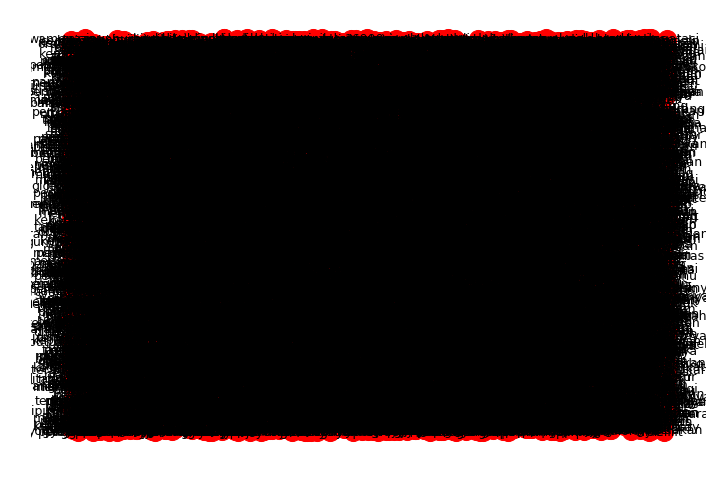

In [11]:
w = 9
h =6
d = 75
plt.figure(figsize=(w, h), dpi=d)

nx.draw_random(G1, with_labels=True)

# nx.draw_spectral(g)
#plt.savefig('graph.png')
#nx.write_gexf(G, "test2.gexf", encoding='utf-8', prettyprint=True, version='1.1draft')
plt.draw()
plt.show()

In [13]:
#jumlah nodes keseluruhan dalam corpus
print(G1.number_of_nodes())
print(G1.number_of_edges())

v = G1.number_of_nodes()  * 0.01
e = G1.number_of_edges() * 0.01

print (v+e)

print(G12.number_of_nodes())
print(G12.number_of_edges())

20118
127453
1475.71
15142
80546


In [13]:
import numpy as np
import scipy.sparse
import scipy.sparse.csgraph

In [14]:
A = nx.adjacency_matrix(G1).tolil()

In [ ]:
D = scipy.sparse.csgraph.floyd_warshall(A, directed=False, unweighted=False)

# Degree Centrality

In [14]:
#degree centrality
degree_1 = dict(G1.degree(G1.nodes()))
degree_2 = dict(G2.degree(G2.nodes()))
degree_3 = dict(G3.degree(G3.nodes()))
degree_4 = dict(G4.degree(G4.nodes()))
degree_5 = dict(G5.degree(G5.nodes()))
degree_6 = dict(G6.degree(G6.nodes()))
degree_7 = dict(G7.degree(G7.nodes()))
degree_8 = dict(G8.degree(G8.nodes()))
degree_9 = dict(G9.degree(G9.nodes()))
degree_10 = dict(G10.degree(G10.nodes()))
degree_11 = dict(G11.degree(G11.nodes()))
degree_12 = dict(G12.degree(G12.nodes()))

print(degree_12)

sorted_degree_1 =sorted(degree_1.items(),
                    key=itemgetter(1),
                    reverse=True)

sorted_degree_2 =sorted(degree_2.items(),
                    key=itemgetter(1),
                    reverse=True)

sorted_degree_3 =sorted(degree_3.items(),
                    key=itemgetter(1),
                    reverse=True)

sorted_degree_4 =sorted(degree_4.items(),
                    key=itemgetter(1),
                    reverse=True)

sorted_degree_5 =sorted(degree_5.items(),
                    key=itemgetter(1),
                    reverse=True)

sorted_degree_6 =sorted(degree_6.items(),
                    key=itemgetter(1),
                    reverse=True)

sorted_degree_7 =sorted(degree_7.items(),
                    key=itemgetter(1),
                    reverse=True)

sorted_degree_8 =sorted(degree_8.items(),
                    key=itemgetter(1),
                    reverse=True)

sorted_degree_9 =sorted(degree_9.items(),
                    key=itemgetter(1),
                    reverse=True)

sorted_degree_10 =sorted(degree_10.items(),
                    key=itemgetter(1),
                    reverse=True)

sorted_degree_11 =sorted(degree_11.items(),
                    key=itemgetter(1),
                    reverse=True)

sorted_degree_12 =sorted(degree_12.items(),
                    key=itemgetter(1),
                    reverse=True)


print(len(sorted_degree_1))
print(len(sorted_degree_12))

{'gudang': 25, 'garam': 13, 'keberatan': 33, 'harga': 145, 'rokok': 32, 'pt': 263, 'keputusan': 192, 'pemerintah': 588, 'menaikkan': 23, 'jual': 18, 'eceran': 2, 'hje': 10, 'berlaku': 69, '1': 82, 'desember': 147, '2001': 244, 'kemarin': 164, 'menteri': 309, 'keuangan': 61, 'kelak': 8, 'berkala': 4, 'memberatkan': 18, 'singkat': 68, 'mengalami': 148, 'kenaikan': 136, 'kali': 174, 'kabag': 7, 'humas': 42, 'mochammad': 2, 'hasyim': 17, 'tempo': 184, 'news': 3, 'room': 139, 'senin': 130, '312': 16, 'kantor': 149, 'pusat': 152, 'kawasan': 143, 'semampir': 2, 'kediri': 12, 'menempatkan': 23, 'cukai': 8, 'sektor': 54, 'berperan': 18, 'penerimaan': 39, 'negara': 346, 'pimpinan': 93, 'perusahaan': 134, 'terbesar': 28, 'indonesia': 571, 'menilai': 135, 'batas': 48, 'wajar': 44, 'kebijakan': 94, 'menyebabkan': 46, 'bergerak': 46, 'daya': 24, 'beli': 14, 'masyarakat': 434, 'khawatir': 35, 'industri': 46, 'berkembang': 22, 'cenderung': 22, 'merosot': 4, 'terang': 18, 'berat': 71, 'jenis': 67, 'sig

In [15]:
#top 10 nodes degree
print("Top 10 nodes by degree in corpus 0101: ")
for d in sorted_degree_1[:10]:
    print(d)
print('\n')

print("Top 10 nodes by degree in corpus 0201:")
for x in sorted_degree_2[:10]:
    print(x)
print('\n')

print("Top 10 nodes by degree in corpus 0301:")
for d in sorted_degree_3[:10]:
    print(d)
print('\n')

print("Top 10 nodes by degree in corpus 0401:")
for d in sorted_degree_4[:10]:
    print(d)
print('\n')

print("Top 10 nodes by degree in corpus 0501:")
for d in sorted_degree_5[:10]:
    print(d)
print('\n')

print("Top 10 nodes by degree in corpus 0601:")
for d in sorted_degree_6[:10]:
    print(d)
print('\n')

print("Top 10 nodes by degree in corpus 0701:")
for d in sorted_degree_7[:10]:
    print(d)
print('\n')

print("Top 10 nodes by degree in corpus 0801:")
for d in sorted_degree_8[:10]:
    print(d)
print('\n')

print("Top 10 nodes by degree in corpus 0901:")
for d in sorted_degree_9[:10]:
    print(d)
print('\n')

print("Top 10 nodes by degree in corpus 1001:")
for d in sorted_degree_10[:10]:
    print(d)
print('\n')

print("Top 10 nodes by degree in corpus 1101:")
for d in sorted_degree_11[:10]:
    print(d)
print('\n')

print("Top 10 nodes by degree in corpus 1201:")
for d in sorted_degree_12[:10]:
    print(d)
print('\n')


Top 10 nodes by degree in corpus 0101: 
('indonesia', 1199)
('pemerintah', 888)
('jakarta', 869)
('presiden', 857)
('orang', 743)
('warga', 688)
('masyarakat', 670)
('dpr', 636)
('polisi', 630)
('ketua', 621)


Top 10 nodes by degree in corpus 0201:
('indonesia', 1179)
('pemerintah', 860)
('masyarakat', 823)
('presiden', 651)
('rp', 646)
('jakarta', 643)
('daerah', 615)
('ketua', 614)
('anggota', 593)
('tim', 588)


Top 10 nodes by degree in corpus 0301:
('presiden', 833)
('indonesia', 826)
('pemerintah', 763)
('jakarta', 565)
('rp', 546)
('orang', 544)
('masyarakat', 521)
('dpr', 487)
('tim', 426)
('aceh', 422)


Top 10 nodes by degree in corpus 0401:
('presiden', 862)
('jakarta', 647)
('indonesia', 626)
('pemerintah', 574)
('orang', 562)
('polisi', 461)
('dpr', 454)
('masyarakat', 416)
('rp', 406)
('daerah', 390)


Top 10 nodes by degree in corpus 0501:
('presiden', 1248)
('indonesia', 762)
('jakarta', 689)
('dpr', 688)
('orang', 628)
('politik', 601)
('pemerintah', 546)
('ketua', 54

# Betweeness Centrality

In [16]:
#betweenness centrality
betweenness_dict1 = nx.betweenness_centrality(G1, k=907)

KeyboardInterrupt: 

In [22]:
betweenness_dict1

{'api': 0.0023689245465345126,
 'bom': 0.012084660005963935,
 'sambut': 2.3418335729010004e-06,
 'milenium': 1.6563150990899983e-05,
 'orang': 0.05097001849403989,
 'tewas': 0.0031171950650673544,
 '130': 8.85220648033908e-06,
 'cedera': 0.0005518369914676044,
 '20': 0.001216209436154556,
 'mengalami': 0.004728806854762151,
 'luka': 0.0006990858957811856,
 'bakar': 0.0001187458622472539,
 'serius': 0.0004442613892259144,
 'kafe': 6.329644704666229e-05,
 'het': 2.4306345299186324e-08,
 'hemeltje': 3.393360731693148e-05,
 'surga': 3.081488475988576e-06,
 'volendam': 0.0001006250493842861,
 'kota': 0.008296351016569392,
 'utara': 0.002886788819915835,
 'belanda': 0.00025887417993282274,
 'dipadati': 4.431138437175577e-06,
 'remaja': 2.153193753620652e-06,
 'merayakan': 0.0001126152957042635,
 'terbakar': 0.0013360987898374224,
 'jam': 0.0041013085430015375,
 'senin': 0.009991519988401263,
 '11': 0.0003903598210086369,
 '0030': 8.597669005209328e-07,
 'cepat': 0.0011248465918908116,
 'mela

In [23]:
sorted_betweenness1 = sorted(betweenness_dict1.items(),
                           key = itemgetter(1),
                           reverse=True)

print("Top 10 nodes by betweenness centrality Data Kompas:")
for s in sorted_betweenness1[:10]:
    print(s)

Top 10 nodes by betweenness centrality Data Kompas:
('presiden', 0.07254544532470746)
('indonesia', 0.06062043965185633)
('orang', 0.05097001849403989)
('pemerintah', 0.035218807780202026)
('masyarakat', 0.03430323712471255)
('jakarta', 0.0327284340299452)
('daerah', 0.029663395630085944)
('negara', 0.025981802576710507)
('dpr', 0.024915783057074235)
('polisi', 0.0228386198598698)


# Closeness Centrality

In [24]:
#closeness centrality
closeness_dict1 = nx.closeness_centrality(G1)

TypeError: closeness_centrality() got an unexpected keyword argument 'k'

In [26]:
def closeness_centrality(G, u=None, distance=None, normalized=True): 
    if distance is not None: 
  
        # use Dijkstra's algorithm with specified attribute as edge weight  
        path_length = functools.partial(nx.single_source_dijkstra_path_length, 
                                        weight=distance) 
    else: 
        path_length = nx.single_source_shortest_path_length 
  
    if u is None: 
        nodes = G1.nodes() 
    else: 
        nodes = [u] 
    closeness_centrality = {} 
    for n in nodes: 
        sp = path_length(G1,n) 
        totsp = sum(sp.values()) 
        if totsp > 0.0 and len(G) > 1: 
            closeness_centrality[n] = (len(sp)-1.0) / totsp 
  
            # normalize to number of nodes-1 in connected part 
            if normalized: 
                s = (len(sp)-1.0) / ( len(G) - 1 ) 
                closeness_centrality[n] *= s 
        else: 
            closeness_centrality[n] = 0.0
    if u is not None: 
        return closeness_centrality[u] 
    else: 
        return closeness_centrality 

In [27]:
G=nx.erdos_renyi_graph(15123,0.6) 
c=nx.closeness_centrality(G) 
print(c) 

KeyboardInterrupt: 